<a href="https://colab.research.google.com/github/Jarvis017/Naive-Bayes-and-KNN-on-Abalone/blob/main/NB_and_KNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [ ]:
from google.colab import drive
import pickle
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
import numpy as np
import matplotlib
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import tensorflow as tf
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import LabelEncoder
from sklearn.naive_bayes import CategoricalNB
from sklearn.metrics import confusion_matrix, classification_report,ConfusionMatrixDisplay
from sklearn.model_selection import KFold
from statistics import mean
from sklearn.neighbors import KNeighborsClassifier
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from sklearn.metrics import recall_score,f1_score


# Preprocessing

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
with open("/content/drive/MyDrive/Intelligent Systems/abalone.data", 'rb') as f:
    data = pd.read_csv(f)

In [ ]:
data

,M,0.455,0.365,0.095,0.514,0.2245,0.101,0.15,15
0,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7
1,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9
2,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10
3,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7
4,I,0.425,0.300,0.095,0.3515,0.1410,0.0775,0.1200,8
...,...,...,...,...,...,...,...,...,...
4171,F,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11
4172,M,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10
4173,M,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9
4174,F,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10


## Set column names

In [ ]:
data.columns = ['Sex','Length','Diameter','Height','Whole_weight',
                'Shucked_weight','Viscera_weight','Shell_weight','Rings']

In [ ]:
data.head()

,Sex,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight,Rings
0,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7
1,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9
2,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10
3,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7
4,I,0.425,0.300,0.095,0.3515,0.1410,0.0775,0.120,8


In [ ]:
data

,Sex,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight,Rings
0,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7
1,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9
2,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10
3,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7
4,I,0.425,0.300,0.095,0.3515,0.1410,0.0775,0.1200,8
...,...,...,...,...,...,...,...,...,...
4171,F,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11
4172,M,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10
4173,M,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9
4174,F,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10


## Transform output for first Mode

In [ ]:
y = LabelEncoder().fit_transform(data['Sex'])
y

array([2, 0, 2, ..., 2, 0, 2])

In [ ]:
data.columns[1:]

Index(['Length', 'Diameter', 'Height', 'Whole_weight', 'Shucked_weight',
       'Viscera_weight', 'Shell_weight', 'Rings'],
      dtype='object')

## Prepare Inputs for first mode

In [ ]:
X = data[data.columns[1:]]
X = X.to_numpy()
X

array([[ 0.35  ,  0.265 ,  0.09  , ...,  0.0485,  0.07  ,  7.    ],
       [ 0.53  ,  0.42  ,  0.135 , ...,  0.1415,  0.21  ,  9.    ],
       [ 0.44  ,  0.365 ,  0.125 , ...,  0.114 ,  0.155 , 10.    ],
       ...,
       [ 0.6   ,  0.475 ,  0.205 , ...,  0.2875,  0.308 ,  9.    ],
       [ 0.625 ,  0.485 ,  0.15  , ...,  0.261 ,  0.296 , 10.    ],
       [ 0.71  ,  0.555 ,  0.195 , ...,  0.3765,  0.495 , 12.    ]])

In [ ]:
dir(X)

['T',
 '__abs__',
 '__add__',
 '__and__',
 '__array__',
 '__array_finalize__',
 '__array_function__',
 '__array_interface__',
 '__array_prepare__',
 '__array_priority__',
 '__array_struct__',
 '__array_ufunc__',
 '__array_wrap__',
 '__bool__',
 '__class__',
 '__class_getitem__',
 '__complex__',
 '__contains__',
 '__copy__',
 '__deepcopy__',
 '__delattr__',
 '__delitem__',
 '__dir__',
 '__divmod__',
 '__dlpack__',
 '__dlpack_device__',
 '__doc__',
 '__eq__',
 '__float__',
 '__floordiv__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__iadd__',
 '__iand__',
 '__ifloordiv__',
 '__ilshift__',
 '__imatmul__',
 '__imod__',
 '__imul__',
 '__index__',
 '__init__',
 '__init_subclass__',
 '__int__',
 '__invert__',
 '__ior__',
 '__ipow__',
 '__irshift__',
 '__isub__',
 '__iter__',
 '__itruediv__',
 '__ixor__',
 '__le__',
 '__len__',
 '__lshift__',
 '__lt__',
 '__matmul__',
 '__mod__',
 '__mul__',
 '__ne__',
 '__neg__',
 '__new__',
 '__or__',
 '__pos__',

## Transform output for second mode

In [ ]:
y2 = LabelEncoder().fit_transform(data['Rings'])
y2

array([ 6,  8,  9, ...,  8,  9, 11])

In [ ]:
len(y2)

4176

In [ ]:
unique, counts = np.unique(y2, return_counts=True)
z = dict(zip(unique, counts))

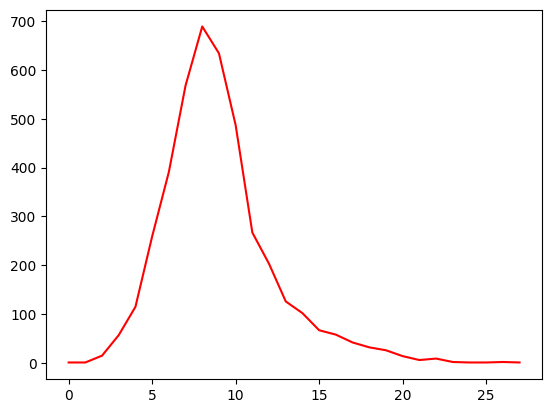

In [ ]:
plt.plot(z.keys(),z.values(), color = 'r')

## Prepare Inputs for second mode

In [ ]:
X2 = data[data.columns[:8]]
X2["Sex"] = LabelEncoder().fit_transform(X2['Sex'])
X2 = X2.to_numpy()
X2

<ipython-input-16-93e916d6ba4a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X2["Sex"] = LabelEncoder().fit_transform(X2['Sex'])


array([[2.    , 0.35  , 0.265 , ..., 0.0995, 0.0485, 0.07  ],
       [0.    , 0.53  , 0.42  , ..., 0.2565, 0.1415, 0.21  ],
       [2.    , 0.44  , 0.365 , ..., 0.2155, 0.114 , 0.155 ],
       ...,
       [2.    , 0.6   , 0.475 , ..., 0.5255, 0.2875, 0.308 ],
       [0.    , 0.625 , 0.485 , ..., 0.531 , 0.261 , 0.296 ],
       [2.    , 0.71  , 0.555 , ..., 0.9455, 0.3765, 0.495 ]])

In [ ]:
rus = RandomOverSampler(random_state=42)# fit predictor and target variable
X2, y2 = rus.fit_resample(X2, y2)
len(y2)

19292

In [ ]:
rus = RandomUnderSampler(random_state=42, replacement=True)# fit predictor and target variable
xt2, yt2 = rus.fit_resample(X2, y2)

In [ ]:
rus = RandomOverSampler(random_state=42)
xt2, yt2 = rus.fit_resample(X2, y2)
len(yt2)

19292

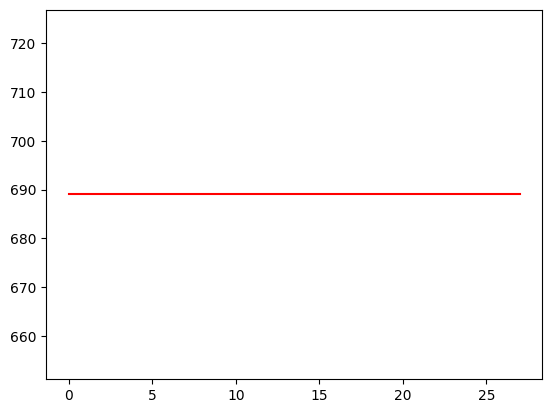

In [ ]:
unique, counts = np.unique(yt2, return_counts=True)
z = dict(zip(unique, counts))
plt.plot(z.keys(),z.values(), color = 'r')

## Report

In [ ]:
def Report(model,X, y, type = 'Train', confidence_matrix = False):
  print(type)
  y_predicteds = model.predict(X)
  print(classification_report(y,y_predicteds))
  accuracy = model.score(X,y)
  print("accuracy:",round(accuracy,2))
  print()
  if confidence_matrix:
    matrix = confusion_matrix(y,y_predicteds)
    fig = plt.figure(figsize = (20,18))
    ax = fig.gca()
    display = ConfusionMatrixDisplay(matrix)
    fig = plt.figure(figsize = (20,18))
    display.plot(ax = ax)
    plt.show()
  return accuracy

## Combinator

In [ ]:
def Run(model_type,X,y,n = 0):
  """
  Run the determined model
  """

  kf = KFold(n_splits=10, shuffle=True)
  Accuracies = []
  for i, (train_index, test_index) in enumerate(kf.split(X)):
    print(f"Fold {i+1}\n")
    if n:
      model = model_type(X[train_index],y[train_index],n)
    else:
      model = model_type(X[train_index],y[train_index])
    accuracy_train = Report(model,X[train_index],y[train_index])
    accuracy_test =  Report(model,X[test_index],y[test_index],'Test')
    Accuracies.append(accuracy_test)
    print('-------------------------------')

  print("Average of Acuuracies",round(mean(Accuracies),2))
  return round(mean(Accuracies),2)

## Combinator2

In [ ]:
def Run2(model_type,X,y,n = 0,alpha = 5):
  """
  Run the determined model
  """

  kf = KFold(n_splits=10, shuffle=True)
  Accuracies = []
  for i, (train_index, test_index) in enumerate(kf.split(X)):
    print(f"Fold {i+1}\n")
    if n:
      model = model_type(X[train_index],y[train_index],n)
    else:
      model = model_type(X[train_index],y[train_index],alpha)
    accuracy_train = Report(model,X[train_index],y[train_index], confidence_matrix = True)
    accuracy_test =  Report(model,X[test_index],y[test_index],'Test', confidence_matrix = True)
    Accuracies.append(accuracy_test)
    print('-------------------------------')

  print("Average of Acuuracies",round(mean(Accuracies),2))
  return round(mean(Accuracies),2)

In [ ]:
def Run3(model_type,X,y,n = 0,alpha = 5):
  """
  Run the determined model
  """

  kf = KFold(n_splits=10, shuffle=True)
  recall = []
  for i, (train_index, test_index) in enumerate(kf.split(X)):
    print(f"Fold {i+1}\n")
    if n:
      model = model_type(X[train_index],y[train_index],n)
    else:
      model = model_type(X[train_index],y[train_index],alpha)
    recall_test = recall_score(y[train_index],model.predict(X[train_index]),  average='weighted')
    recall.append(recall_test)
    print('-------------------------------')
    print(recall_test)

  return round(mean(recall),2)

In [ ]:
def Run4(model_type,X,y,n = 0,alpha = 5):
  """
  Run the determined model
  """

  kf = KFold(n_splits=10, shuffle=True)
  result = []
  for i, (train_index, test_index) in enumerate(kf.split(X)):
    print(f"Fold {i+1}\n")
    if n:
      model = model_type(X[train_index],y[train_index],n)
    else:
      model = model_type(X[train_index],y[train_index],alpha)
    test = f1_score(y[train_index],model.predict(X[train_index]),  average='weighted')
    result.append(test)
    print('-------------------------------')
    print(test)

  return round(mean(result),2)

# First mode Models

## Naive Bayes

In [ ]:
def NB(X,y):
  model = CategoricalNB(min_categories = 30)
  model.fit(X, y)
  return model

### Run

In [ ]:
Run(NB,X,y)

Fold 1

Train
              precision    recall  f1-score   support

           0       0.50      0.26      0.34      1176
           1       0.62      0.81      0.70      1208
           2       0.47      0.53      0.50      1374

    accuracy                           0.54      3758
   macro avg       0.53      0.53      0.51      3758
weighted avg       0.53      0.54      0.51      3758

accuracy: 0.54

Test
              precision    recall  f1-score   support

           0       0.46      0.21      0.28       131
           1       0.58      0.78      0.66       134
           2       0.44      0.51      0.47       153

    accuracy                           0.50       418
   macro avg       0.49      0.50      0.47       418
weighted avg       0.49      0.50      0.48       418

accuracy: 0.5

-------------------------------
Fold 2

Train
              precision    recall  f1-score   support

           0       0.52      0.17      0.25      1176
           1       0.61      0.82

0.52

## K-Nearest Neighbors

In [ ]:
def KNN(X,y,n):
  model = KNeighborsClassifier(n)
  model.fit(X, y)
  return model

###Run

In [ ]:
Run(KNN,X,y,n = 10)

Fold 1

Train
              precision    recall  f1-score   support

           0       0.56      0.60      0.58      1177
           1       0.74      0.79      0.76      1205
           2       0.60      0.53      0.57      1376

    accuracy                           0.64      3758
   macro avg       0.63      0.64      0.64      3758
weighted avg       0.63      0.64      0.63      3758

accuracy: 0.64

Test
              precision    recall  f1-score   support

           0       0.38      0.41      0.39       130
           1       0.71      0.72      0.71       137
           2       0.42      0.39      0.40       151

    accuracy                           0.50       418
   macro avg       0.50      0.50      0.50       418
weighted avg       0.50      0.50      0.50       418

accuracy: 0.5

-------------------------------
Fold 2

Train
              precision    recall  f1-score   support

           0       0.55      0.61      0.58      1197
           1       0.74      0.79

0.53

In [ ]:
resualts = []
for i in range(1,30):
  resualts.append((Run(KNN,X,y,n = i),i))

Streaming output truncated to the last 5000 lines.
           1       0.72      0.79      0.76      1210
           2       0.57      0.50      0.53      1384

    accuracy                           0.61      3759
   macro avg       0.60      0.61      0.61      3759
weighted avg       0.60      0.61      0.60      3759

accuracy: 0.61

Test
              precision    recall  f1-score   support

           0       0.50      0.46      0.48       142
           1       0.75      0.82      0.78       132
           2       0.49      0.50      0.49       143

    accuracy                           0.59       417
   macro avg       0.58      0.59      0.59       417
weighted avg       0.58      0.59      0.58       417

accuracy: 0.59

-------------------------------
Fold 10

Train
              precision    recall  f1-score   support

           0       0.53      0.59      0.56      1178
           1       0.74      0.77      0.76      1203
           2       0.57      0.50      0.53      

In [ ]:
def Plotting(resualts):
  """
  Plot the Accuracies
  """

  accuracy = [resualts[i][0] for i in range(len(resualts))]
  k = [resualts[i][1] for i in range(len(resualts))]
  plt.plot(k,accuracy,'g',label='Accuracy')
  #plt.plot(depth,test,'b',label='Test Accuracy')
  plt.title('KNN')
  plt.xlabel('k')
  plt.ylabel('Accuracy')
  plt.legend()
  plt.show()

In [ ]:
def Plotting2(resualts):
  """
  Plot the Accuracies
  """

  recall = [resualts[i][0] for i in range(len(resualts))]
  k = [resualts[i][1] for i in range(len(resualts))]
  plt.plot(k,recall,'g',label='recall')
  #plt.plot(depth,test,'b',label='Test recall')
  plt.title('KNN')
  plt.xlabel('k')
  plt.ylabel('recall')
  plt.legend()
  plt.show()

In [ ]:
def Plotting3(resualts):
  """
  Plot the Accuracies
  """

  f1 = [resualts[i][0] for i in range(len(resualts))]
  k = [resualts[i][1] for i in range(len(resualts))]
  plt.plot(k,f1,'g',label='f1')
  #plt.plot(depth,test,'b',label='Test recall')
  plt.title('KNN')
  plt.xlabel('k')
  plt.ylabel('f1')
  plt.legend()
  plt.show()

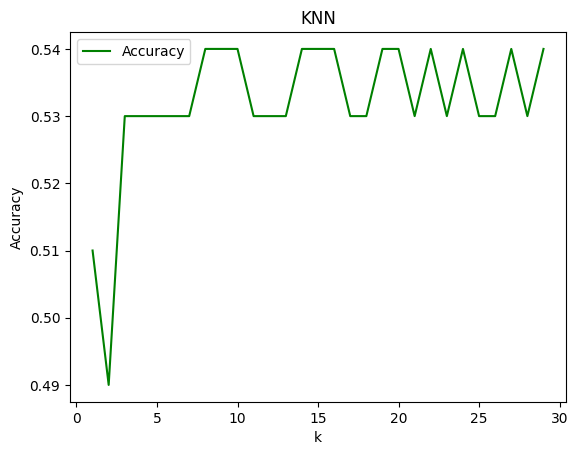

In [ ]:
Plotting(resualts)

k = 8

# Second mode Models

## Naive Bayes

In [ ]:
def NB2(X,y,alpha):
  model = CategoricalNB(min_categories = 30,alpha = alpha)
  model.fit(X, y)
  return model

### Run

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=10.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no pr

Fold 1

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        51
           4       0.00      0.00      0.00       104
           5       0.00      0.00      0.00       233
           6       0.00      0.00      0.00       351
           7       0.21      0.48      0.30       511
           8       0.20      0.42      0.27       621
           9       0.22      0.49      0.31       570
          10       0.32      0.03      0.05       439
          11       0.00      0.00      0.00       240
          12       0.00      0.00      0.00       183
          13       0.00      0.00      0.00       113
          14       0.00      0.00      0.00        92
          15       0.00      0.00      0.00        60
          16       0.00      0.00      0.00        52
          17       0.00      0.00      0.00        37
          18 

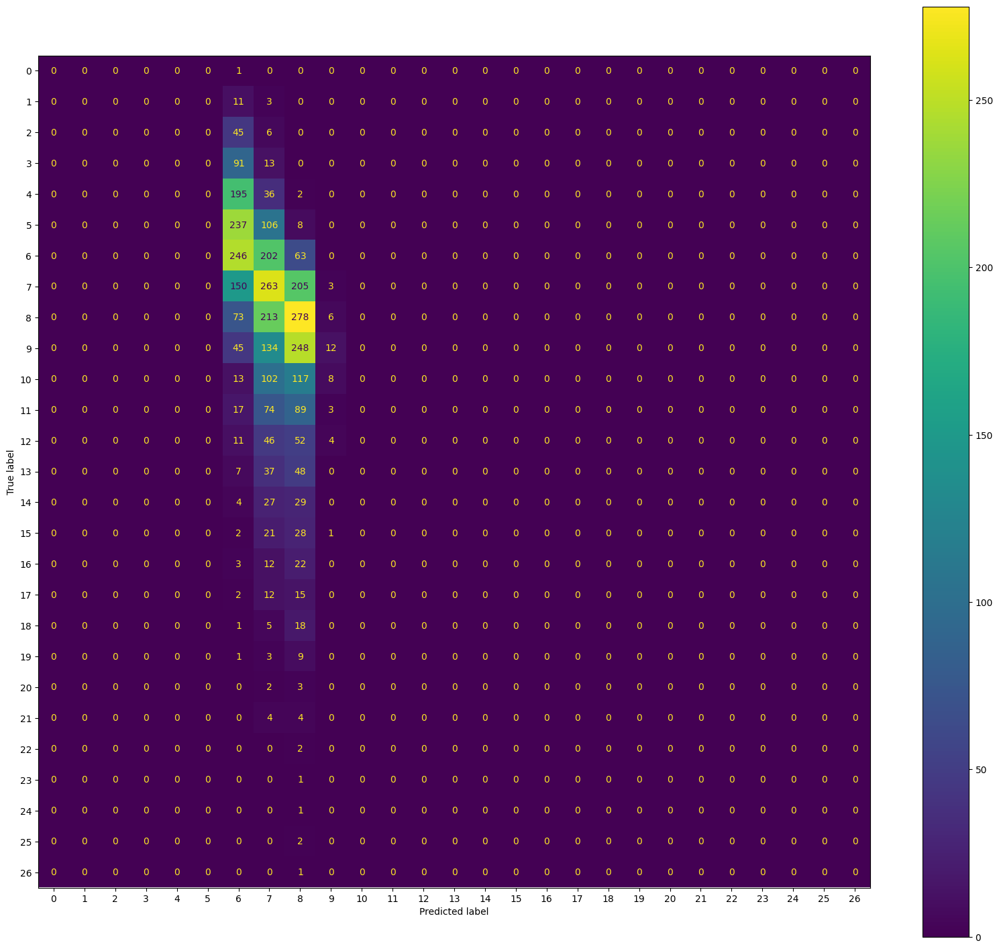

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00        11
           5       0.00      0.00      0.00        26
           6       0.00      0.00      0.00        40
           7       0.20      0.47      0.28        57
           8       0.19      0.40      0.26        68
           9       0.23      0.50      0.32        64
          10       0.00      0.00      0.00        48
          11       0.00      0.00      0.00        27
          12       0.00      0.00      0.00        20
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00        10
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         5
          18       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


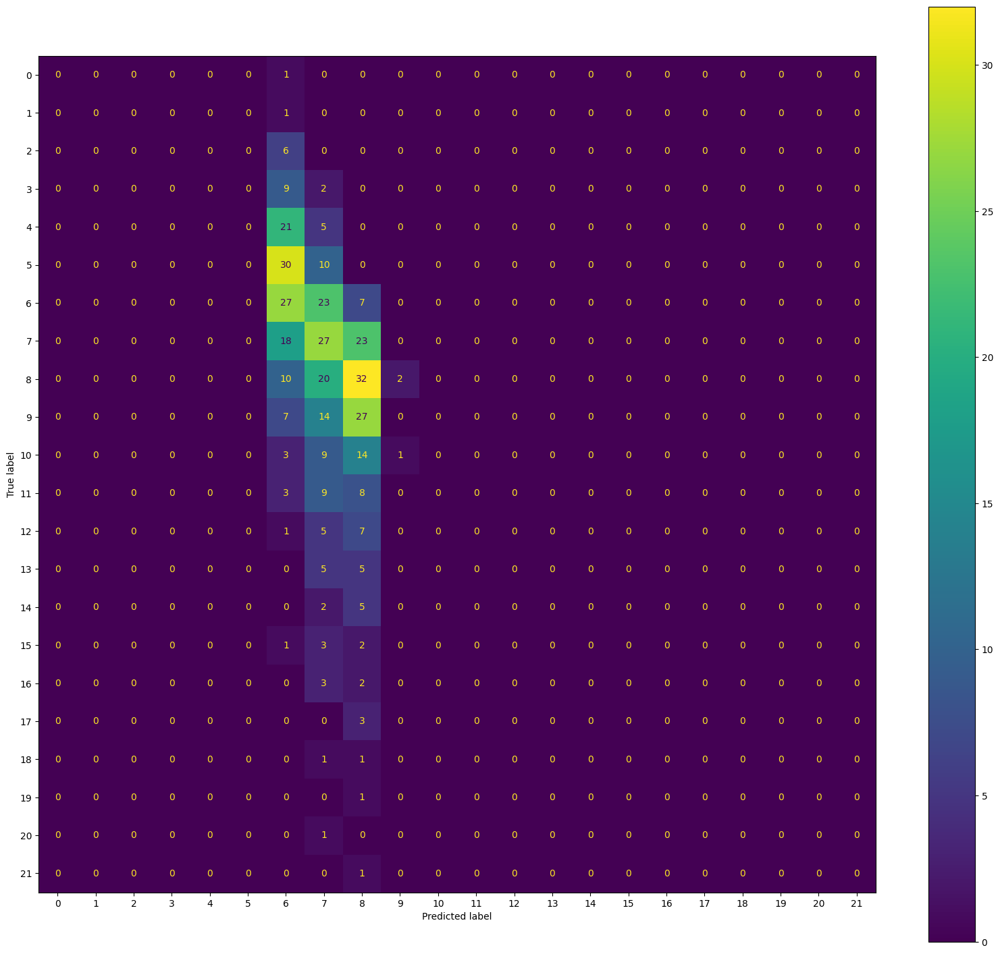

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 2

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        51
           4       0.00      0.00      0.00       104
           5       0.00      0.00      0.00       233
           6       0.00      0.00      0.00       352
           7       0.21      0.48      0.29       511
           8       0.20      0.42      0.27       620
           9       0.22      0.49      0.31       570
          10       0.00      0.00      0.00       439
          11       0.00      0.00      0.00       240
          12       0.00      0.00      0.00       182
          13       0.00      0.00      0.00       113
          14       0.00      0.00      0.00        92
          15       0.00      0.00      0.00        60
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


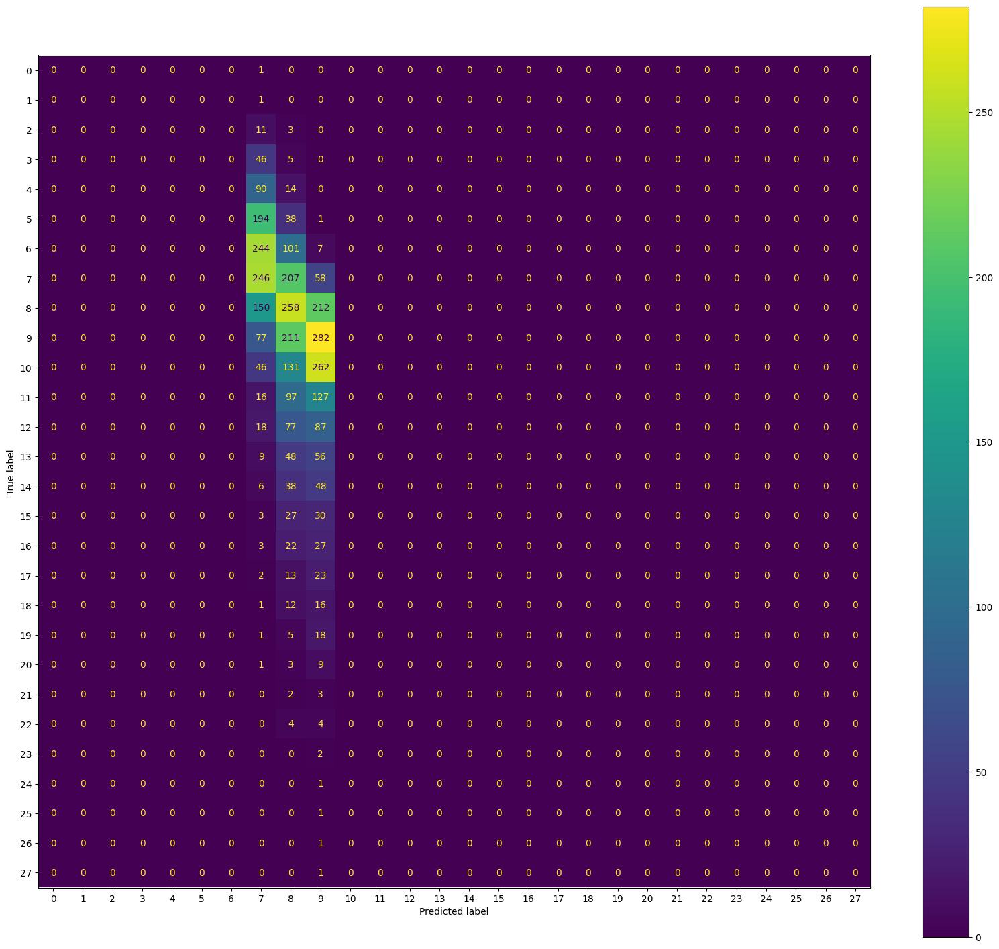

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00        11
           5       0.00      0.00      0.00        26
           6       0.00      0.00      0.00        39
           7       0.21      0.47      0.29        57
           8       0.22      0.46      0.30        69
           9       0.24      0.56      0.34        64
          10       0.00      0.00      0.00        48
          11       0.00      0.00      0.00        27
          12       0.00      0.00      0.00        21
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00        10
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         3
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


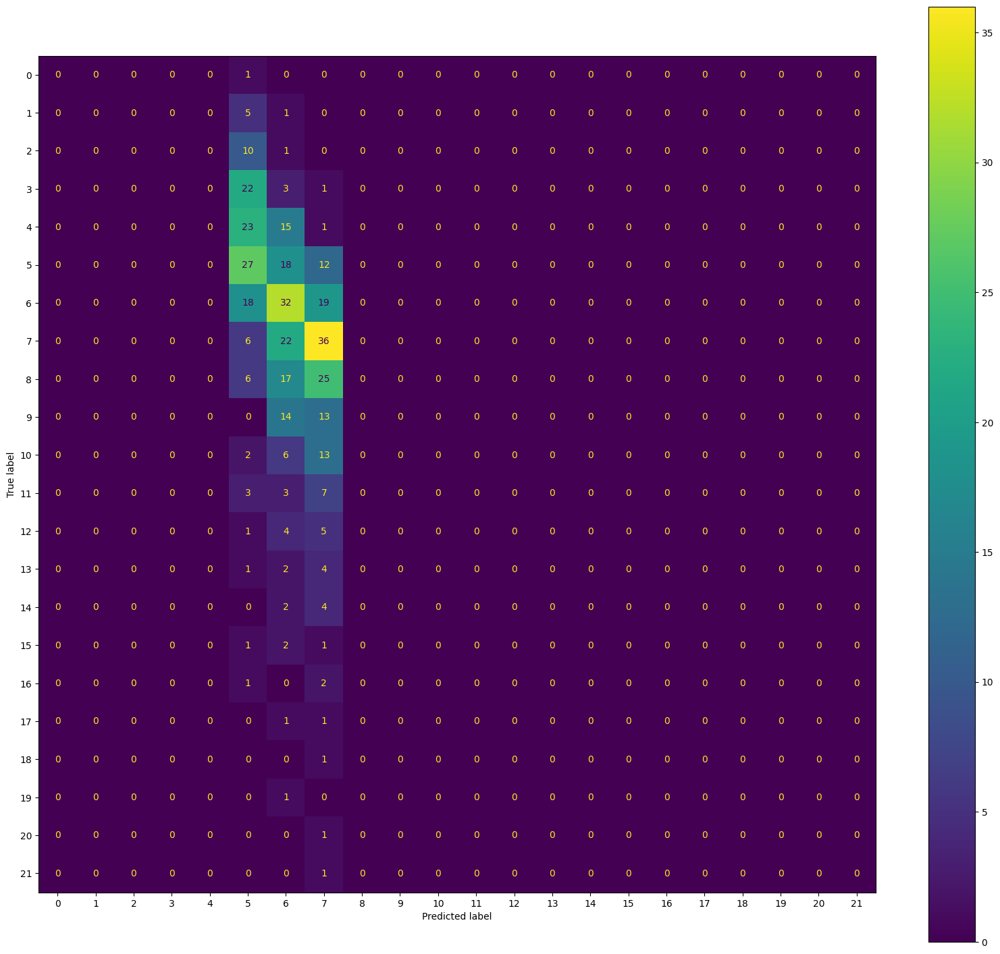

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 3

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        51
           4       0.00      0.00      0.00       104
           5       0.00      0.00      0.00       233
           6       0.00      0.00      0.00       352
           7       0.22      0.49      0.30       512
           8       0.20      0.42      0.27       620
           9       0.23      0.51      0.31       570
          10       0.00      0.00      0.00       439
          11       0.00      0.00      0.00       240
          12       0.00      0.00      0.00       182
          13       0.00      0.00      0.00       113
          14       0.00      0.00      0.00        92
          15       0.00      0.00      0.00        60
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


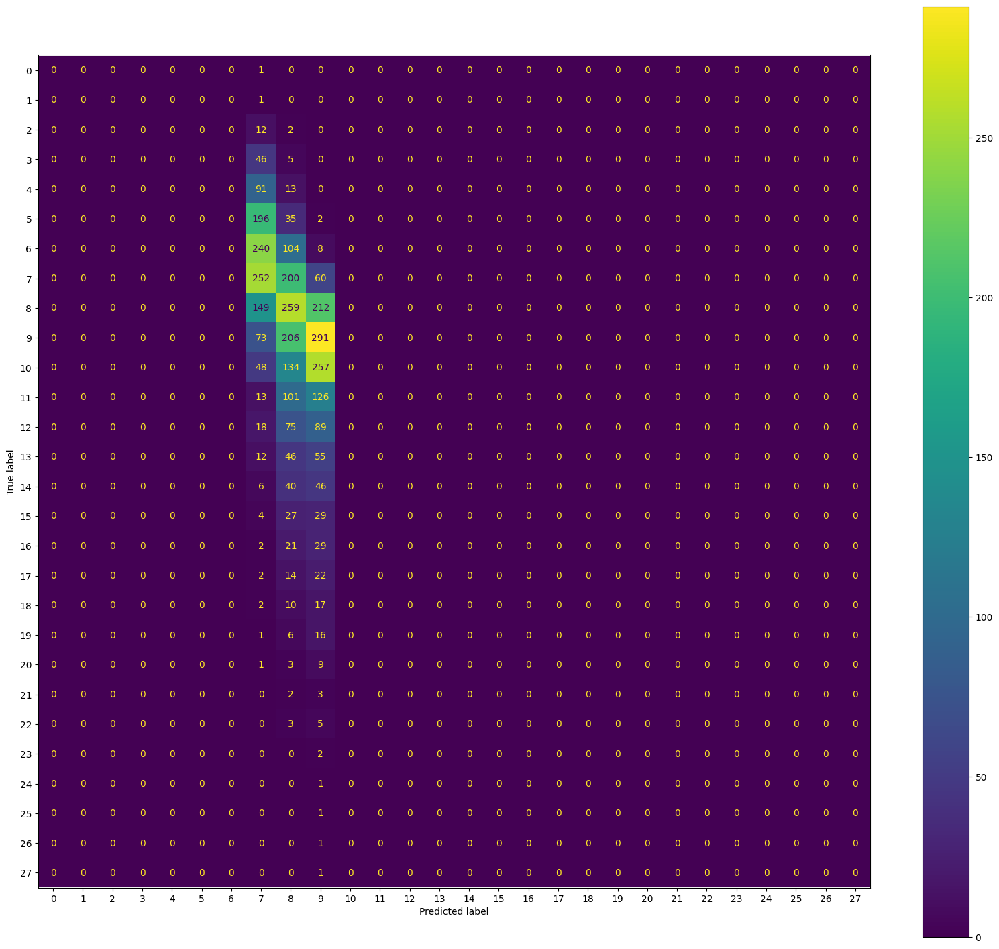

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00        11
           5       0.00      0.00      0.00        26
           6       0.00      0.00      0.00        39
           7       0.17      0.38      0.23        56
           8       0.20      0.45      0.28        69
           9       0.19      0.42      0.26        64
          10       0.00      0.00      0.00        48
          11       0.00      0.00      0.00        27
          12       0.00      0.00      0.00        21
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00        10
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         3
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


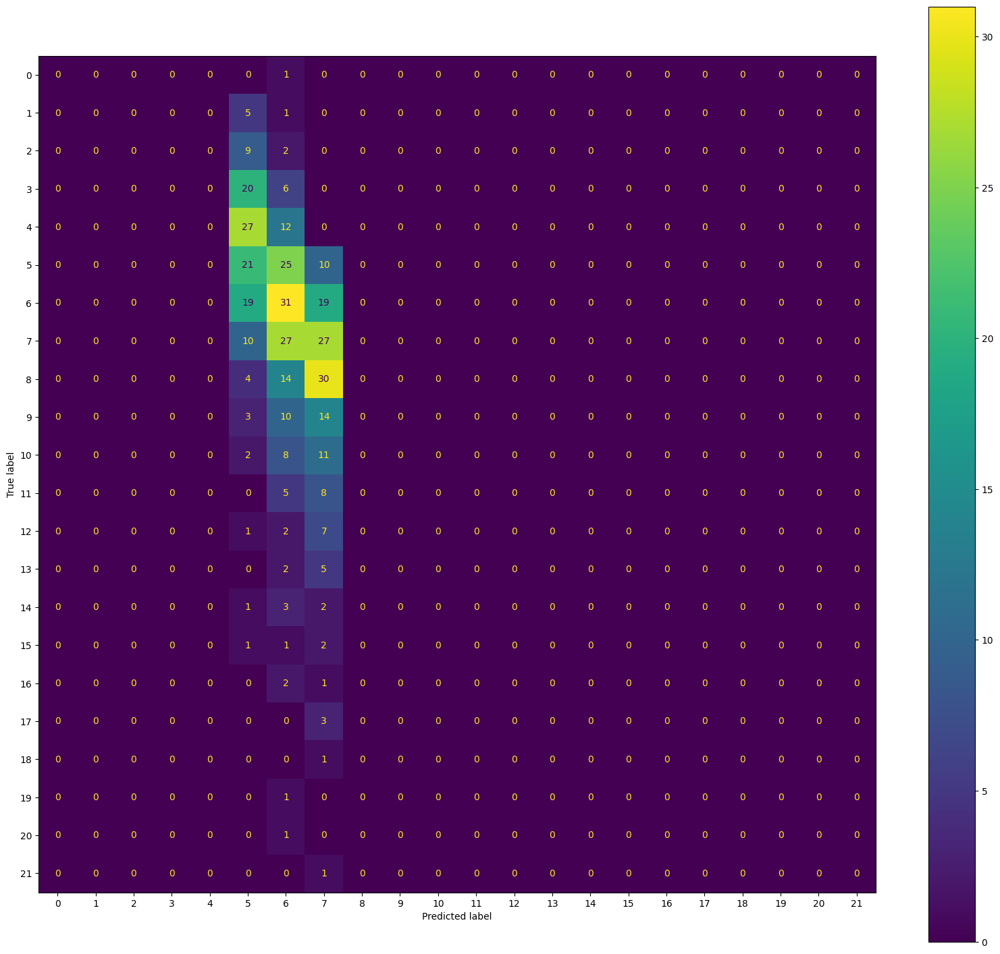

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 4

Train
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        51
           4       0.00      0.00      0.00       104
           5       0.00      0.00      0.00       233
           6       0.00      0.00      0.00       352
           7       0.21      0.49      0.30       512
           8       0.20      0.41      0.26       620
           9       0.22      0.49      0.30       570
          10       0.00      0.00      0.00       438
          11       0.00      0.00      0.00       240
          12       0.00      0.00      0.00       182
          13       0.00      0.00      0.00       114
          14       0.00      0.00      0.00        92
          15       0.00      0.00      0.00        60
          16       0.00      0.00      0.00        52
          17       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


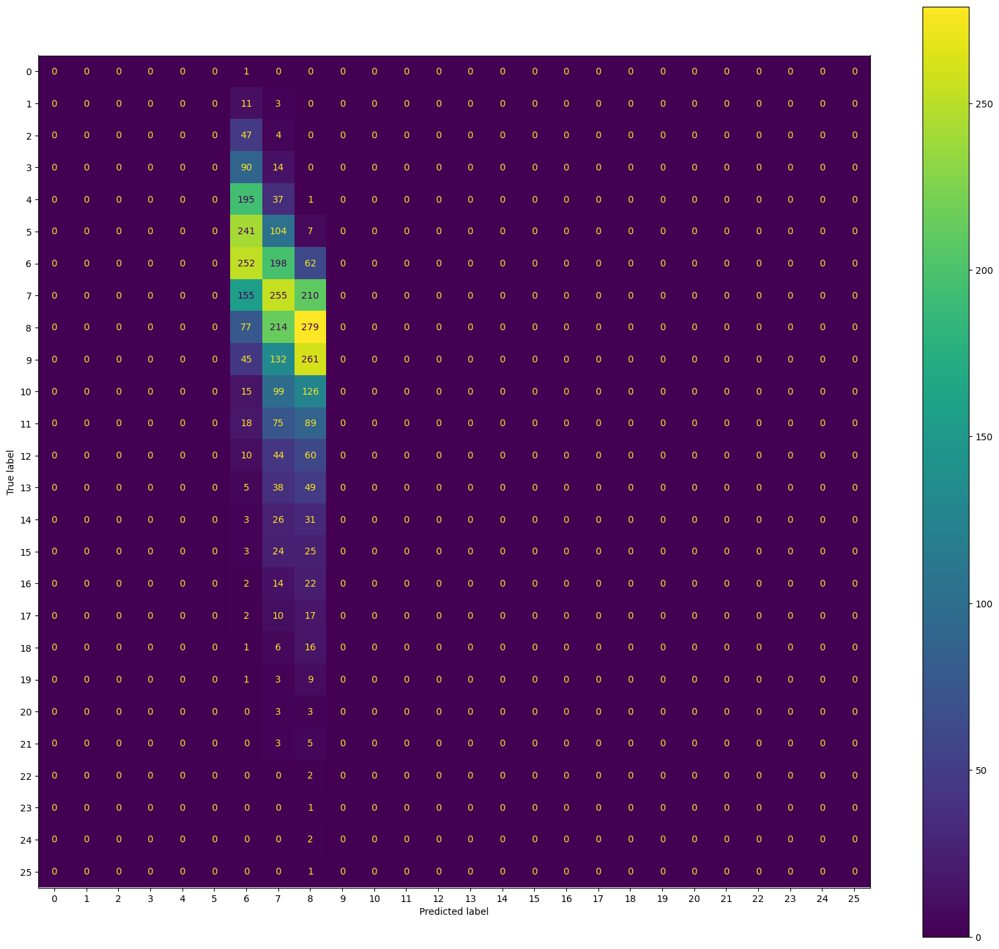

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00        11
           5       0.00      0.00      0.00        26
           6       0.00      0.00      0.00        39
           7       0.18      0.38      0.24        56
           8       0.23      0.51      0.31        69
           9       0.27      0.61      0.37        64
          10       0.00      0.00      0.00        49
          11       0.00      0.00      0.00        27
          12       0.00      0.00      0.00        21
          13       0.00      0.00      0.00        12
          14       0.00      0.00      0.00        10
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         4
          18       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


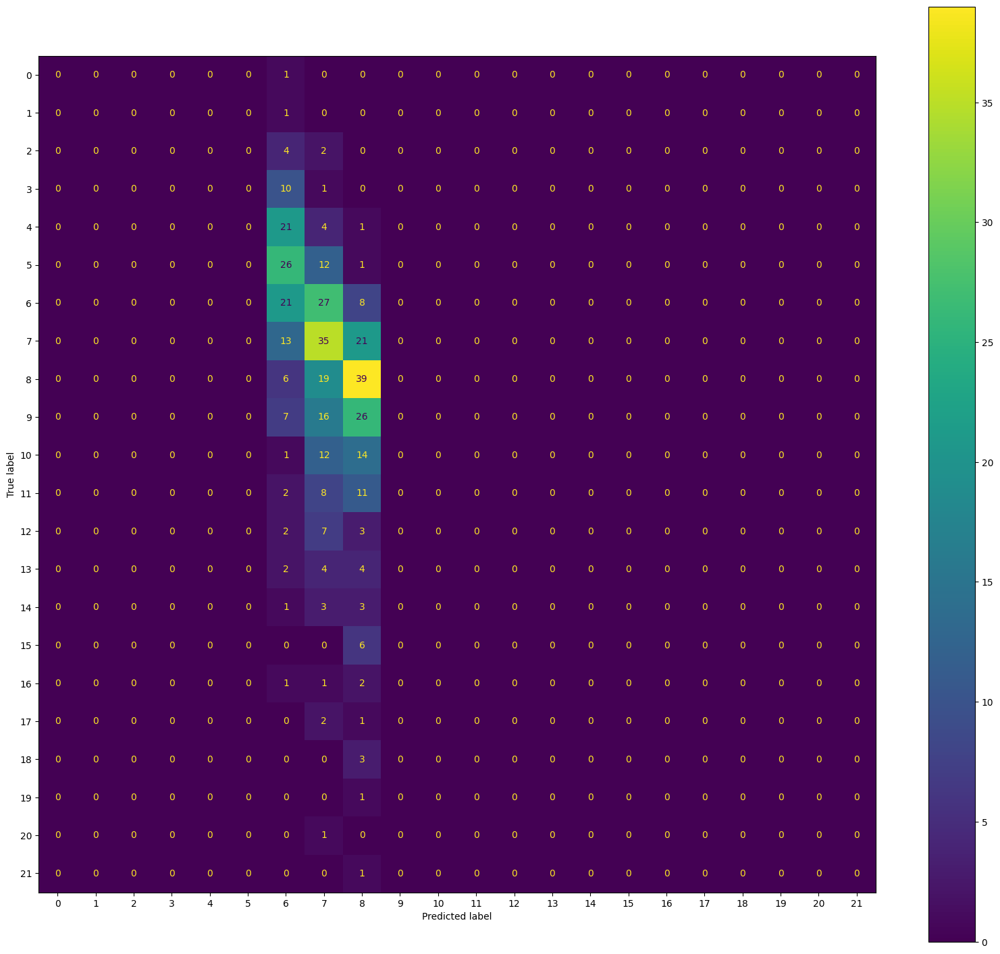

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 5

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.00      0.00      0.00        51
           4       0.00      0.00      0.00       103
           5       0.00      0.00      0.00       233
           6       0.00      0.00      0.00       352
           7       0.21      0.47      0.29       511
           8       0.20      0.43      0.27       620
           9       0.22      0.49      0.31       571
          10       0.00      0.00      0.00       438
          11       0.00      0.00      0.00       240
          12       0.00      0.00      0.00       183
          13       0.00      0.00      0.00       114
          14       0.00      0.00      0.00        92
          15       0.00      0.00      0.00        60
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


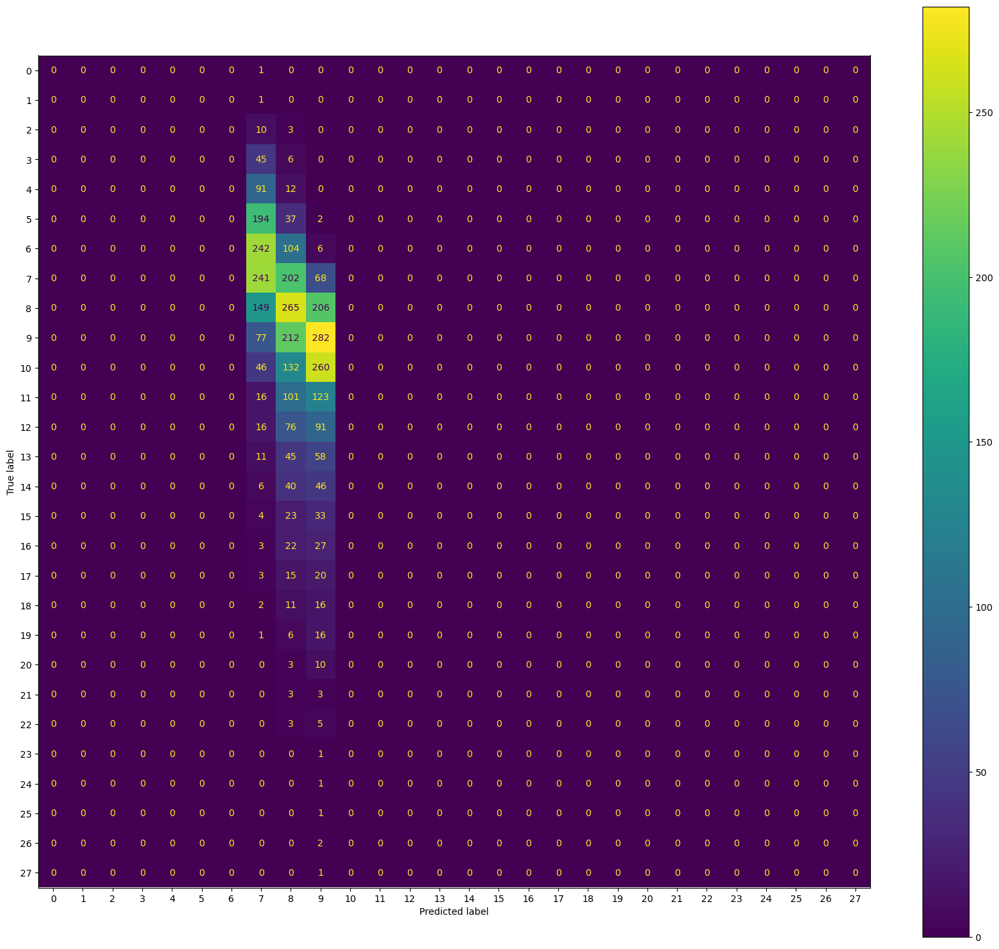

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00        12
           5       0.00      0.00      0.00        26
           6       0.00      0.00      0.00        39
           7       0.24      0.56      0.34        57
           8       0.18      0.36      0.24        69
           9       0.25      0.57      0.35        63
          10       0.00      0.00      0.00        49
          11       0.00      0.00      0.00        27
          12       0.00      0.00      0.00        20
          13       0.00      0.00      0.00        12
          14       0.00      0.00      0.00        10
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         3
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


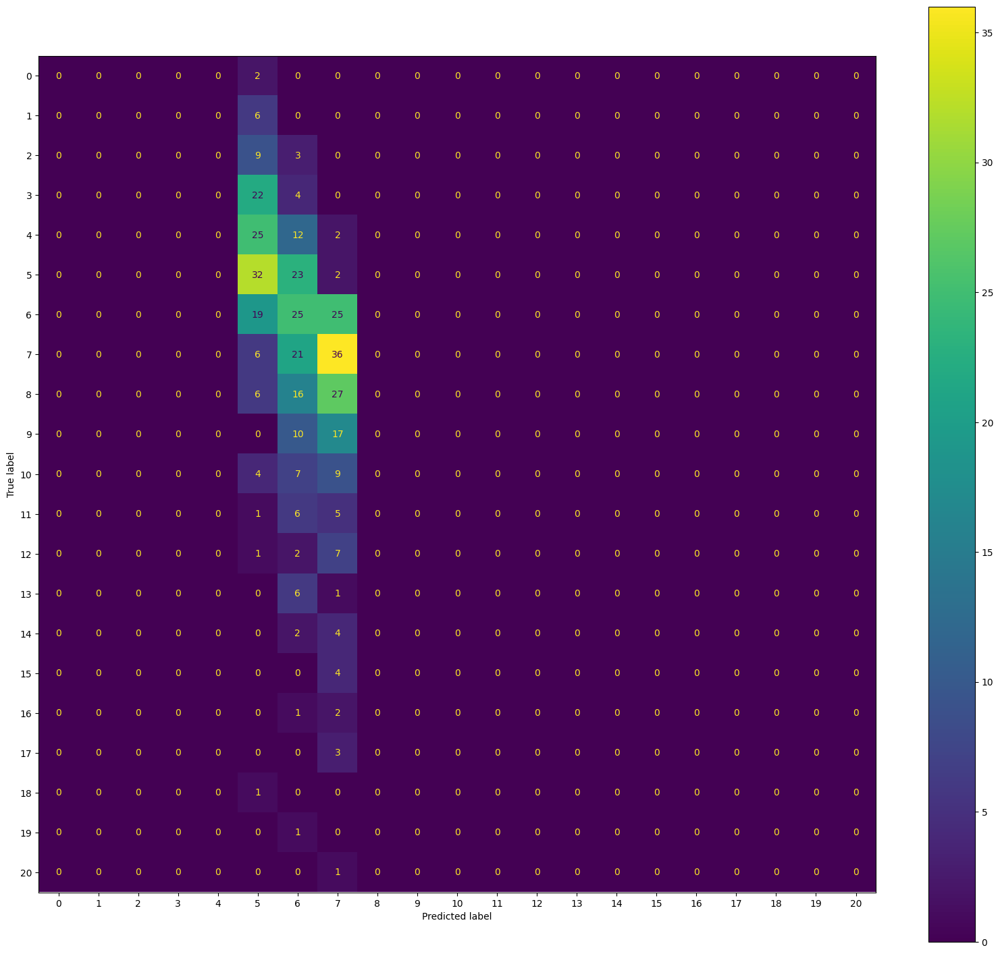

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 6

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.00      0.00      0.00        51
           4       0.00      0.00      0.00       103
           5       0.00      0.00      0.00       234
           6       0.00      0.00      0.00       352
           7       0.21      0.48      0.29       511
           8       0.20      0.43      0.28       620
           9       0.22      0.50      0.31       571
          10       0.00      0.00      0.00       438
          11       0.00      0.00      0.00       240
          12       0.00      0.00      0.00       183
          13       0.00      0.00      0.00       114
          14       0.00      0.00      0.00        92
          15       0.00      0.00      0.00        61
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


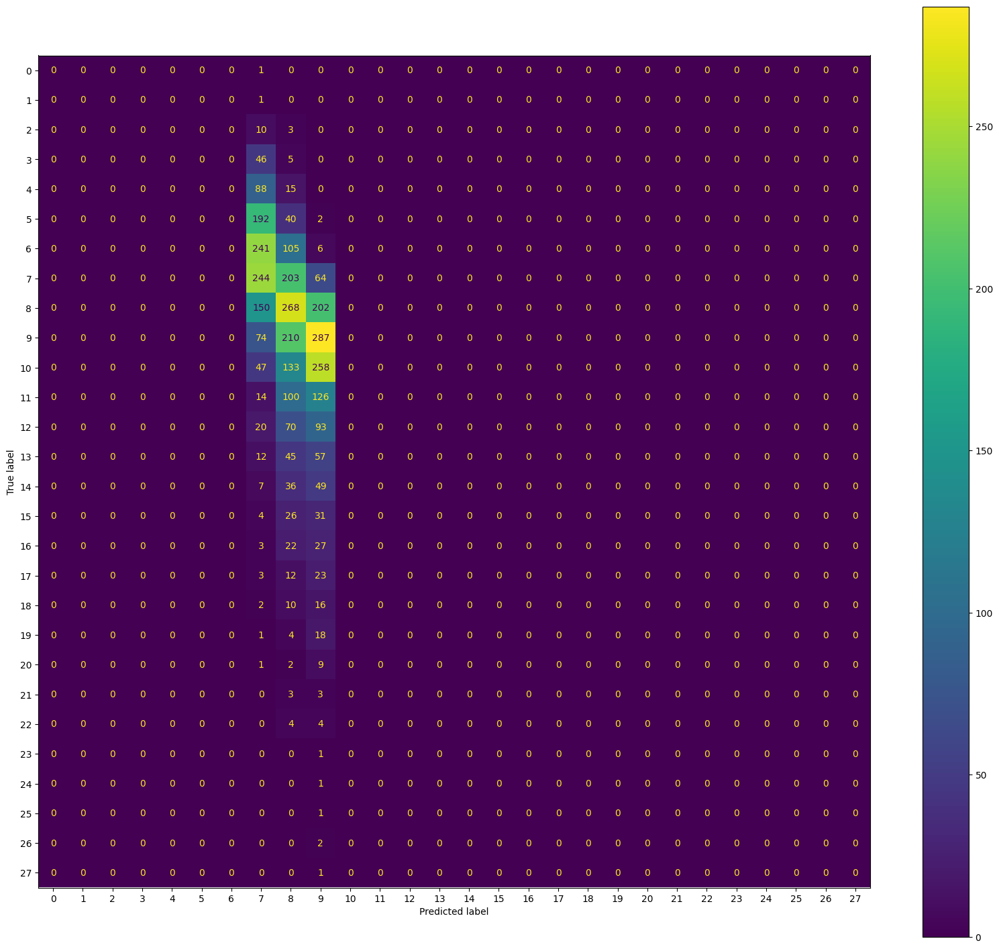

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00        12
           5       0.00      0.00      0.00        25
           6       0.00      0.00      0.00        39
           7       0.22      0.51      0.31        57
           8       0.15      0.32      0.21        69
           9       0.22      0.49      0.30        63
          10       0.00      0.00      0.00        49
          11       0.00      0.00      0.00        27
          12       0.00      0.00      0.00        20
          13       0.00      0.00      0.00        12
          14       0.00      0.00      0.00        10
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         4
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


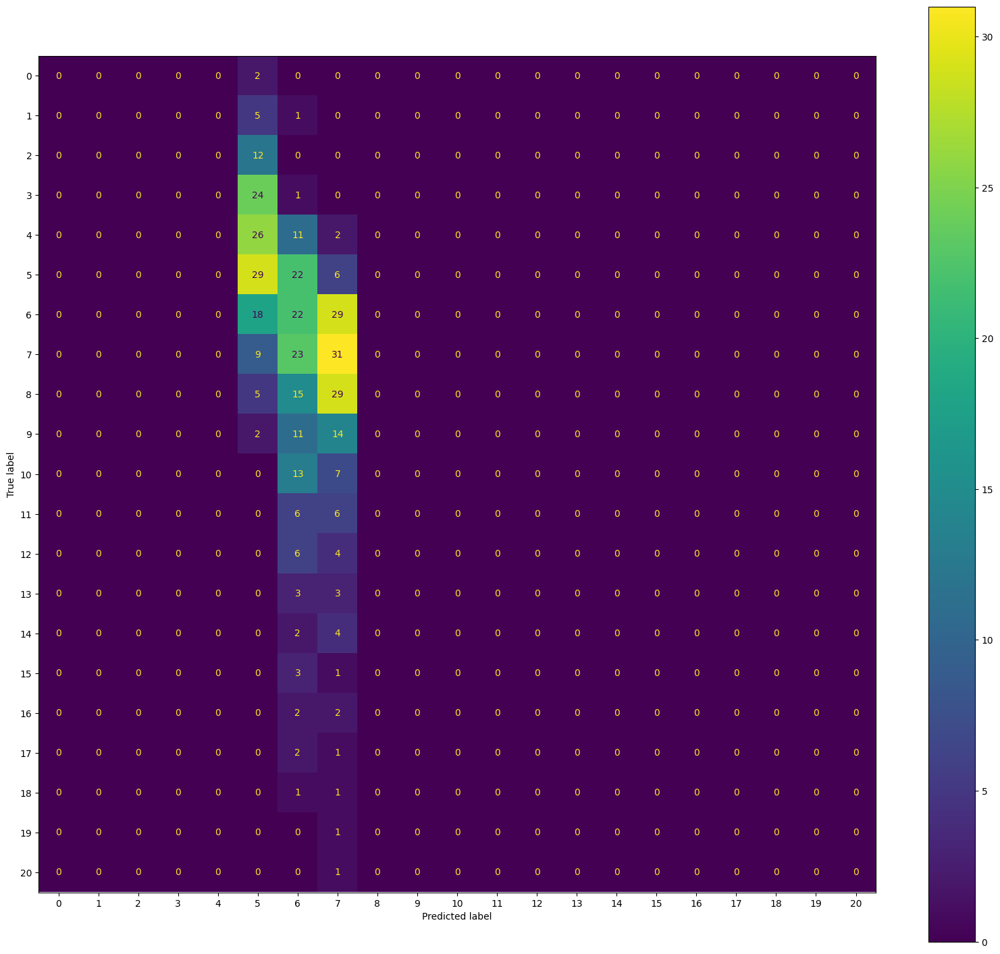

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 7

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.00      0.00      0.00        52
           4       0.00      0.00      0.00       103
           5       0.00      0.00      0.00       233
           6       0.00      0.00      0.00       352
           7       0.21      0.48      0.29       511
           8       0.20      0.43      0.27       620
           9       0.22      0.49      0.31       571
          10       0.00      0.00      0.00       438
          11       0.00      0.00      0.00       240
          12       0.00      0.00      0.00       183
          13       0.00      0.00      0.00       114
          14       0.00      0.00      0.00        92
          15       0.00      0.00      0.00        61
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


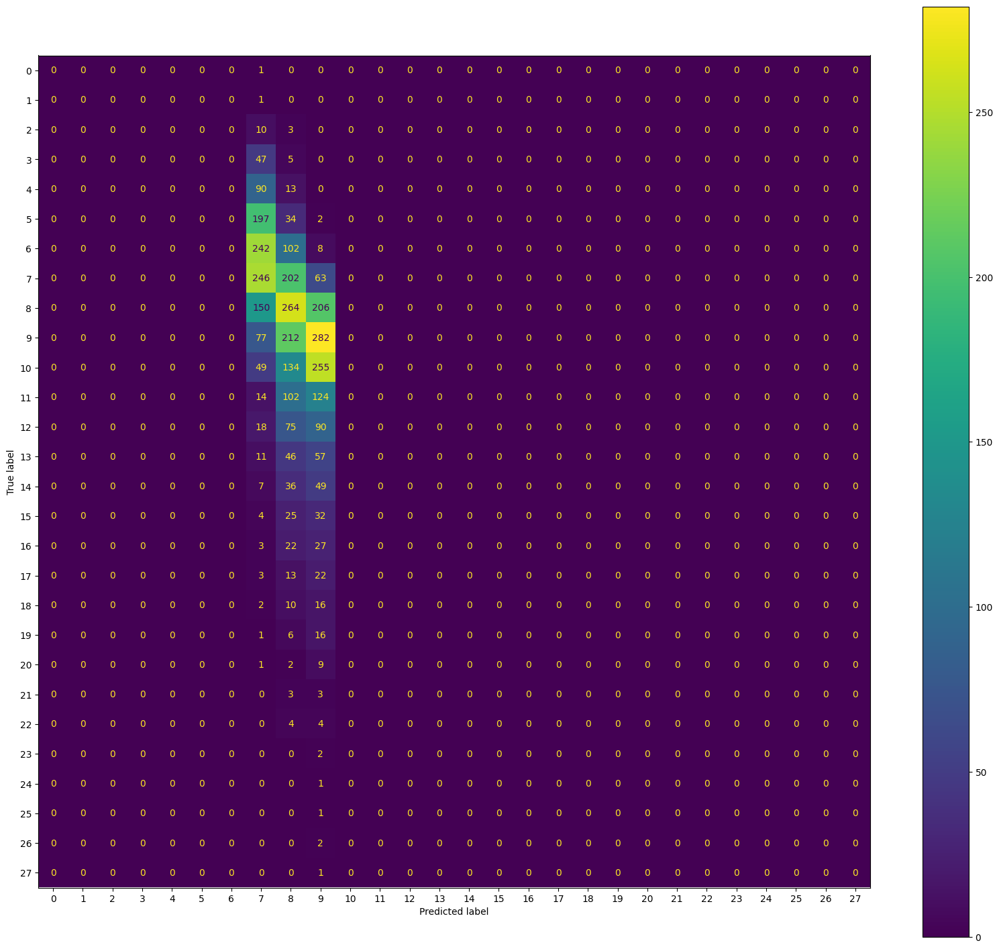

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00        12
           5       0.00      0.00      0.00        26
           6       0.00      0.00      0.00        39
           7       0.23      0.47      0.31        57
           8       0.18      0.38      0.24        69
           9       0.24      0.57      0.34        63
          10       0.00      0.00      0.00        49
          11       0.00      0.00      0.00        27
          12       0.00      0.00      0.00        20
          13       0.00      0.00      0.00        12
          14       0.00      0.00      0.00        10
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         4
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


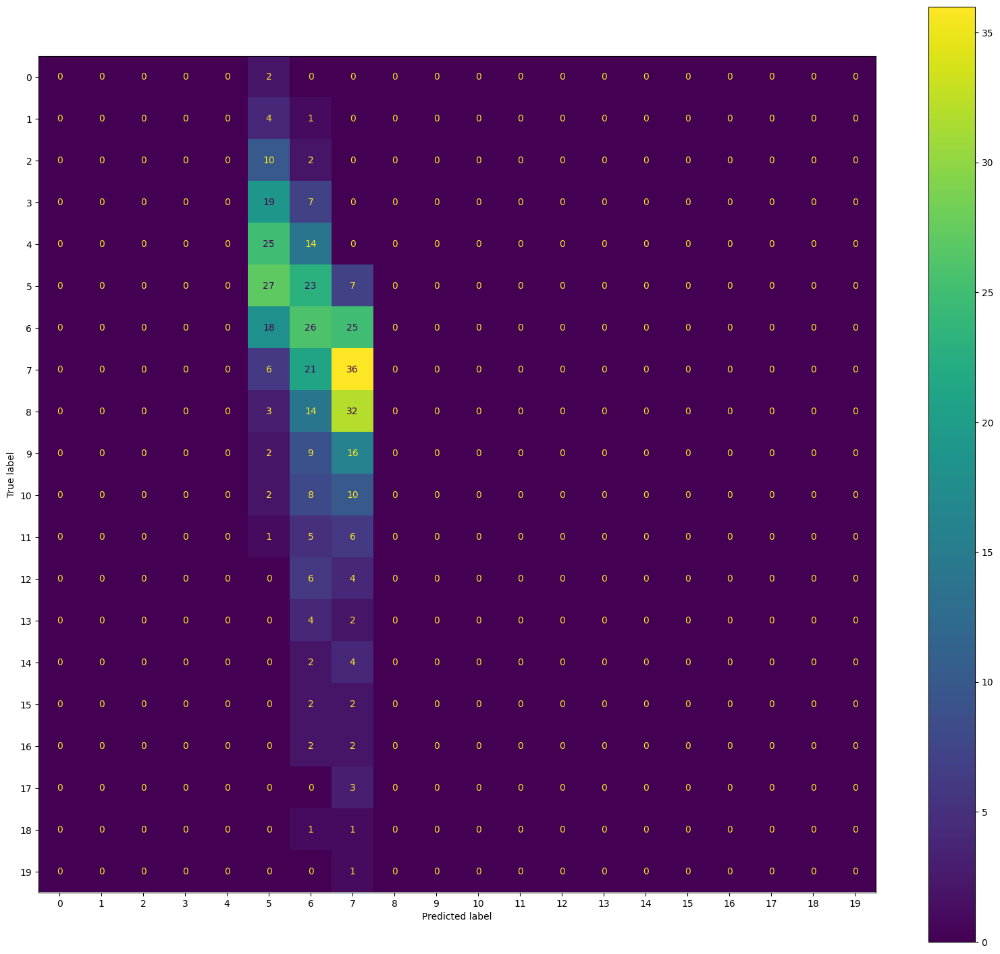

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 8

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.00      0.00      0.00        52
           4       0.00      0.00      0.00       103
           5       0.00      0.00      0.00       233
           6       0.00      0.00      0.00       352
           7       0.21      0.47      0.29       511
           8       0.19      0.41      0.27       620
           9       0.23      0.51      0.32       571
          10       0.00      0.00      0.00       438
          11       0.00      0.00      0.00       241
          12       0.00      0.00      0.00       183
          13       0.00      0.00      0.00       113
          14       0.00      0.00      0.00        91
          15       0.00      0.00      0.00        61
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


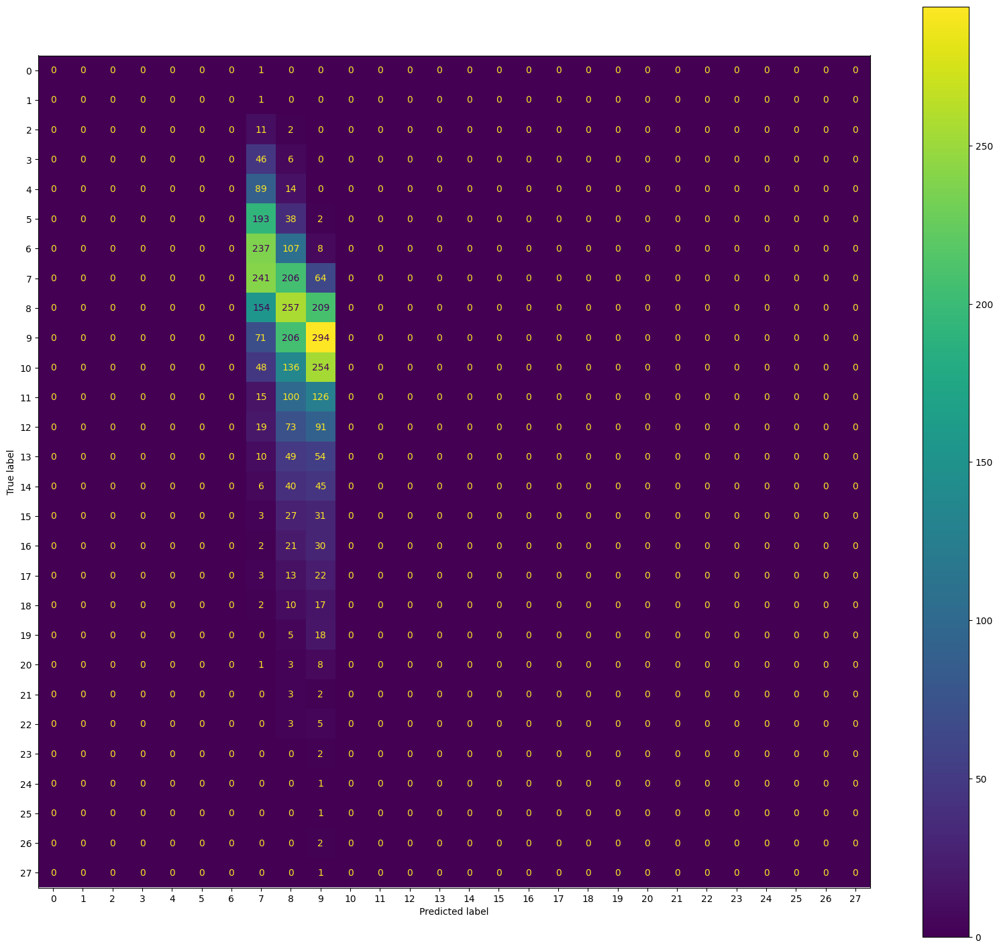

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00        12
           5       0.00      0.00      0.00        26
           6       0.00      0.00      0.00        39
           7       0.23      0.56      0.32        57
           8       0.23      0.48      0.31        69
           9       0.18      0.38      0.24        63
          10       0.00      0.00      0.00        49
          11       0.00      0.00      0.00        26
          12       0.00      0.00      0.00        20
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00        11
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         3
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


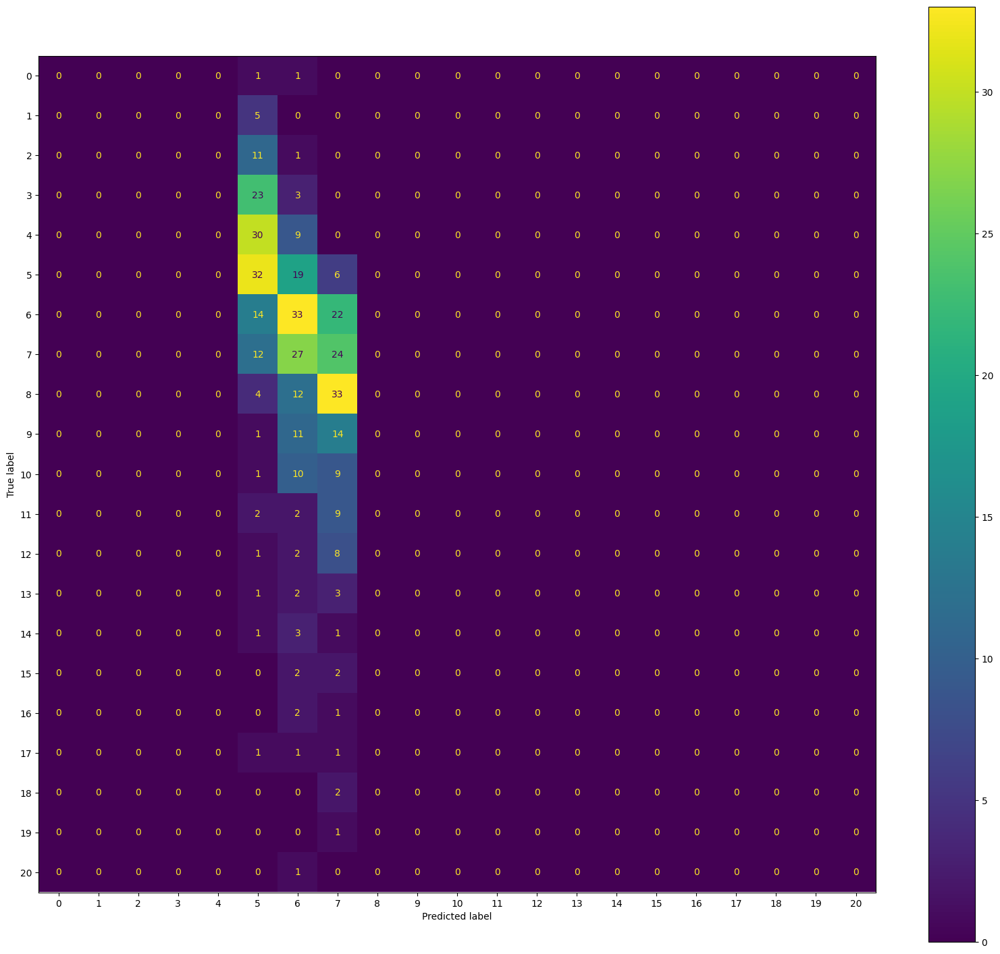

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 9

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.00      0.00      0.00        52
           4       0.00      0.00      0.00       103
           5       0.00      0.00      0.00       233
           6       0.00      0.00      0.00       352
           7       0.21      0.49      0.30       511
           8       0.20      0.42      0.27       620
           9       0.23      0.51      0.31       571
          10       0.00      0.00      0.00       438
          11       0.00      0.00      0.00       241
          12       0.00      0.00      0.00       183
          13       0.00      0.00      0.00       113
          14       0.00      0.00      0.00        91
          15       0.00      0.00      0.00        60
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


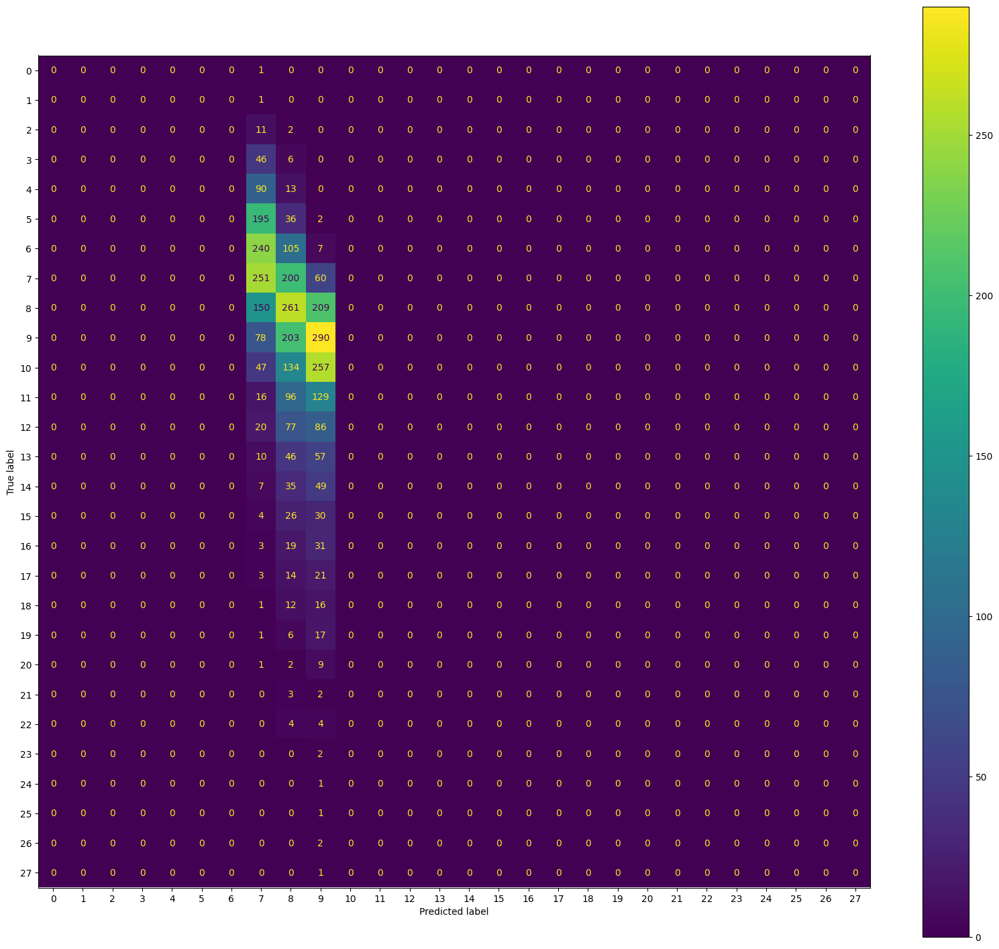

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00        12
           5       0.00      0.00      0.00        26
           6       0.00      0.00      0.00        39
           7       0.19      0.39      0.25        57
           8       0.18      0.42      0.25        69
           9       0.20      0.44      0.28        63
          10       0.00      0.00      0.00        49
          11       0.00      0.00      0.00        26
          12       0.00      0.00      0.00        20
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00        11
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         3
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


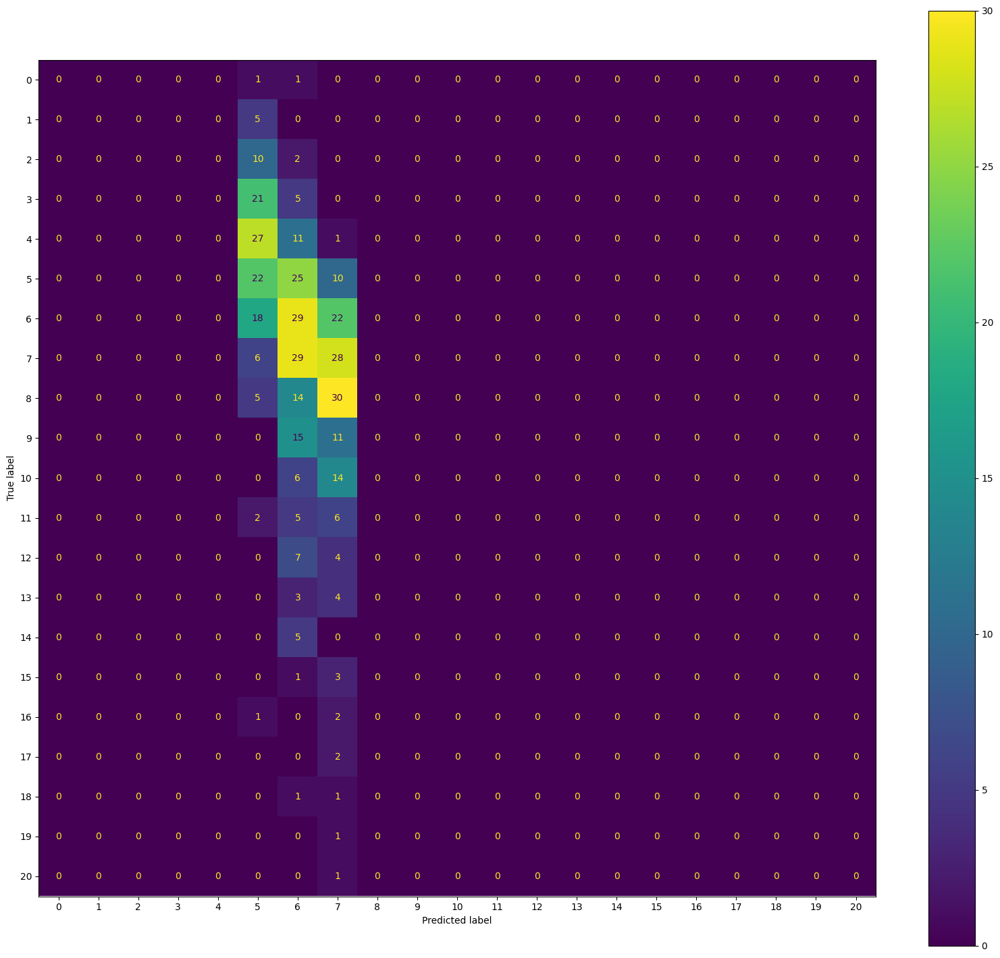

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 10

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        51
           4       0.00      0.00      0.00       104
           5       0.00      0.00      0.00       233
           6       0.00      0.00      0.00       352
           7       0.21      0.47      0.29       511
           8       0.20      0.42      0.27       620
           9       0.23      0.51      0.31       571
          10       0.00      0.00      0.00       438
          11       0.00      0.00      0.00       241
          12       0.00      0.00      0.00       183
          13       0.00      0.00      0.00       113
          14       0.00      0.00      0.00        92
          15       0.00      0.00      0.00        60
          16       0.00      0.00 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


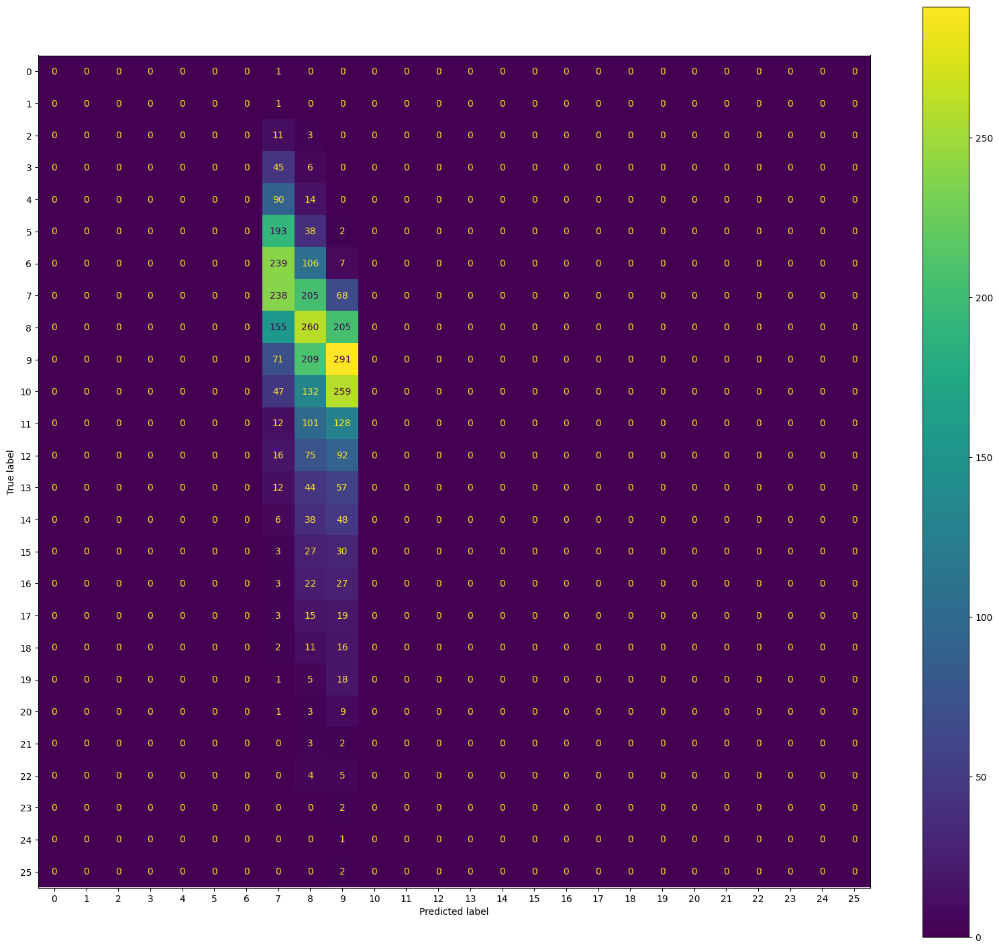

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00        11
           5       0.00      0.00      0.00        26
           6       0.00      0.00      0.00        39
           7       0.24      0.61      0.35        57
           8       0.22      0.43      0.29        69
           9       0.20      0.43      0.27        63
          10       0.00      0.00      0.00        49
          11       0.00      0.00      0.00        26
          12       0.00      0.00      0.00        20
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00        10
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         3
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


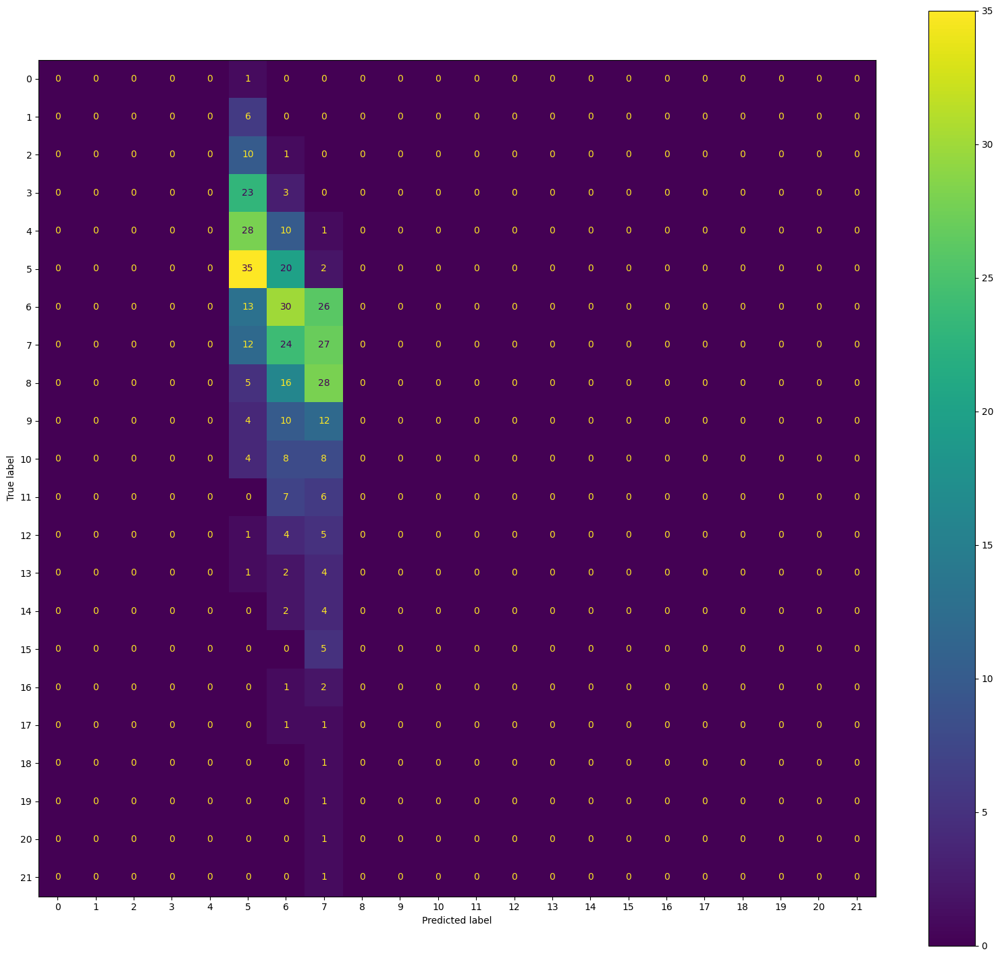

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Average of Acuuracies 0.21


0.21

In [ ]:
alpha = 10
Run2(NB2,X2,y2,alpha)

Fold 1

Train
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.00      0.00      0.00        48
           4       0.00      0.00      0.00       103
           5       0.00      0.00      0.00       236
           6       0.00      0.00      0.00       346
           7       0.00      0.00      0.00       508
           8       0.17      1.00      0.29       630
           9       0.18      0.02      0.04       562
          10       0.00      0.00      0.00       431
          11       0.00      0.00      0.00       246
          12       0.00      0.00      0.00       188
          13       0.00      0.00      0.00       115
          14       0.00      0.00      0.00        88
          15       0.00      0.00      0.00        65
          16       0.00      0.00      0.00        54
          17       0.00      0.00      0.00        37
          18 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


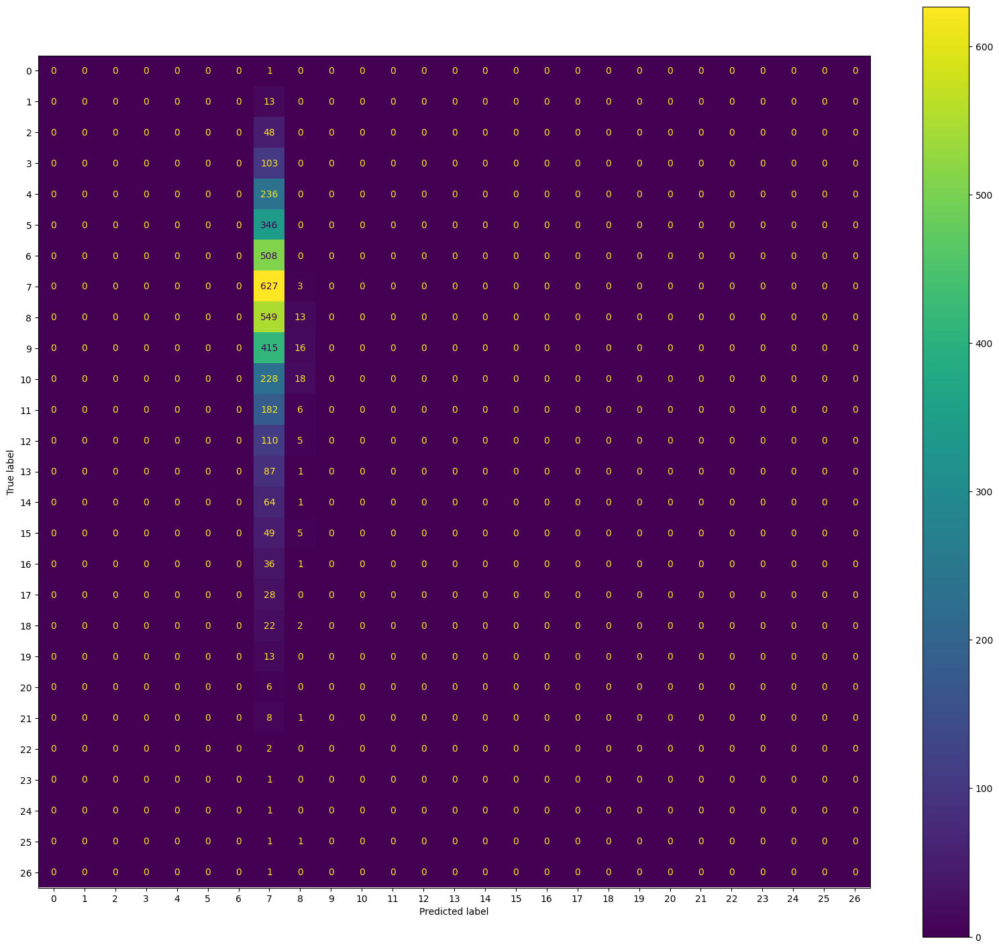

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00        12
           5       0.00      0.00      0.00        23
           6       0.00      0.00      0.00        45
           7       0.00      0.00      0.00        60
           8       0.14      1.00      0.25        59
           9       0.00      0.00      0.00        72
          10       0.00      0.00      0.00        56
          11       0.00      0.00      0.00        21
          12       0.00      0.00      0.00        15
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00        14
          15       0.00      0.00      0.00         2
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         5
          18       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


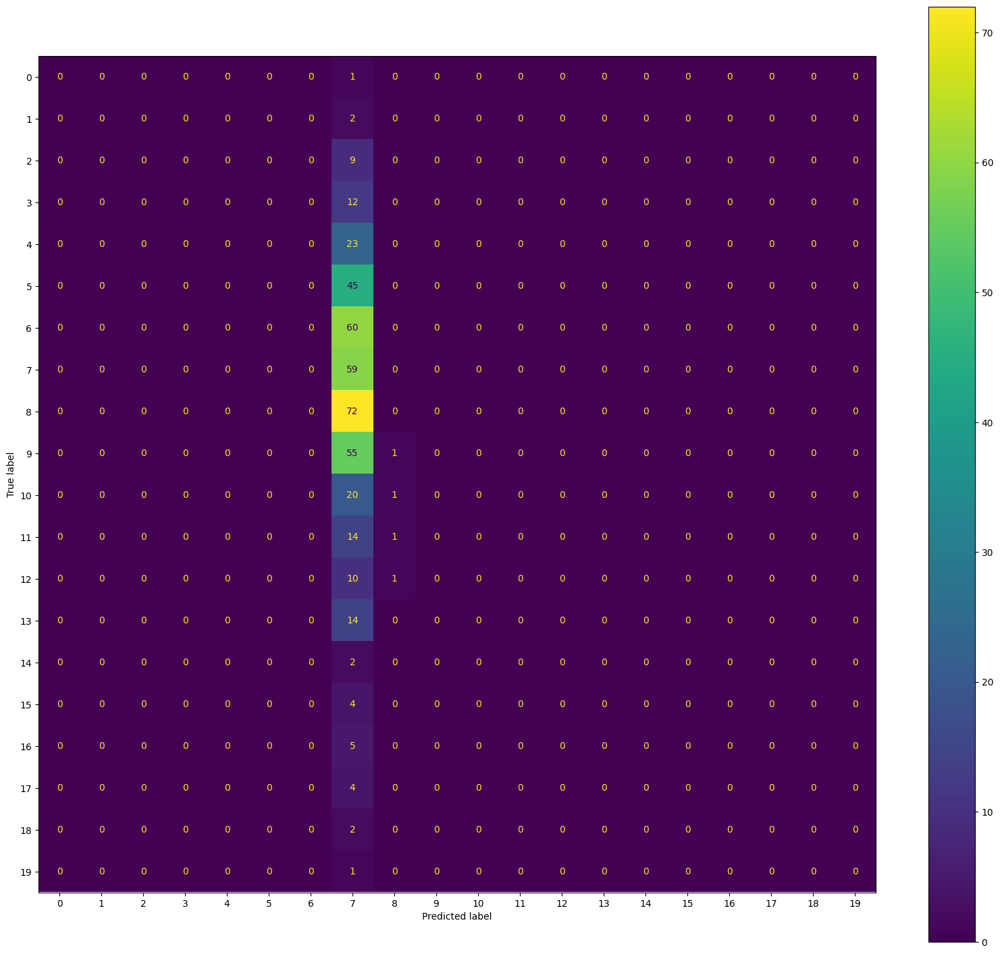

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 2

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        52
           4       0.00      0.00      0.00       103
           5       0.00      0.00      0.00       235
           6       0.00      0.00      0.00       367
           7       0.21      0.49      0.30       514
           8       0.19      0.41      0.26       616
           9       0.22      0.50      0.31       562
          10       0.00      0.00      0.00       428
          11       0.00      0.00      0.00       242
          12       0.00      0.00      0.00       185
          13       0.00      0.00      0.00       112
          14       0.00      0.00      0.00        93
          15       0.00      0.00      0.00        59
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


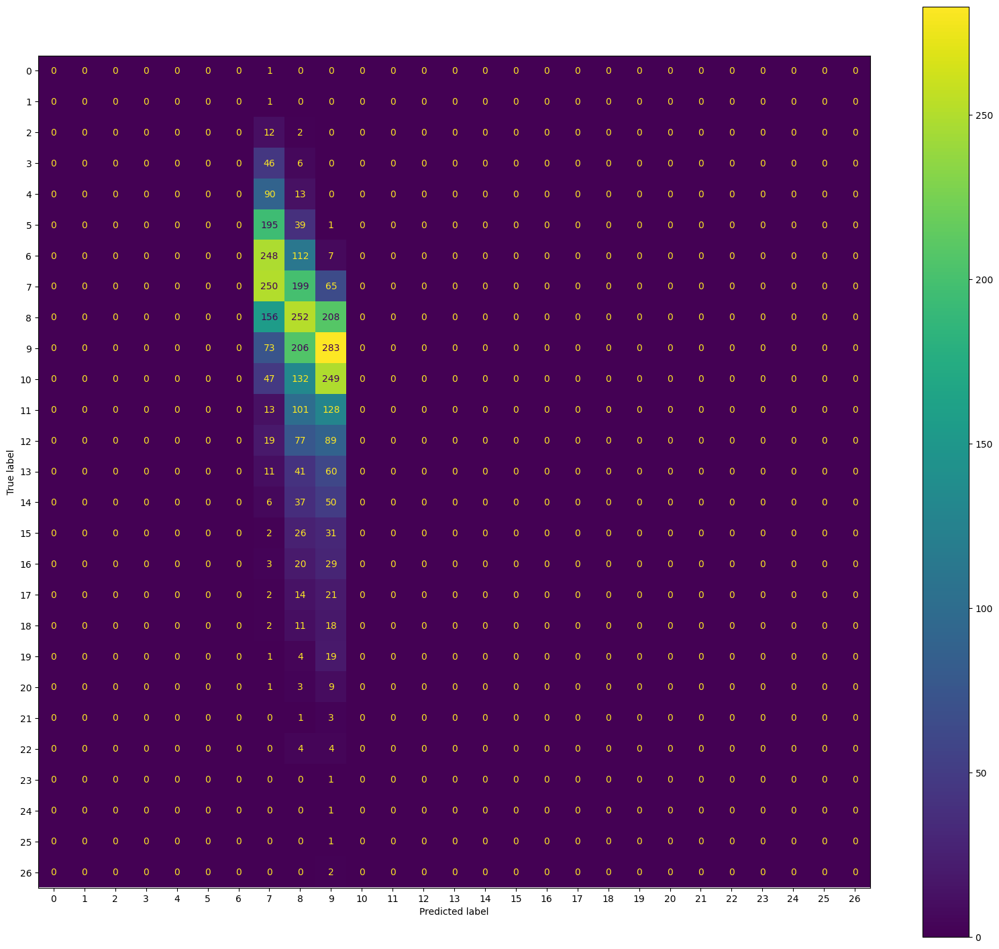

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00        12
           5       0.00      0.00      0.00        24
           6       0.00      0.00      0.00        24
           7       0.20      0.43      0.27        54
           8       0.24      0.52      0.33        73
           9       0.24      0.49      0.32        72
          10       0.00      0.00      0.00        59
          11       0.00      0.00      0.00        25
          12       0.00      0.00      0.00        18
          13       0.00      0.00      0.00        14
          14       0.00      0.00      0.00         9
          15       0.00      0.00      0.00         8
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         1
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


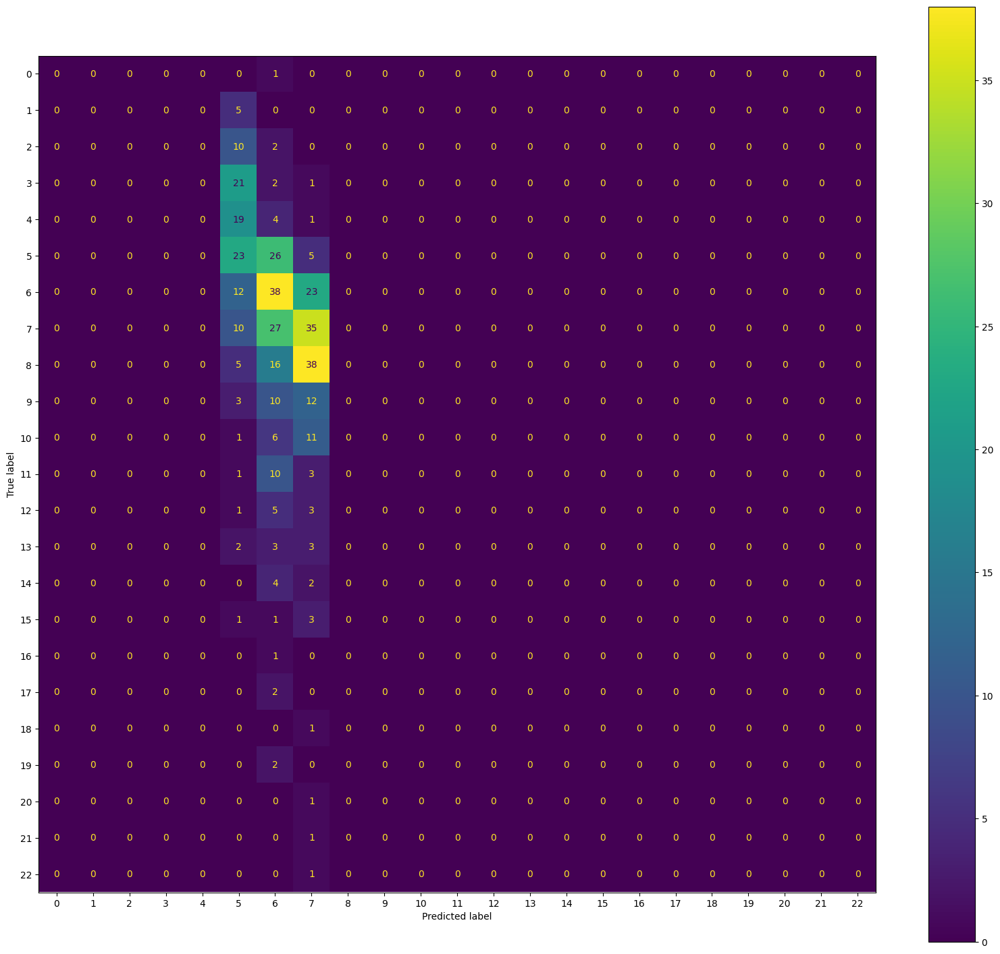

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 3

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.00      0.00      0.00        49
           4       0.00      0.00      0.00       109
           5       0.00      0.00      0.00       232
           6       0.00      0.00      0.00       352
           7       0.21      0.48      0.29       511
           8       0.20      0.42      0.27       612
           9       0.22      0.50      0.31       571
          10       0.00      0.00      0.00       442
          11       0.00      0.00      0.00       244
          12       0.00      0.00      0.00       182
          13       0.00      0.00      0.00       119
          14       0.00      0.00      0.00        91
          15       0.00      0.00      0.00        55
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


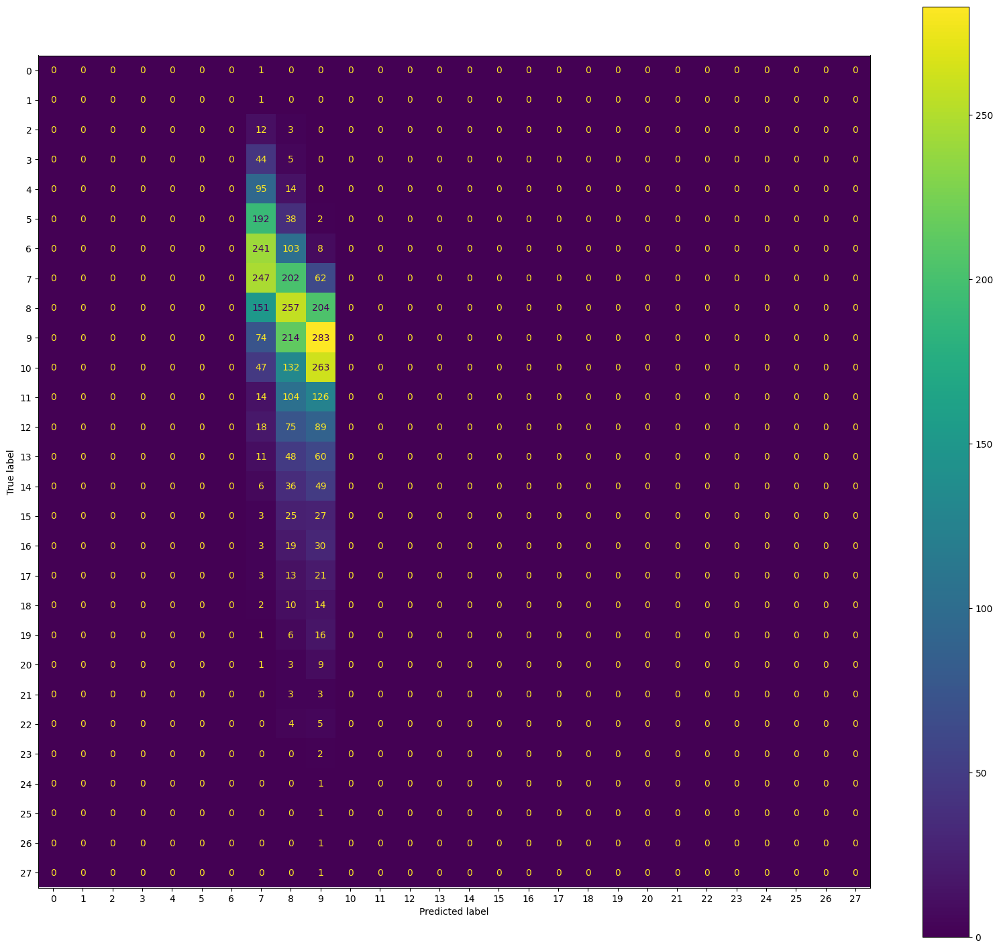

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         6
           5       0.00      0.00      0.00        27
           6       0.00      0.00      0.00        39
           7       0.21      0.46      0.28        57
           8       0.23      0.43      0.30        77
           9       0.24      0.56      0.33        63
          10       0.00      0.00      0.00        45
          11       0.00      0.00      0.00        23
          12       0.00      0.00      0.00        21
          13       0.00      0.00      0.00         7
          14       0.00      0.00      0.00        11
          15       0.00      0.00      0.00        12
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         6
          19       0.00      0.00      0.00         3
          20       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


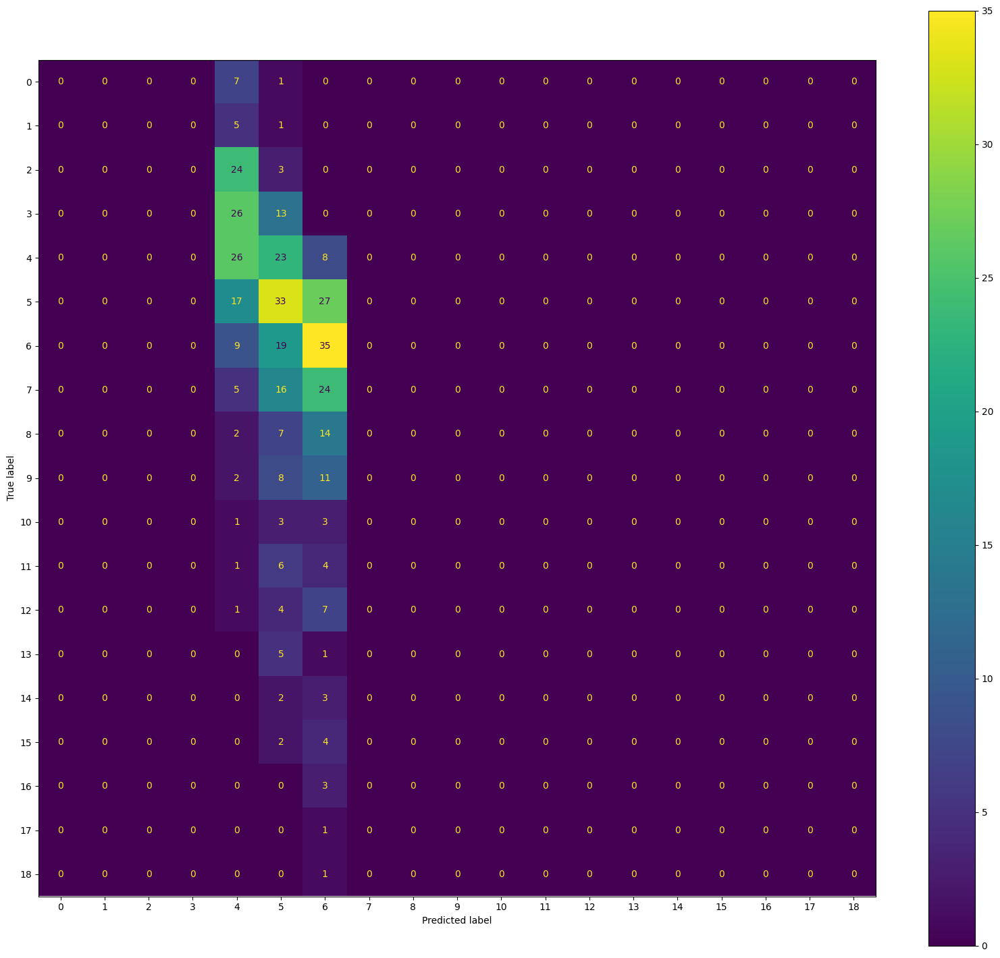

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 4

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00        52
           4       0.00      0.00      0.00       106
           5       0.00      0.00      0.00       229
           6       0.00      0.00      0.00       345
           7       0.21      0.47      0.29       520
           8       0.20      0.42      0.27       620
           9       0.22      0.50      0.31       566
          10       0.00      0.00      0.00       445
          11       0.00      0.00      0.00       241
          12       0.00      0.00      0.00       175
          13       0.00      0.00      0.00       109
          14       0.00      0.00      0.00        95
          15       0.00      0.00      0.00        64
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


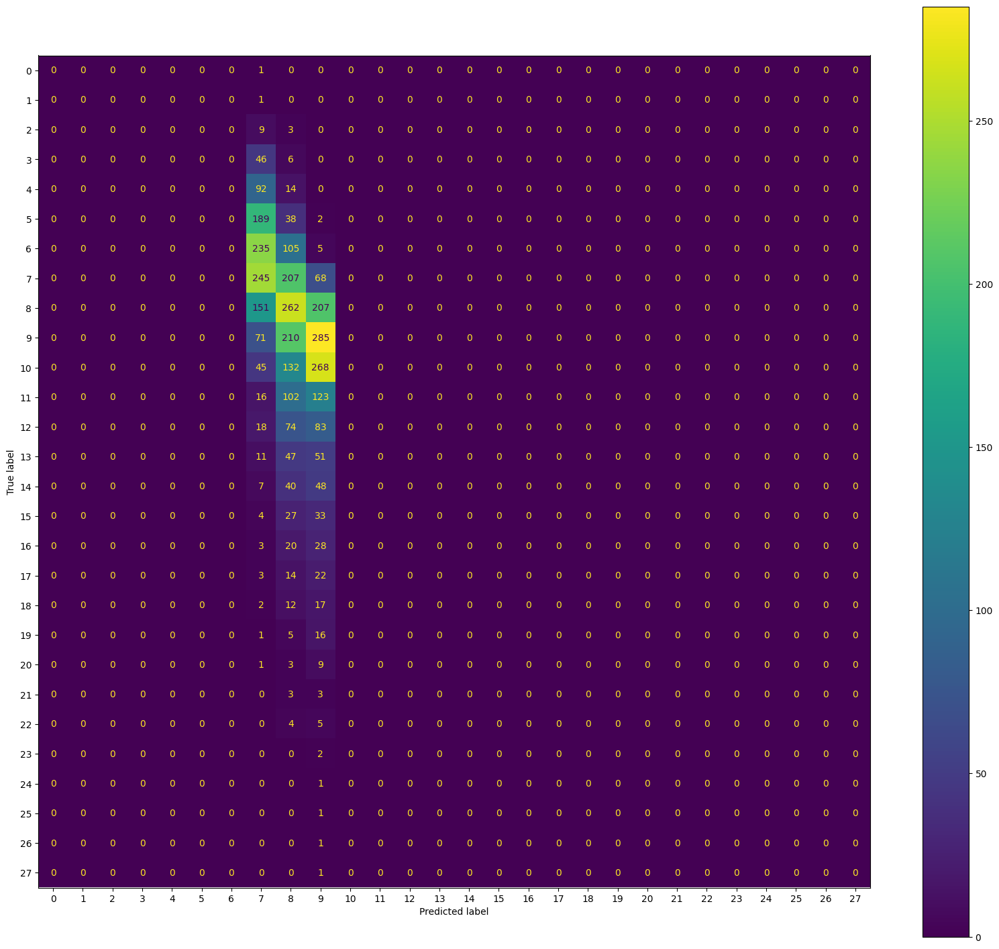

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00         9
           5       0.00      0.00      0.00        30
           6       0.00      0.00      0.00        46
           7       0.20      0.58      0.29        48
           8       0.21      0.41      0.28        69
           9       0.23      0.49      0.31        68
          10       0.00      0.00      0.00        42
          11       0.00      0.00      0.00        26
          12       0.00      0.00      0.00        28
          13       0.00      0.00      0.00        17
          14       0.00      0.00      0.00         7
          15       0.00      0.00      0.00         3
          16       0.00      0.00      0.00         7
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         1
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


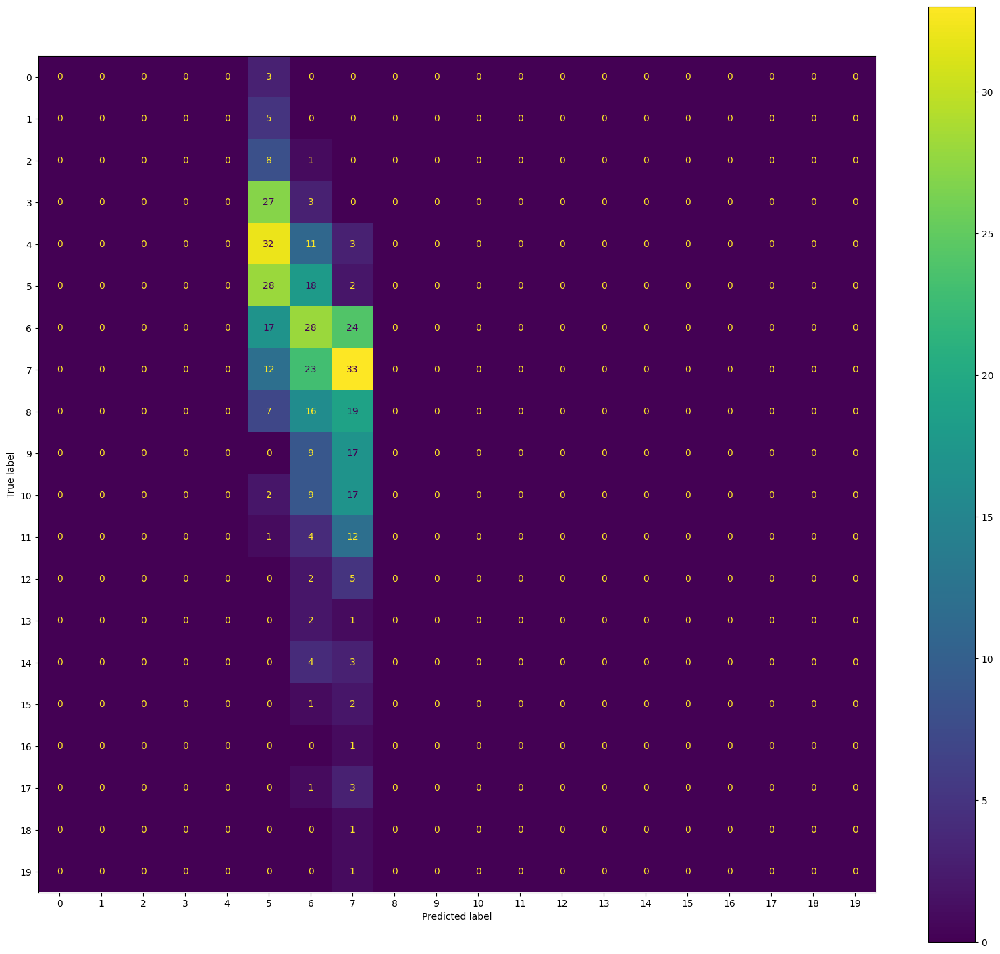

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 5

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.00      0.00      0.00        51
           4       0.00      0.00      0.00       102
           5       0.00      0.00      0.00       231
           6       0.00      0.00      0.00       352
           7       0.21      0.48      0.30       519
           8       0.20      0.42      0.27       624
           9       0.22      0.50      0.31       573
          10       0.00      0.00      0.00       437
          11       0.00      0.00      0.00       241
          12       0.00      0.00      0.00       186
          13       0.00      0.00      0.00       111
          14       0.00      0.00      0.00        93
          15       0.00      0.00      0.00        61
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


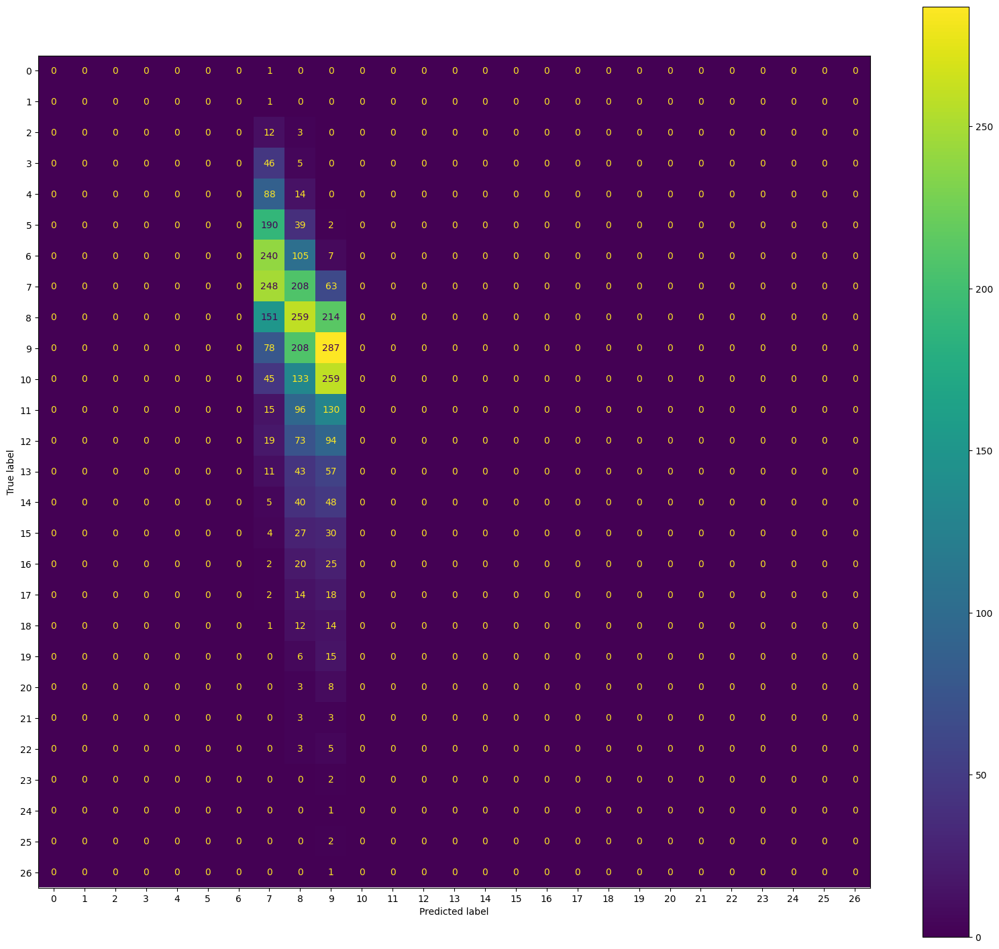

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00        13
           5       0.00      0.00      0.00        28
           6       0.00      0.00      0.00        39
           7       0.19      0.51      0.27        49
           8       0.21      0.48      0.29        65
           9       0.22      0.51      0.31        61
          10       0.00      0.00      0.00        50
          11       0.00      0.00      0.00        26
          12       0.00      0.00      0.00        17
          13       0.00      0.00      0.00        15
          14       0.00      0.00      0.00         9
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00        11
          17       0.00      0.00      0.00         8
          18       0.00      0.00      0.00         5
          19       0.00      0.00      0.00         5
          20       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


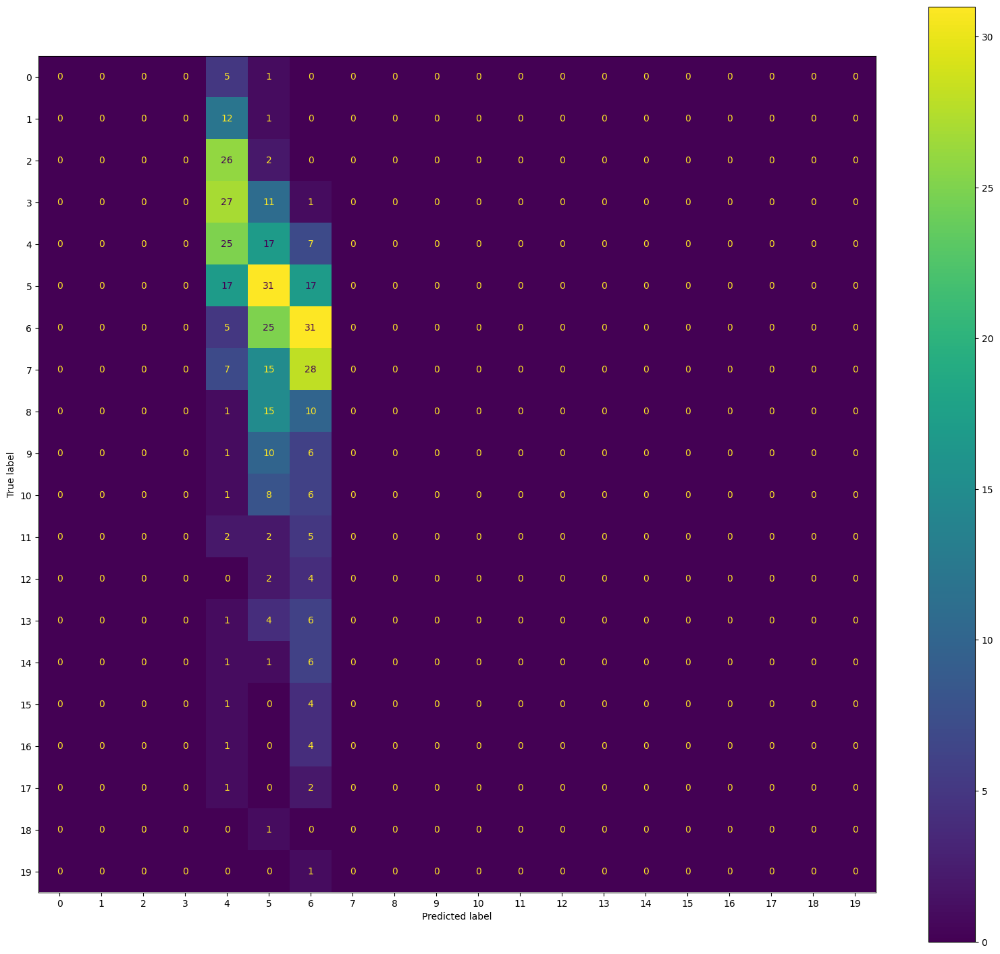

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 6

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        53
           4       0.00      0.00      0.00       104
           5       0.00      0.00      0.00       226
           6       0.00      0.00      0.00       346
           7       0.21      0.48      0.29       515
           8       0.20      0.43      0.27       621
           9       0.23      0.51      0.31       578
          10       0.00      0.00      0.00       444
          11       0.00      0.00      0.00       233
          12       0.00      0.00      0.00       188
          13       0.00      0.00      0.00       113
          14       0.00      0.00      0.00        84
          15       0.00      0.00      0.00        61
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


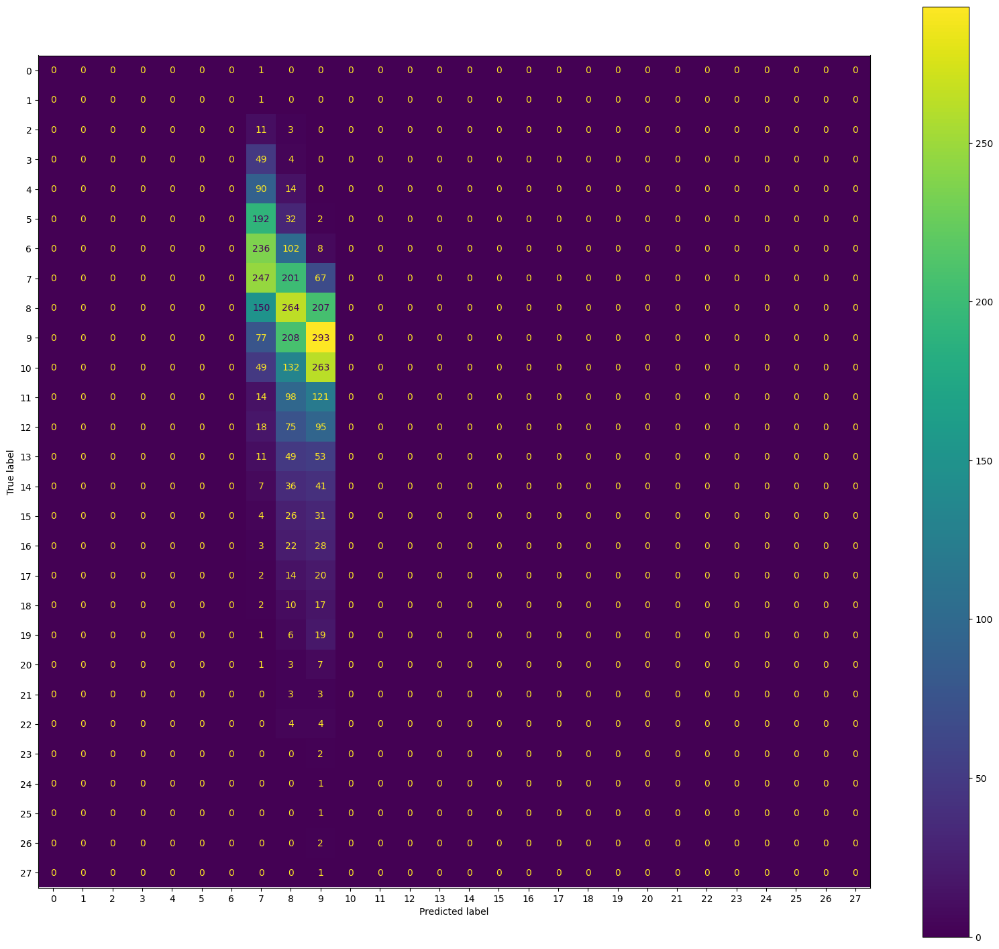

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         4
           4       0.00      0.00      0.00        11
           5       0.00      0.00      0.00        33
           6       0.00      0.00      0.00        45
           7       0.20      0.49      0.29        53
           8       0.17      0.38      0.23        68
           9       0.18      0.45      0.26        56
          10       0.00      0.00      0.00        43
          11       0.00      0.00      0.00        34
          12       0.00      0.00      0.00        15
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00        18
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         6
          18       0.00      0.00      0.00         3
          20       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


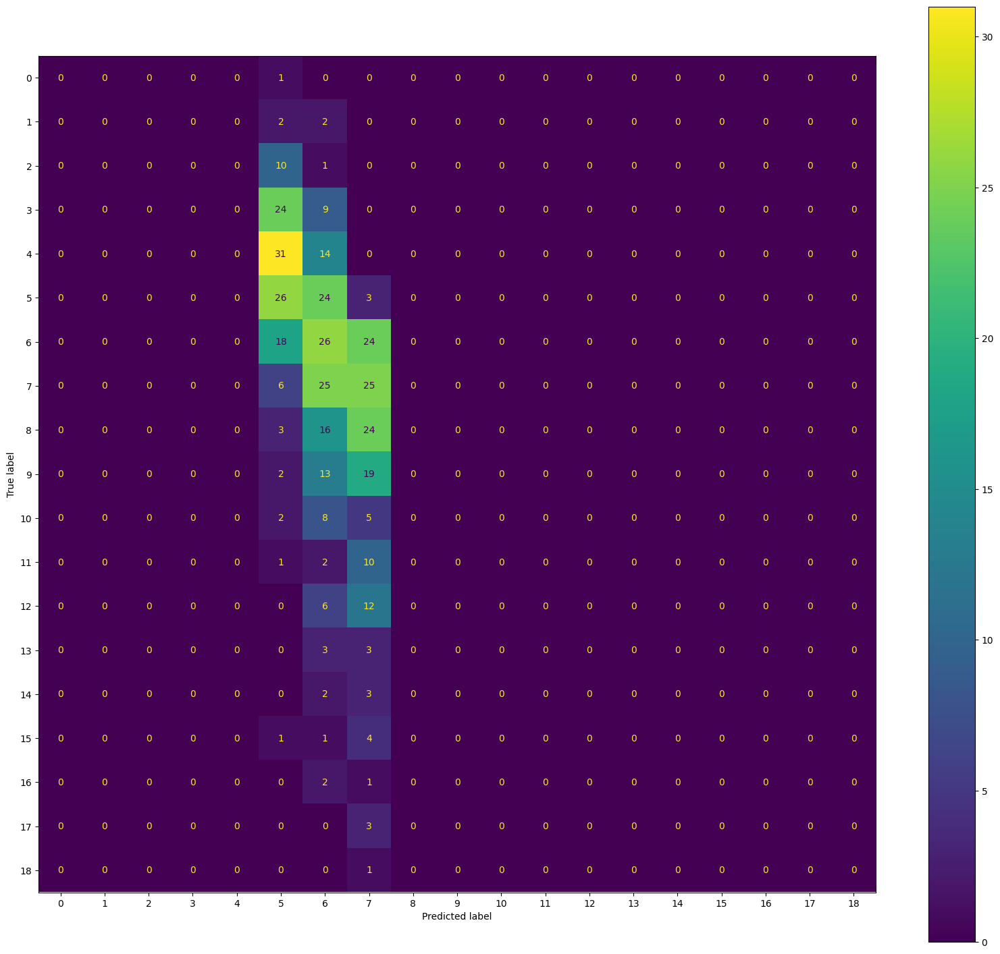

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 7

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.00      0.00      0.00        53
           4       0.00      0.00      0.00       108
           5       0.00      0.00      0.00       226
           6       0.00      0.00      0.00       354
           7       0.21      0.49      0.29       510
           8       0.20      0.42      0.27       622
           9       0.23      0.50      0.31       585
          10       0.00      0.00      0.00       431
          11       0.00      0.00      0.00       236
          12       0.00      0.00      0.00       178
          13       0.00      0.00      0.00       110
          14       0.00      0.00      0.00        89
          15       0.00      0.00      0.00        61
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


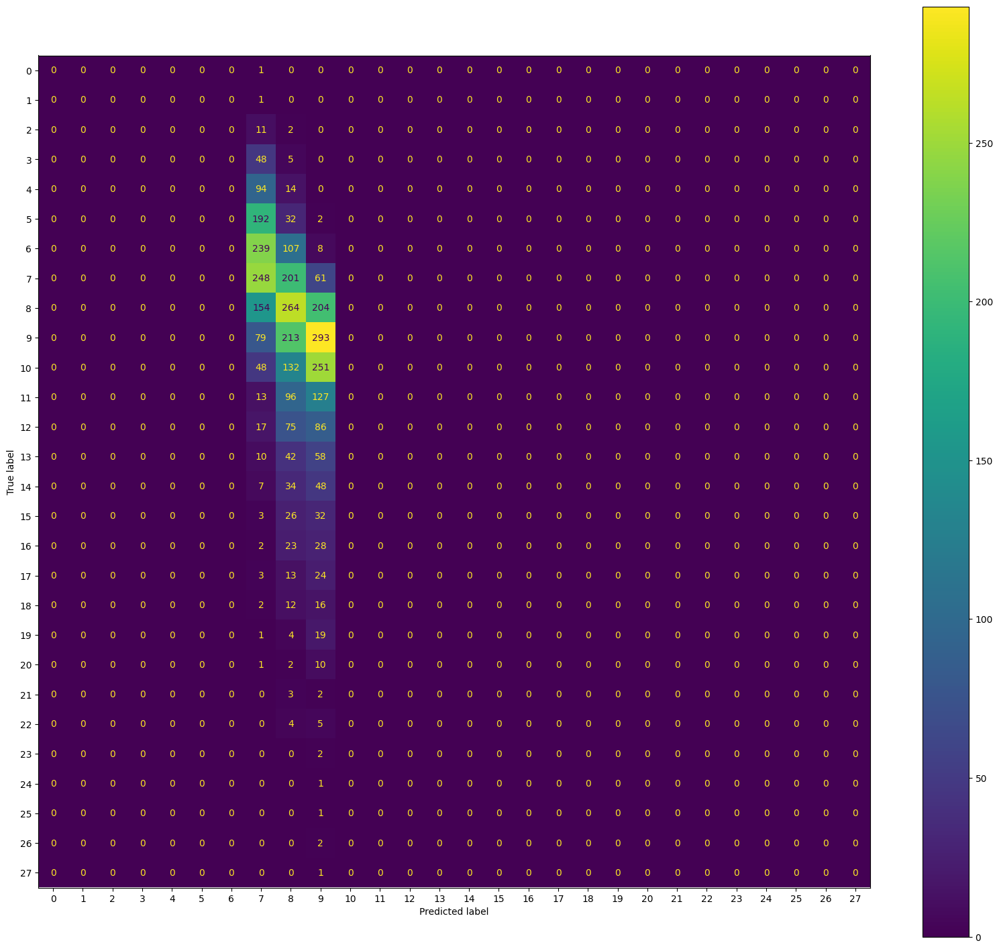

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         4
           4       0.00      0.00      0.00         7
           5       0.00      0.00      0.00        33
           6       0.00      0.00      0.00        37
           7       0.21      0.43      0.28        58
           8       0.17      0.39      0.23        67
           9       0.18      0.51      0.26        49
          10       0.00      0.00      0.00        56
          11       0.00      0.00      0.00        31
          12       0.00      0.00      0.00        25
          13       0.00      0.00      0.00        16
          14       0.00      0.00      0.00        13
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         2
          18       0.00      0.00      0.00         2
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


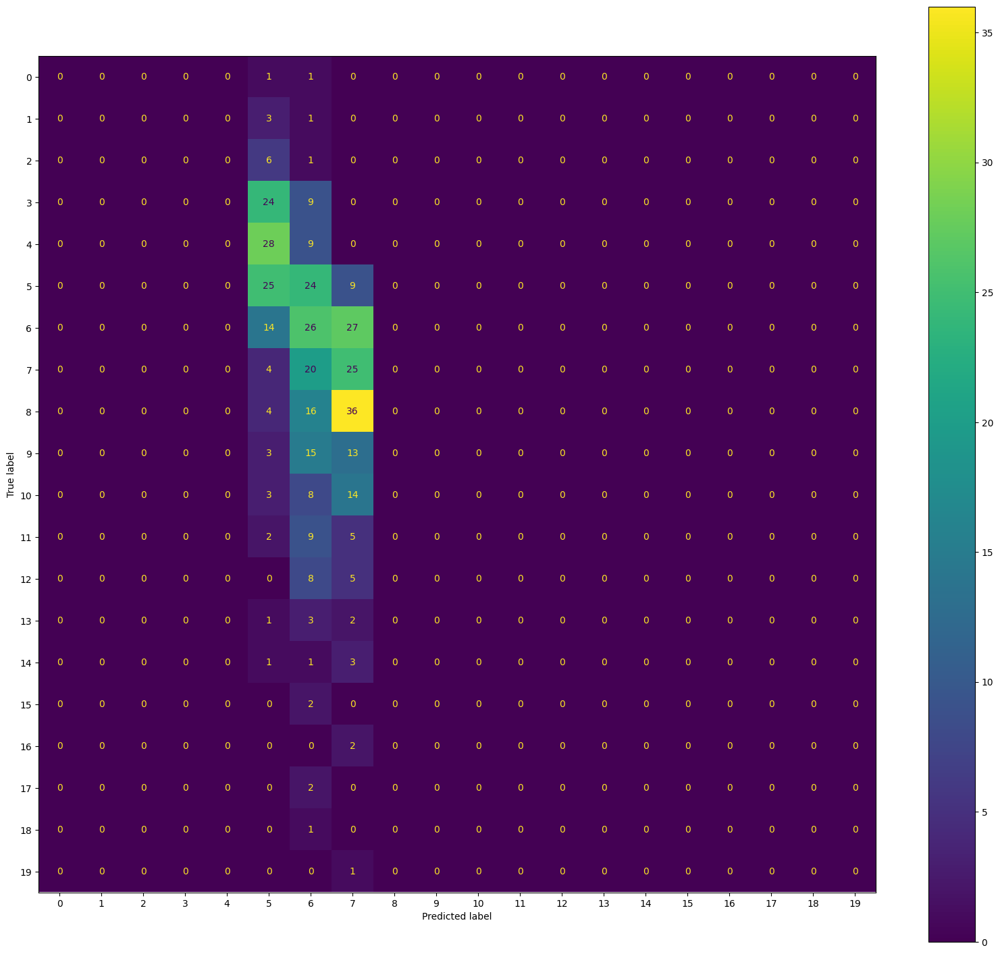

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 8

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.00      0.00      0.00        50
           4       0.00      0.00      0.00       103
           5       0.00      0.00      0.00       238
           6       0.00      0.00      0.00       350
           7       0.00      0.00      0.00       505
           8       0.17      0.82      0.28       622
           9       0.23      0.28      0.25       557
          10       0.00      0.00      0.00       444
          11       0.00      0.00      0.00       247
          12       0.00      0.00      0.00       177
          13       0.00      0.00      0.00       113
          14       0.00      0.00      0.00        99
          15       0.00      0.00      0.00        58
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


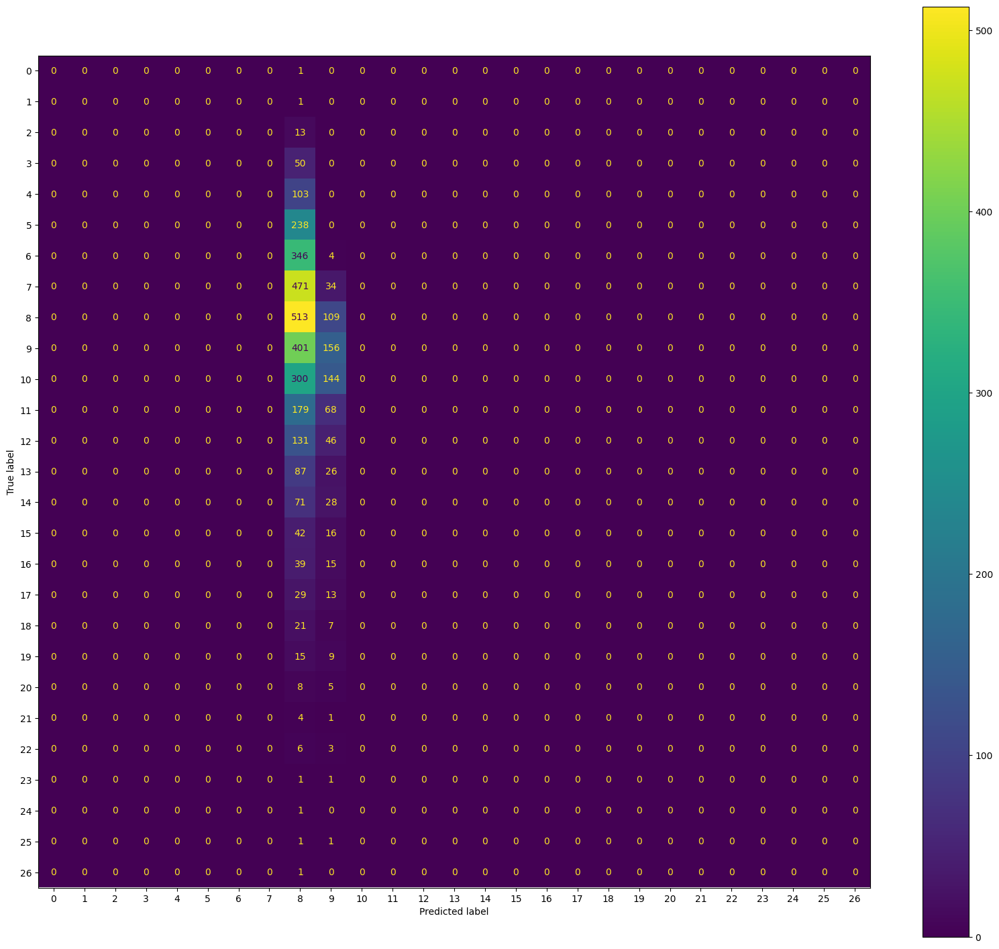

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00        12
           5       0.00      0.00      0.00        21
           6       0.00      0.00      0.00        41
           7       0.00      0.00      0.00        63
           8       0.16      0.84      0.27        67
           9       0.27      0.25      0.26        77
          10       0.00      0.00      0.00        43
          11       0.00      0.00      0.00        20
          12       0.00      0.00      0.00        26
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00         3
          15       0.00      0.00      0.00         9
          16       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         4
          19       0.00      0.00      0.00         2
          20       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


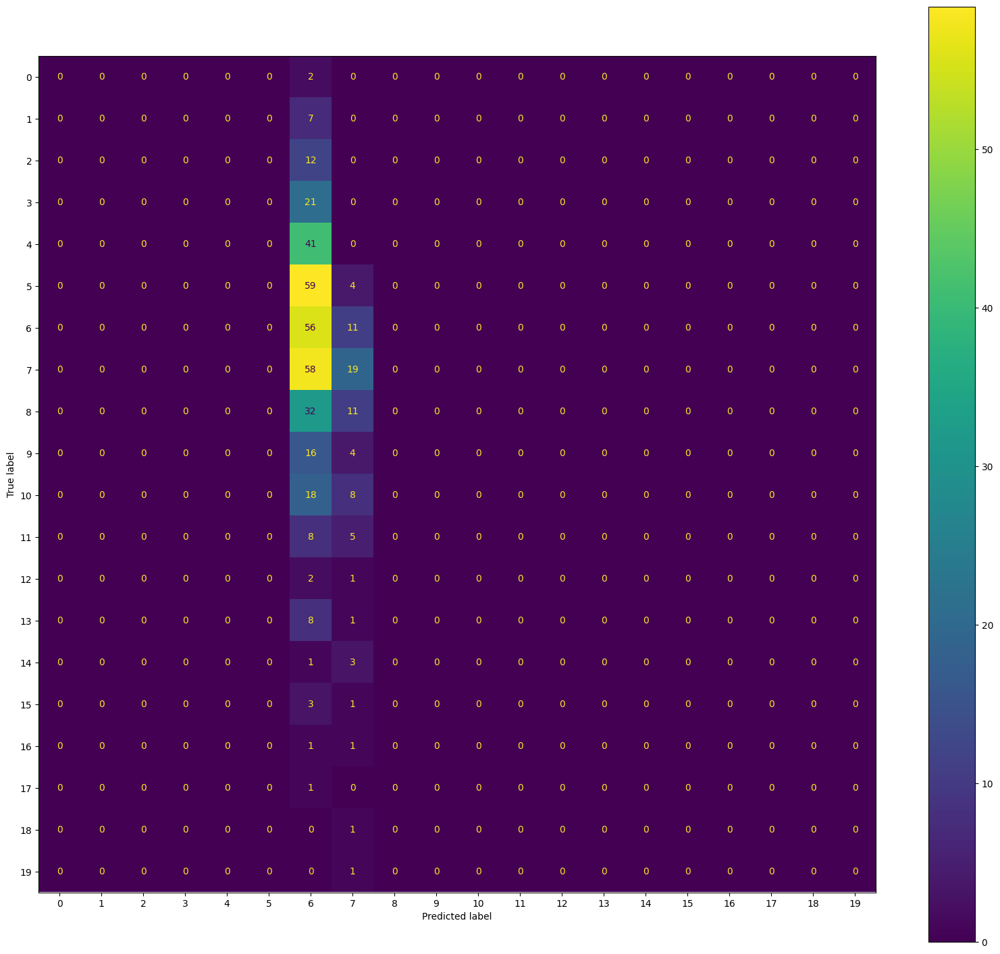

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 9

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        52
           4       0.00      0.00      0.00       102
           5       0.00      0.00      0.00       243
           6       0.00      0.00      0.00       353
           7       0.21      0.48      0.29       507
           8       0.20      0.43      0.27       618
           9       0.23      0.51      0.32       575
          10       0.00      0.00      0.00       442
          11       0.00      0.00      0.00       231
          12       0.00      0.00      0.00       181
          13       0.00      0.00      0.00       117
          14       0.00      0.00      0.00        96
          15       0.00      0.00      0.00        56
          16       0.00      0.00      0.00        55
          17       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


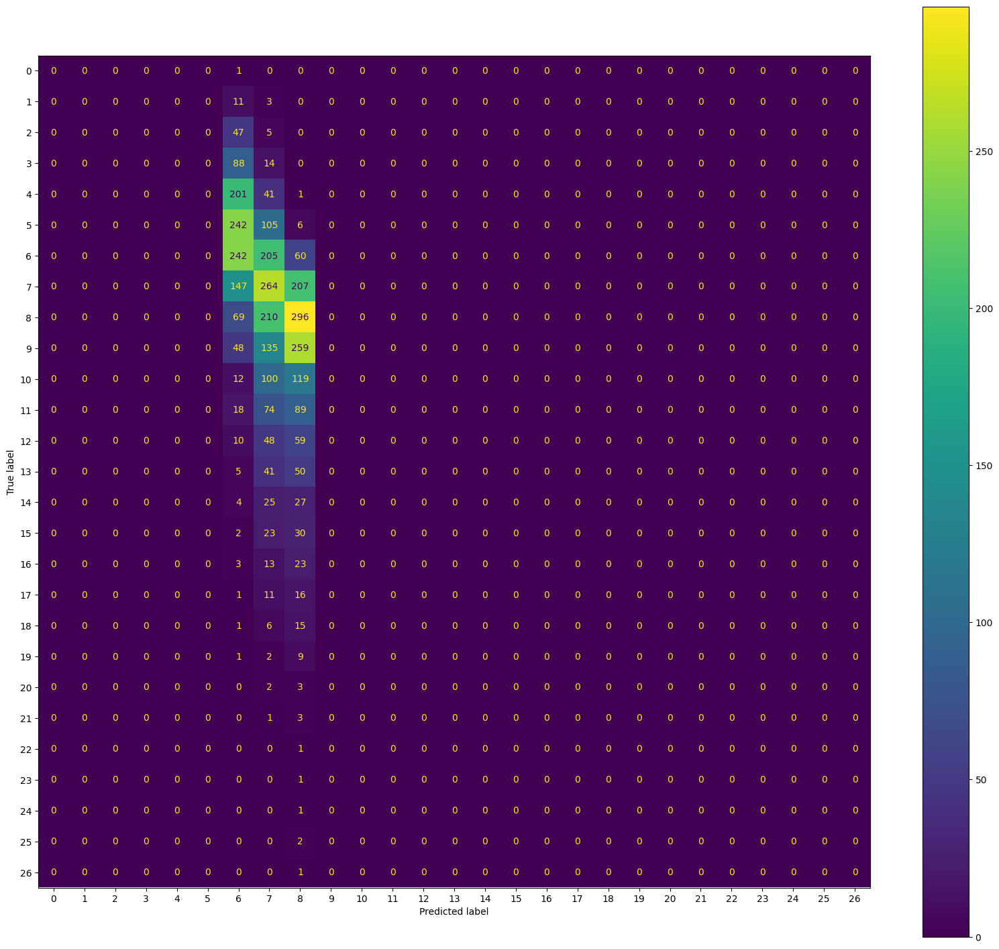

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00        13
           5       0.00      0.00      0.00        16
           6       0.00      0.00      0.00        38
           7       0.22      0.51      0.31        61
           8       0.20      0.37      0.26        71
           9       0.15      0.37      0.22        59
          10       0.00      0.00      0.00        45
          11       0.00      0.00      0.00        36
          12       0.00      0.00      0.00        22
          13       0.00      0.00      0.00         9
          14       0.00      0.00      0.00         6
          15       0.00      0.00      0.00        11
          16       0.00      0.00      0.00         3
          17       0.00      0.00      0.00         3
          18       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


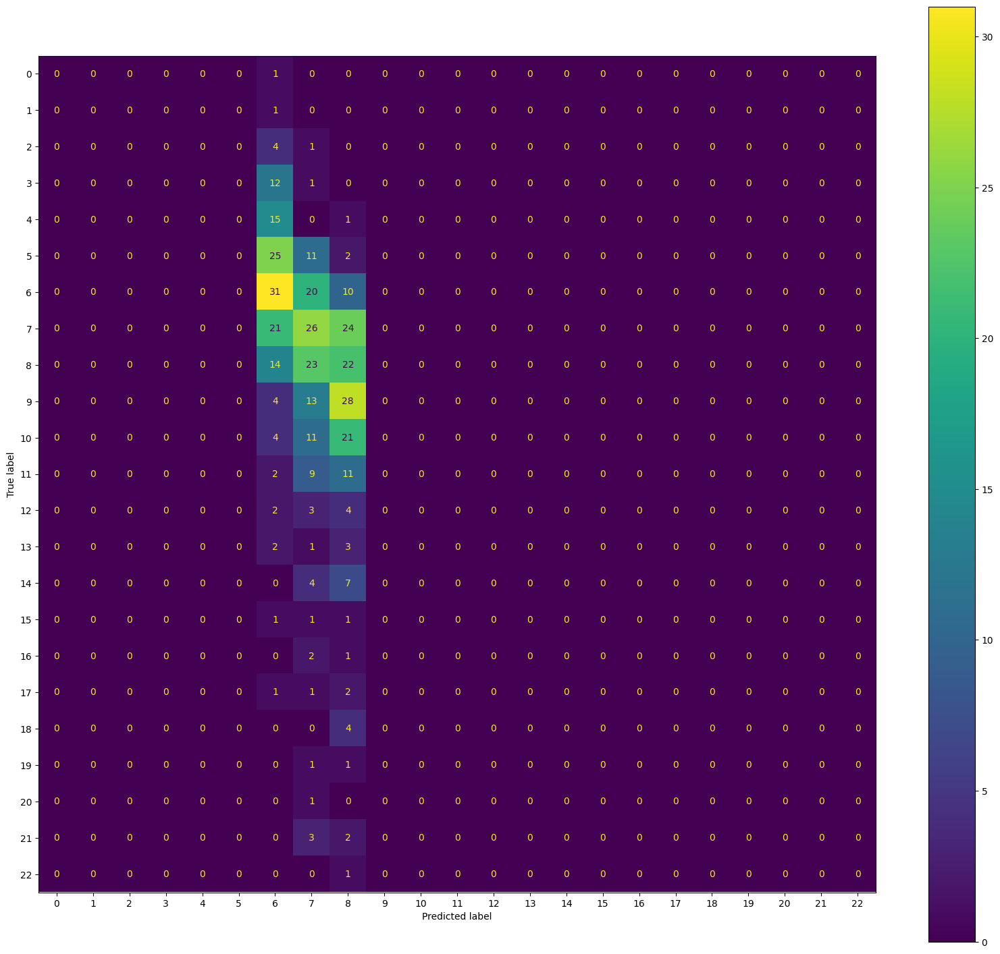

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 10

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00        53
           4       0.00      0.00      0.00        95
           5       0.00      0.00      0.00       235
           6       0.00      0.00      0.00       354
           7       0.21      0.49      0.30       503
           8       0.20      0.43      0.27       616
           9       0.22      0.50      0.31       577
          10       0.00      0.00      0.00       439
          11       0.00      0.00      0.00       242
          12       0.00      0.00      0.00       187
          13       0.00      0.00      0.00       115
          14       0.00      0.00      0.00        90
          15       0.00      0.00      0.00        63
          16       0.00      0.00 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


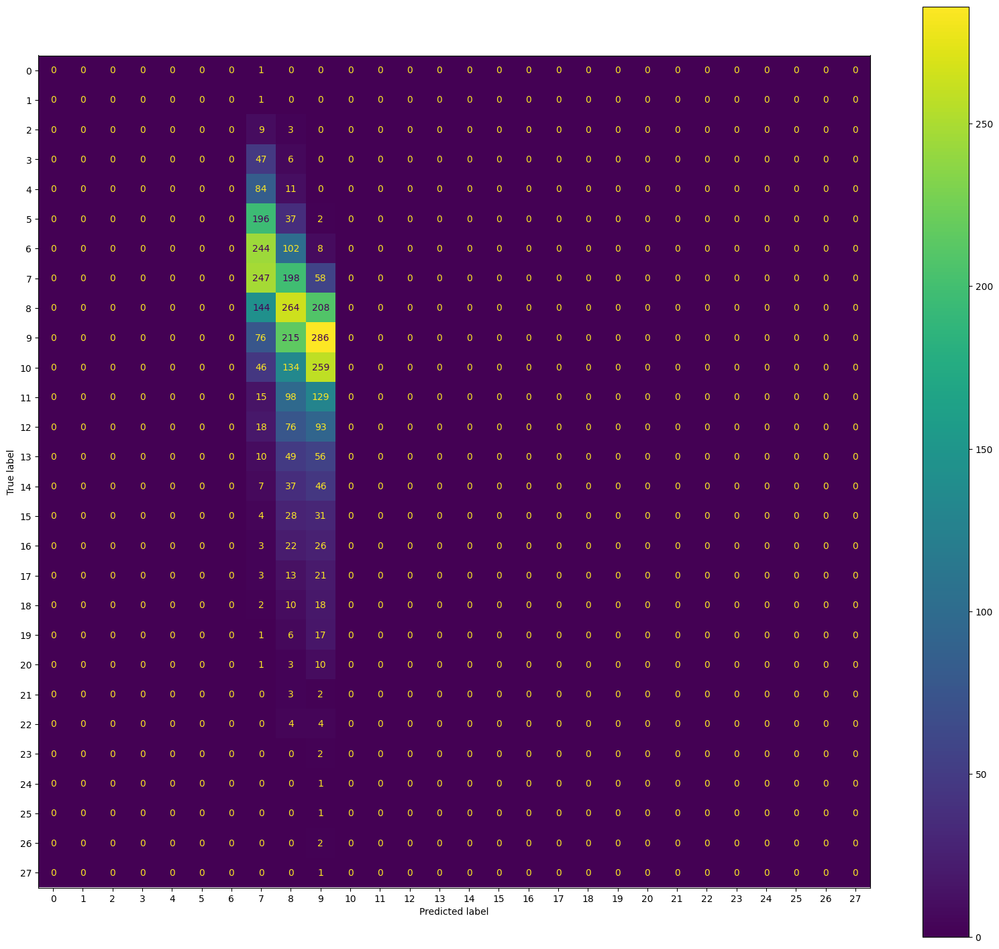

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         4
           4       0.00      0.00      0.00        20
           5       0.00      0.00      0.00        24
           6       0.00      0.00      0.00        37
           7       0.19      0.40      0.26        65
           8       0.18      0.36      0.24        73
           9       0.23      0.56      0.32        57
          10       0.00      0.00      0.00        48
          11       0.00      0.00      0.00        25
          12       0.00      0.00      0.00        16
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00        12
          15       0.00      0.00      0.00         4
          16       0.00      0.00      0.00         7
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         2
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


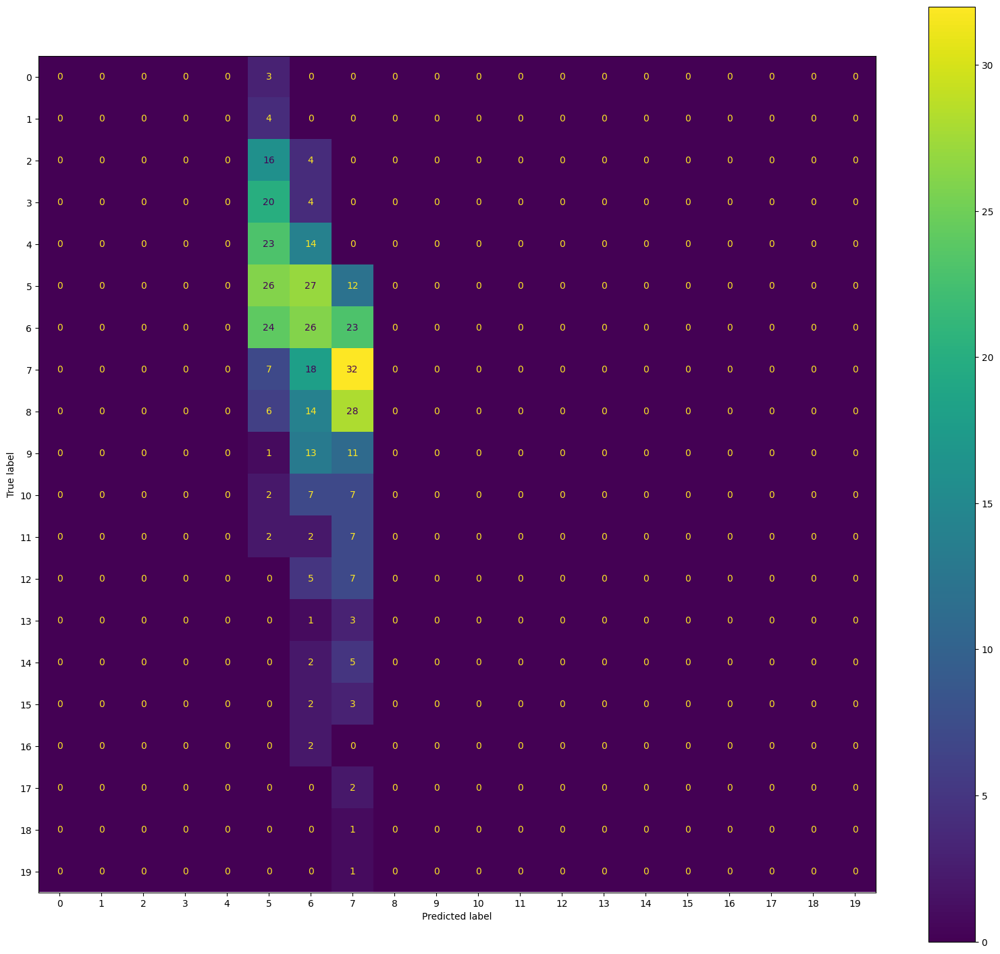

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Average of Acuuracies 0.2


0.2

In [ ]:
alpha = 15
Run2(NB2,X2,y2,alpha)

Fold 1

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.00      0.00      0.00        55
           4       0.00      0.00      0.00        99
           5       0.00      0.00      0.00       232
           6       0.00      0.00      0.00       354
           7       0.00      0.00      0.00       521
           8       0.16      1.00      0.28       616
           9       0.00      0.00      0.00       563
          10       0.00      0.00      0.00       452
          11       0.00      0.00      0.00       238
          12       0.00      0.00      0.00       179
          13       0.00      0.00      0.00       104
          14       0.00      0.00      0.00        94
          15       0.00      0.00      0.00        60
          16       0.00      0.00      0.00        52
          17 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


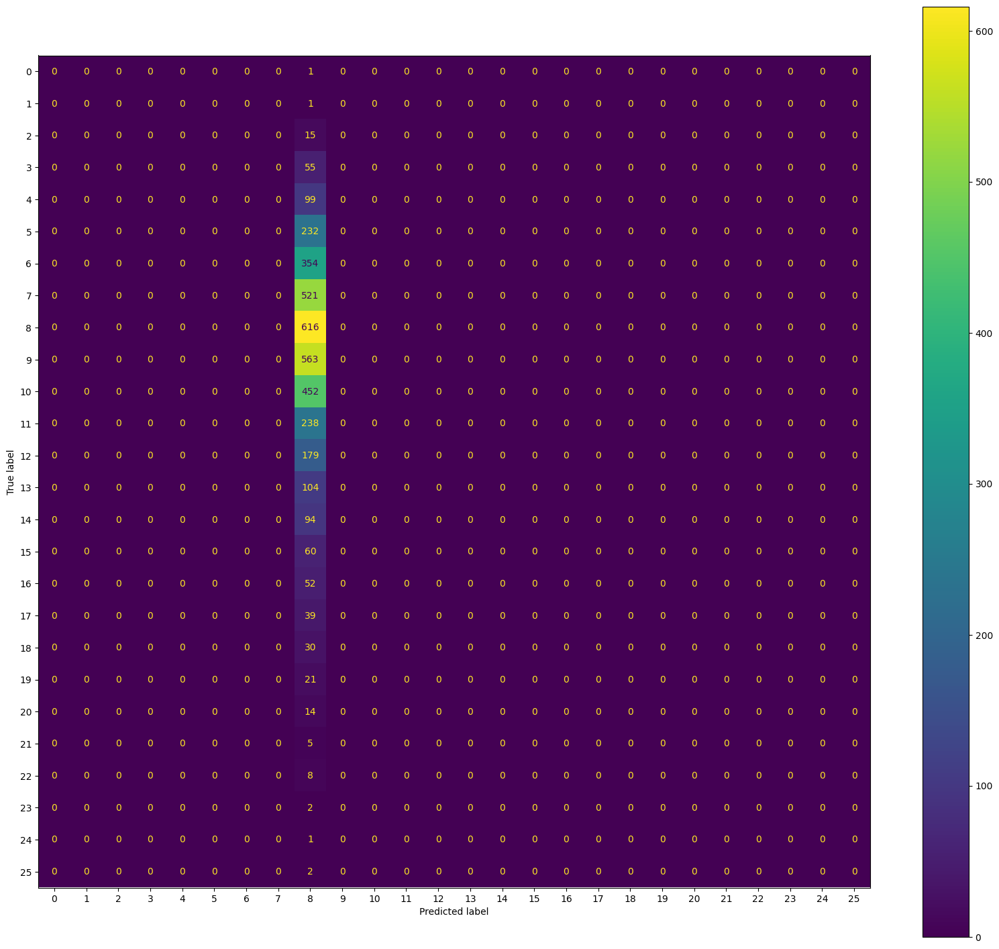

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.00      0.00      0.00        16
           5       0.00      0.00      0.00        27
           6       0.00      0.00      0.00        37
           7       0.00      0.00      0.00        47
           8       0.17      1.00      0.30        73
           9       0.00      0.00      0.00        71
          10       0.00      0.00      0.00        35
          11       0.00      0.00      0.00        29
          12       0.00      0.00      0.00        24
          13       0.00      0.00      0.00        22
          14       0.00      0.00      0.00         8
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         2
          19       0.00      0.00      0.00         5
          21       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


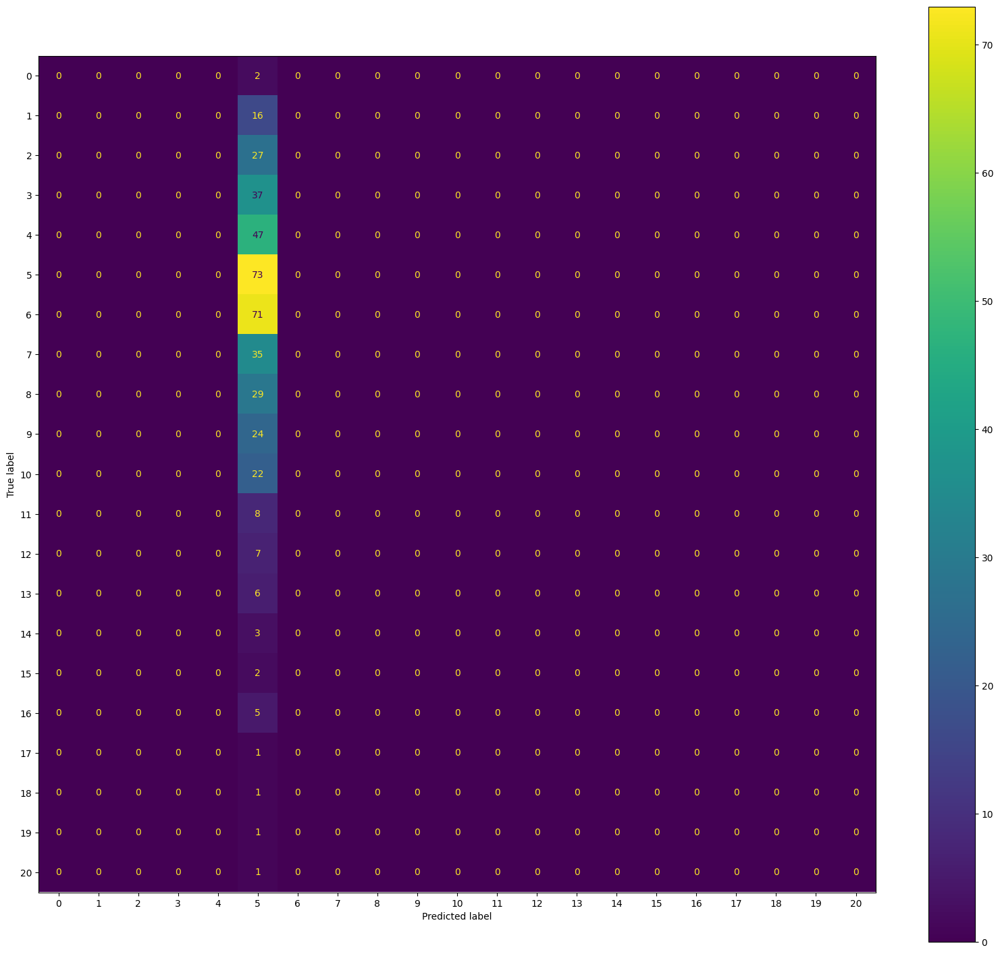

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 2

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        50
           4       0.00      0.00      0.00       100
           5       0.00      0.00      0.00       232
           6       0.00      0.00      0.00       351
           7       0.00      0.00      0.00       516
           8       0.16      1.00      0.28       615
           9       0.50      0.00      0.00       569
          10       0.00      0.00      0.00       445
          11       0.00      0.00      0.00       241
          12       0.00      0.00      0.00       182
          13       0.00      0.00      0.00       116
          14       0.00      0.00      0.00        88
          15       0.00      0.00      0.00        64
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


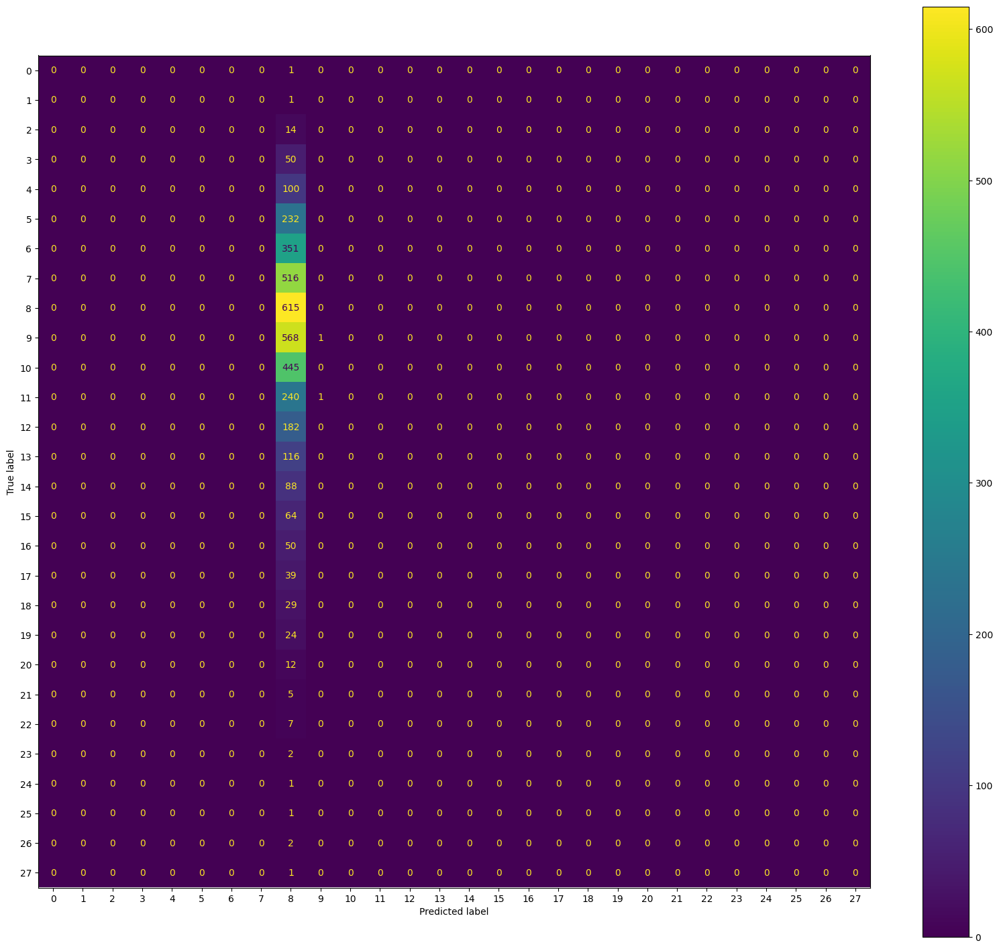

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00        15
           5       0.00      0.00      0.00        27
           6       0.00      0.00      0.00        40
           7       0.00      0.00      0.00        52
           8       0.18      1.00      0.30        74
           9       0.00      0.00      0.00        65
          10       0.00      0.00      0.00        42
          11       0.00      0.00      0.00        26
          12       0.00      0.00      0.00        21
          13       0.00      0.00      0.00        10
          14       0.00      0.00      0.00        14
          15       0.00      0.00      0.00         3
          16       0.00      0.00      0.00         8
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         3
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


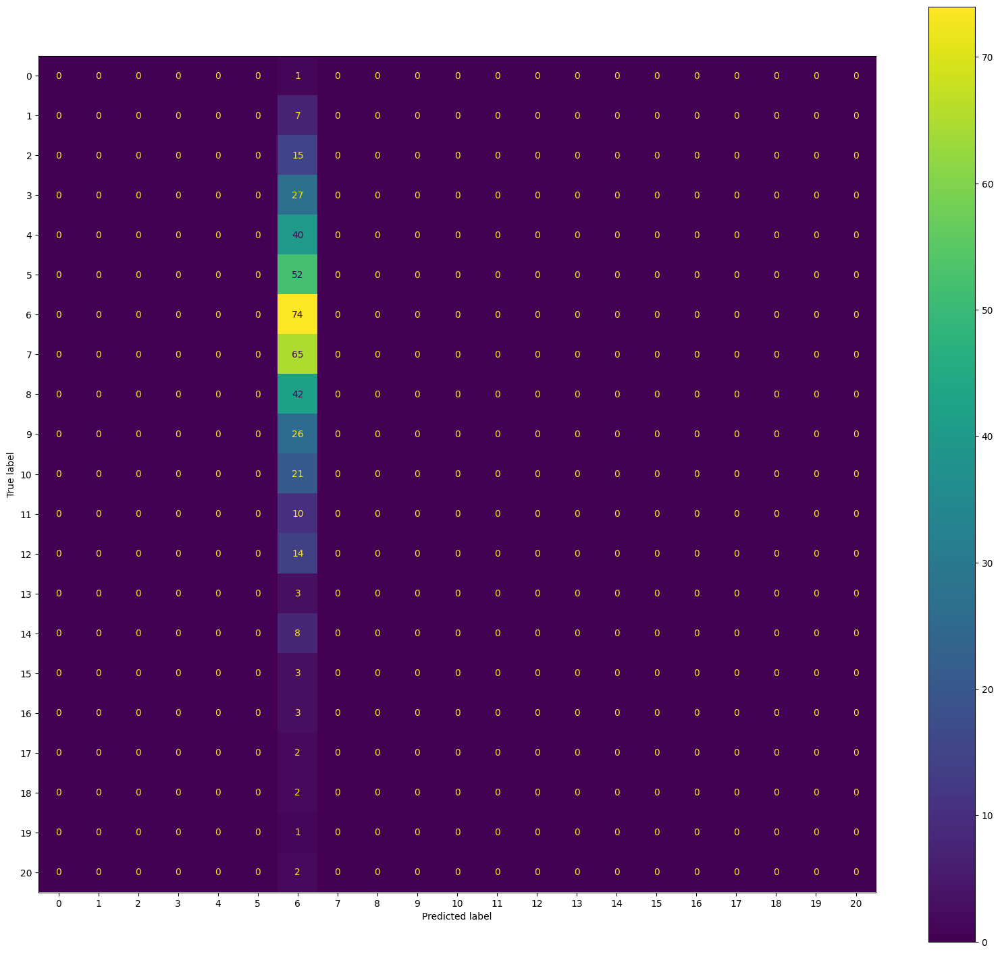

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 3

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        52
           4       0.00      0.00      0.00       105
           5       0.00      0.00      0.00       228
           6       0.00      0.00      0.00       349
           7       0.00      0.00      0.00       510
           8       0.17      1.00      0.29       625
           9       0.50      0.00      0.00       580
          10       0.00      0.00      0.00       428
          11       0.00      0.00      0.00       241
          12       0.00      0.00      0.00       178
          13       0.00      0.00      0.00       113
          14       0.00      0.00      0.00        93
          15       0.00      0.00      0.00        61
          16       0.00      0.00      0.00        54
          17       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


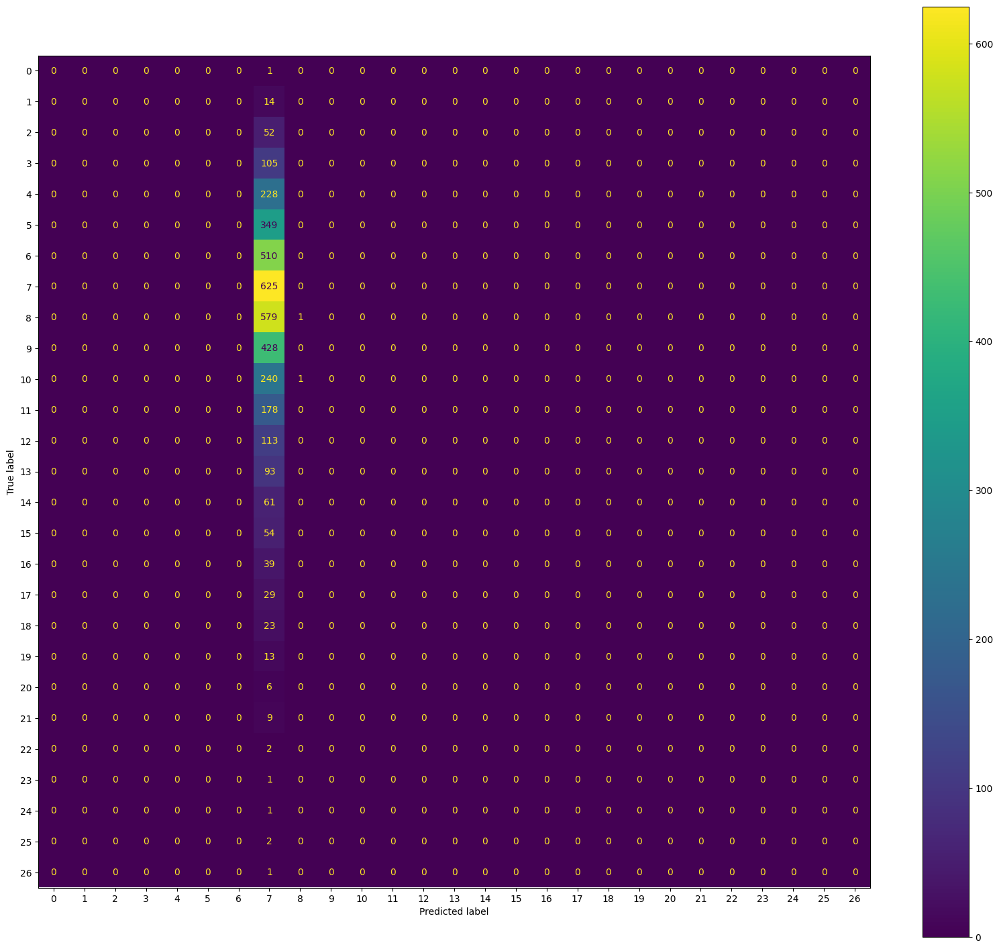

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        31
           6       0.00      0.00      0.00        42
           7       0.00      0.00      0.00        58
           8       0.15      1.00      0.27        64
           9       0.00      0.00      0.00        54
          10       0.00      0.00      0.00        59
          11       0.00      0.00      0.00        26
          12       0.00      0.00      0.00        25
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00         9
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         3
          18       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


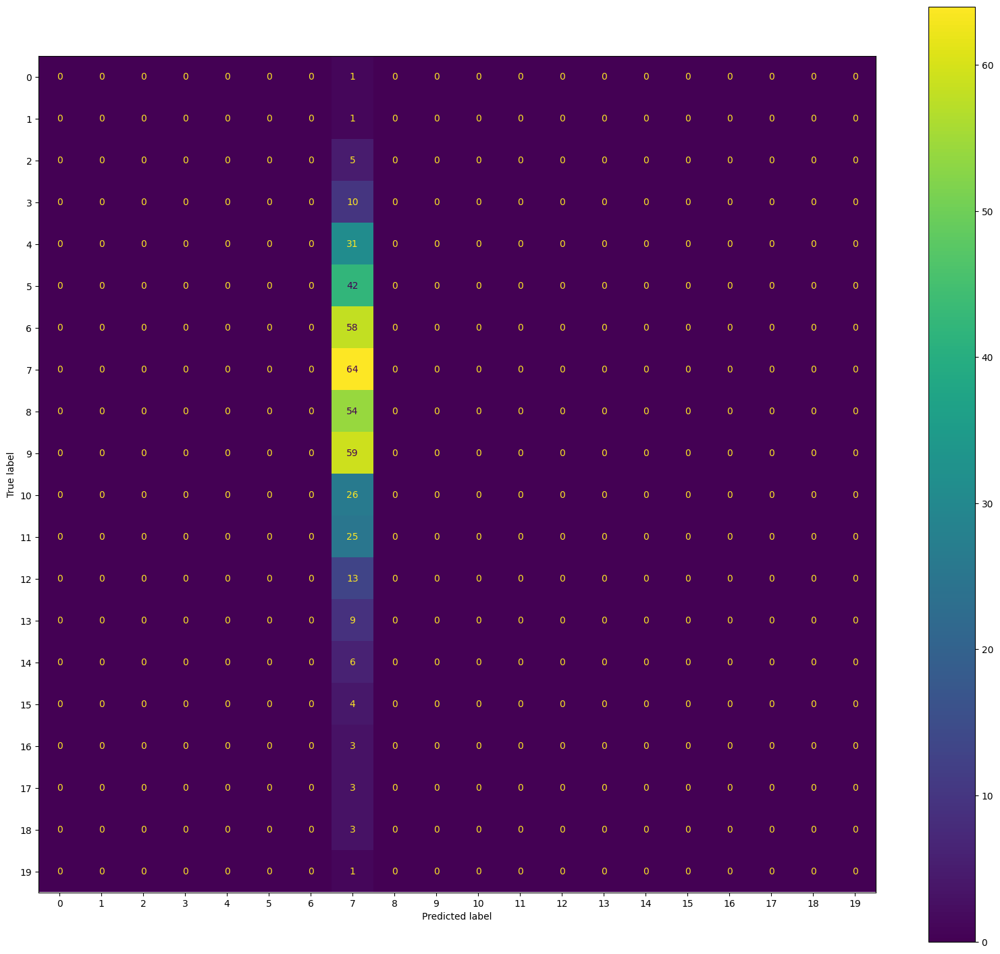

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 4

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00        51
           4       0.00      0.00      0.00       107
           5       0.00      0.00      0.00       237
           6       0.00      0.00      0.00       361
           7       0.00      0.00      0.00       513
           8       0.16      1.00      0.28       619
           9       0.00      0.00      0.00       573
          10       0.00      0.00      0.00       429
          11       0.00      0.00      0.00       243
          12       0.00      0.00      0.00       178
          13       0.00      0.00      0.00       114
          14       0.00      0.00      0.00        91
          15       0.00      0.00      0.00        58
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


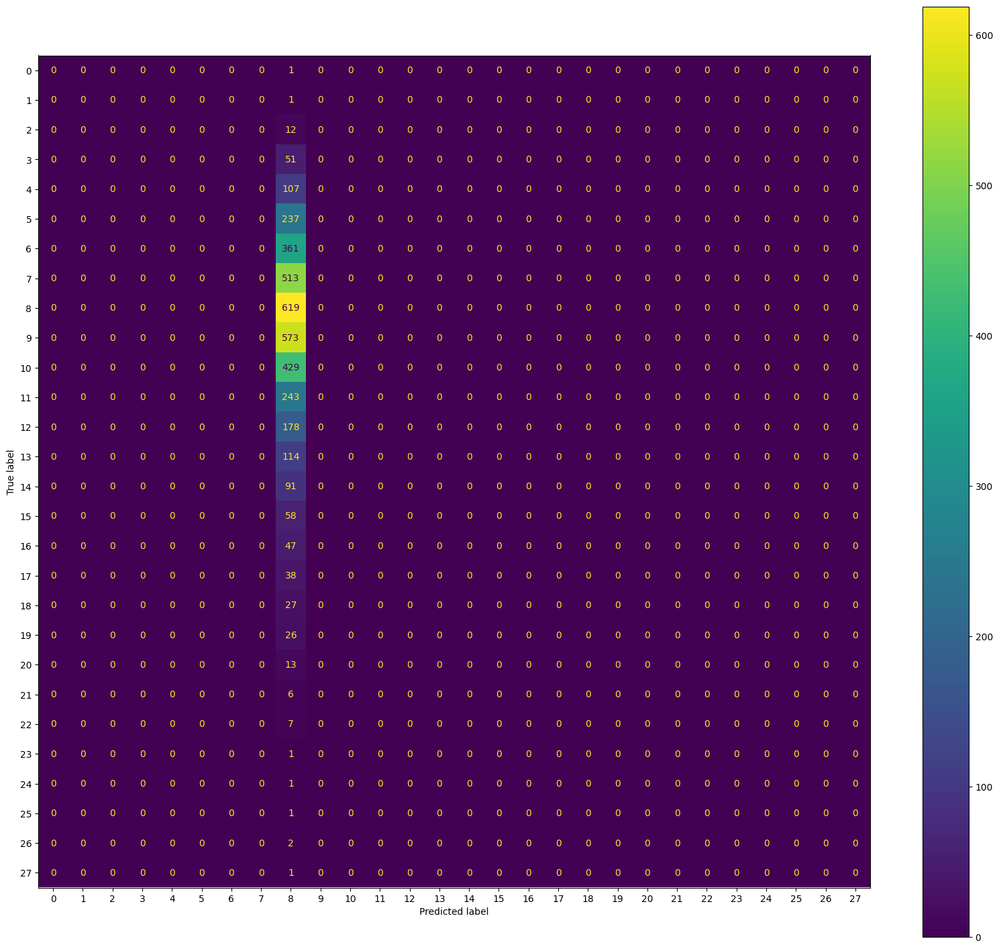

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00         8
           5       0.00      0.00      0.00        22
           6       0.00      0.00      0.00        30
           7       0.00      0.00      0.00        55
           8       0.17      1.00      0.29        70
           9       0.00      0.00      0.00        61
          10       0.00      0.00      0.00        58
          11       0.00      0.00      0.00        24
          12       0.00      0.00      0.00        25
          13       0.00      0.00      0.00        12
          14       0.00      0.00      0.00        11
          15       0.00      0.00      0.00         9
          16       0.00      0.00      0.00        11
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         5
          20       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


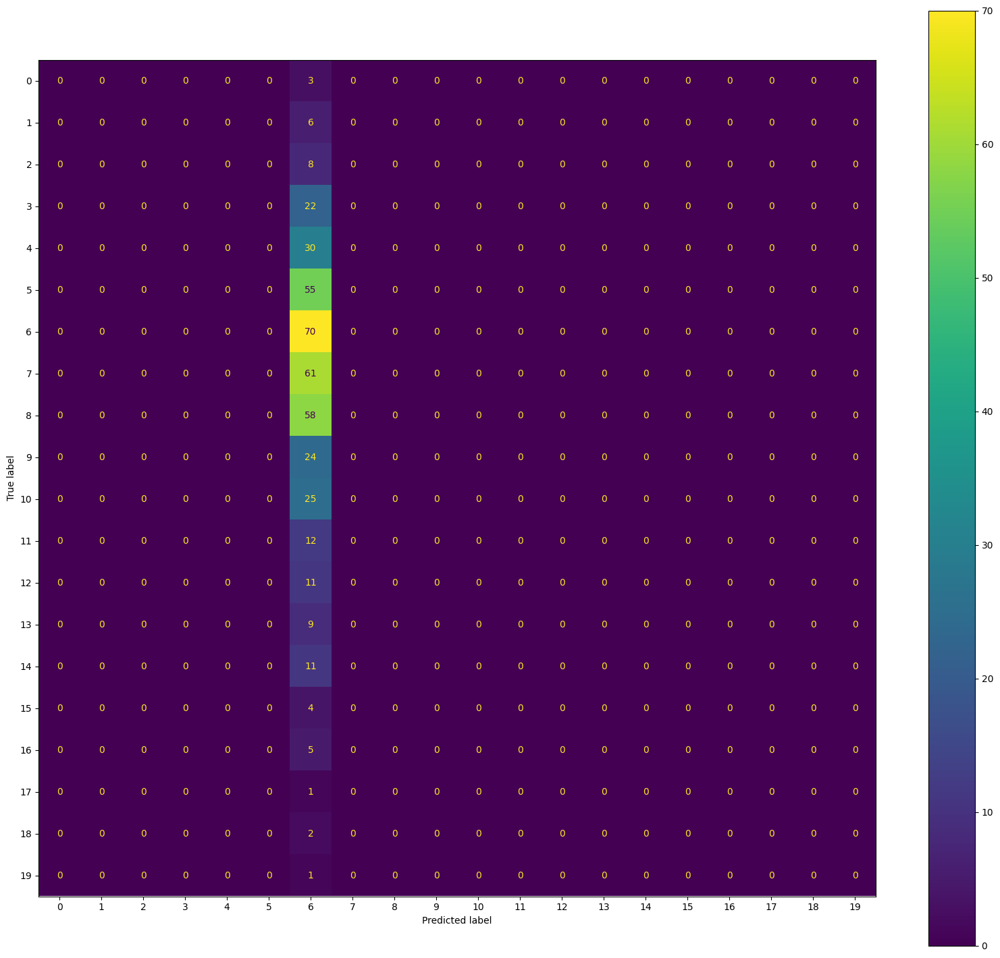

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 5

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.00      0.00      0.00        53
           4       0.00      0.00      0.00       105
           5       0.00      0.00      0.00       235
           6       0.00      0.00      0.00       349
           7       0.00      0.00      0.00       509
           8       0.17      1.00      0.28       621
           9       0.00      0.00      0.00       576
          10       0.00      0.00      0.00       435
          11       0.00      0.00      0.00       239
          12       0.00      0.00      0.00       184
          13       0.00      0.00      0.00       115
          14       0.00      0.00      0.00        93
          15       0.00      0.00      0.00        58
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


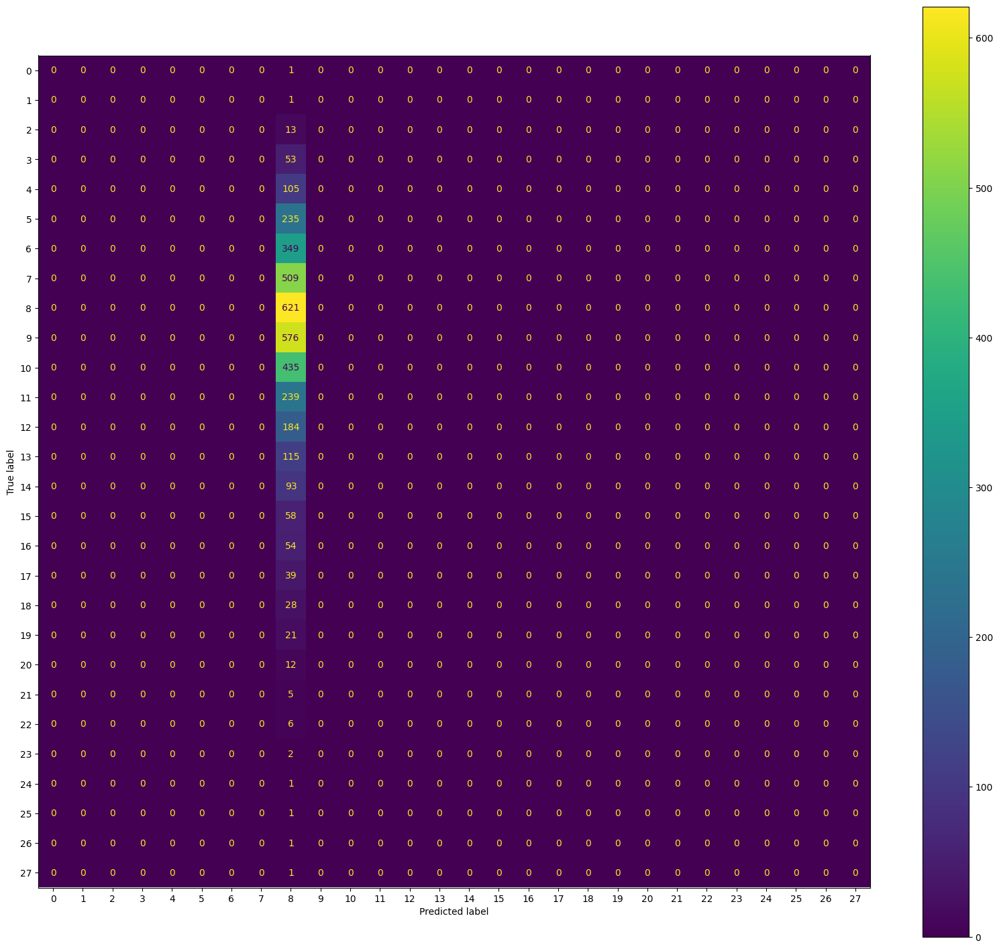

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         4
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        24
           6       0.00      0.00      0.00        42
           7       0.00      0.00      0.00        59
           8       0.16      1.00      0.28        68
           9       0.00      0.00      0.00        58
          10       0.00      0.00      0.00        52
          11       0.00      0.00      0.00        28
          12       0.00      0.00      0.00        19
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00         9
          15       0.00      0.00      0.00         9
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         4
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


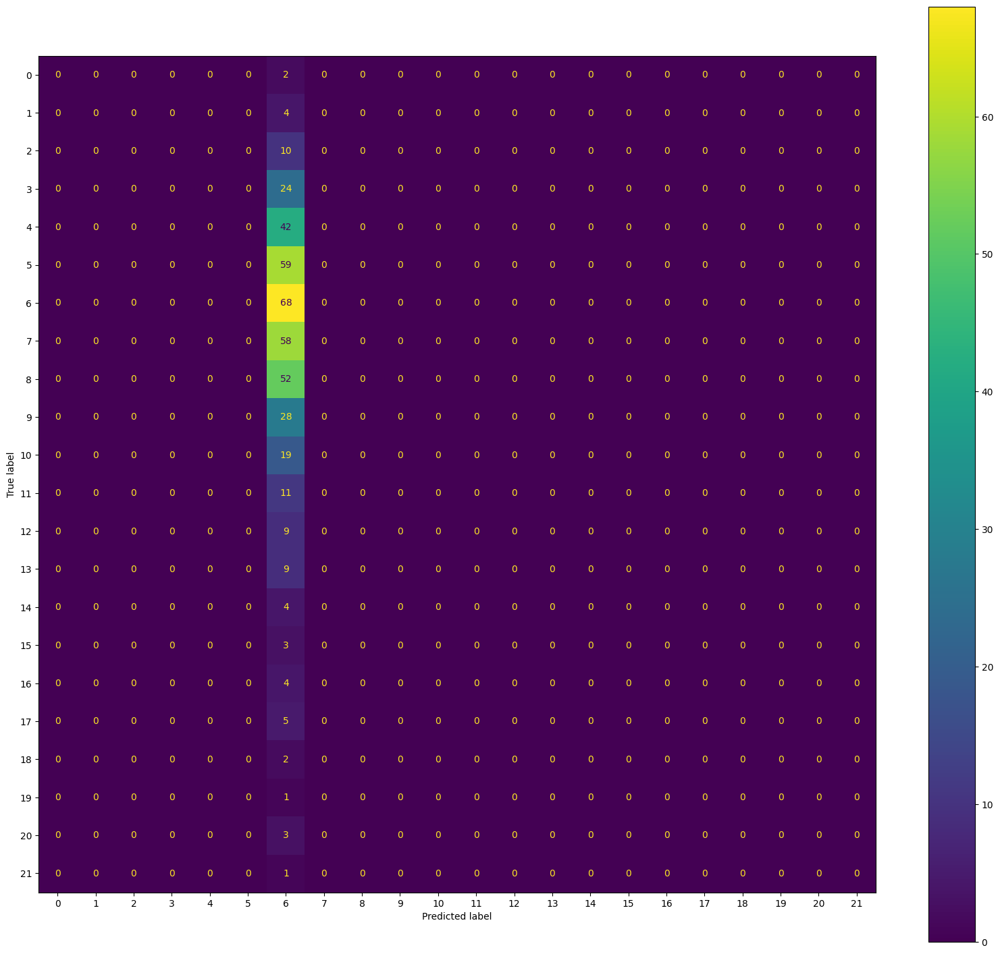

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 6

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00        49
           4       0.00      0.00      0.00       100
           5       0.00      0.00      0.00       235
           6       0.00      0.00      0.00       354
           7       0.00      0.00      0.00       516
           8       0.16      1.00      0.28       620
           9       0.00      0.00      0.00       569
          10       0.00      0.00      0.00       434
          11       0.00      0.00      0.00       239
          12       0.00      0.00      0.00       186
          13       0.00      0.00      0.00       110
          14       0.00      0.00      0.00        93
          15       0.00      0.00      0.00        63
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


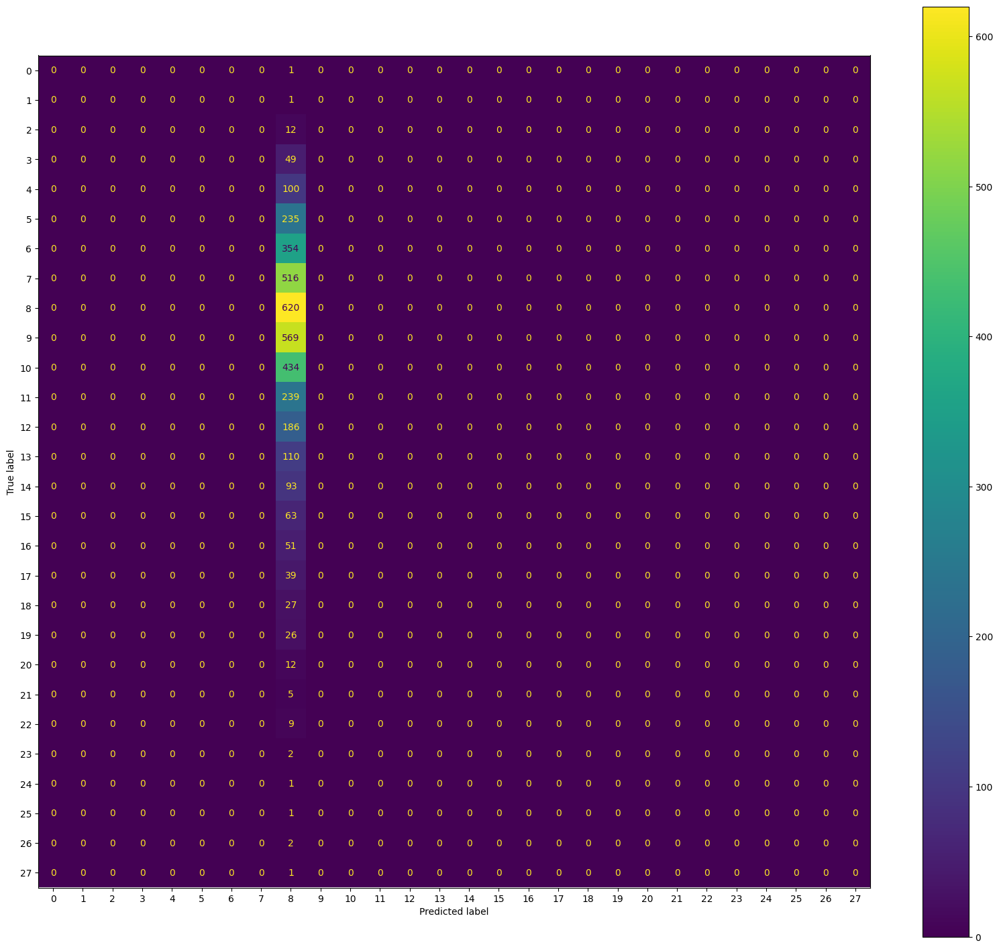

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00        15
           5       0.00      0.00      0.00        24
           6       0.00      0.00      0.00        37
           7       0.00      0.00      0.00        52
           8       0.17      1.00      0.28        69
           9       0.00      0.00      0.00        65
          10       0.00      0.00      0.00        53
          11       0.00      0.00      0.00        28
          12       0.00      0.00      0.00        17
          13       0.00      0.00      0.00        16
          14       0.00      0.00      0.00         9
          15       0.00      0.00      0.00         4
          16       0.00      0.00      0.00         7
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         5
          20       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


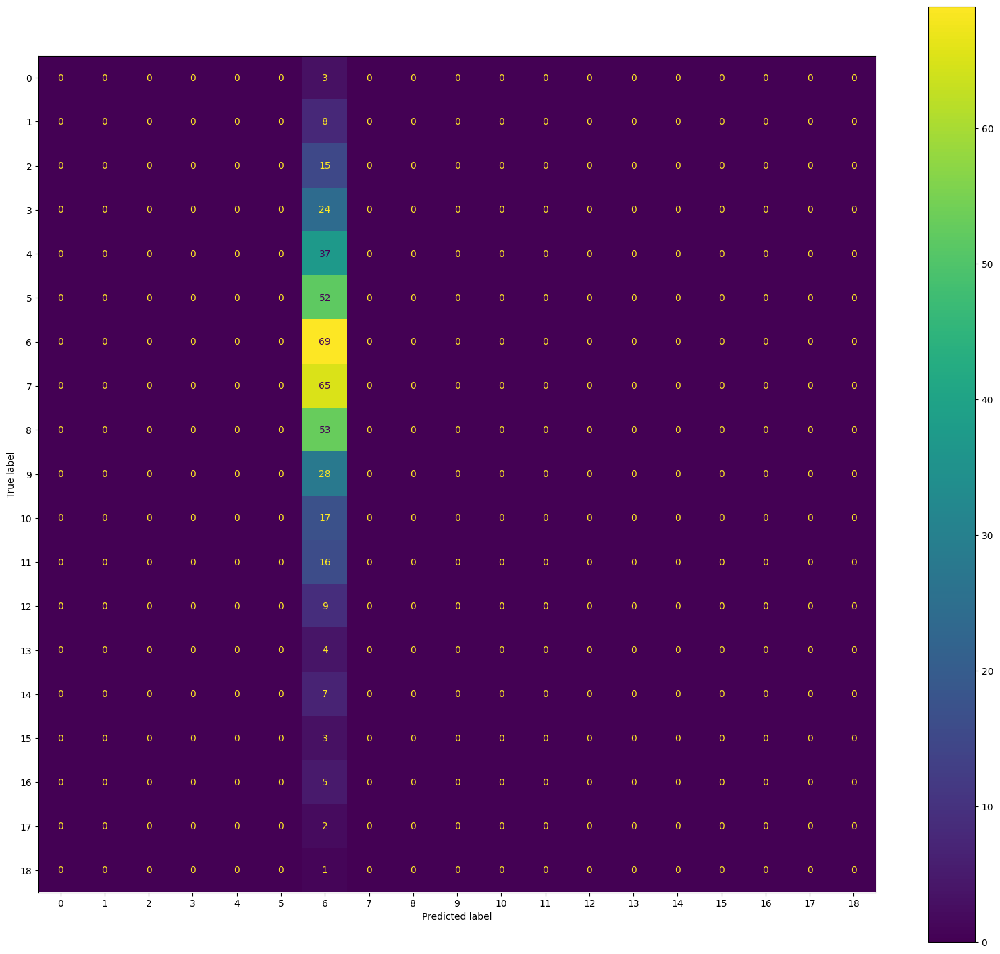

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 7

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.00      0.00      0.00        50
           4       0.00      0.00      0.00       102
           5       0.00      0.00      0.00       239
           6       0.00      0.00      0.00       348
           7       0.00      0.00      0.00       504
           8       0.17      1.00      0.29       632
           9       0.00      0.00      0.00       560
          10       0.00      0.00      0.00       446
          11       0.00      0.00      0.00       241
          12       0.00      0.00      0.00       181
          13       0.00      0.00      0.00       117
          14       0.00      0.00      0.00        90
          15       0.00      0.00      0.00        61
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


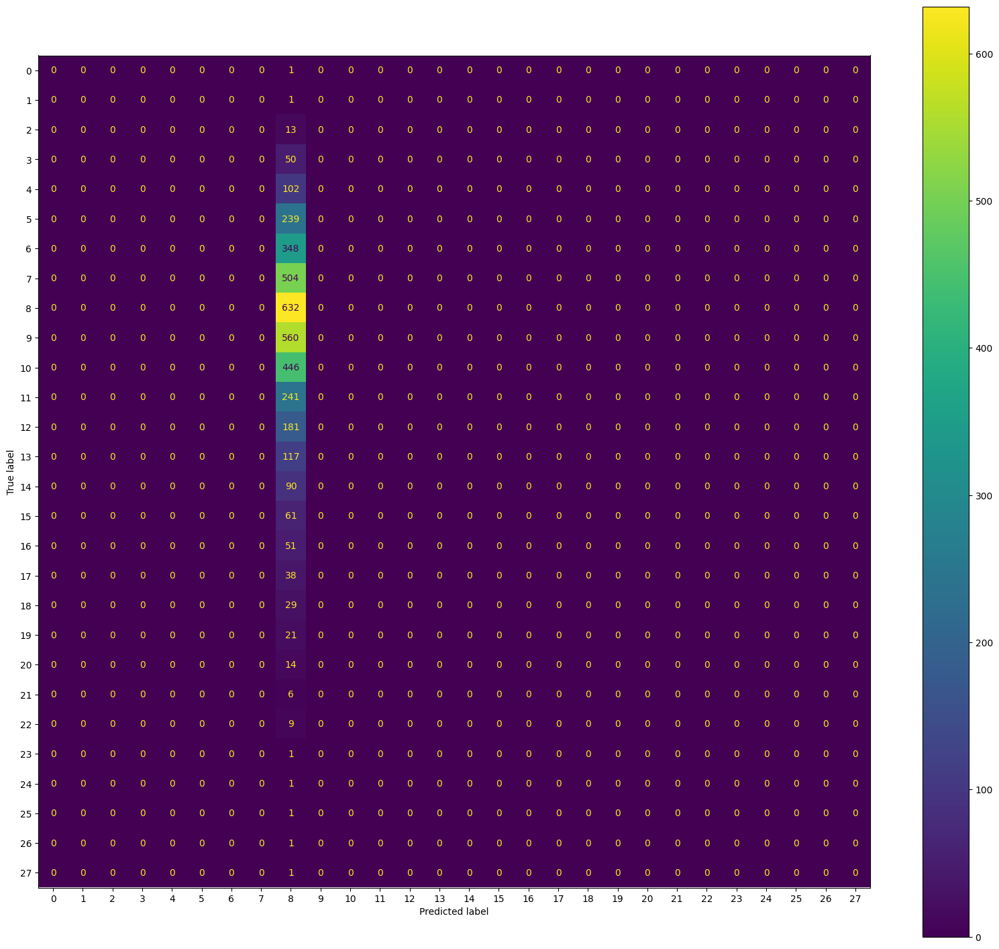

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00        13
           5       0.00      0.00      0.00        20
           6       0.00      0.00      0.00        43
           7       0.00      0.00      0.00        64
           8       0.14      1.00      0.24        57
           9       0.00      0.00      0.00        74
          10       0.00      0.00      0.00        41
          11       0.00      0.00      0.00        26
          12       0.00      0.00      0.00        22
          13       0.00      0.00      0.00         9
          14       0.00      0.00      0.00        12
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         7
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         3
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


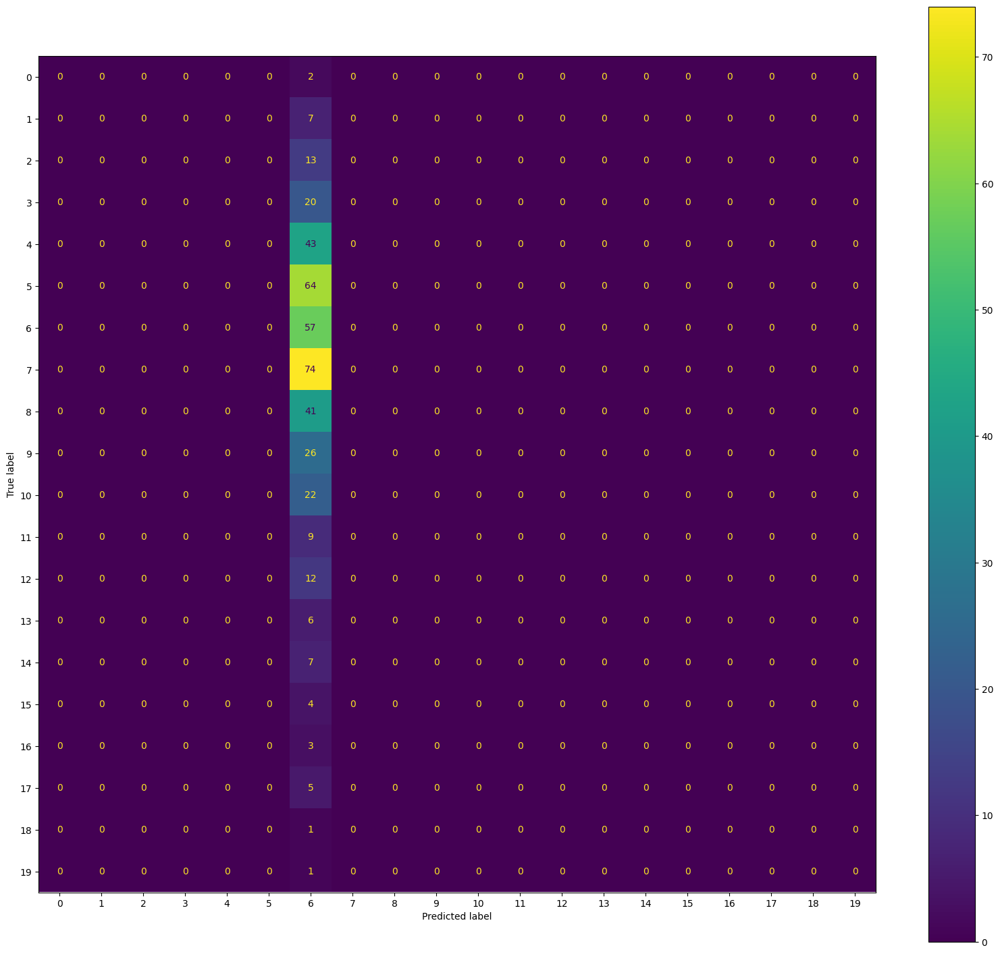

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 8

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        46
           4       0.00      0.00      0.00       107
           5       0.00      0.00      0.00       228
           6       0.00      0.00      0.00       355
           7       0.00      0.00      0.00       507
           8       0.17      1.00      0.29       631
           9       0.00      0.00      0.00       566
          10       0.00      0.00      0.00       437
          11       0.00      0.00      0.00       245
          12       0.00      0.00      0.00       187
          13       0.00      0.00      0.00       116
          14       0.00      0.00      0.00        91
          15       0.00      0.00      0.00        58
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


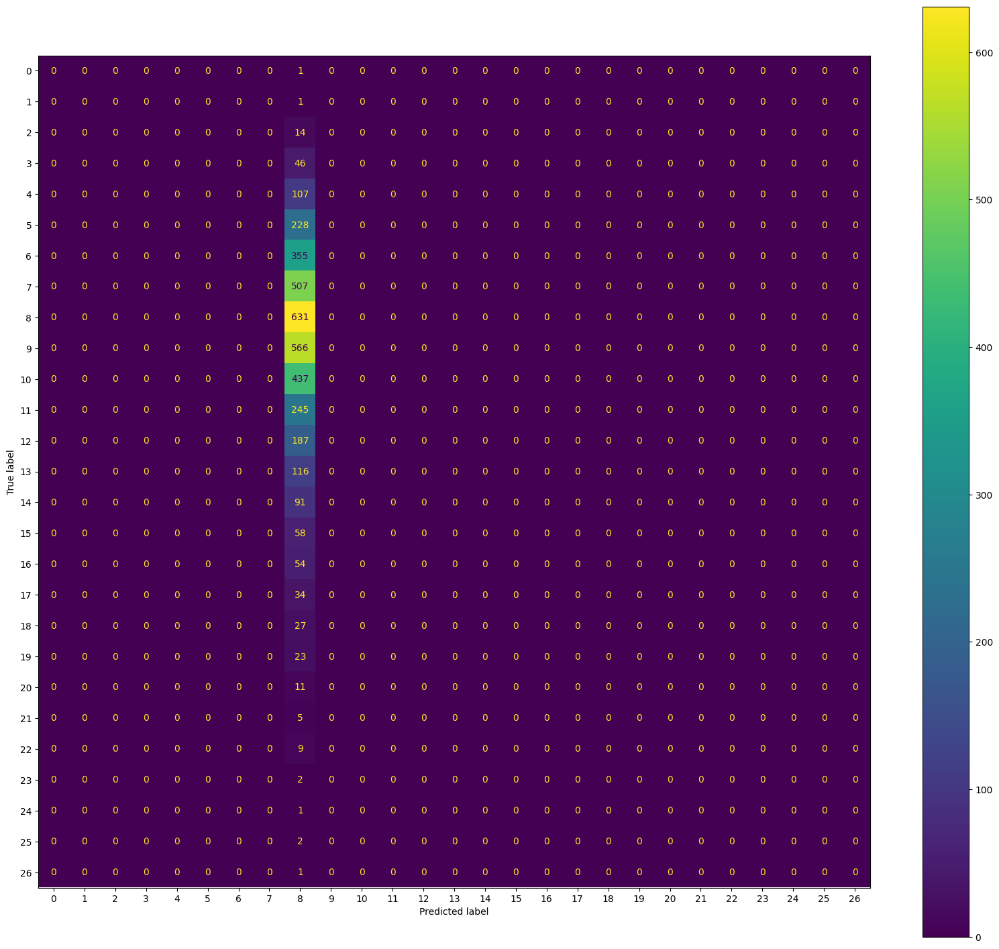

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00        11
           4       0.00      0.00      0.00         8
           5       0.00      0.00      0.00        31
           6       0.00      0.00      0.00        36
           7       0.00      0.00      0.00        61
           8       0.14      1.00      0.24        58
           9       0.00      0.00      0.00        68
          10       0.00      0.00      0.00        50
          11       0.00      0.00      0.00        22
          12       0.00      0.00      0.00        16
          13       0.00      0.00      0.00        10
          14       0.00      0.00      0.00        11
          15       0.00      0.00      0.00         9
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         8
          18       0.00      0.00      0.00         5
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


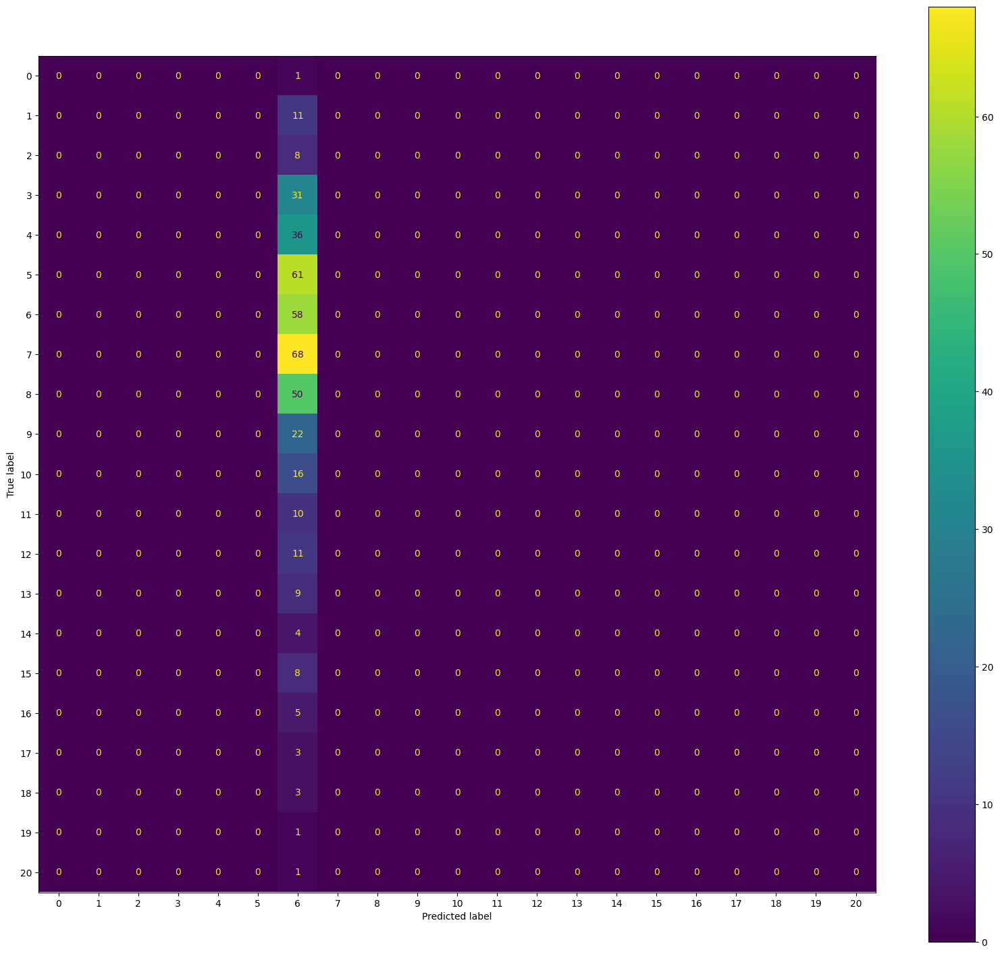

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 9

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.00      0.00      0.00        53
           4       0.00      0.00      0.00       104
           5       0.00      0.00      0.00       228
           6       0.00      0.00      0.00       349
           7       0.00      0.00      0.00       513
           8       0.16      1.00      0.28       617
           9       1.00      0.00      0.00       573
          10       0.00      0.00      0.00       437
          11       0.00      0.00      0.00       237
          12       0.00      0.00      0.00       188
          13       0.00      0.00      0.00       114
          14       0.00      0.00      0.00        90
          15       0.00      0.00      0.00        61
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


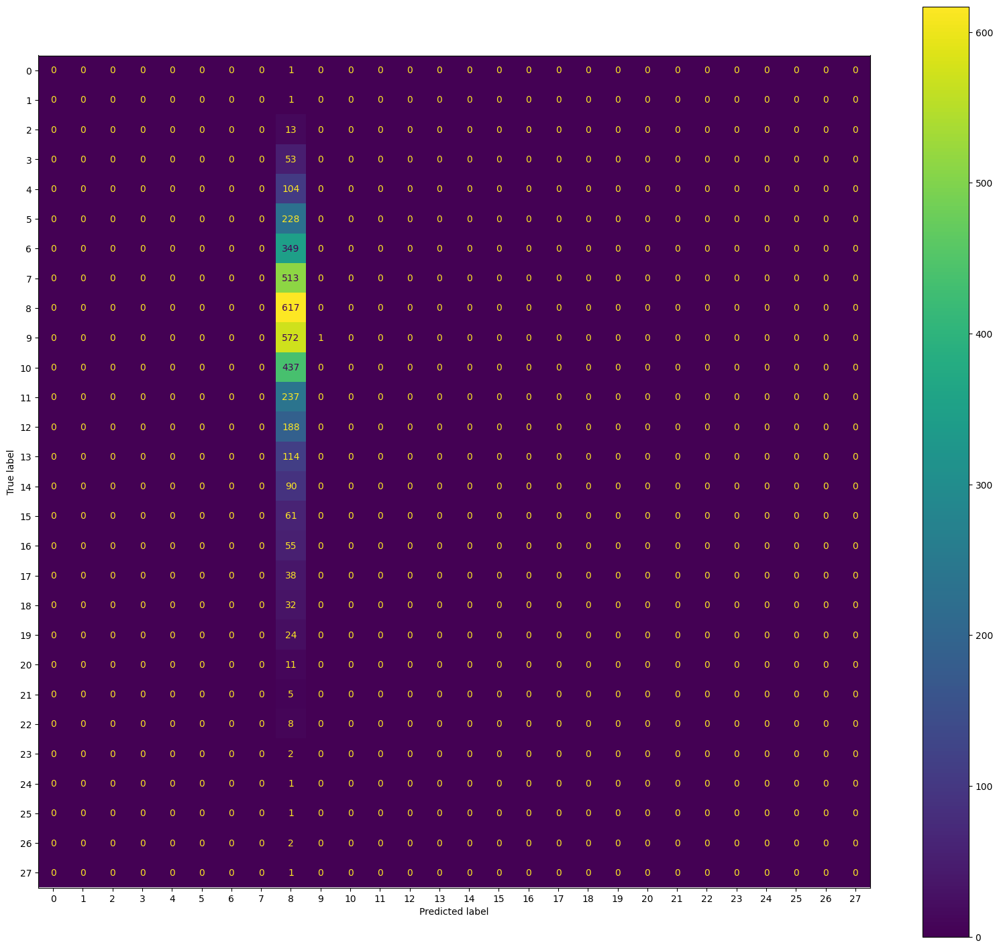

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         4
           4       0.00      0.00      0.00        11
           5       0.00      0.00      0.00        31
           6       0.00      0.00      0.00        42
           7       0.00      0.00      0.00        55
           8       0.17      1.00      0.30        72
           9       0.00      0.00      0.00        61
          10       0.00      0.00      0.00        50
          11       0.00      0.00      0.00        30
          12       0.00      0.00      0.00        15
          13       0.00      0.00      0.00        12
          14       0.00      0.00      0.00        12
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         3
          17       0.00      0.00      0.00         4
          19       0.00      0.00      0.00         2
          20       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


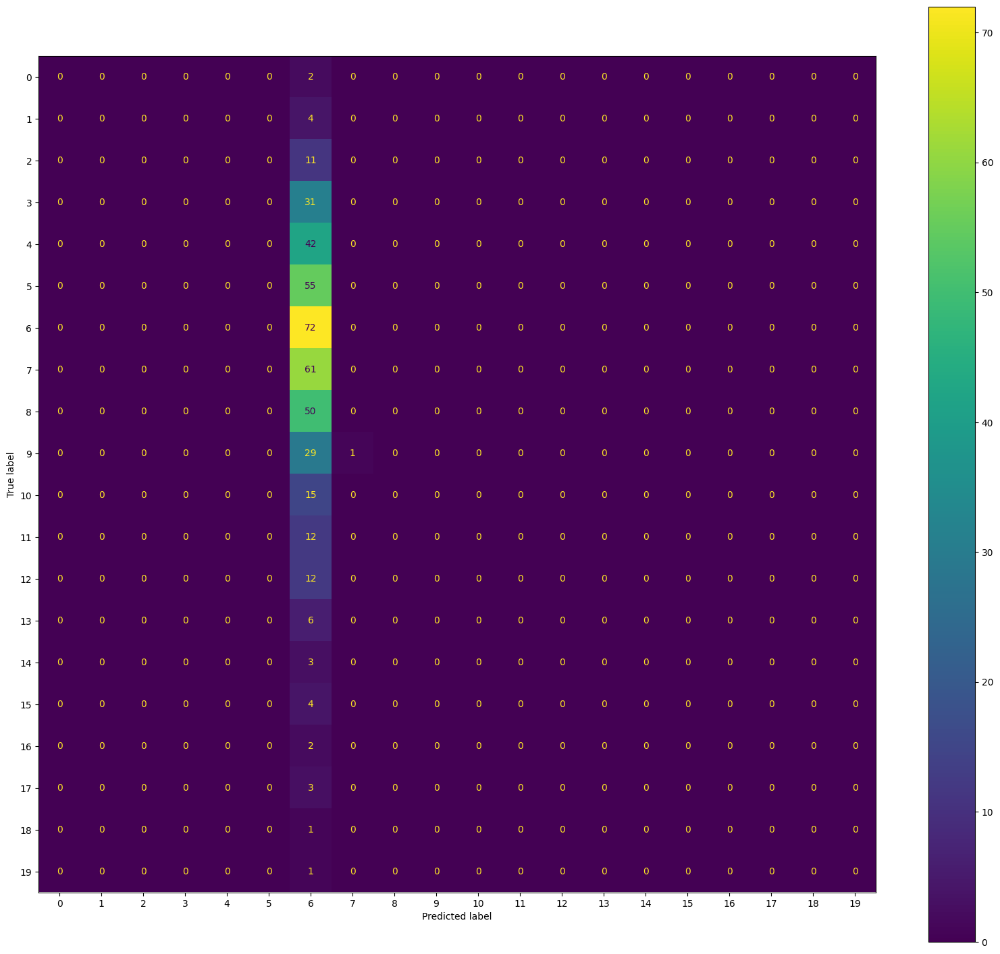

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 10

Train
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.00      0.00      0.00        54
           4       0.00      0.00      0.00       106
           5       0.00      0.00      0.00       237
           6       0.00      0.00      0.00       349
           7       0.00      0.00      0.00       503
           8       0.16      0.68      0.26       605
           9       0.23      0.49      0.31       577
          10       0.00      0.00      0.00       440
          11       0.00      0.00      0.00       239
          12       0.00      0.00      0.00       184
          13       0.00      0.00      0.00       115
          14       0.00      0.00      0.00        95
          15       0.00      0.00      0.00        59
          16       0.00      0.00      0.00        54
          17       0.00      0.00 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


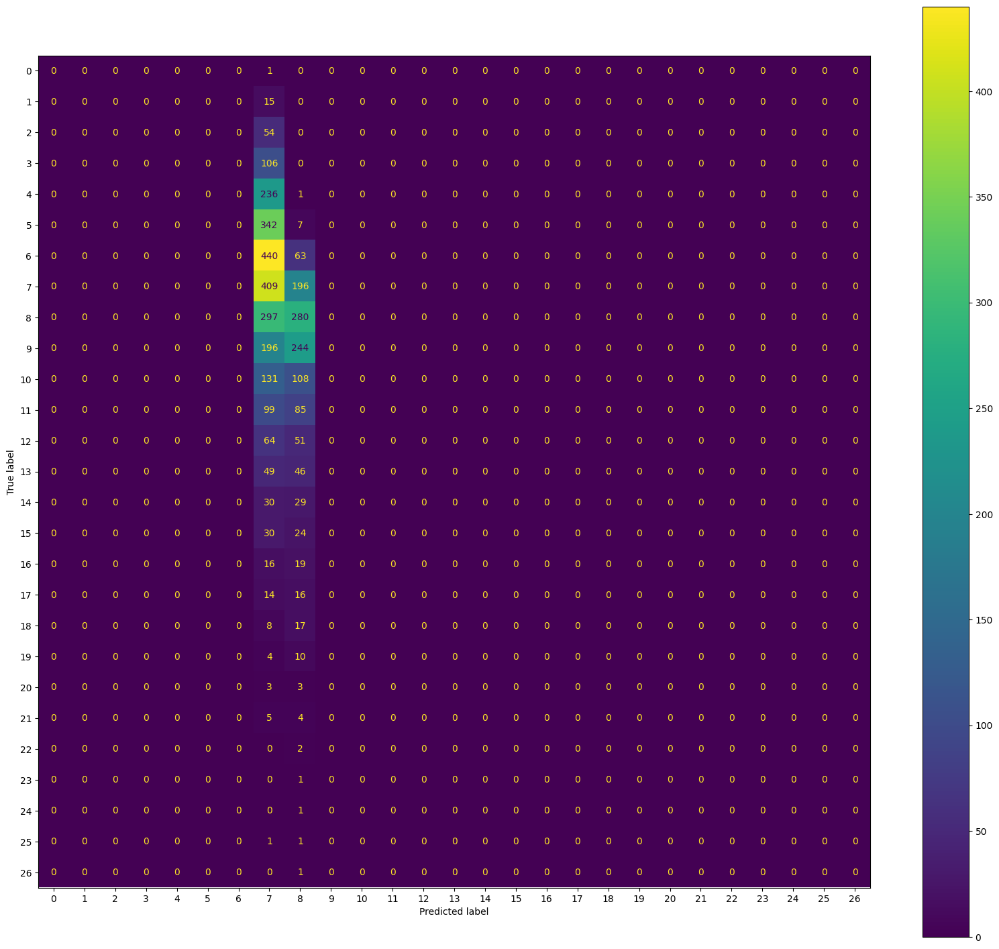

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         9
           5       0.00      0.00      0.00        22
           6       0.00      0.00      0.00        42
           7       0.00      0.00      0.00        65
           8       0.19      0.62      0.29        84
           9       0.19      0.46      0.27        57
          10       0.00      0.00      0.00        47
          11       0.00      0.00      0.00        28
          12       0.00      0.00      0.00        19
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00         7
          15       0.00      0.00      0.00         8
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         7
          18       0.00      0.00      0.00         2
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


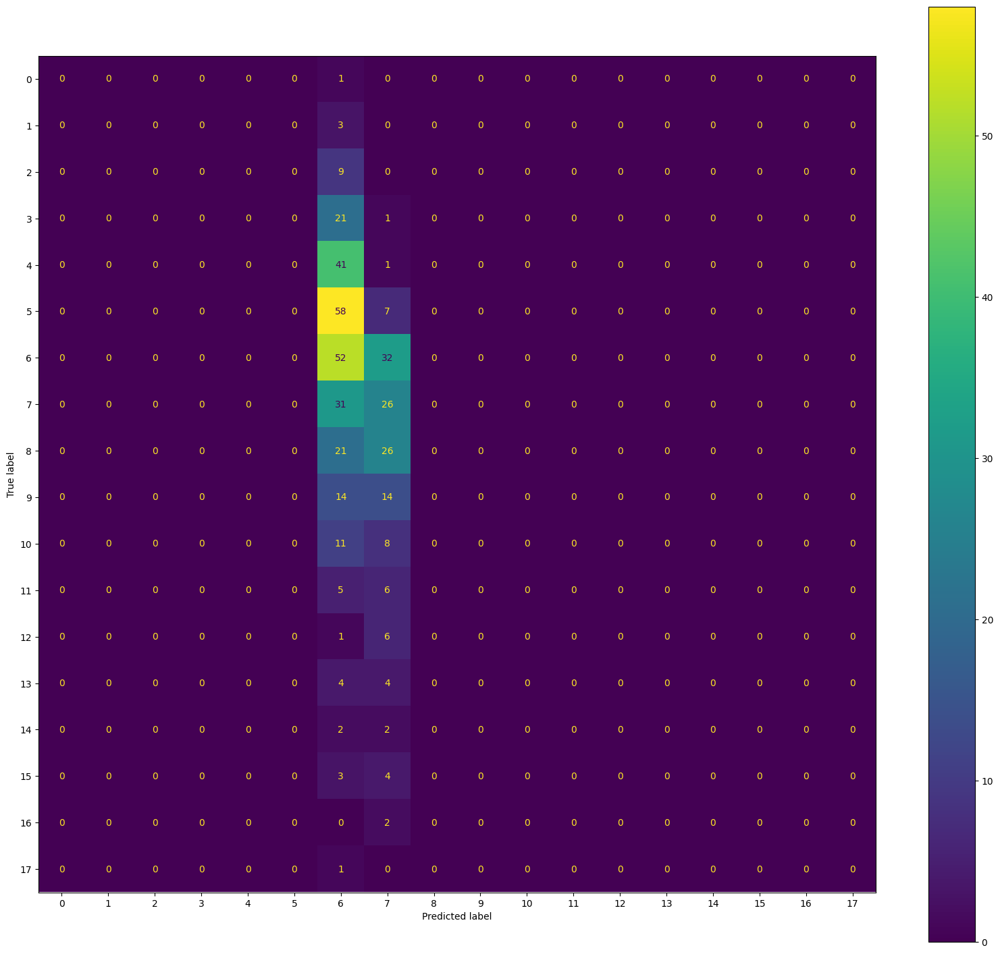

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Average of Acuuracies 0.16


0.16

In [ ]:
alpha = 100
Run2(NB2,X2,y2,alpha)

Fold 1

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00        47
           4       0.00      0.00      0.00       107
           5       0.00      0.00      0.00       227
           6       0.00      0.00      0.00       346
           7       0.00      0.00      0.00       514
           8       0.17      1.00      0.29       630
           9       0.00      0.00      0.00       580
          10       0.00      0.00      0.00       433
          11       0.00      0.00      0.00       233
          12       0.00      0.00      0.00       182
          13       0.00      0.00      0.00       111
          14       0.00      0.00      0.00        94
          15       0.00      0.00      0.00        61
          16       0.00      0.00      0.00        51
          17 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


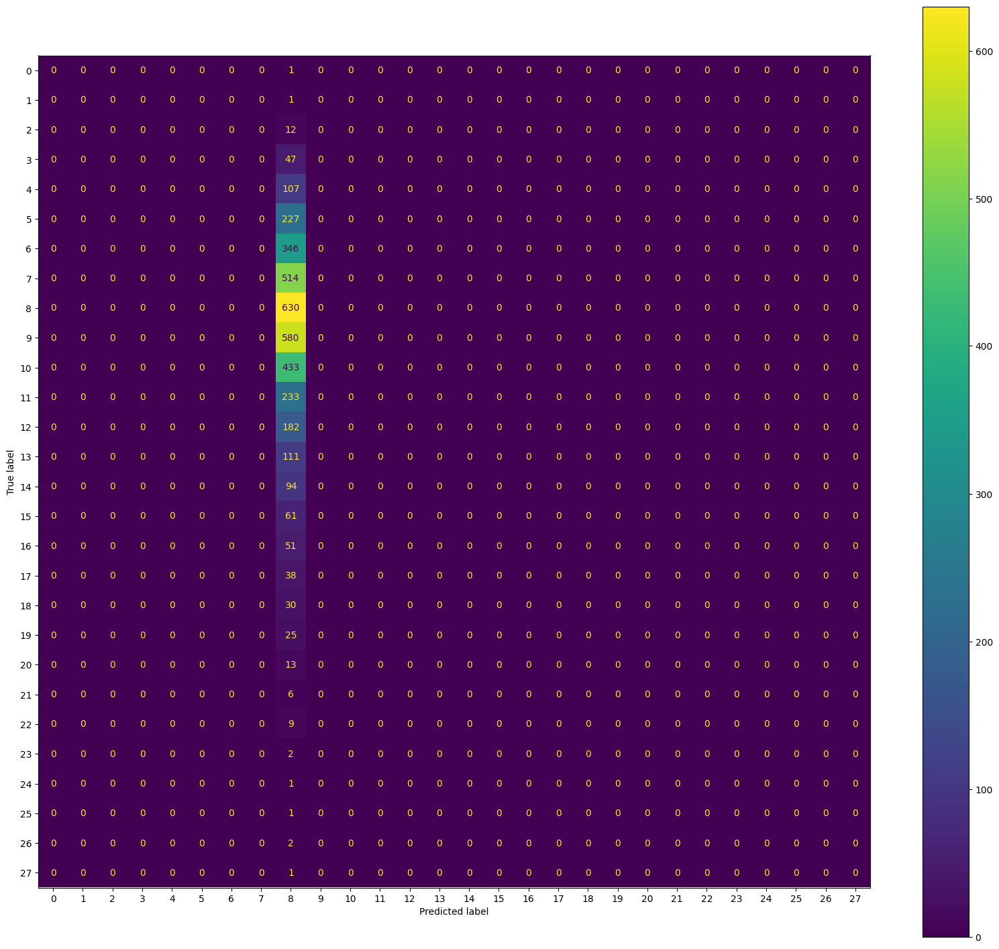

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00        10
           4       0.00      0.00      0.00         8
           5       0.00      0.00      0.00        32
           6       0.00      0.00      0.00        45
           7       0.00      0.00      0.00        54
           8       0.14      1.00      0.25        59
           9       0.00      0.00      0.00        54
          10       0.00      0.00      0.00        54
          11       0.00      0.00      0.00        34
          12       0.00      0.00      0.00        21
          13       0.00      0.00      0.00        15
          14       0.00      0.00      0.00         8
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         7
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         2
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


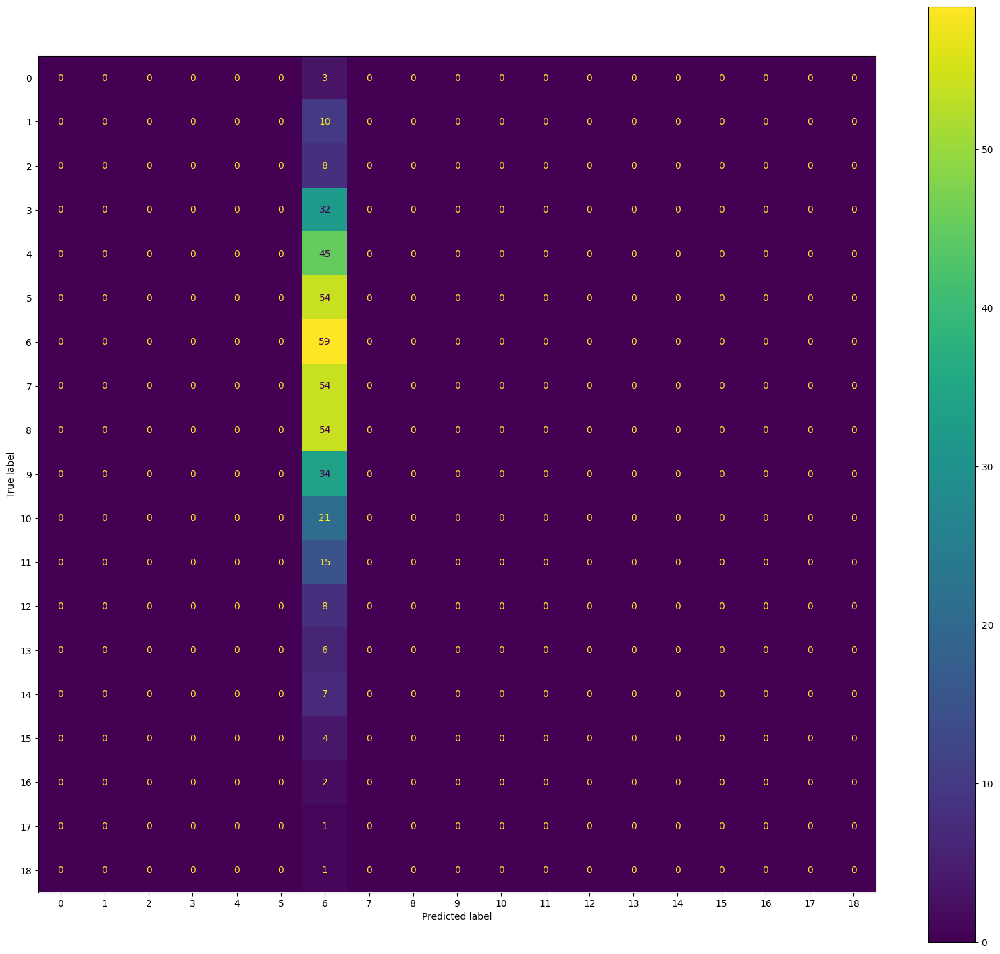

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 2

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        53
           4       0.00      0.00      0.00       102
           5       0.00      0.00      0.00       234
           6       0.00      0.00      0.00       347
           7       0.00      0.00      0.00       509
           8       0.17      1.00      0.29       627
           9       0.00      0.00      0.00       566
          10       0.00      0.00      0.00       440
          11       0.00      0.00      0.00       241
          12       0.00      0.00      0.00       178
          13       0.00      0.00      0.00       114
          14       0.00      0.00      0.00        91
          15       0.00      0.00      0.00        60
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


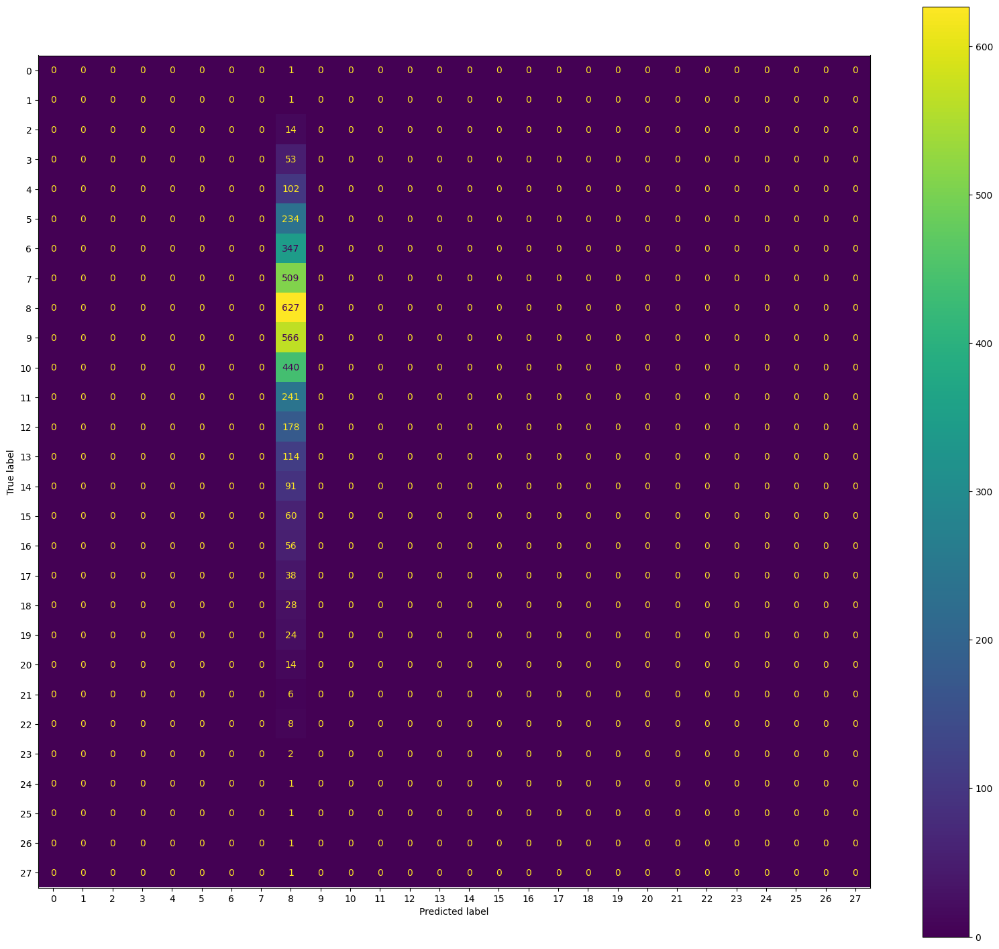

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         4
           4       0.00      0.00      0.00        13
           5       0.00      0.00      0.00        25
           6       0.00      0.00      0.00        44
           7       0.00      0.00      0.00        59
           8       0.15      1.00      0.26        62
           9       0.00      0.00      0.00        68
          10       0.00      0.00      0.00        47
          11       0.00      0.00      0.00        26
          12       0.00      0.00      0.00        25
          13       0.00      0.00      0.00        12
          14       0.00      0.00      0.00        11
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         2
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         4
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


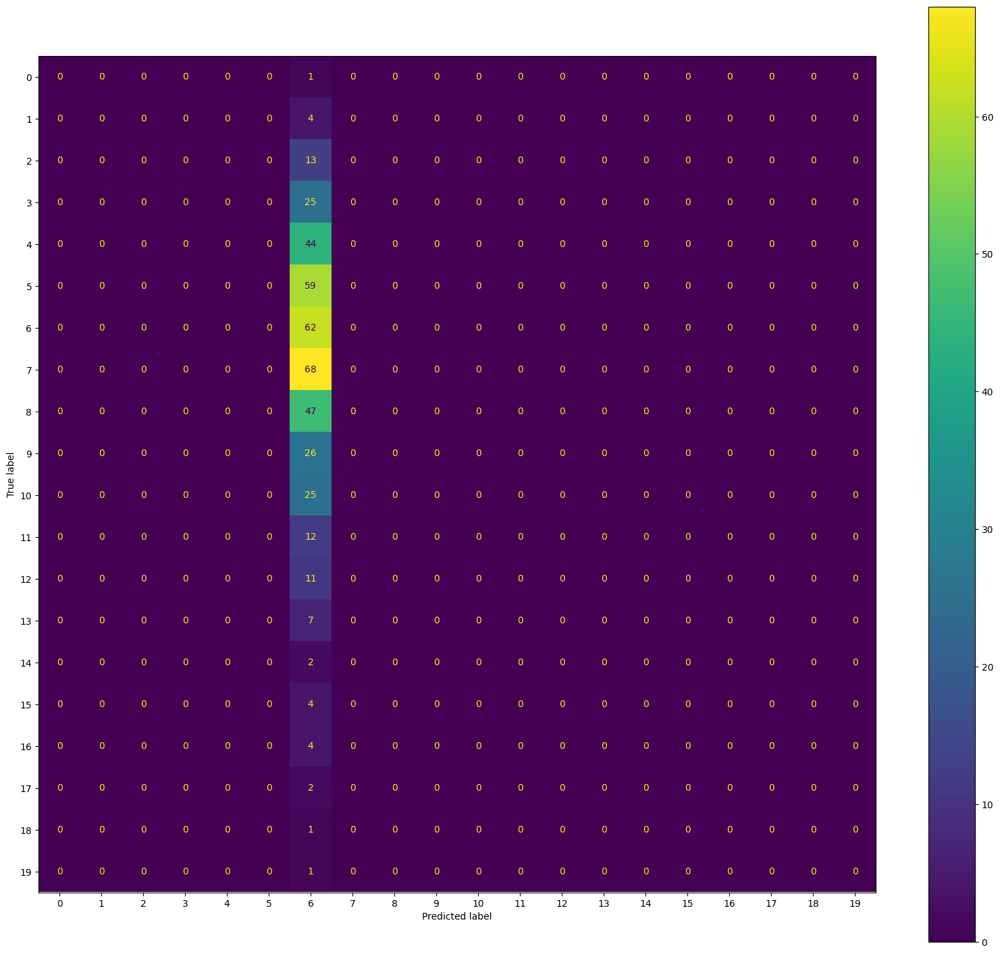

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 3

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.00      0.00      0.00        50
           4       0.00      0.00      0.00       103
           5       0.00      0.00      0.00       235
           6       0.00      0.00      0.00       349
           7       0.00      0.00      0.00       507
           8       0.16      0.66      0.26       610
           9       0.23      0.49      0.32       585
          10       0.00      0.00      0.00       437
          11       0.00      0.00      0.00       240
          12       0.00      0.00      0.00       179
          13       0.00      0.00      0.00       120
          14       0.00      0.00      0.00        96
          15       0.00      0.00      0.00        60
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


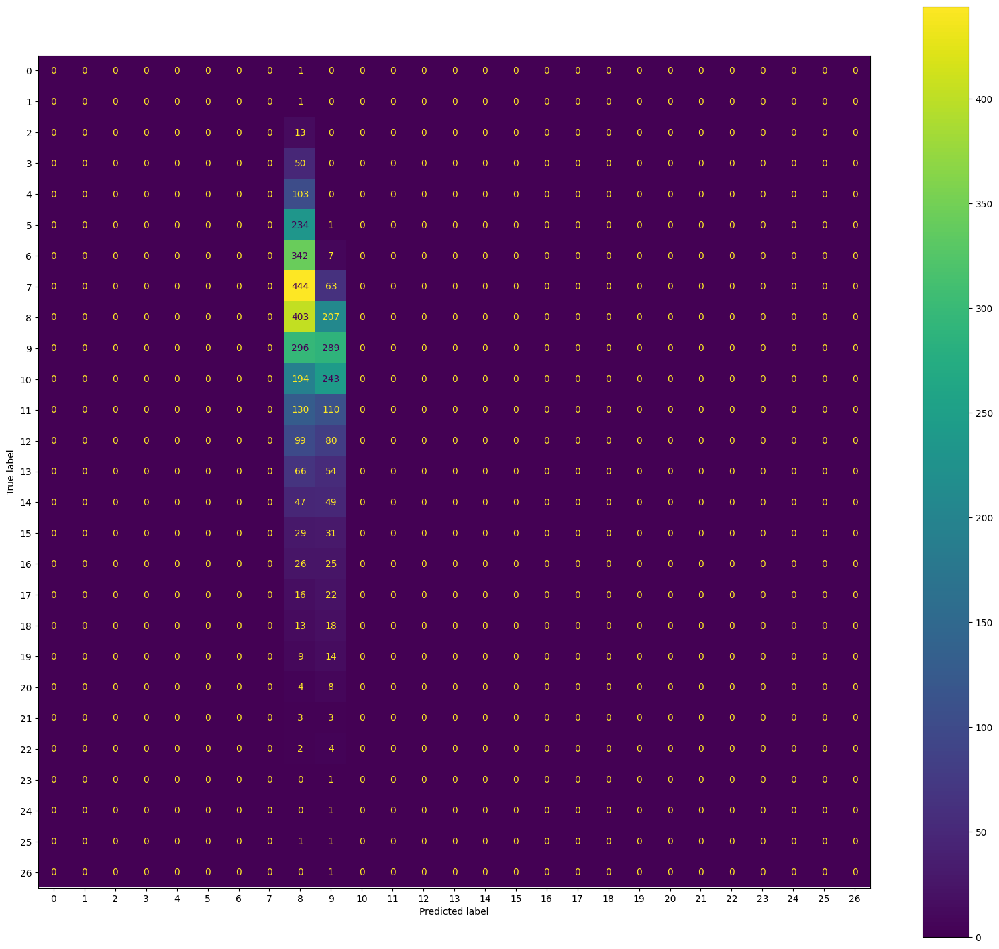

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00        12
           5       0.00      0.00      0.00        24
           6       0.00      0.00      0.00        42
           7       0.00      0.00      0.00        61
           8       0.19      0.73      0.30        79
           9       0.15      0.35      0.21        49
          10       0.00      0.00      0.00        50
          11       0.00      0.00      0.00        27
          12       0.00      0.00      0.00        24
          13       0.00      0.00      0.00         6
          14       0.00      0.00      0.00         6
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         7
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         1
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


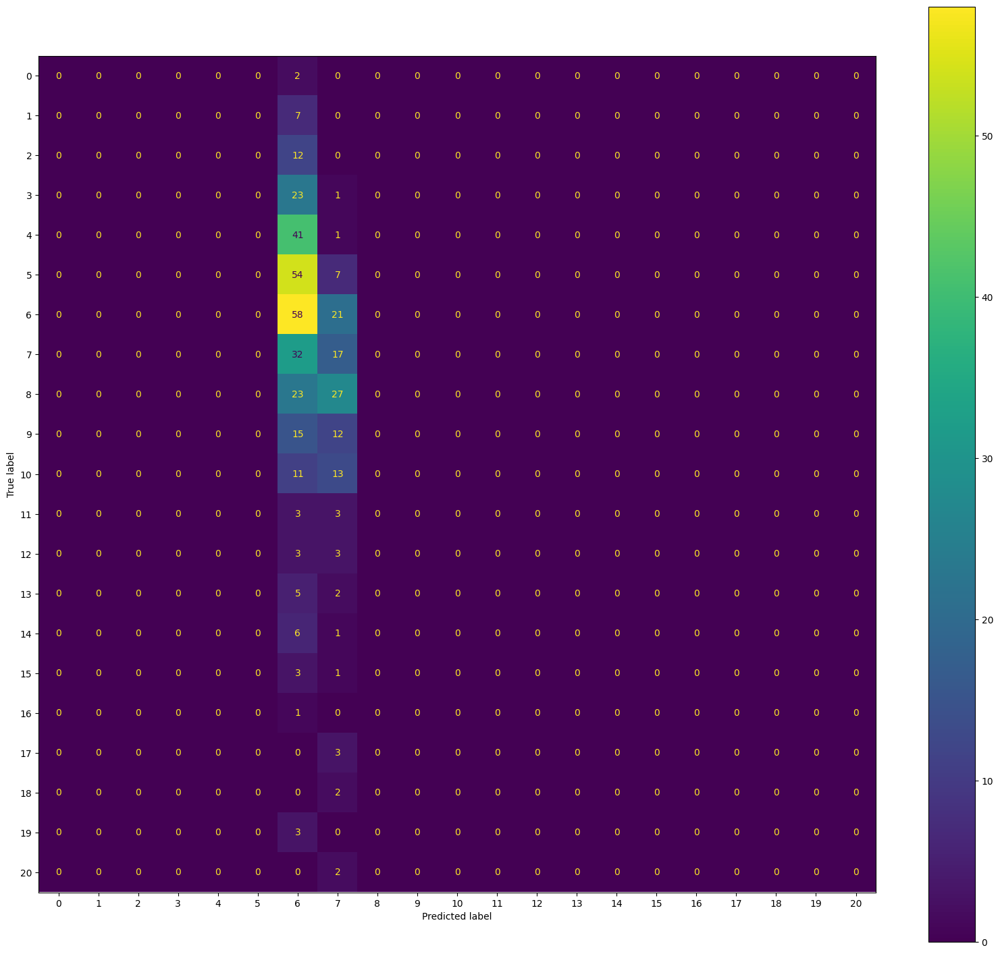

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 4

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        53
           4       0.00      0.00      0.00       104
           5       0.00      0.00      0.00       235
           6       0.00      0.00      0.00       358
           7       0.00      0.00      0.00       509
           8       0.16      1.00      0.28       615
           9       0.00      0.00      0.00       574
          10       0.00      0.00      0.00       442
          11       0.00      0.00      0.00       240
          12       0.00      0.00      0.00       181
          13       0.00      0.00      0.00       113
          14       0.00      0.00      0.00        90
          15       0.00      0.00      0.00        57
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


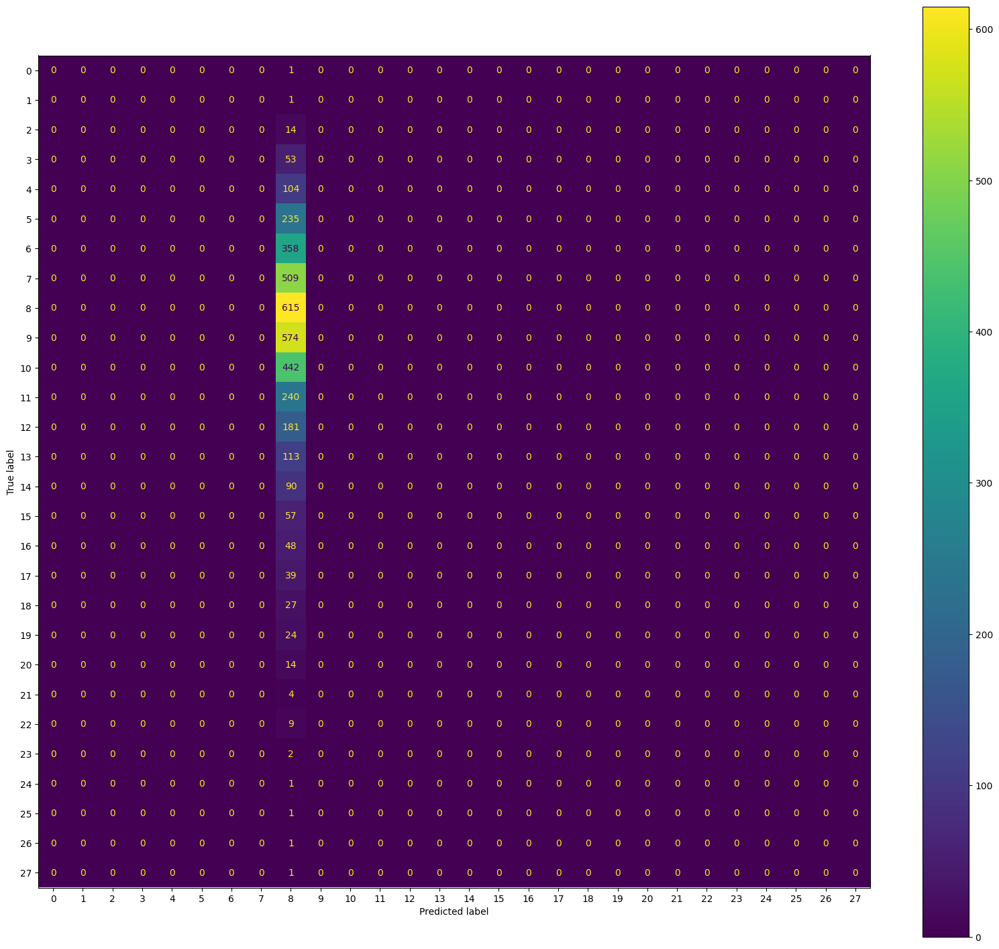

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         4
           4       0.00      0.00      0.00        11
           5       0.00      0.00      0.00        24
           6       0.00      0.00      0.00        33
           7       0.00      0.00      0.00        59
           8       0.18      1.00      0.30        74
           9       0.00      0.00      0.00        60
          10       0.00      0.00      0.00        45
          11       0.00      0.00      0.00        27
          12       0.00      0.00      0.00        22
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00        12
          15       0.00      0.00      0.00        10
          16       0.00      0.00      0.00        10
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         5
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


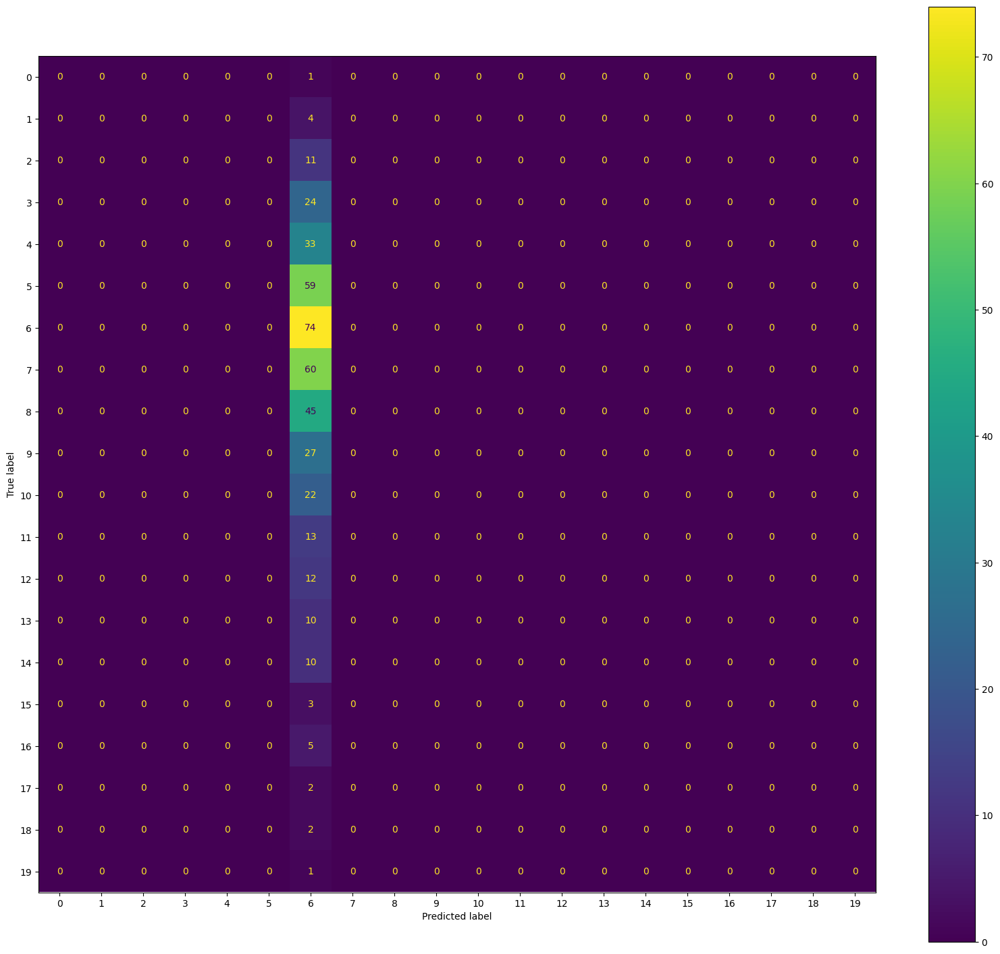

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 5

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.00      0.00      0.00        48
           4       0.00      0.00      0.00       102
           5       0.00      0.00      0.00       233
           6       0.00      0.00      0.00       358
           7       0.00      0.00      0.00       515
           8       0.16      1.00      0.28       620
           9       0.00      0.00      0.00       560
          10       0.00      0.00      0.00       436
          11       0.00      0.00      0.00       243
          12       0.00      0.00      0.00       185
          13       0.00      0.00      0.00       115
          14       0.00      0.00      0.00        99
          15       0.00      0.00      0.00        56
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


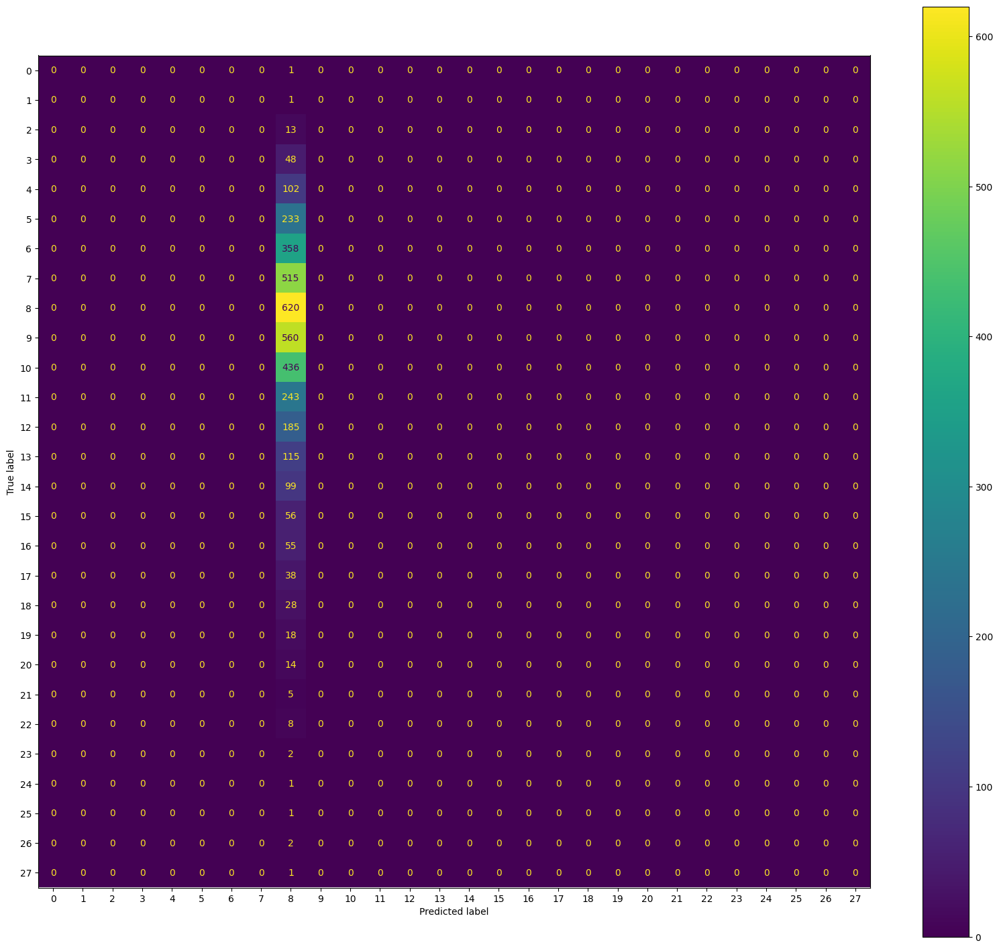

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00        13
           5       0.00      0.00      0.00        26
           6       0.00      0.00      0.00        33
           7       0.00      0.00      0.00        53
           8       0.17      1.00      0.28        69
           9       0.00      0.00      0.00        74
          10       0.00      0.00      0.00        51
          11       0.00      0.00      0.00        24
          12       0.00      0.00      0.00        18
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00         3
          15       0.00      0.00      0.00        11
          16       0.00      0.00      0.00         3
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         4
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


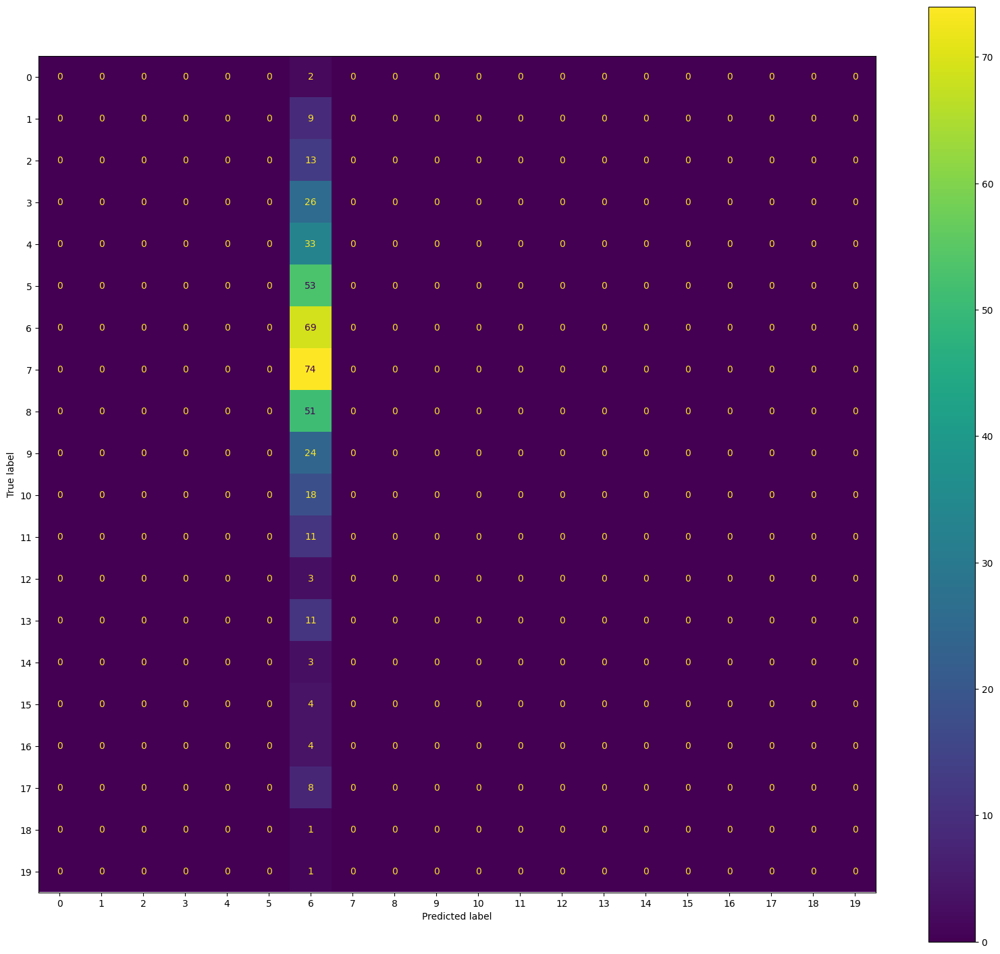

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 6

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.00      0.00      0.00        53
           4       0.00      0.00      0.00       102
           5       0.00      0.00      0.00       232
           6       0.00      0.00      0.00       354
           7       0.00      0.00      0.00       502
           8       0.16      1.00      0.28       616
           9       0.50      0.00      0.00       576
          10       0.00      0.00      0.00       445
          11       0.00      0.00      0.00       242
          12       0.00      0.00      0.00       184
          13       0.00      0.00      0.00       106
          14       0.00      0.00      0.00        92
          15       0.00      0.00      0.00        62
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


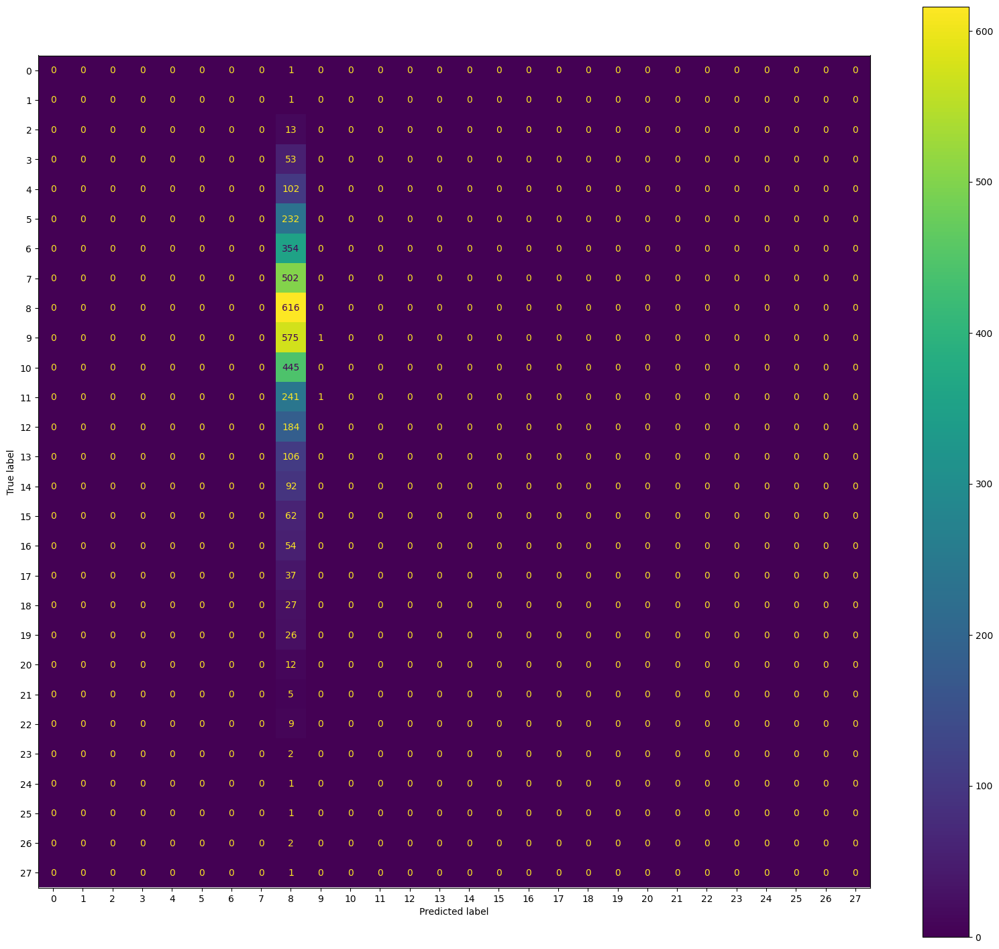

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         4
           4       0.00      0.00      0.00        13
           5       0.00      0.00      0.00        27
           6       0.00      0.00      0.00        37
           7       0.00      0.00      0.00        66
           8       0.17      1.00      0.30        73
           9       0.00      0.00      0.00        58
          10       0.00      0.00      0.00        42
          11       0.00      0.00      0.00        25
          12       0.00      0.00      0.00        19
          13       0.00      0.00      0.00        20
          14       0.00      0.00      0.00        10
          15       0.00      0.00      0.00         5
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         5
          20       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


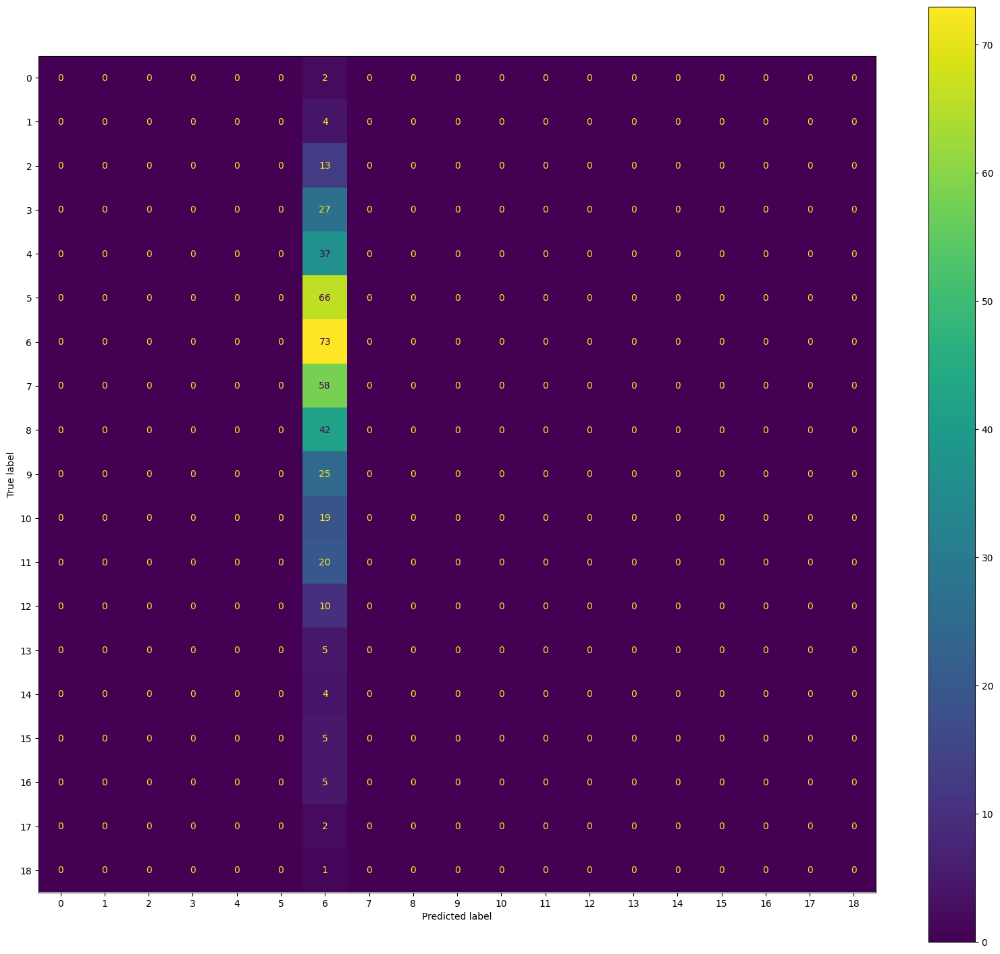

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 7

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        53
           4       0.00      0.00      0.00       102
           5       0.00      0.00      0.00       227
           6       0.00      0.00      0.00       353
           7       0.00      0.00      0.00       506
           8       0.17      1.00      0.29       632
           9       0.00      0.00      0.00       569
          10       0.00      0.00      0.00       437
          11       0.00      0.00      0.00       238
          12       0.00      0.00      0.00       184
          13       0.00      0.00      0.00       117
          14       0.00      0.00      0.00        89
          15       0.00      0.00      0.00        60
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


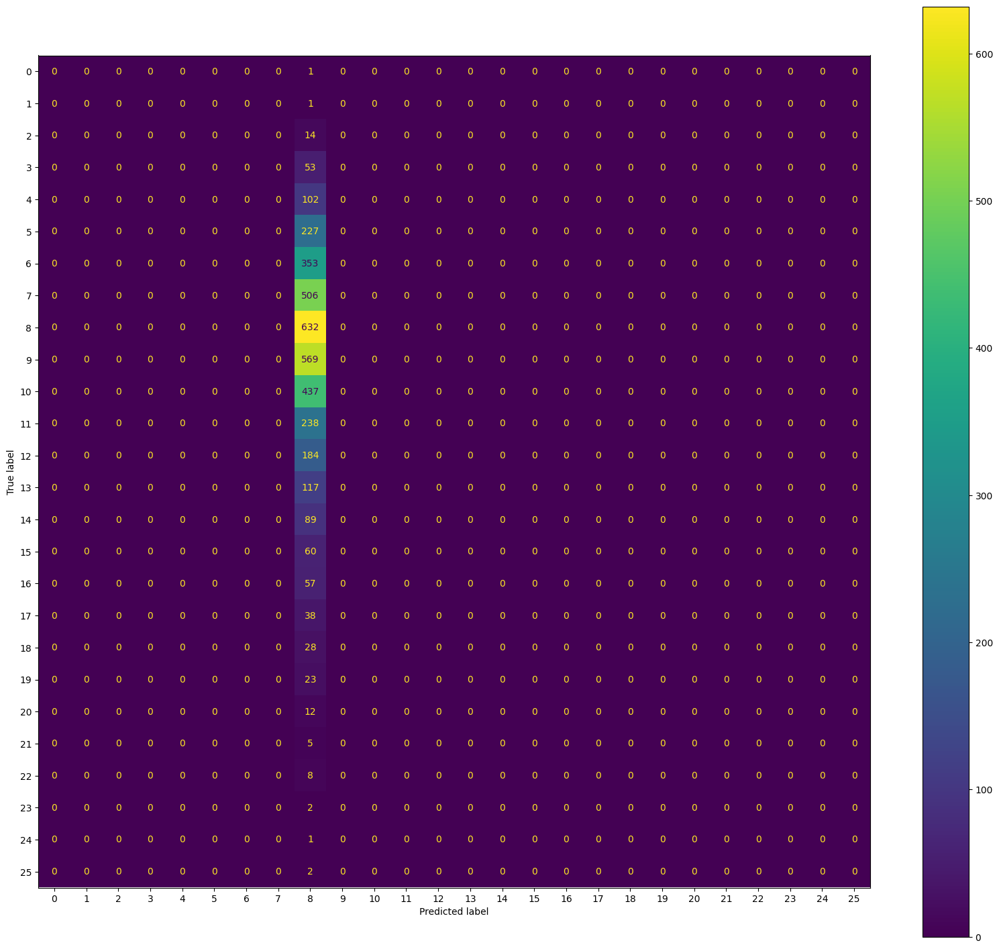

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         4
           4       0.00      0.00      0.00        13
           5       0.00      0.00      0.00        32
           6       0.00      0.00      0.00        38
           7       0.00      0.00      0.00        62
           8       0.14      1.00      0.24        57
           9       0.00      0.00      0.00        65
          10       0.00      0.00      0.00        50
          11       0.00      0.00      0.00        29
          12       0.00      0.00      0.00        19
          13       0.00      0.00      0.00         9
          14       0.00      0.00      0.00        13
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         1
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         4
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


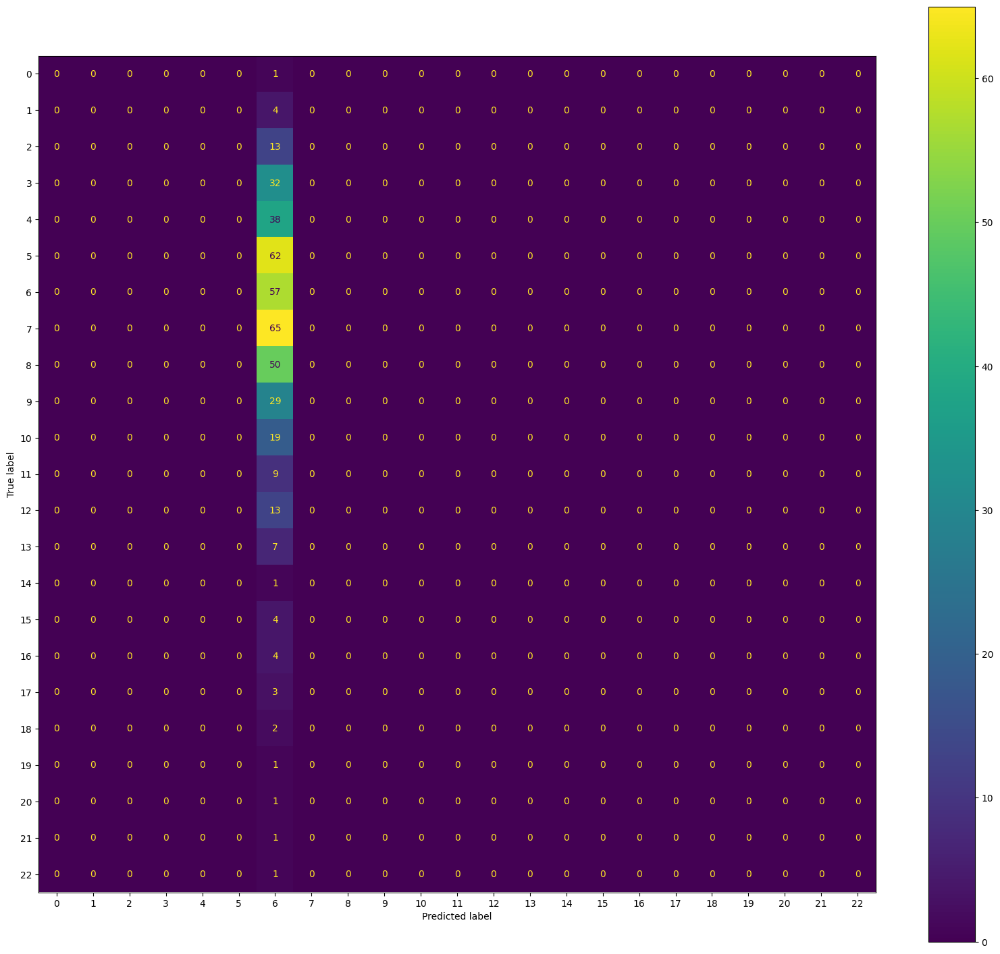

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 8

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        53
           4       0.00      0.00      0.00       106
           5       0.00      0.00      0.00       235
           6       0.00      0.00      0.00       362
           7       0.00      0.00      0.00       529
           8       0.16      1.00      0.28       618
           9       0.00      0.00      0.00       552
          10       0.00      0.00      0.00       431
          11       0.00      0.00      0.00       243
          12       0.00      0.00      0.00       182
          13       0.00      0.00      0.00       108
          14       0.00      0.00      0.00        88
          15       0.00      0.00      0.00        65
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


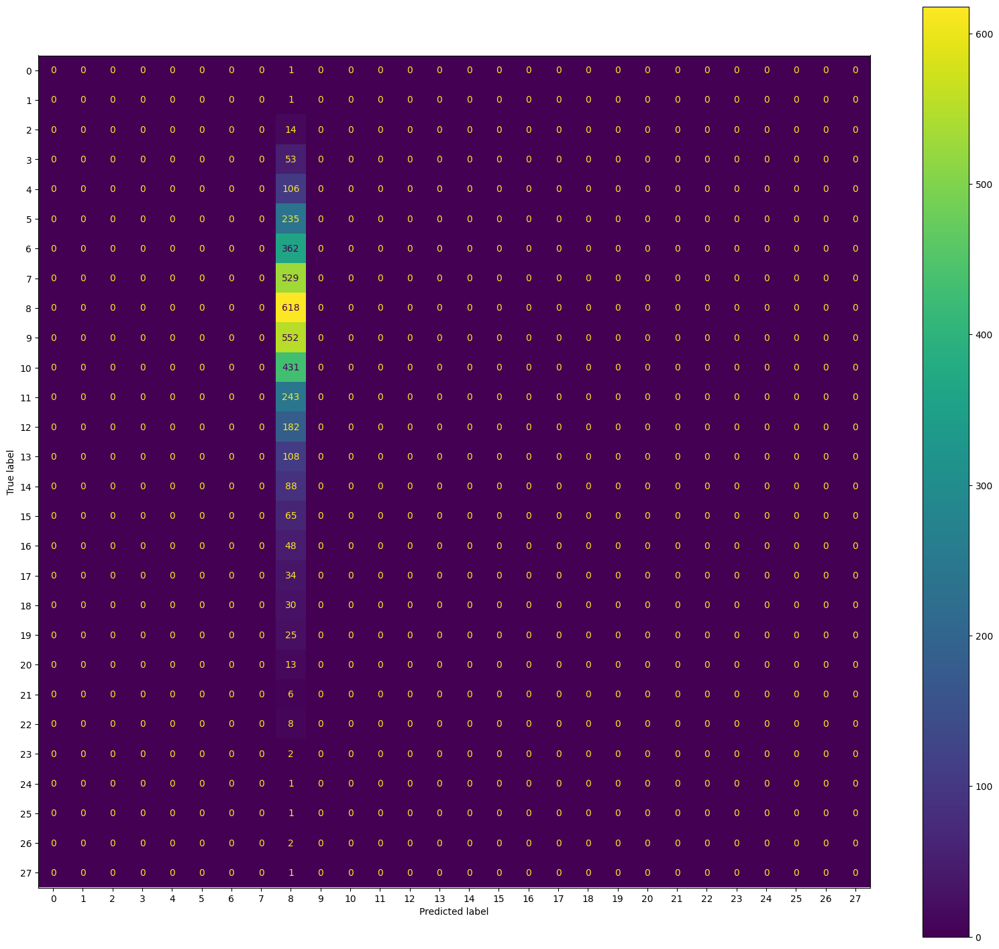

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         4
           4       0.00      0.00      0.00         9
           5       0.00      0.00      0.00        24
           6       0.00      0.00      0.00        29
           7       0.00      0.00      0.00        39
           8       0.17      1.00      0.29        71
           9       0.00      0.00      0.00        82
          10       0.00      0.00      0.00        56
          11       0.00      0.00      0.00        24
          12       0.00      0.00      0.00        21
          13       0.00      0.00      0.00        18
          14       0.00      0.00      0.00        14
          15       0.00      0.00      0.00         2
          16       0.00      0.00      0.00        10
          17       0.00      0.00      0.00         8
          18       0.00      0.00      0.00         2
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


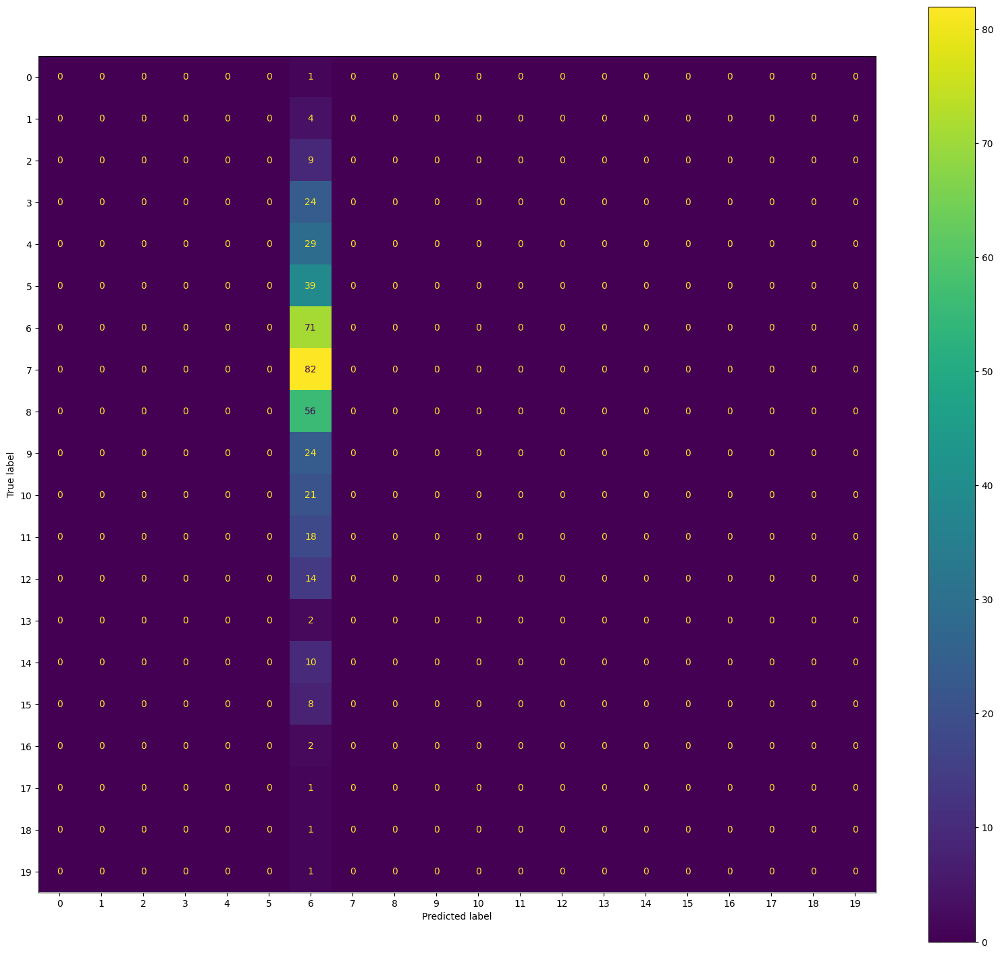

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 9

Train
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.00      0.00      0.00        51
           4       0.00      0.00      0.00       107
           5       0.00      0.00      0.00       237
           6       0.00      0.00      0.00       346
           7       0.00      0.00      0.00       504
           8       0.17      1.00      0.28       624
           9       0.00      0.00      0.00       569
          10       0.00      0.00      0.00       448
          11       0.00      0.00      0.00       242
          12       0.00      0.00      0.00       183
          13       0.00      0.00      0.00       113
          14       0.00      0.00      0.00        88
          15       0.00      0.00      0.00        59
          16       0.00      0.00      0.00        51
          17       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


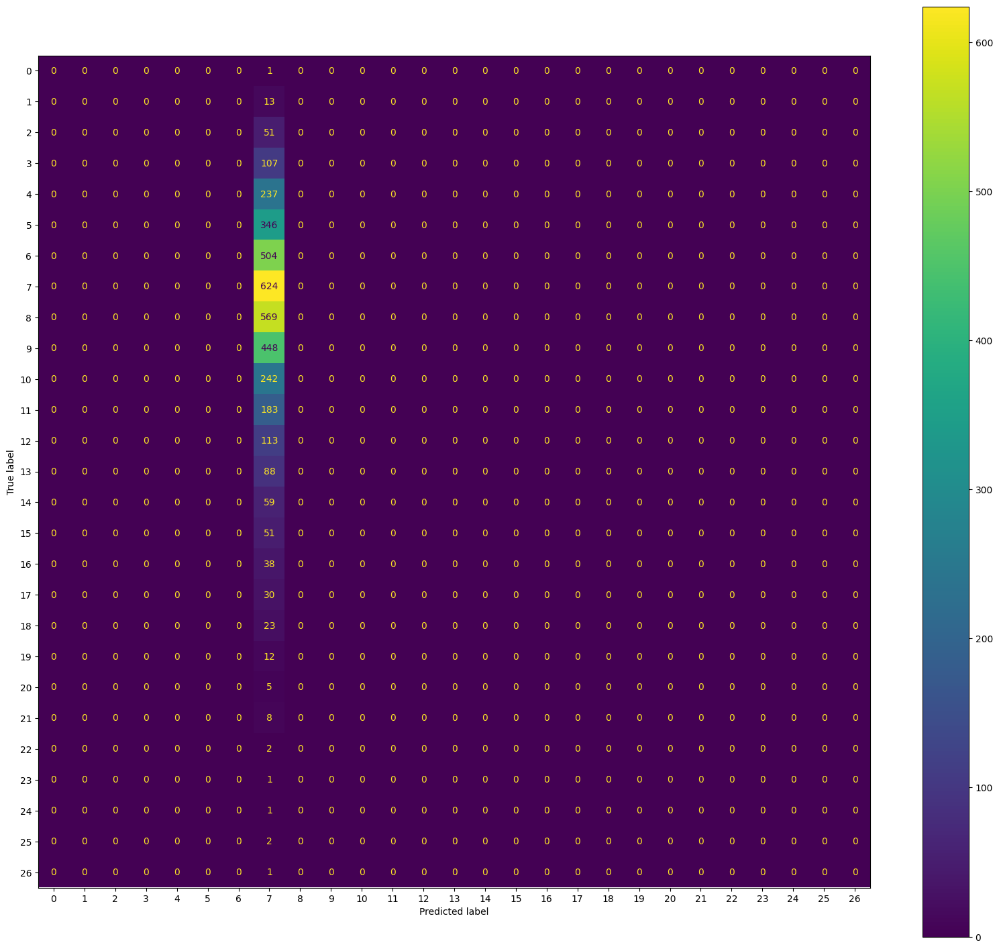

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00         8
           5       0.00      0.00      0.00        22
           6       0.00      0.00      0.00        45
           7       0.00      0.00      0.00        64
           8       0.16      1.00      0.27        65
           9       0.00      0.00      0.00        65
          10       0.00      0.00      0.00        39
          11       0.00      0.00      0.00        25
          12       0.00      0.00      0.00        20
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00        14
          15       0.00      0.00      0.00         8
          16       0.00      0.00      0.00         7
          17       0.00      0.00      0.00         4
          18       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


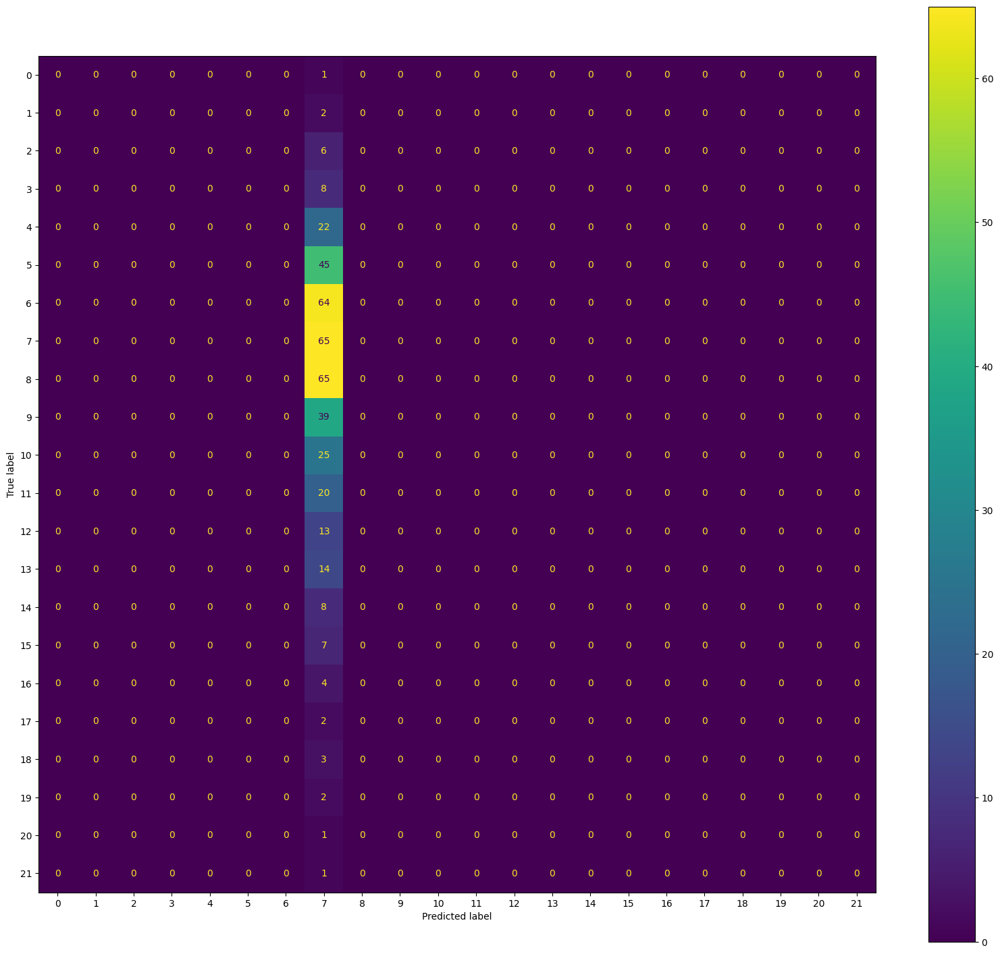

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 10

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.00      0.00      0.00        52
           4       0.00      0.00      0.00       100
           5       0.00      0.00      0.00       236
           6       0.00      0.00      0.00       346
           7       0.00      0.00      0.00       517
           8       0.16      1.00      0.28       609
           9       0.50      0.00      0.00       575
          10       0.00      0.00      0.00       434
          11       0.00      0.00      0.00       241
          12       0.00      0.00      0.00       189
          13       0.00      0.00      0.00       117
          14       0.00      0.00      0.00        91
          15       0.00      0.00      0.00        63
          16       0.00      0.00      0.00        51
          17       0.00      0.00 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


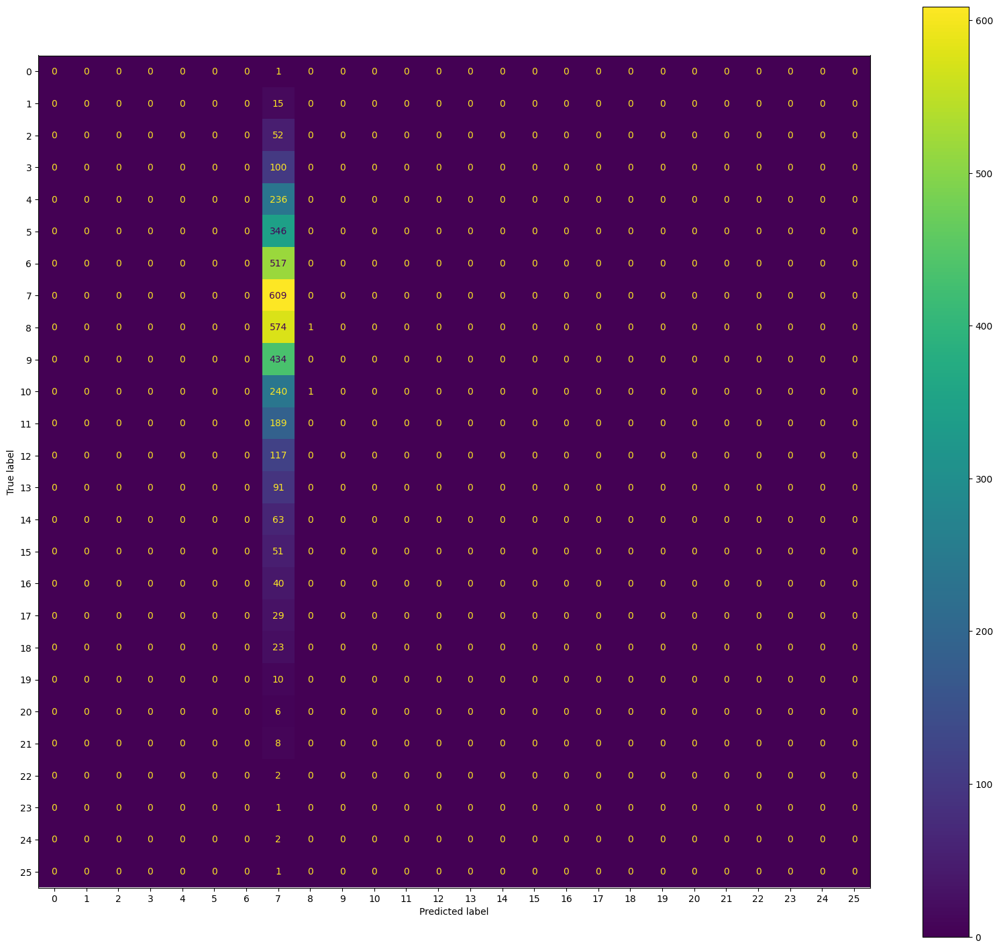

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00        15
           5       0.00      0.00      0.00        23
           6       0.00      0.00      0.00        45
           7       0.00      0.00      0.00        51
           8       0.19      1.00      0.32        80
           9       0.00      0.00      0.00        59
          10       0.00      0.00      0.00        53
          11       0.00      0.00      0.00        26
          12       0.00      0.00      0.00        14
          13       0.00      0.00      0.00         9
          14       0.00      0.00      0.00        11
          15       0.00      0.00      0.00         4
          16       0.00      0.00      0.00         7
          17       0.00      0.00      0.00         2
          18       0.00      0.00      0.00         3
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


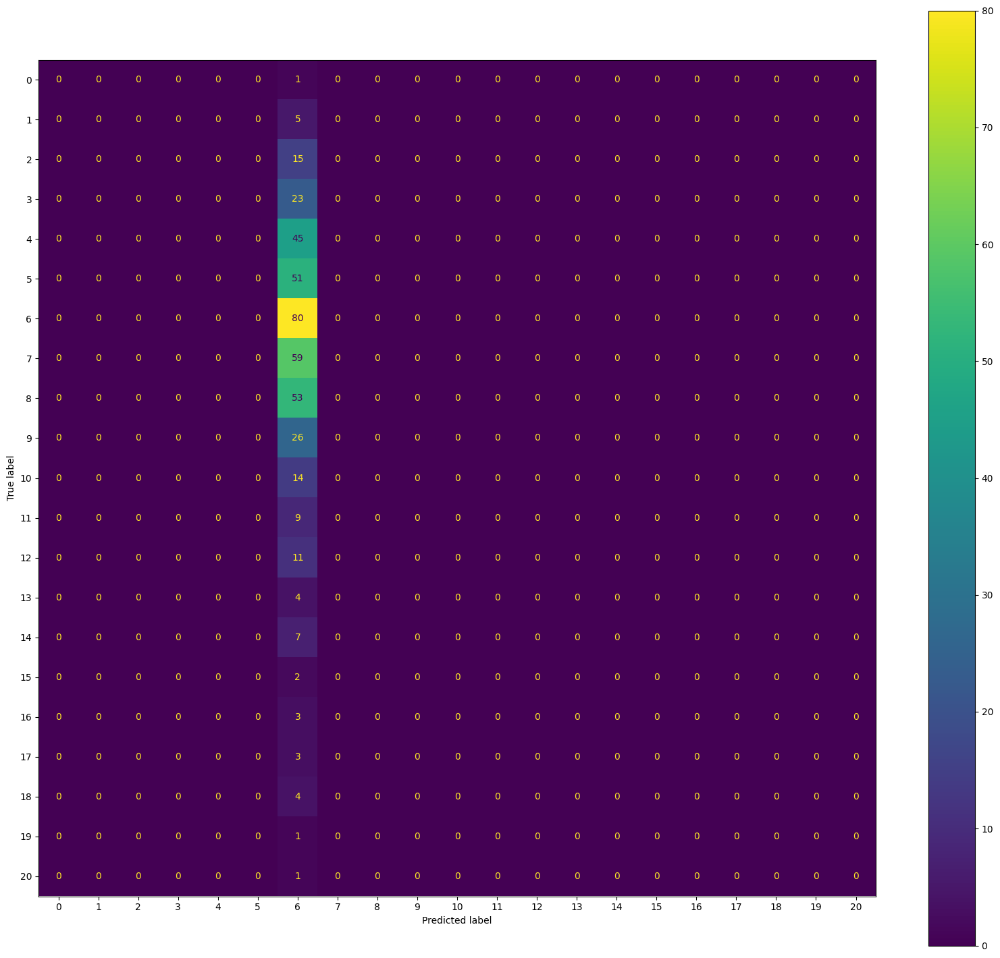

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Average of Acuuracies 0.16


0.16

In [ ]:
alpha = 150
Run2(NB2,X2,y2,alpha)

Fold 1

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        53
           4       0.00      0.00      0.00       105
           5       0.00      0.00      0.00       230
           6       0.00      0.00      0.00       347
           7       0.22      0.49      0.30       523
           8       0.20      0.42      0.27       620
           9       0.22      0.47      0.30       557
          10       0.12      0.01      0.02       442
          11       0.23      0.04      0.06       240
          12       0.00      0.00      0.00       187
          13       0.00      0.00      0.00       109
          14       0.00      0.00      0.00        96
          15       0.00      0.00      0.00        58
          16       0.00      0.00      0.00        54
          17 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


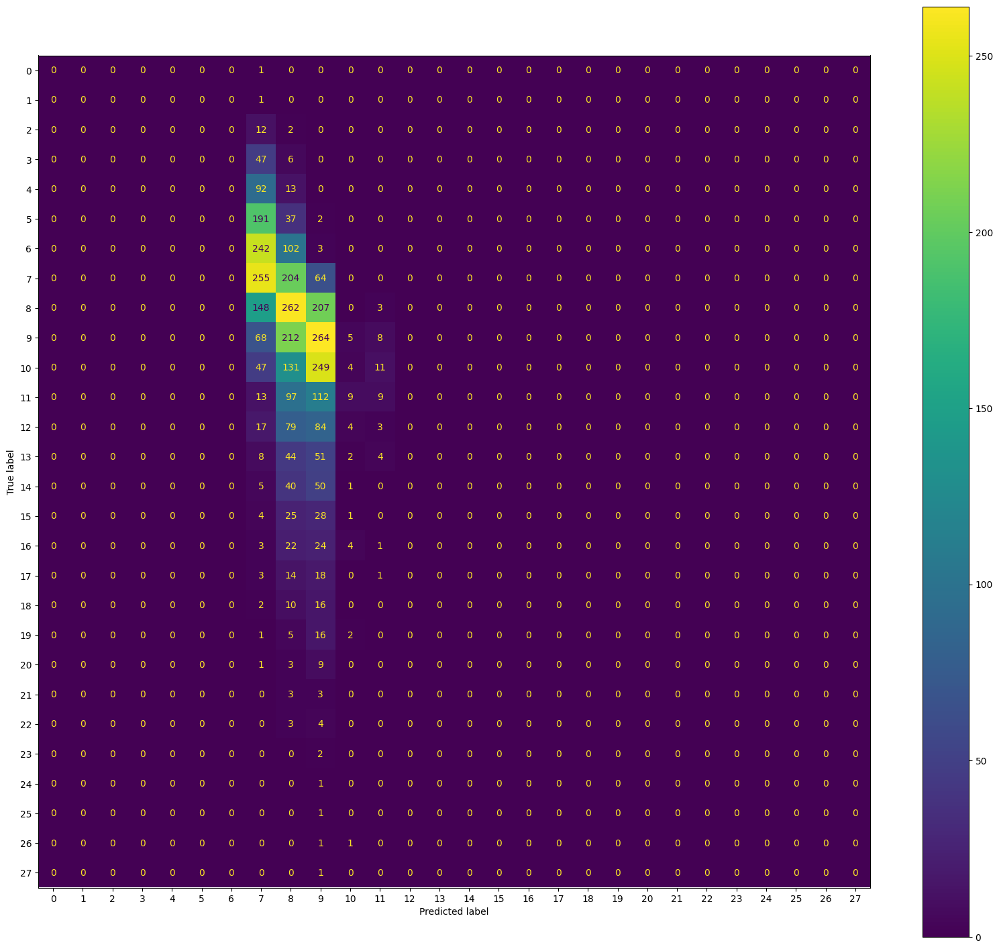

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         4
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        29
           6       0.00      0.00      0.00        44
           7       0.14      0.42      0.21        45
           8       0.19      0.41      0.26        69
           9       0.31      0.55      0.39        77
          10       0.33      0.02      0.04        45
          11       0.00      0.00      0.00        27
          12       0.00      0.00      0.00        16
          13       0.00      0.00      0.00        17
          14       0.00      0.00      0.00         6
          15       0.00      0.00      0.00         9
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         6
          18       0.00      0.00      0.00         4
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


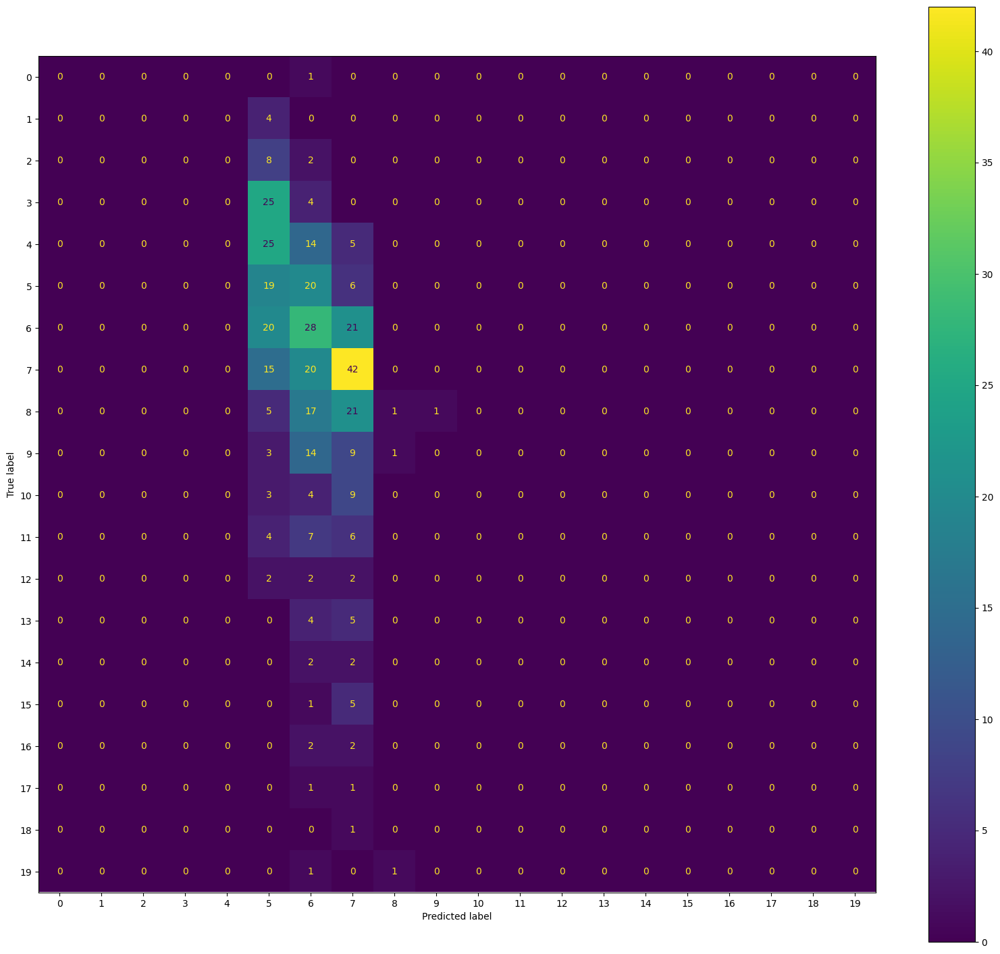

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 2

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        52
           4       0.00      0.00      0.00       105
           5       0.00      0.00      0.00       234
           6       0.00      0.00      0.00       358
           7       0.21      0.49      0.29       502
           8       0.20      0.41      0.27       618
           9       0.23      0.49      0.31       572
          10       0.15      0.01      0.02       435
          11       0.21      0.03      0.06       235
          12       0.00      0.00      0.00       185
          13       0.00      0.00      0.00       113
          14       0.00      0.00      0.00        90
          15       0.00      0.00      0.00        64
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


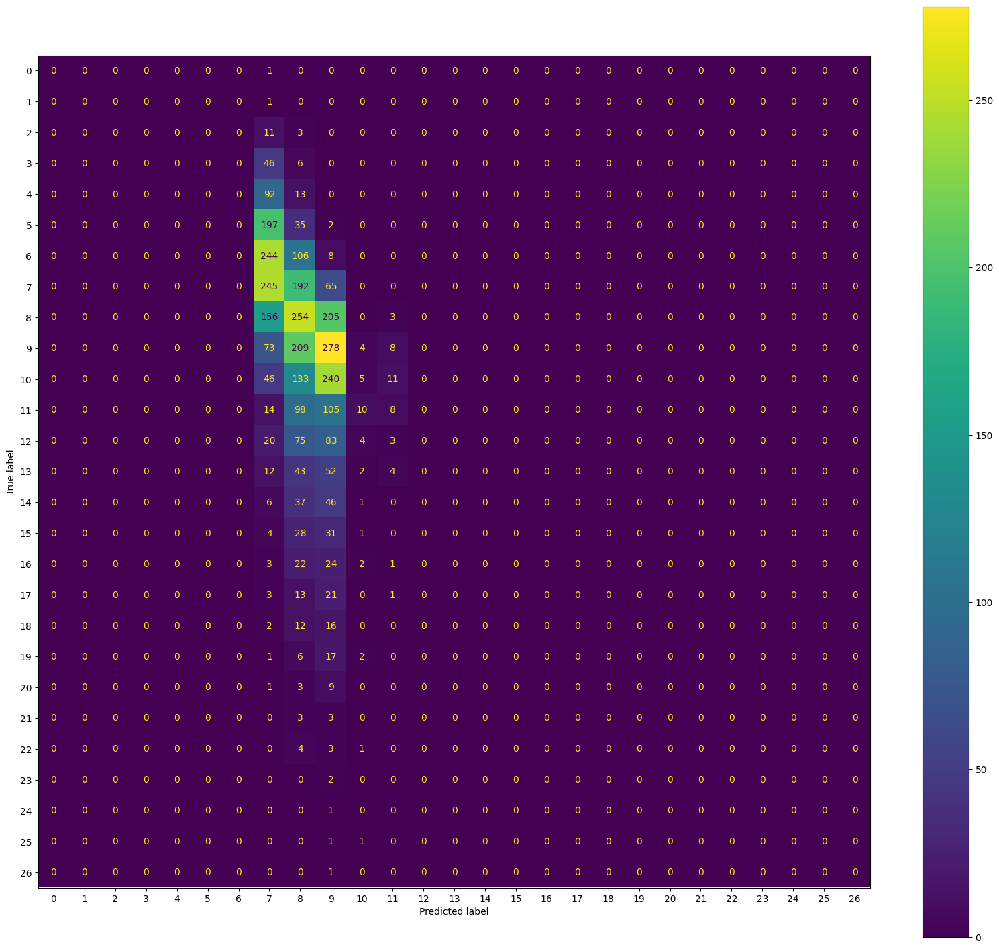

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00        10
           5       0.00      0.00      0.00        25
           6       0.00      0.00      0.00        33
           7       0.25      0.44      0.32        66
           8       0.22      0.51      0.31        71
           9       0.21      0.45      0.29        62
          10       0.00      0.00      0.00        52
          11       0.50      0.03      0.06        32
          12       0.00      0.00      0.00        18
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00        12
          15       0.00      0.00      0.00         3
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         2
          20       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


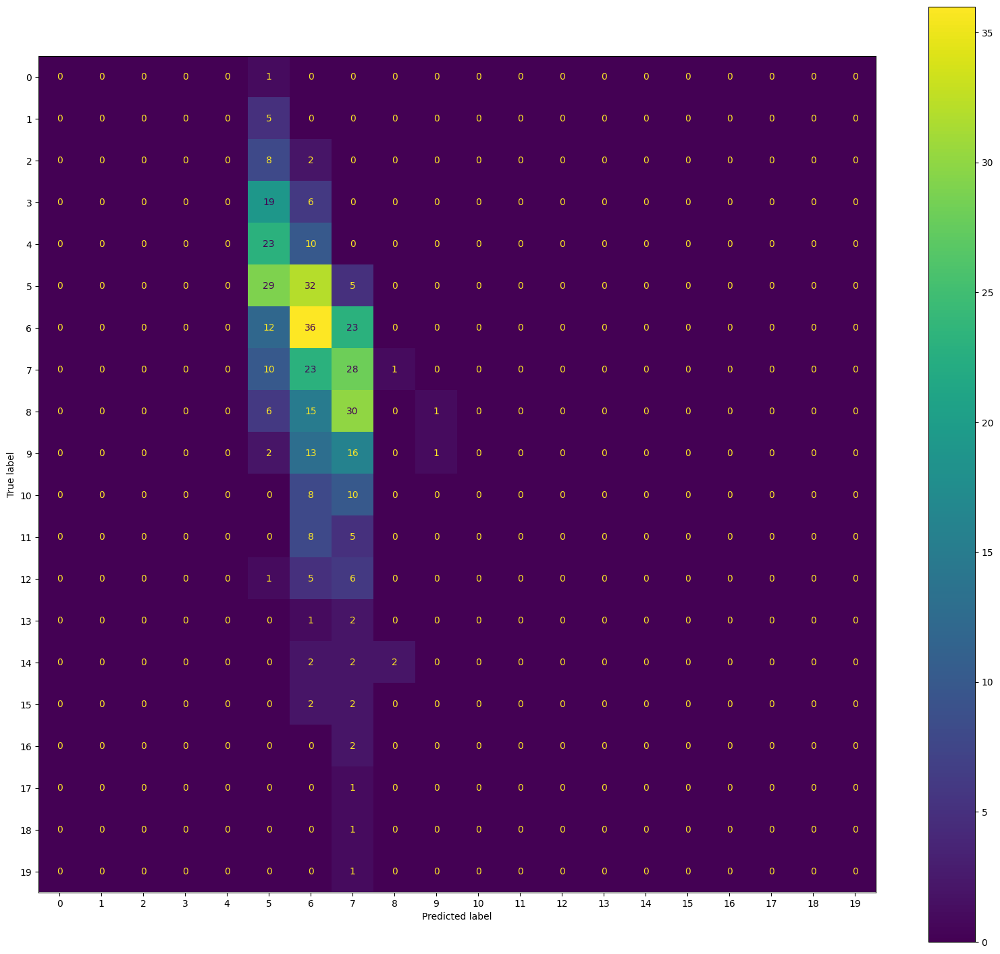

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 3

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00        53
           4       0.00      0.00      0.00       106
           5       0.00      0.00      0.00       235
           6       0.00      0.00      0.00       353
           7       0.21      0.48      0.29       517
           8       0.20      0.42      0.27       613
           9       0.23      0.49      0.32       577
          10       0.20      0.03      0.05       441
          11       0.00      0.00      0.00       245
          12       0.00      0.00      0.00       181
          13       0.00      0.00      0.00       110
          14       0.00      0.00      0.00        80
          15       0.00      0.00      0.00        58
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


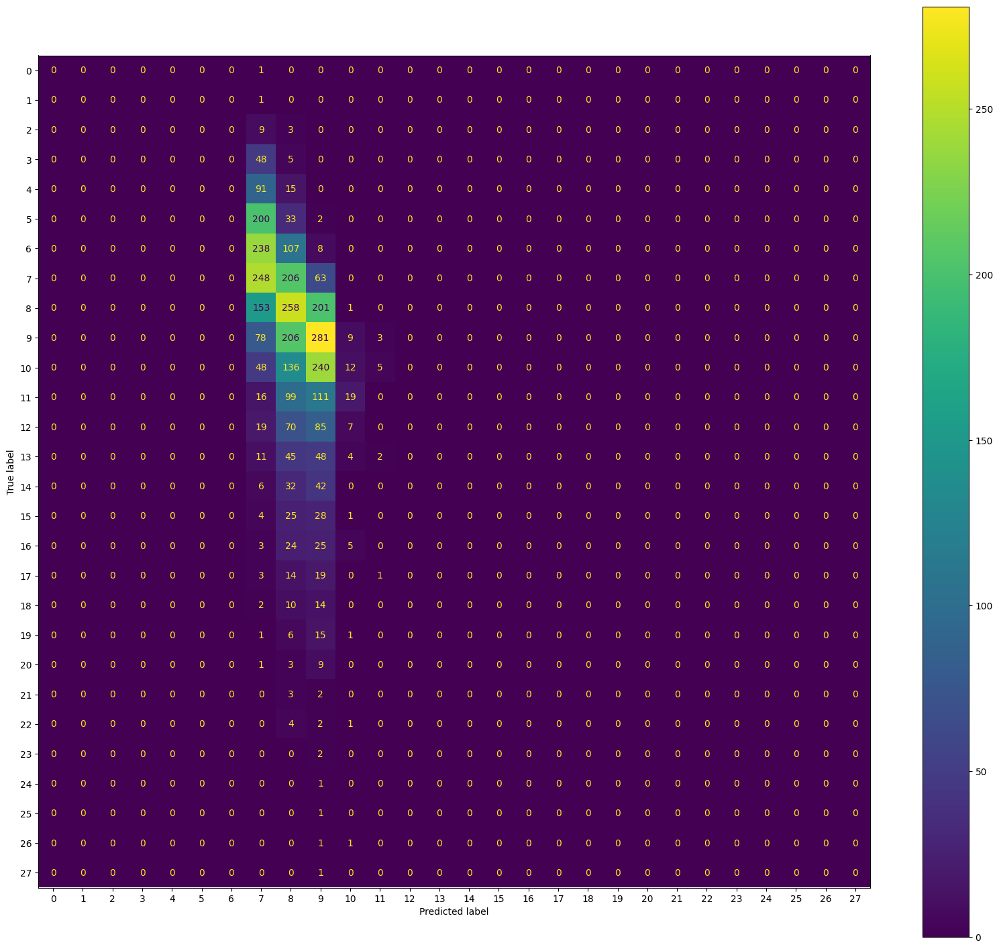

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         4
           4       0.00      0.00      0.00         9
           5       0.00      0.00      0.00        24
           6       0.00      0.00      0.00        38
           7       0.23      0.51      0.32        51
           8       0.21      0.42      0.28        76
           9       0.17      0.42      0.24        57
          10       0.00      0.00      0.00        46
          11       0.00      0.00      0.00        22
          12       0.00      0.00      0.00        22
          13       0.00      0.00      0.00        16
          14       0.00      0.00      0.00        22
          15       0.00      0.00      0.00         9
          16       0.00      0.00      0.00         1
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         6
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


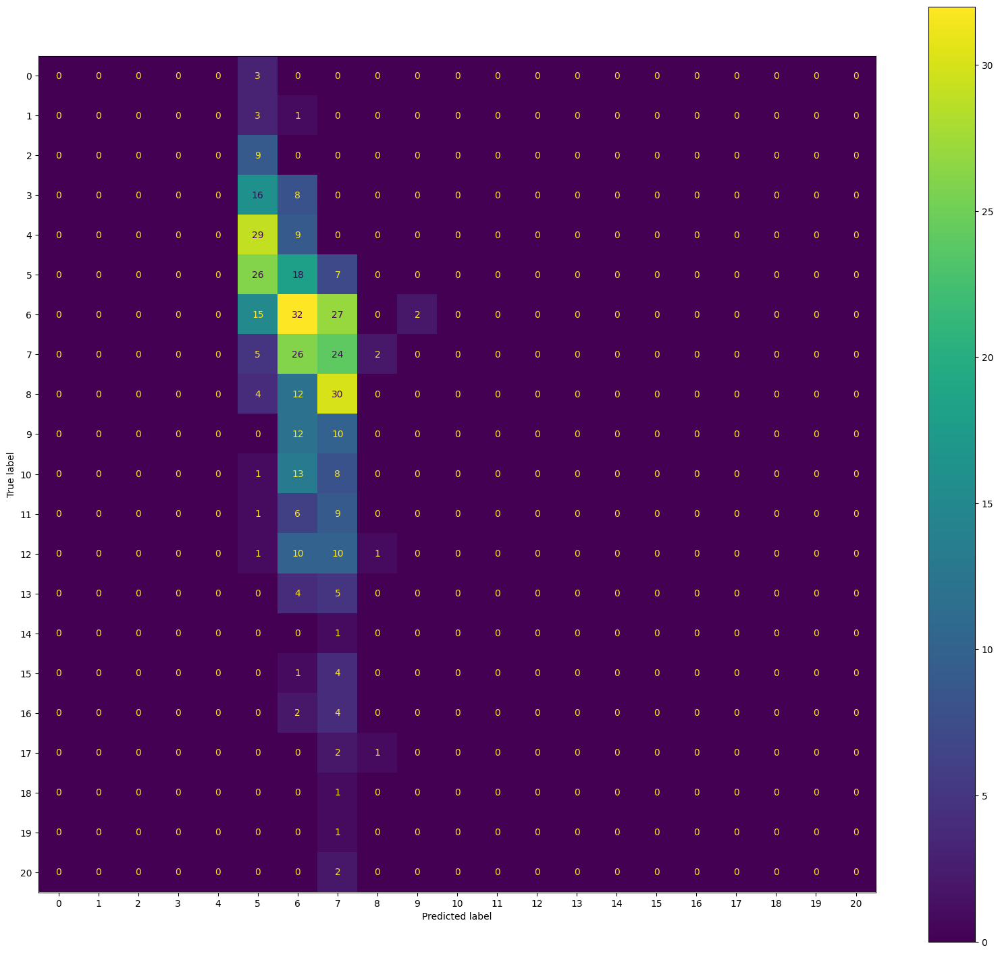

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 4

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        51
           4       0.00      0.00      0.00       101
           5       0.00      0.00      0.00       240
           6       0.00      0.00      0.00       350
           7       0.21      0.48      0.29       505
           8       0.20      0.43      0.28       617
           9       0.22      0.48      0.30       558
          10       0.26      0.04      0.07       443
          11       0.00      0.00      0.00       250
          12       0.00      0.00      0.00       180
          13       0.00      0.00      0.00       108
          14       0.00      0.00      0.00        93
          15       0.00      0.00      0.00        65
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


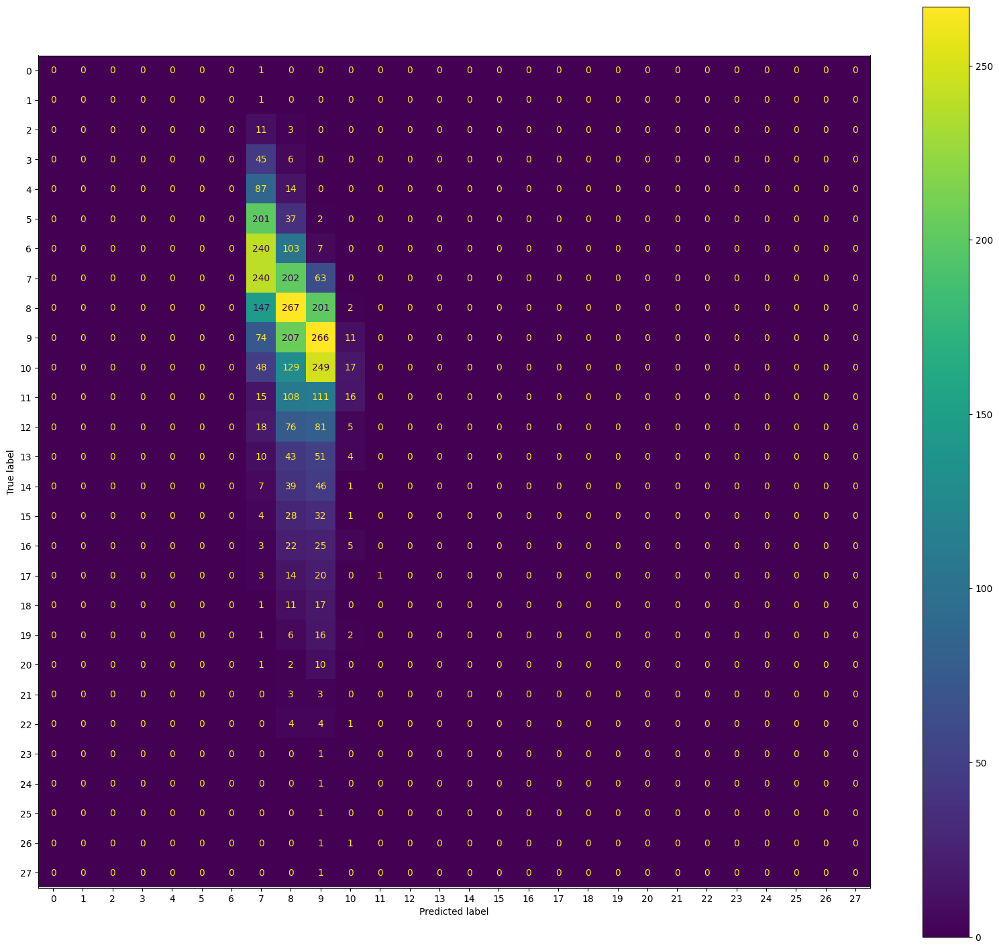

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00        14
           5       0.00      0.00      0.00        19
           6       0.00      0.00      0.00        41
           7       0.25      0.54      0.34        63
           8       0.17      0.32      0.22        72
           9       0.28      0.51      0.37        76
          10       0.00      0.00      0.00        44
          11       0.00      0.00      0.00        17
          12       0.00      0.00      0.00        23
          13       0.00      0.00      0.00        18
          14       0.00      0.00      0.00         9
          15       0.00      0.00      0.00         2
          16       0.00      0.00      0.00         3
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         3
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


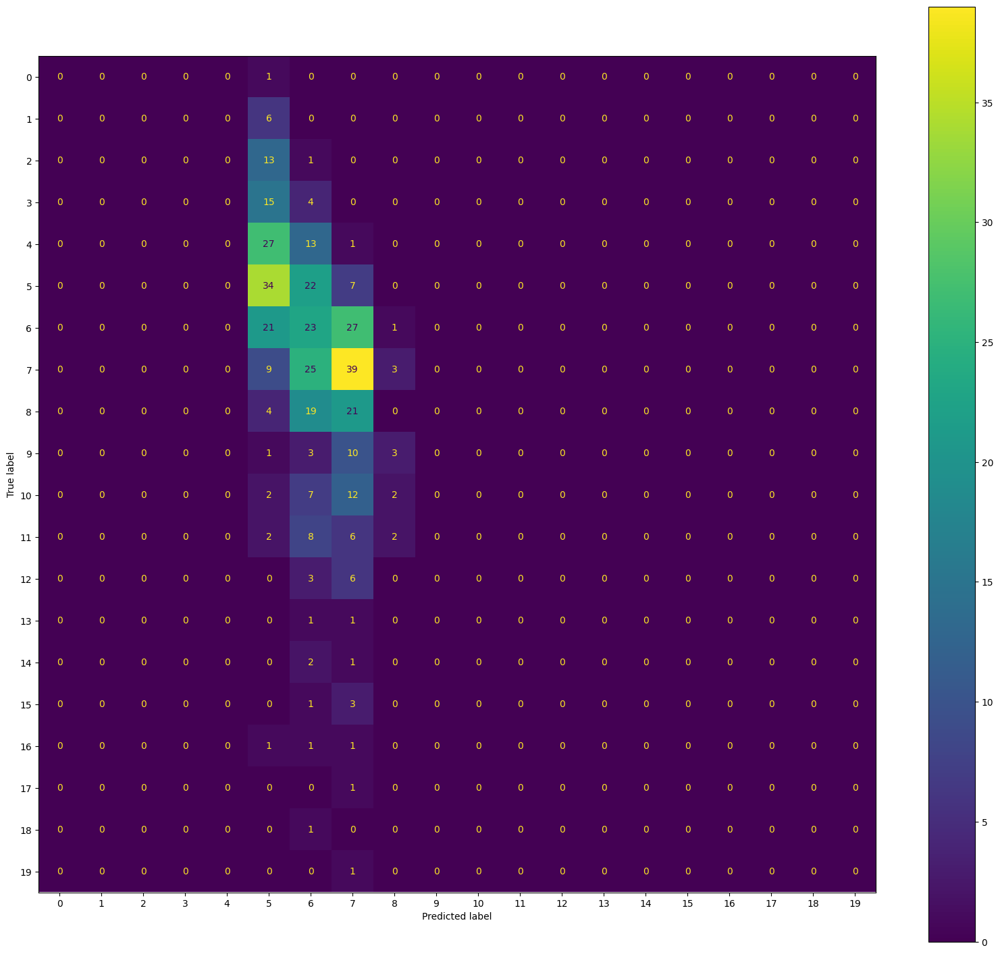

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 5

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        51
           4       0.00      0.00      0.00       102
           5       0.00      0.00      0.00       229
           6       0.00      0.00      0.00       354
           7       0.21      0.47      0.29       508
           8       0.19      0.42      0.27       620
           9       0.23      0.48      0.31       578
          10       0.14      0.01      0.02       428
          11       0.25      0.04      0.06       242
          12       0.00      0.00      0.00       191
          13       0.00      0.00      0.00       112
          14       0.00      0.00      0.00        95
          15       0.00      0.00      0.00        61
          16       0.00      0.00      0.00        50
          17       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


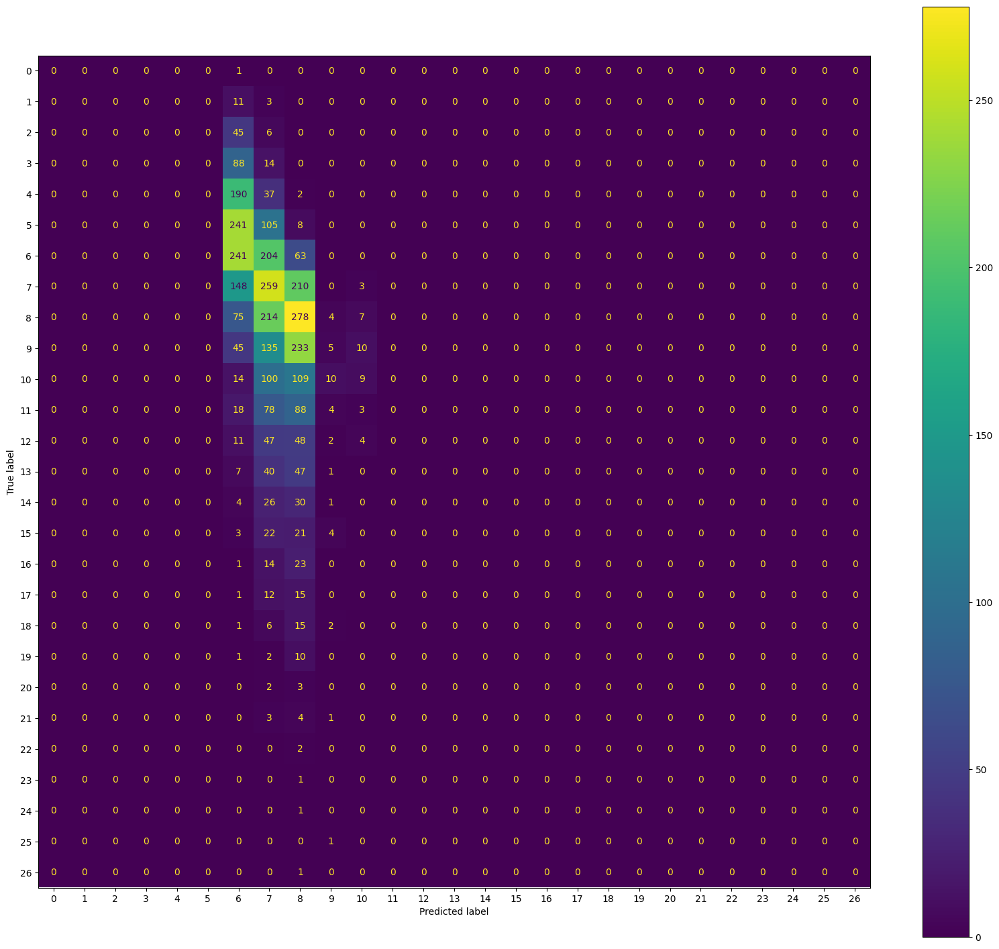

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00        13
           5       0.00      0.00      0.00        30
           6       0.00      0.00      0.00        37
           7       0.22      0.55      0.32        60
           8       0.24      0.45      0.31        69
           9       0.20      0.48      0.28        56
          10       0.00      0.00      0.00        59
          11       0.00      0.00      0.00        25
          12       0.00      0.00      0.00        12
          13       0.00      0.00      0.00        14
          14       0.00      0.00      0.00         7
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         8
          17       0.00      0.00      0.00         4
          18       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


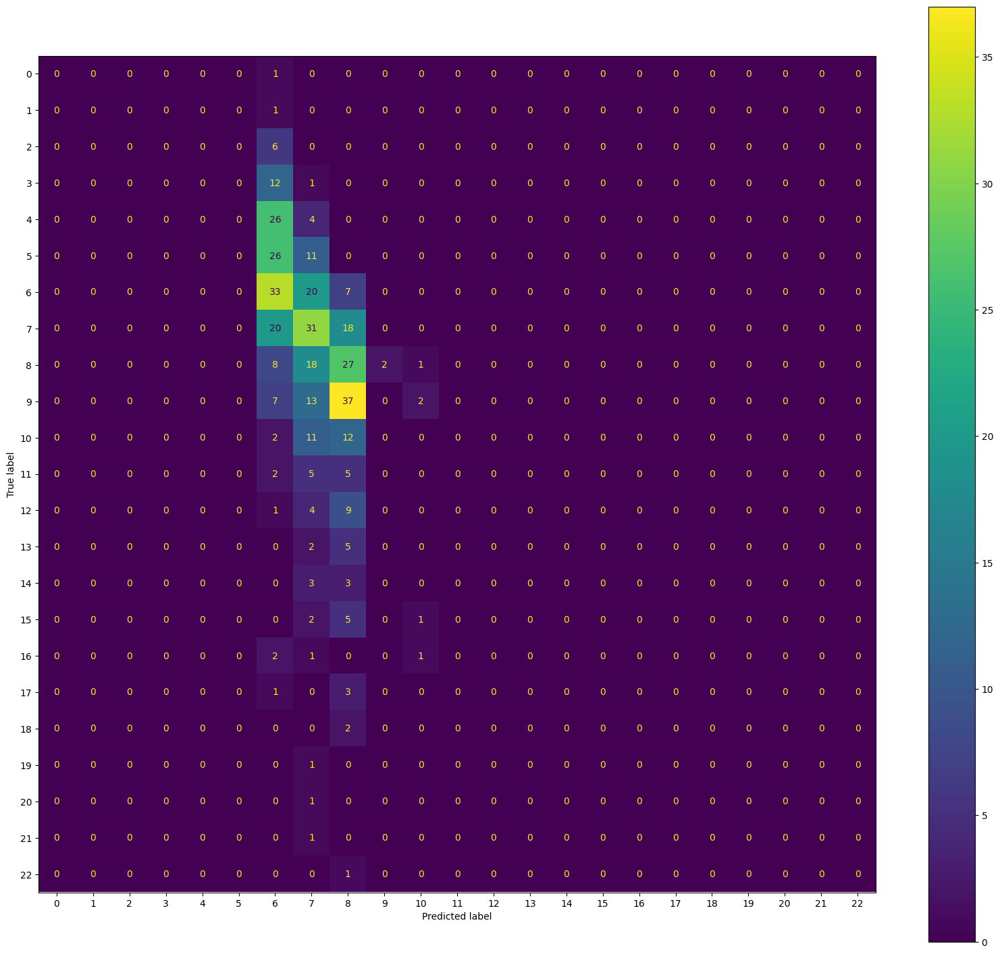

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 6

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00        52
           4       0.00      0.00      0.00       102
           5       0.00      0.00      0.00       227
           6       0.00      0.00      0.00       347
           7       0.21      0.49      0.29       505
           8       0.20      0.43      0.28       623
           9       0.23      0.48      0.31       576
          10       0.09      0.01      0.01       429
          11       0.21      0.03      0.06       245
          12       0.00      0.00      0.00       187
          13       0.00      0.00      0.00       119
          14       0.00      0.00      0.00        96
          15       0.00      0.00      0.00        61
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


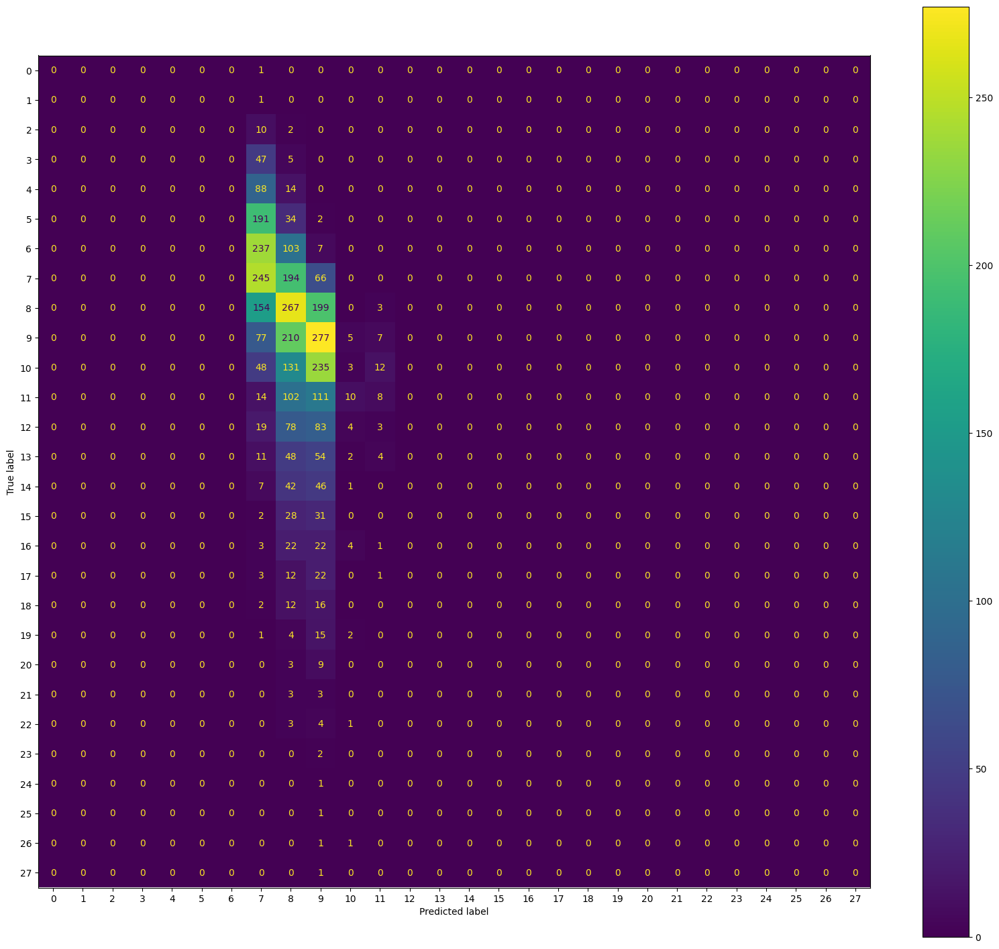

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         5
           4       0.00      0.00      0.00        13
           5       0.00      0.00      0.00        32
           6       0.00      0.00      0.00        44
           7       0.22      0.46      0.30        63
           8       0.16      0.35      0.22        66
           9       0.21      0.50      0.29        58
          10       0.67      0.03      0.07        58
          11       0.50      0.05      0.08        22
          12       0.00      0.00      0.00        16
          13       0.00      0.00      0.00         7
          14       0.00      0.00      0.00         6
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         2
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


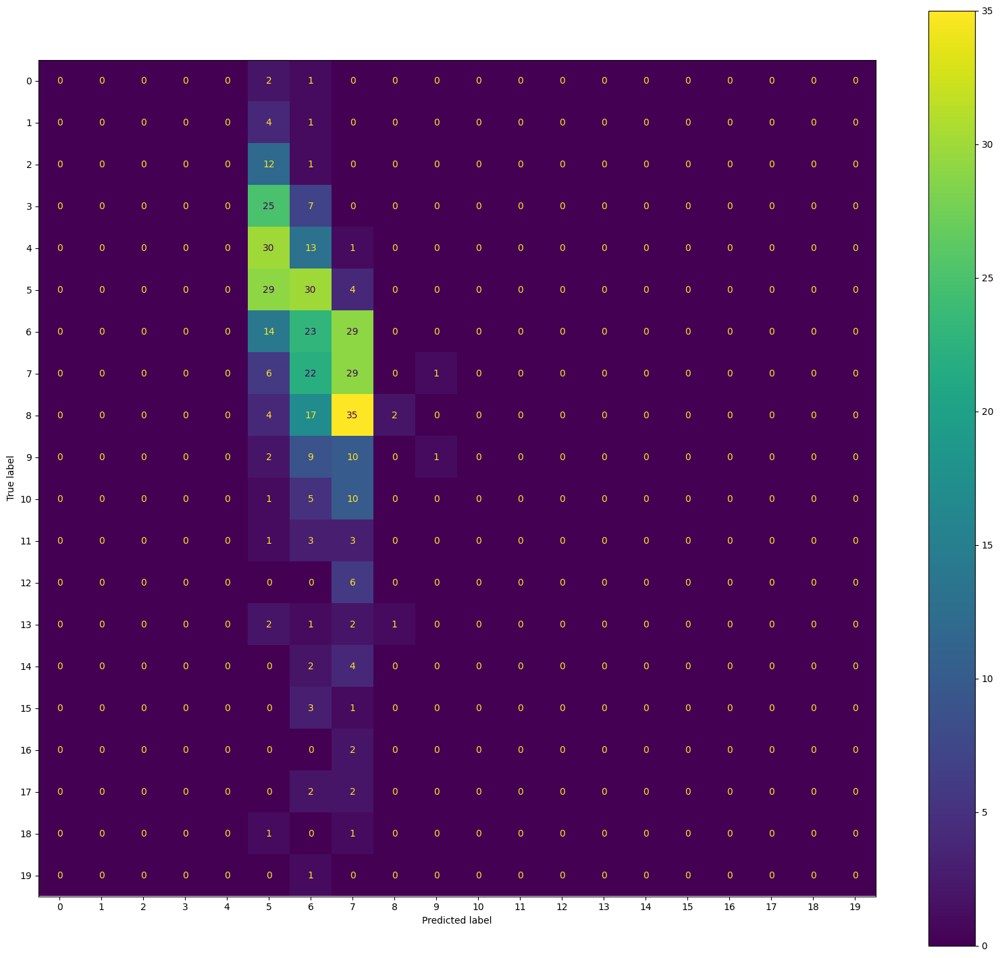

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 7

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        51
           4       0.00      0.00      0.00       103
           5       0.00      0.00      0.00       228
           6       0.00      0.00      0.00       356
           7       0.22      0.48      0.30       518
           8       0.20      0.43      0.27       610
           9       0.23      0.49      0.31       570
          10       0.00      0.00      0.00       444
          11       0.23      0.03      0.06       240
          12       0.00      0.00      0.00       182
          13       0.00      0.00      0.00       116
          14       0.00      0.00      0.00        92
          15       0.00      0.00      0.00        56
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


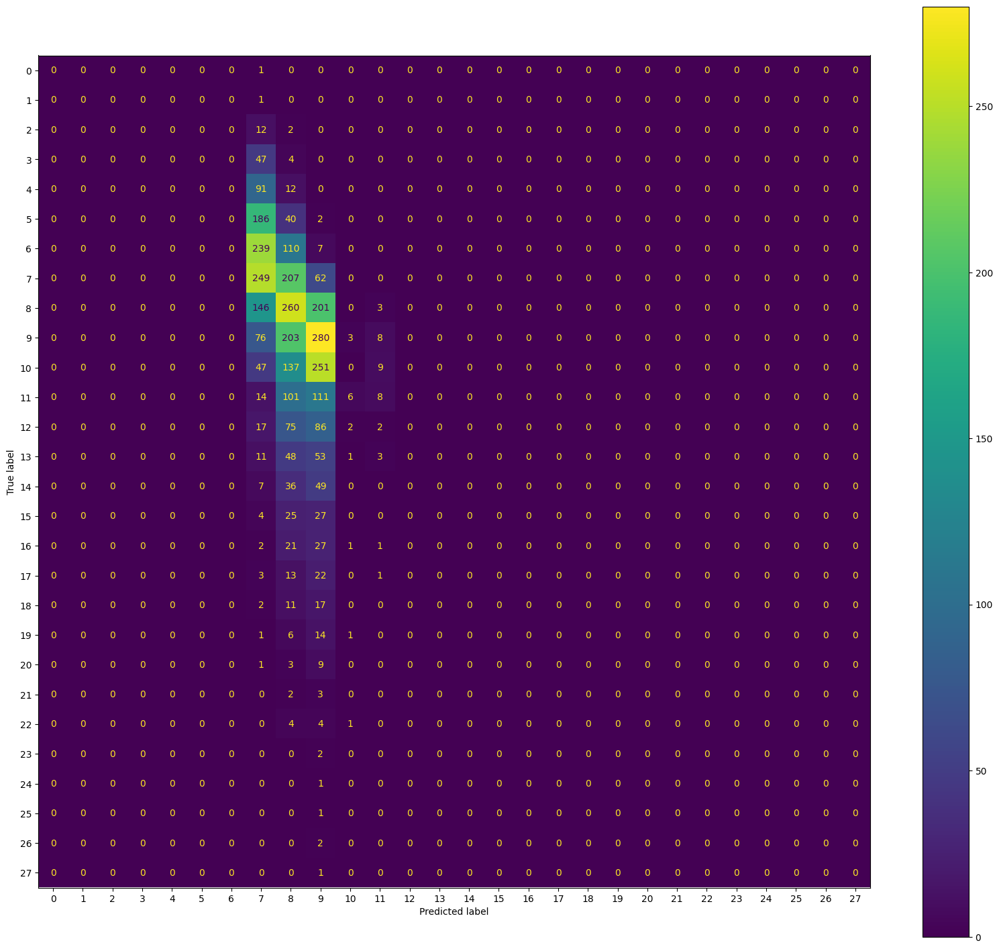

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         6
           4       0.00      0.00      0.00        12
           5       0.00      0.00      0.00        31
           6       0.00      0.00      0.00        35
           7       0.18      0.48      0.26        50
           8       0.22      0.38      0.28        79
           9       0.21      0.44      0.28        64
          10       0.00      0.00      0.00        43
          11       0.17      0.04      0.06        27
          12       0.00      0.00      0.00        21
          13       0.00      0.00      0.00        10
          14       0.00      0.00      0.00        10
          15       0.00      0.00      0.00        11
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         2
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


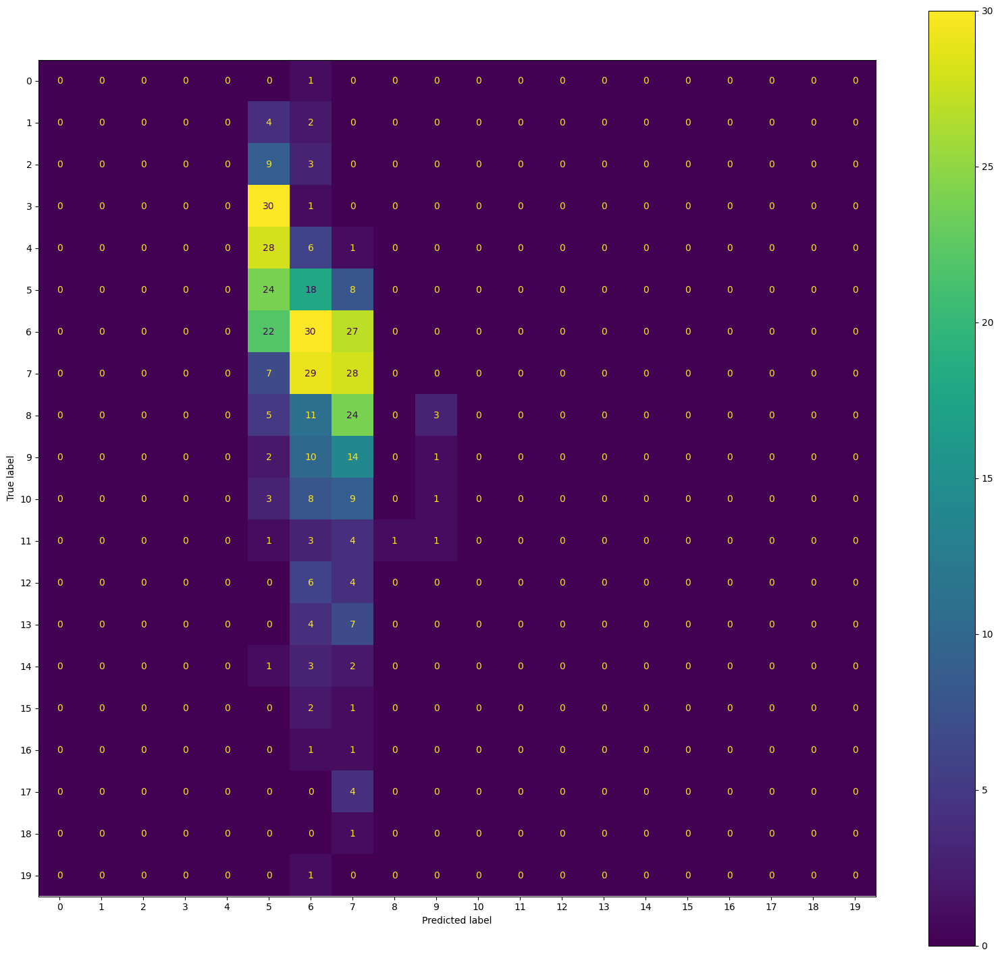

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 8

Train
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.00      0.00      0.00        50
           4       0.00      0.00      0.00       106
           5       0.00      0.00      0.00       232
           6       0.00      0.00      0.00       350
           7       0.21      0.48      0.29       512
           8       0.20      0.42      0.27       619
           9       0.23      0.48      0.31       580
          10       0.12      0.01      0.02       443
          11       0.21      0.03      0.06       232
          12       0.00      0.00      0.00       180
          13       0.00      0.00      0.00       114
          14       0.00      0.00      0.00        91
          15       0.00      0.00      0.00        61
          16       0.00      0.00      0.00        54
          17       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


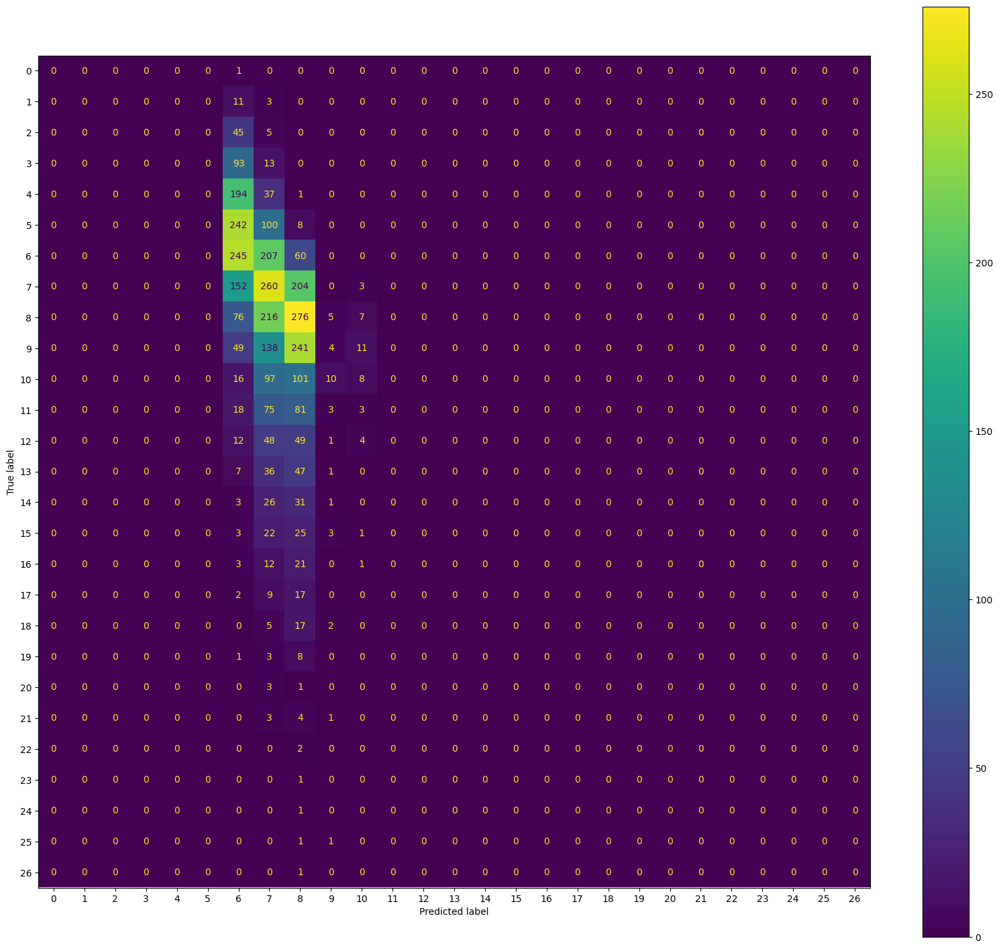

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         9
           5       0.00      0.00      0.00        27
           6       0.00      0.00      0.00        41
           7       0.24      0.52      0.33        56
           8       0.21      0.43      0.29        70
           9       0.20      0.56      0.30        54
          10       0.25      0.02      0.04        44
          11       0.33      0.03      0.05        35
          12       0.00      0.00      0.00        23
          13       0.00      0.00      0.00        12
          14       0.00      0.00      0.00        11
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         5
          18       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


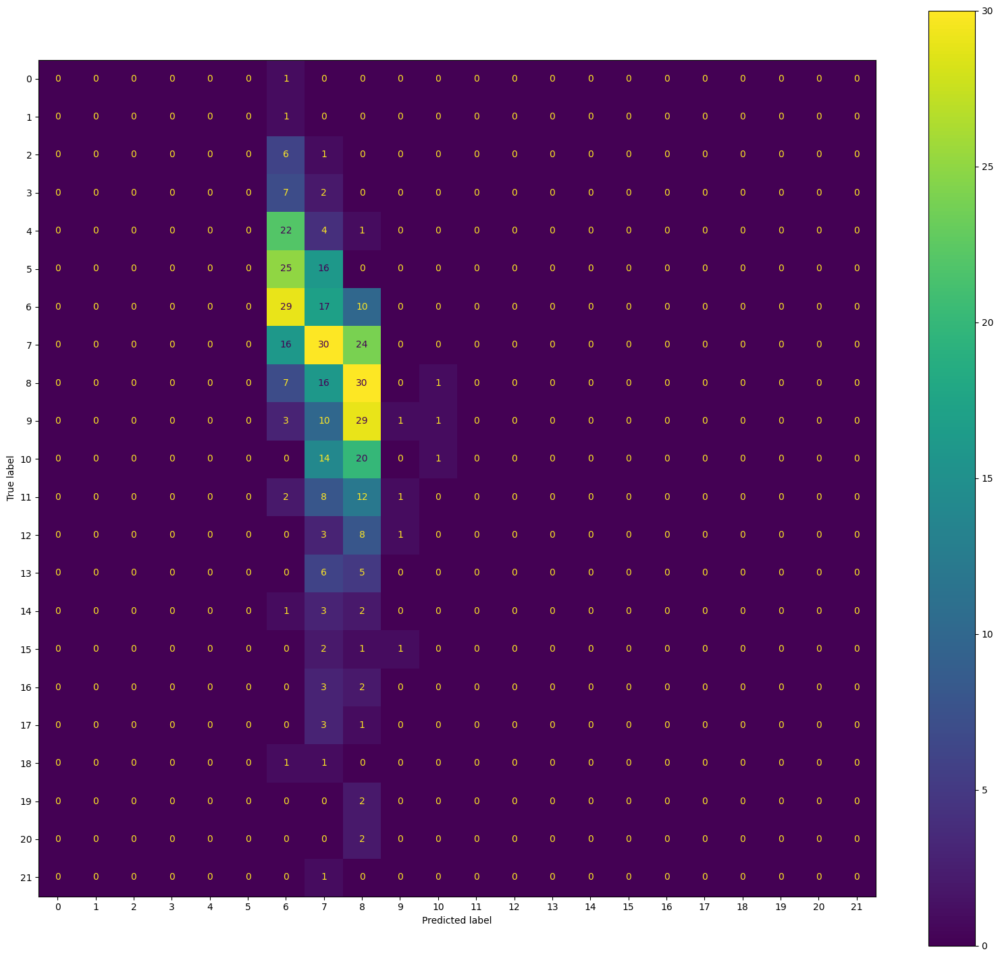

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 9

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00        50
           4       0.00      0.00      0.00        99
           5       0.00      0.00      0.00       239
           6       0.00      0.00      0.00       352
           7       0.22      0.49      0.30       515
           8       0.21      0.42      0.28       637
           9       0.22      0.49      0.31       561
          10       0.25      0.03      0.06       438
          11       0.00      0.00      0.00       239
          12       0.00      0.00      0.00       181
          13       0.00      0.00      0.00       115
          14       0.00      0.00      0.00        93
          15       0.00      0.00      0.00        60
          16       0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


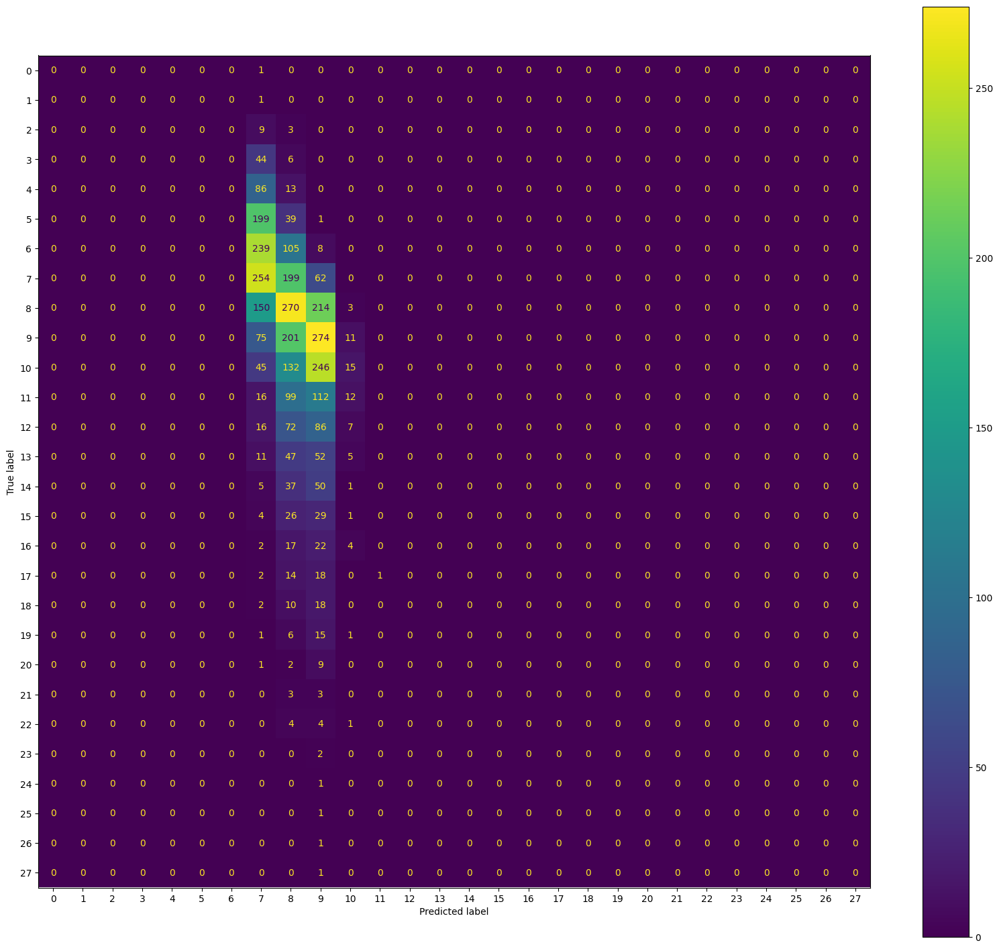

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00        16
           5       0.00      0.00      0.00        20
           6       0.00      0.00      0.00        39
           7       0.15      0.38      0.22        53
           8       0.13      0.38      0.20        52
           9       0.27      0.44      0.34        73
          10       0.13      0.04      0.06        49
          11       0.00      0.00      0.00        28
          12       0.00      0.00      0.00        22
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00         9
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00        13
          17       0.00      0.00      0.00         7
          18       0.00      0.00      0.00         2
          19       0.0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
alpha = 1
Run2(NB2,X2,y2,alpha)

## K-Nearest Neighbors

### Run

In [ ]:
Run2(KNN,X2,y2,n = 10)

Fold 1

Train
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       626
           1       1.00      1.00      1.00       624
           2       0.90      1.00      0.95       612
           3       0.73      0.90      0.81       623
           4       0.64      0.60      0.62       611
           5       0.52      0.55      0.53       609
           6       0.47      0.48      0.47       621
           7       0.41      0.32      0.36       623
           8       0.36      0.22      0.28       622
           9       0.30      0.18      0.23       622
          10       0.37      0.21      0.27       616
          11       0.44      0.31      0.37       610
          12       0.41      0.18      0.25       615
          13       0.44      0.40      0.42       622
          14       0.49      0.51      0.50       627
          15       0.60      0.79      0.68       617
          16       0.65      0.90      0.75       618
          17 

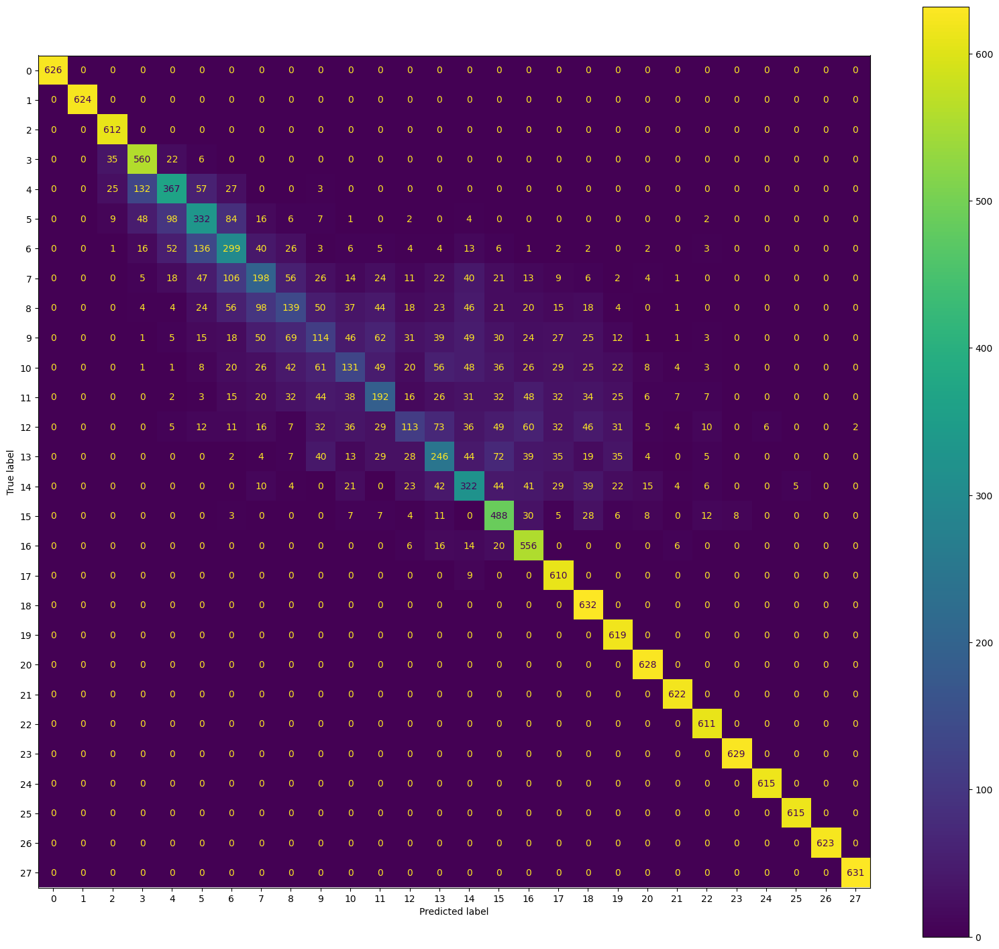

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        63
           1       1.00      1.00      1.00        65
           2       0.86      1.00      0.92        77
           3       0.74      0.88      0.81        66
           4       0.60      0.58      0.59        78
           5       0.42      0.38      0.40        80
           6       0.39      0.46      0.42        68
           7       0.33      0.30      0.31        66
           8       0.22      0.12      0.15        67
           9       0.18      0.10      0.13        67
          10       0.25      0.14      0.18        73
          11       0.31      0.20      0.25        79
          12       0.28      0.11      0.16        74
          13       0.31      0.27      0.29        67
          14       0.36      0.42      0.39        62
          15       0.51      0.65      0.57        72
          16       0.63      0.87      0.73        71
          17       0.6

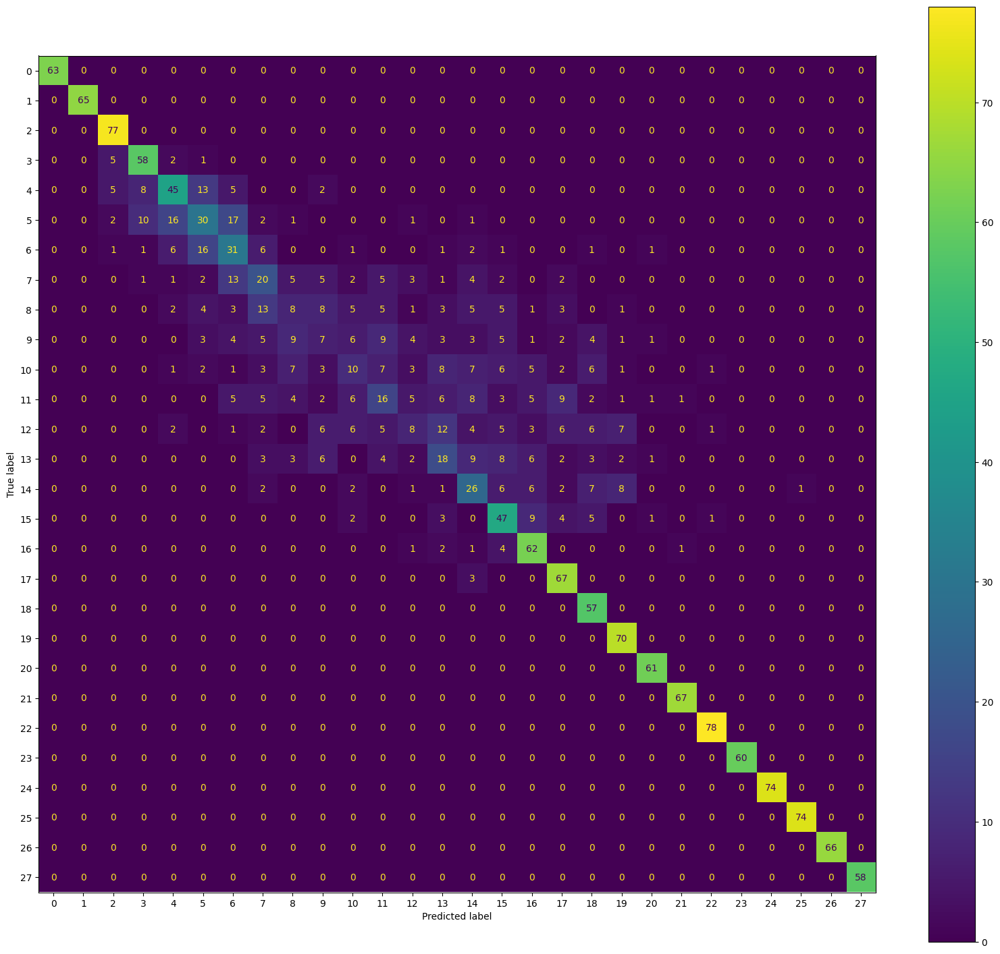

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 2

Train
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       607
           1       1.00      1.00      1.00       617
           2       0.90      1.00      0.95       610
           3       0.73      0.89      0.80       608
           4       0.62      0.61      0.61       621
           5       0.52      0.52      0.52       616
           6       0.45      0.47      0.46       627
           7       0.40      0.32      0.36       616
           8       0.37      0.25      0.30       619
           9       0.31      0.19      0.23       622
          10       0.40      0.23      0.29       632
          11       0.42      0.30      0.35       629
          12       0.43      0.20      0.28       630
          13       0.42      0.37      0.40       621
          14       0.50      0.50      0.50       615
          15       0.58      0.79      0.67       634
          16       0.66      0.89  

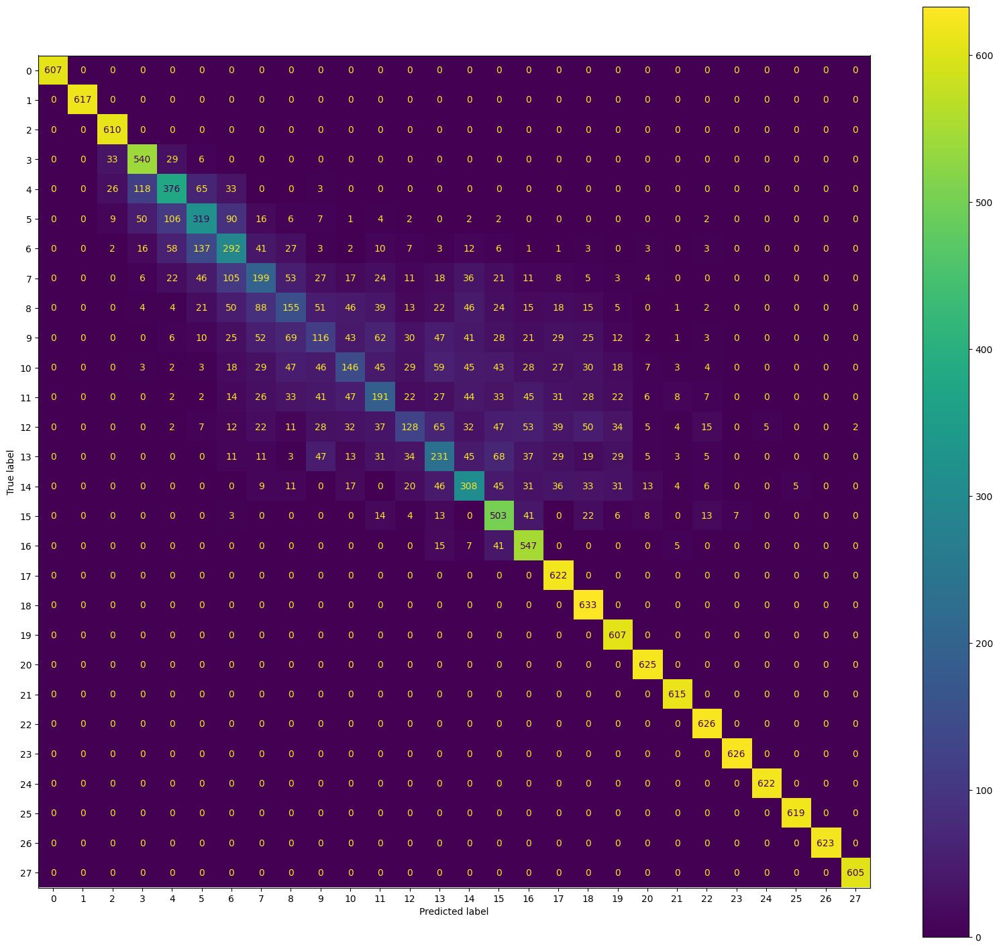

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        82
           1       1.00      1.00      1.00        72
           2       0.86      1.00      0.92        79
           3       0.77      0.83      0.80        81
           4       0.60      0.54      0.57        68
           5       0.48      0.53      0.50        73
           6       0.35      0.39      0.37        62
           7       0.36      0.30      0.33        73
           8       0.29      0.17      0.21        70
           9       0.15      0.07      0.10        67
          10       0.13      0.07      0.09        57
          11       0.36      0.30      0.33        60
          12       0.28      0.12      0.17        59
          13       0.33      0.25      0.29        68
          14       0.49      0.39      0.44        74
          15       0.49      0.75      0.59        55
          16       0.58      0.77      0.66        74
          17       0.7

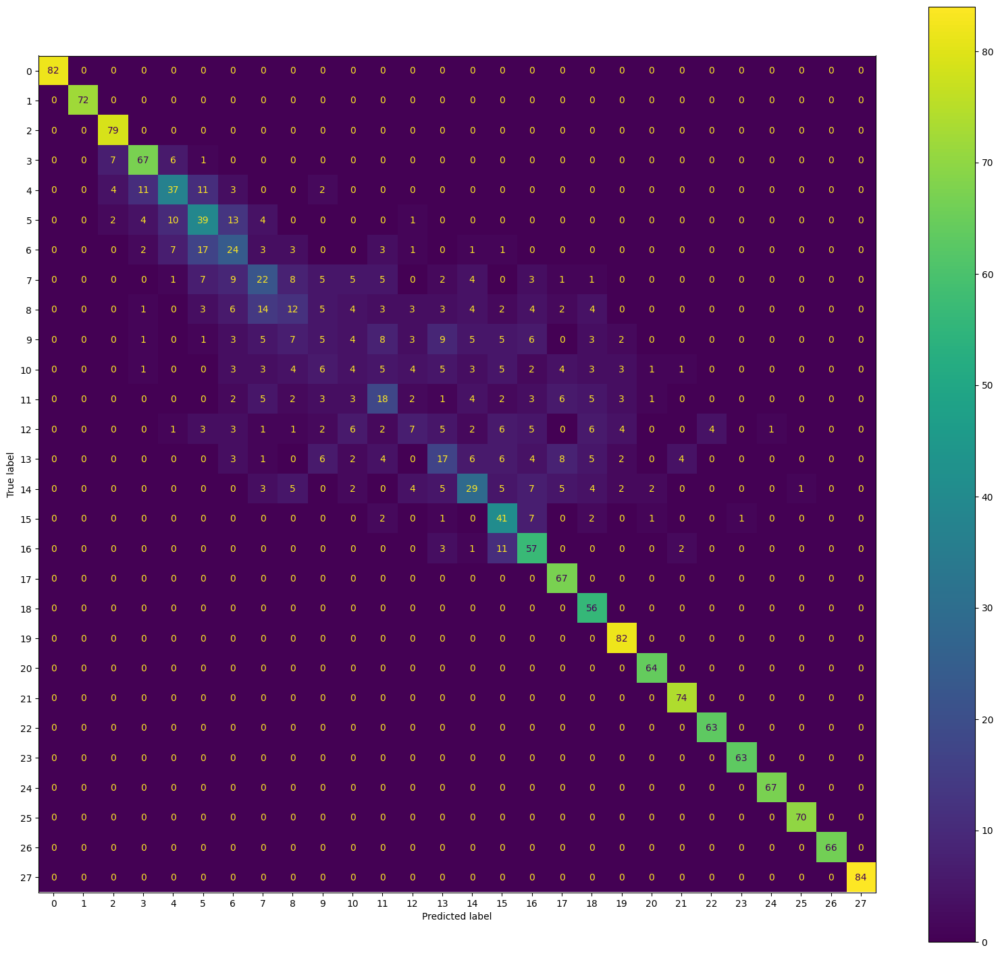

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 3

Train
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       610
           1       1.00      1.00      1.00       617
           2       0.88      1.00      0.93       621
           3       0.72      0.89      0.80       618
           4       0.63      0.57      0.60       613
           5       0.49      0.57      0.53       622
           6       0.47      0.43      0.45       617
           7       0.41      0.32      0.36       620
           8       0.38      0.24      0.29       606
           9       0.31      0.18      0.22       623
          10       0.40      0.20      0.27       620
          11       0.43      0.32      0.37       622
          12       0.41      0.20      0.27       624
          13       0.42      0.35      0.38       612
          14       0.46      0.49      0.48       637
          15       0.58      0.78      0.67       622
          16       0.65      0.92  

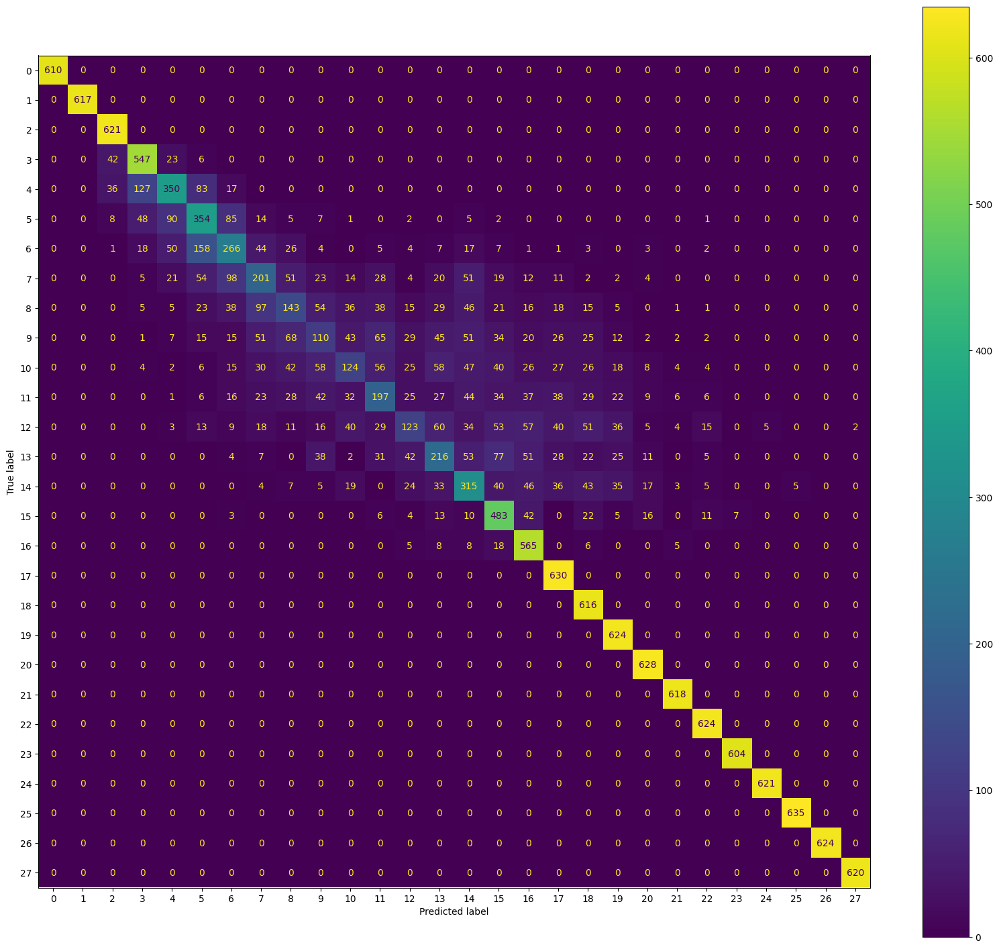

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        79
           1       1.00      1.00      1.00        72
           2       0.77      1.00      0.87        68
           3       0.69      0.73      0.71        71
           4       0.57      0.49      0.52        76
           5       0.45      0.49      0.47        67
           6       0.41      0.36      0.38        72
           7       0.42      0.39      0.40        69
           8       0.30      0.16      0.21        83
           9       0.29      0.17      0.21        66
          10       0.20      0.14      0.17        69
          11       0.31      0.22      0.26        67
          12       0.32      0.17      0.22        65
          13       0.36      0.26      0.30        77
          14       0.31      0.35      0.32        52
          15       0.55      0.72      0.62        67
          16       0.67      0.81      0.74        74
          17       0.7

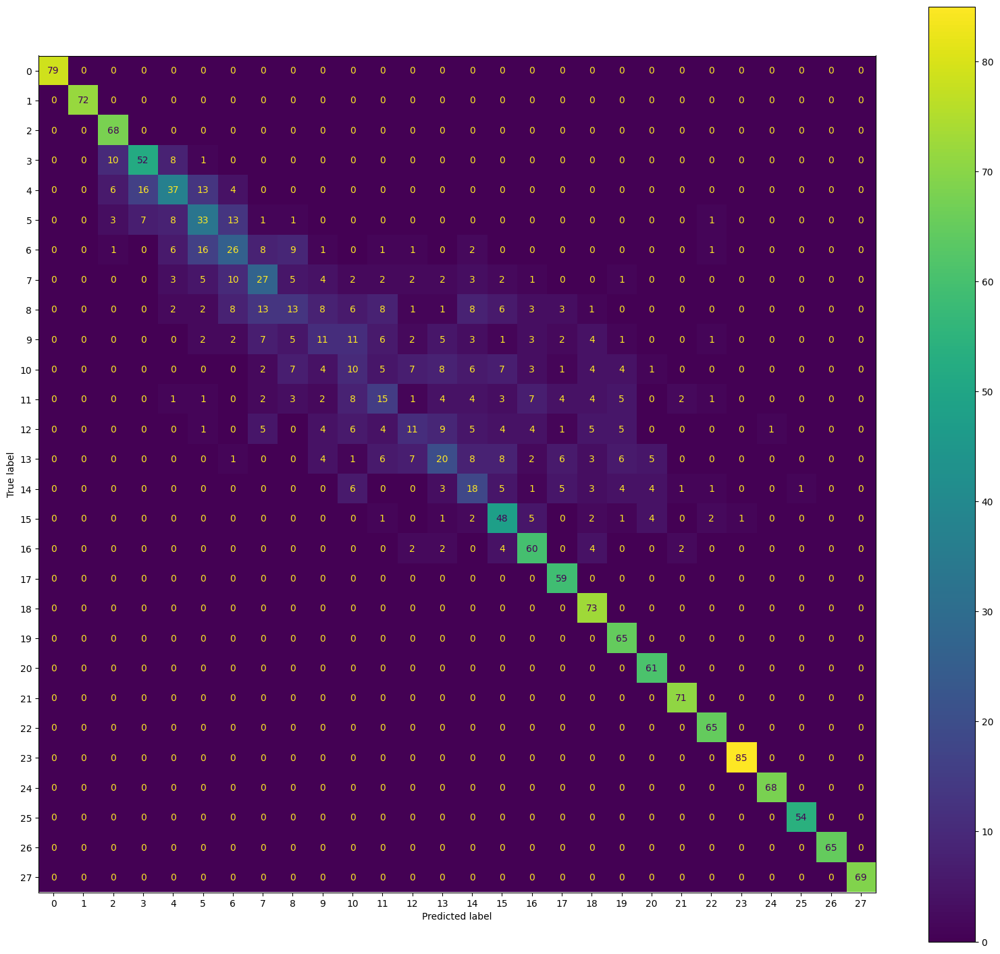

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 4

Train
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       630
           1       1.00      1.00      1.00       614
           2       0.91      1.00      0.95       615
           3       0.74      0.96      0.83       618
           4       0.66      0.60      0.63       617
           5       0.54      0.53      0.54       608
           6       0.49      0.48      0.48       625
           7       0.42      0.34      0.37       618
           8       0.37      0.24      0.29       623
           9       0.31      0.18      0.23       618
          10       0.38      0.22      0.28       629
          11       0.41      0.30      0.35       629
          12       0.40      0.18      0.25       613
          13       0.43      0.37      0.40       611
          14       0.44      0.46      0.45       624
          15       0.58      0.79      0.67       628
          16       0.64      0.88  

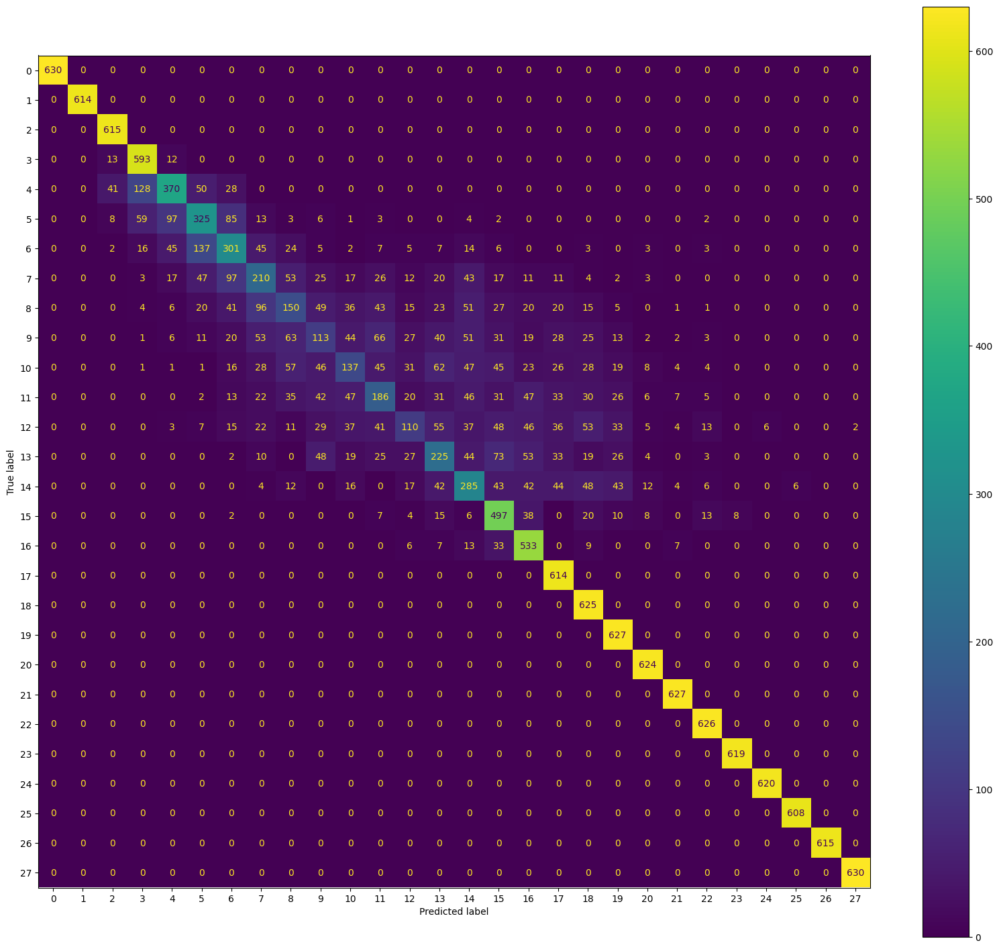

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        59
           1       1.00      1.00      1.00        75
           2       0.89      1.00      0.94        74
           3       0.73      0.93      0.81        71
           4       0.56      0.56      0.56        72
           5       0.51      0.46      0.48        81
           6       0.31      0.33      0.32        64
           7       0.33      0.18      0.23        71
           8       0.21      0.12      0.15        66
           9       0.14      0.10      0.12        71
          10       0.17      0.10      0.12        60
          11       0.29      0.25      0.27        60
          12       0.41      0.14      0.21        76
          13       0.31      0.26      0.28        78
          14       0.35      0.31      0.33        65
          15       0.45      0.67      0.54        61
          16       0.62      0.78      0.69        81
          17       0.7

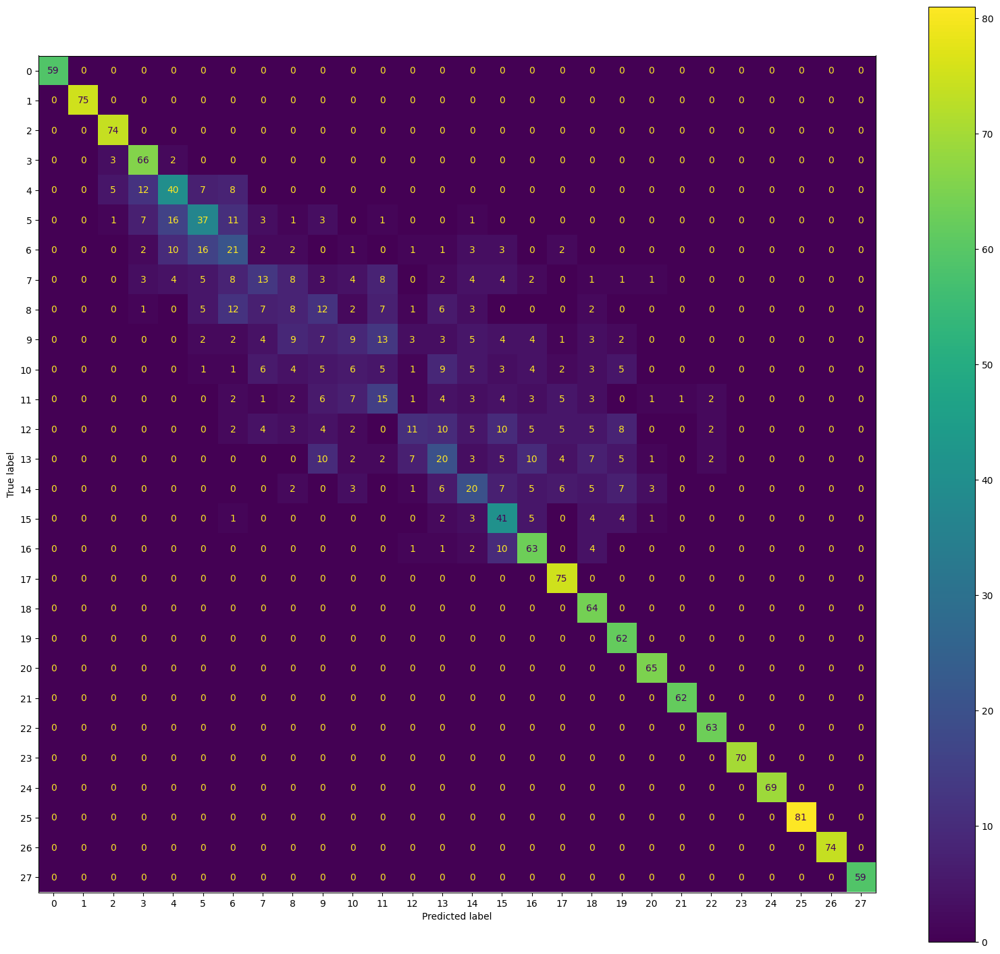

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 5

Train
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       626
           1       1.00      1.00      1.00       623
           2       0.92      1.00      0.96       620
           3       0.76      0.95      0.84       630
           4       0.64      0.63      0.64       616
           5       0.51      0.54      0.52       621
           6       0.48      0.46      0.47       614
           7       0.40      0.32      0.35       612
           8       0.37      0.24      0.29       624
           9       0.32      0.18      0.23       627
          10       0.36      0.19      0.25       617
          11       0.43      0.29      0.34       630
          12       0.42      0.23      0.30       616
          13       0.46      0.40      0.43       631
          14       0.48      0.52      0.50       619
          15       0.60      0.79      0.68       619
          16       0.65      0.91  

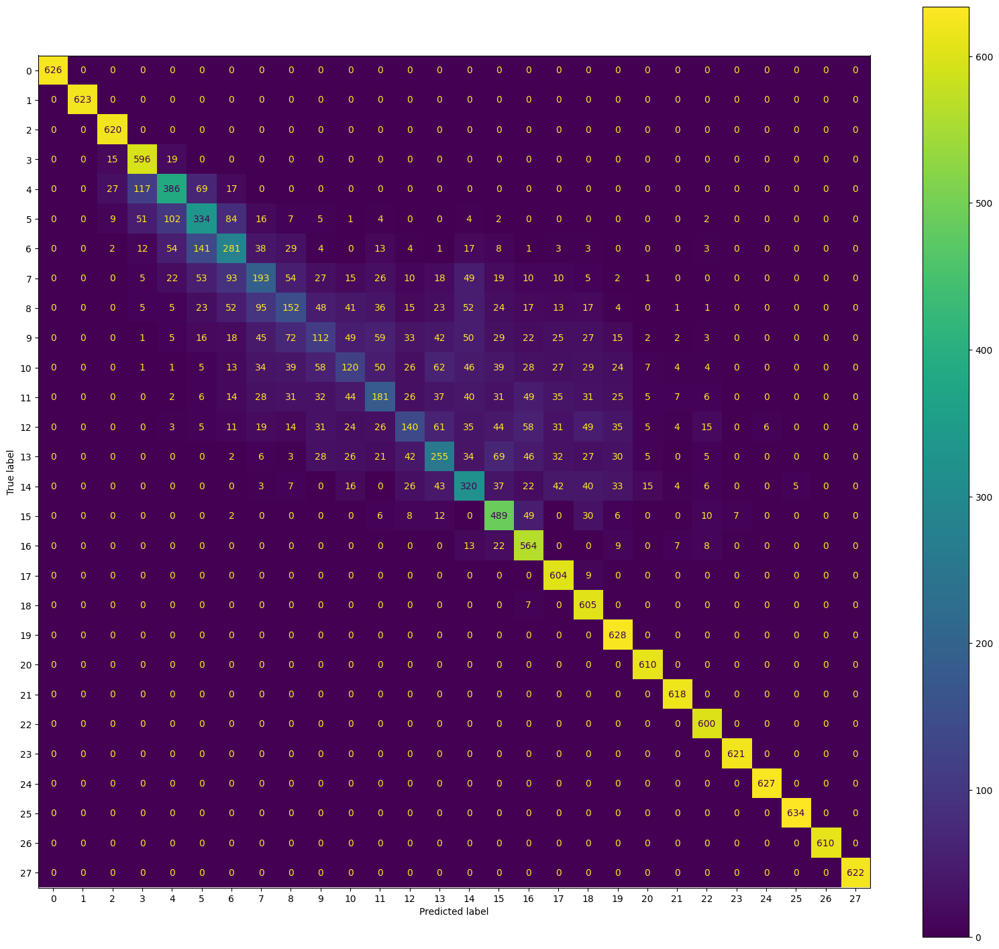

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        63
           1       1.00      1.00      1.00        66
           2       0.95      1.00      0.97        69
           3       0.70      0.90      0.79        59
           4       0.62      0.62      0.62        73
           5       0.45      0.50      0.47        68
           6       0.39      0.41      0.40        75
           7       0.31      0.19      0.24        77
           8       0.23      0.15      0.19        65
           9       0.23      0.13      0.16        62
          10       0.36      0.22      0.28        72
          11       0.29      0.25      0.27        59
          12       0.33      0.14      0.19        73
          13       0.35      0.26      0.30        58
          14       0.38      0.39      0.38        70
          15       0.52      0.67      0.59        70
          16       0.62      0.80      0.70        66
          17       0.6

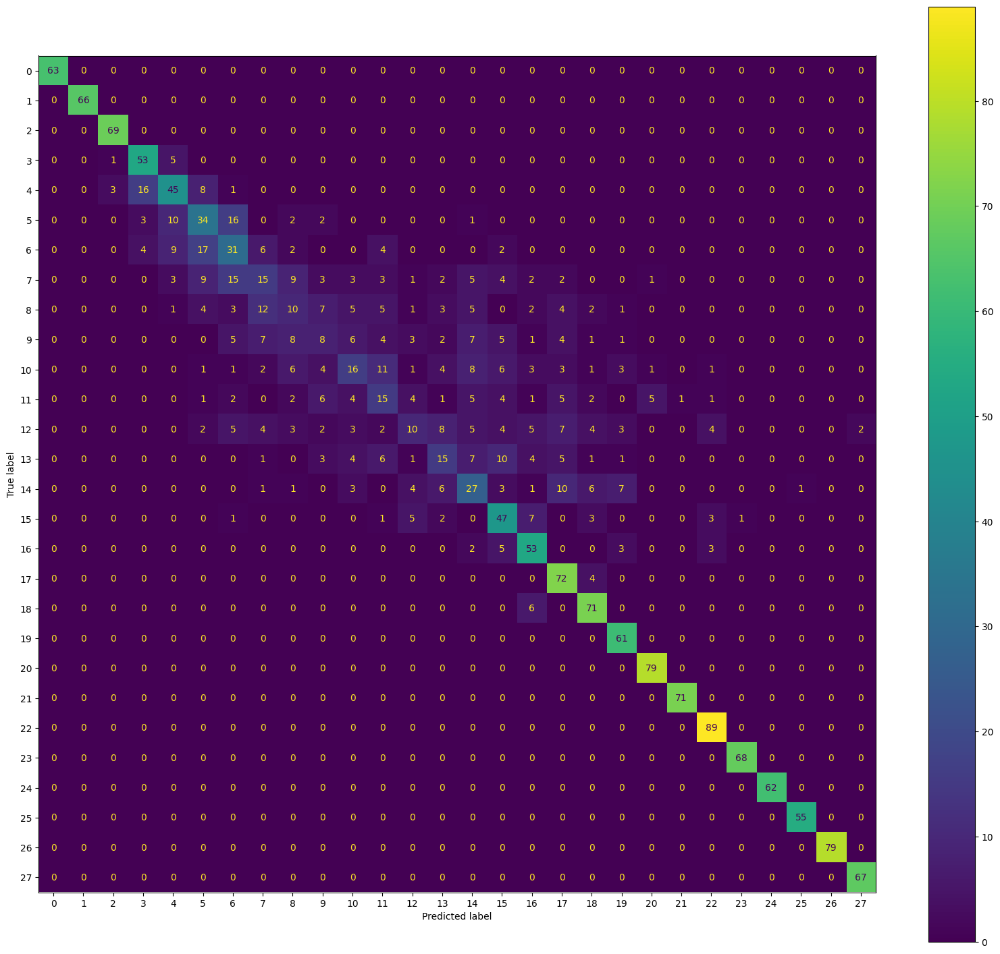

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 6

Train
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       628
           1       1.00      1.00      1.00       621
           2       0.90      1.00      0.94       626
           3       0.72      0.91      0.81       619
           4       0.64      0.62      0.63       625
           5       0.54      0.55      0.55       631
           6       0.47      0.45      0.46       613
           7       0.42      0.30      0.35       618
           8       0.35      0.22      0.27       619
           9       0.32      0.18      0.23       619
          10       0.36      0.23      0.28       622
          11       0.44      0.33      0.38       609
          12       0.50      0.23      0.32       613
          13       0.46      0.41      0.44       613
          14       0.48      0.51      0.49       620
          15       0.59      0.79      0.67       612
          16       0.68      0.90  

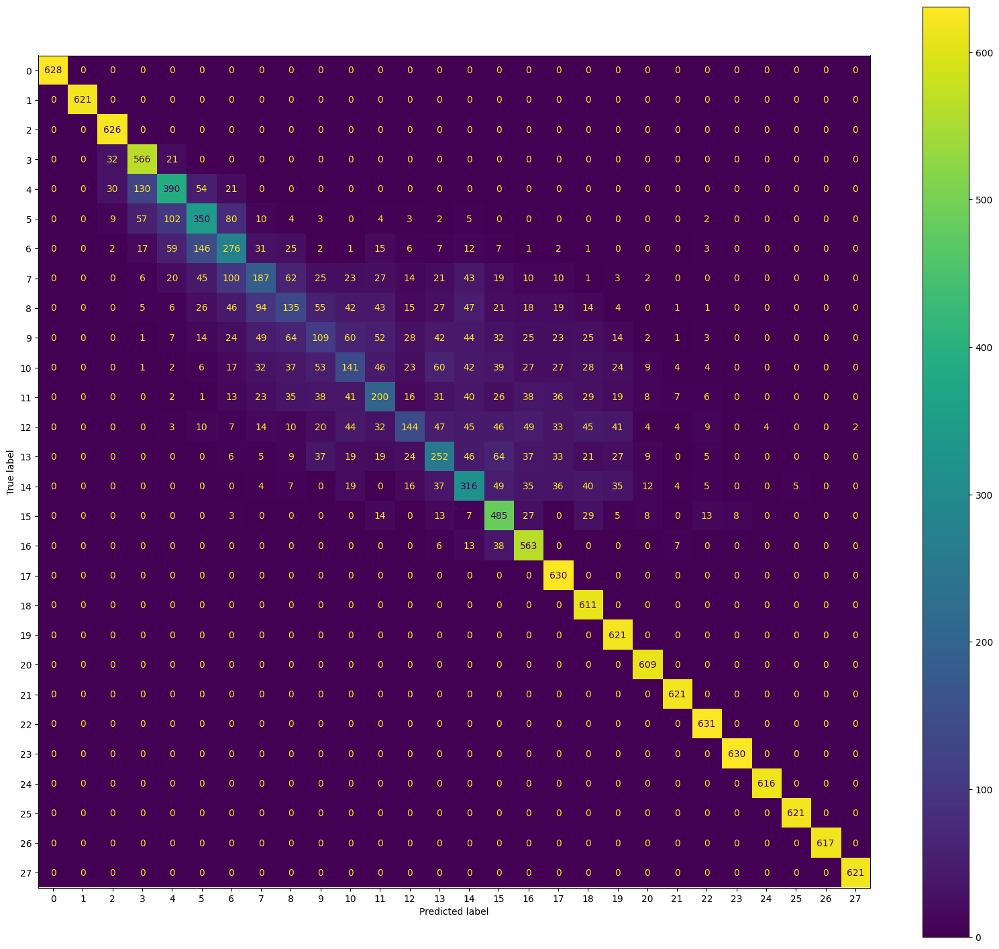

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        61
           1       1.00      1.00      1.00        68
           2       0.93      1.00      0.96        63
           3       0.65      0.84      0.73        70
           4       0.57      0.59      0.58        64
           5       0.44      0.50      0.47        58
           6       0.39      0.26      0.31        76
           7       0.35      0.23      0.27        71
           8       0.24      0.17      0.20        70
           9       0.27      0.14      0.19        70
          10       0.27      0.18      0.21        67
          11       0.51      0.34      0.41        80
          12       0.46      0.16      0.24        76
          13       0.27      0.21      0.24        76
          14       0.38      0.48      0.42        69
          15       0.58      0.79      0.67        77
          16       0.60      0.85      0.71        62
          17       0.6

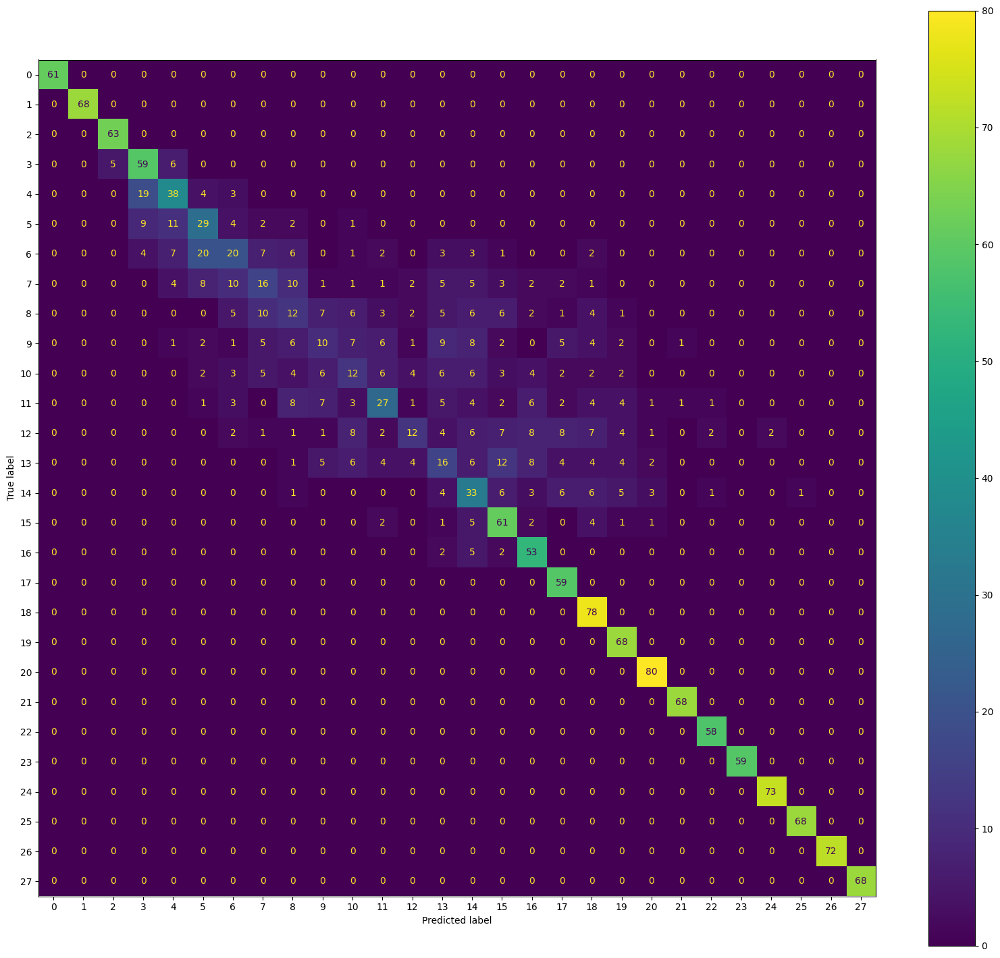

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 7

Train
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       625
           1       1.00      1.00      1.00       624
           2       0.91      1.00      0.95       605
           3       0.73      0.90      0.81       618
           4       0.63      0.61      0.62       618
           5       0.51      0.53      0.52       627
           6       0.46      0.47      0.47       622
           7       0.40      0.31      0.35       619
           8       0.37      0.24      0.29       624
           9       0.33      0.19      0.24       622
          10       0.39      0.22      0.28       625
          11       0.42      0.30      0.35       610
          12       0.44      0.23      0.31       619
          13       0.42      0.37      0.39       624
          14       0.48      0.45      0.46       614
          15       0.57      0.79      0.66       606
          16       0.66      0.89  

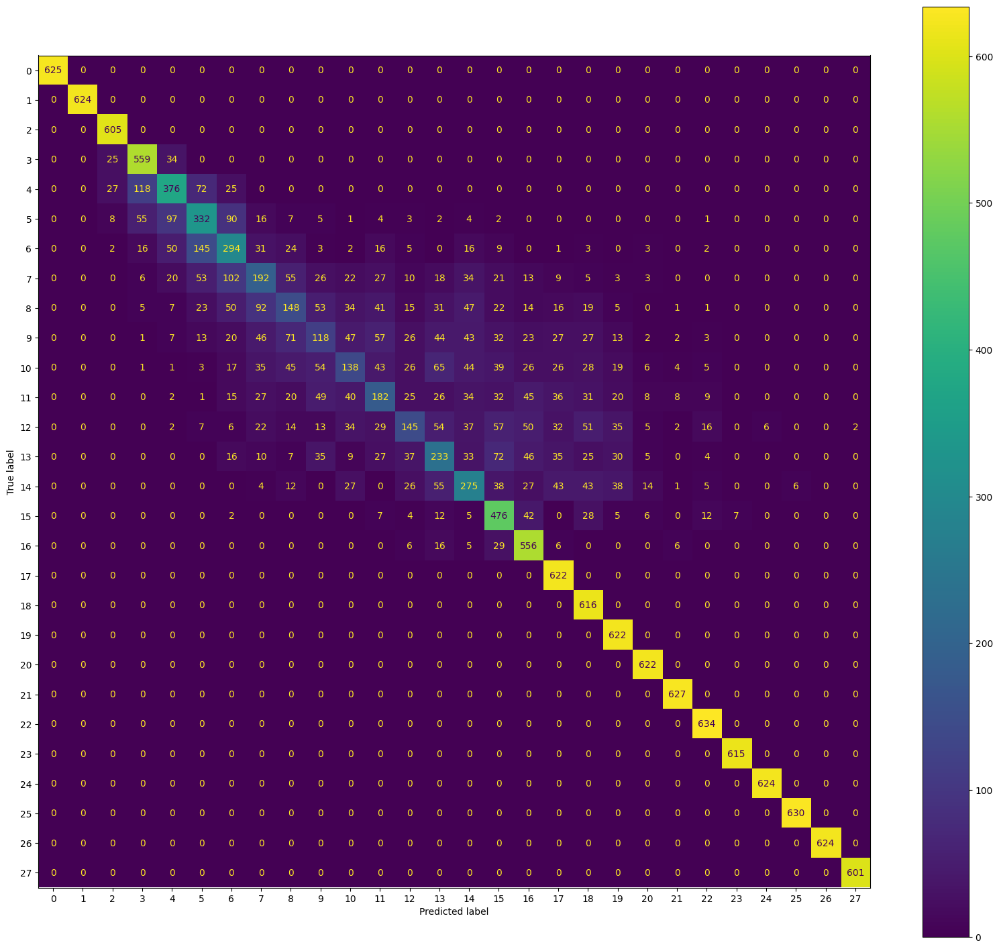

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        64
           1       1.00      1.00      1.00        65
           2       0.92      1.00      0.96        84
           3       0.67      0.83      0.74        71
           4       0.52      0.52      0.52        71
           5       0.38      0.35      0.37        62
           6       0.36      0.40      0.38        67
           7       0.35      0.34      0.35        70
           8       0.29      0.15      0.20        65
           9       0.12      0.07      0.09        67
          10       0.24      0.11      0.15        64
          11       0.48      0.27      0.34        79
          12       0.18      0.10      0.13        70
          13       0.15      0.15      0.15        65
          14       0.39      0.31      0.34        75
          15       0.58      0.71      0.64        83
          16       0.56      0.78      0.65        65
          17       0.6

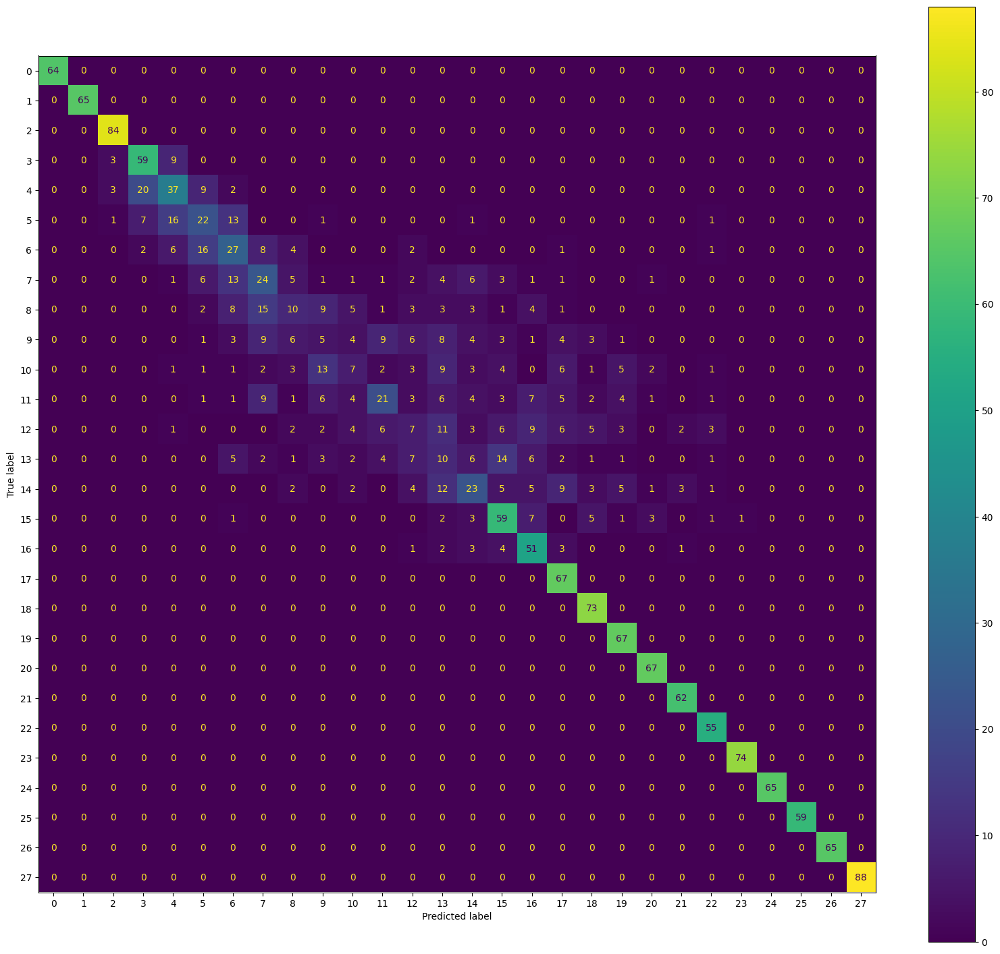

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 8

Train
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       614
           1       1.00      1.00      1.00       629
           2       0.90      1.00      0.95       632
           3       0.73      0.90      0.81       614
           4       0.65      0.61      0.63       622
           5       0.52      0.54      0.53       621
           6       0.46      0.46      0.46       621
           7       0.43      0.31      0.36       618
           8       0.38      0.24      0.29       632
           9       0.32      0.18      0.23       620
          10       0.34      0.19      0.24       605
          11       0.41      0.32      0.36       621
          12       0.45      0.23      0.30       624
          13       0.43      0.38      0.40       615
          14       0.52      0.55      0.53       621
          15       0.61      0.80      0.69       627
          16       0.67      0.90  

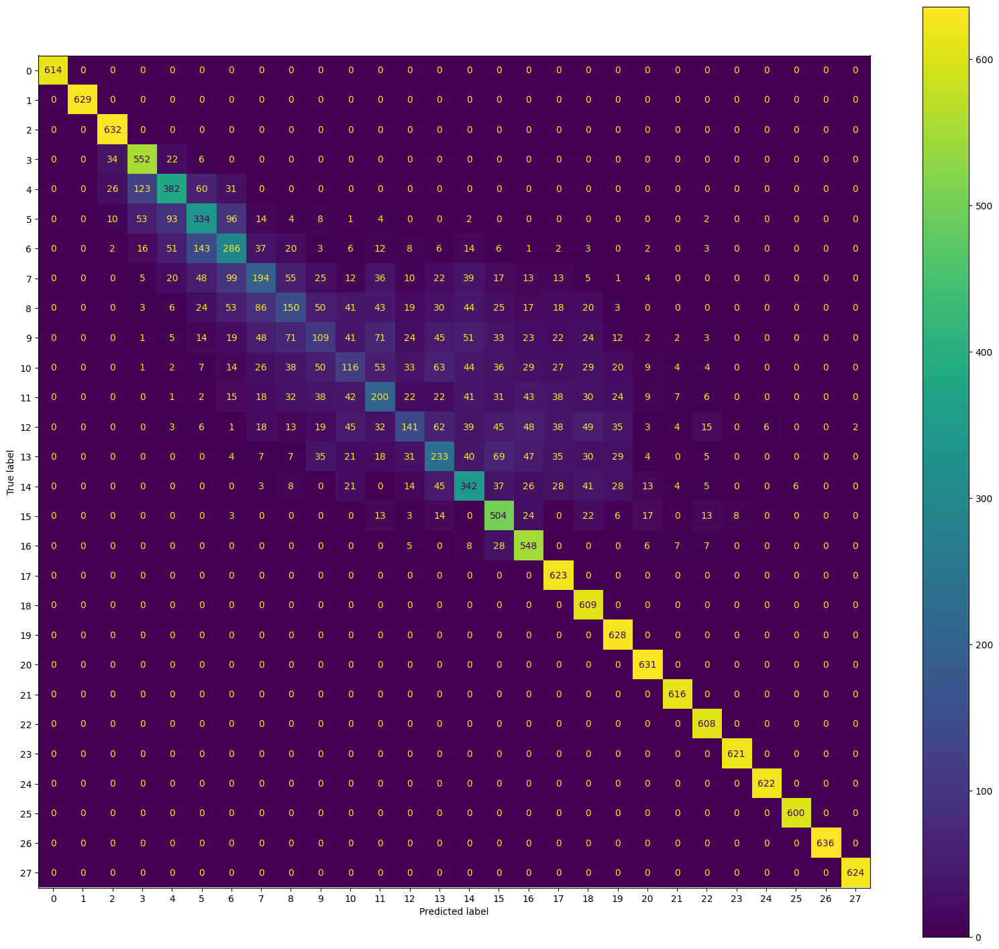

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        75
           1       1.00      1.00      1.00        60
           2       0.84      1.00      0.91        57
           3       0.73      0.88      0.80        75
           4       0.56      0.55      0.56        67
           5       0.45      0.44      0.45        68
           6       0.38      0.40      0.39        68
           7       0.30      0.21      0.25        71
           8       0.23      0.18      0.20        57
           9       0.21      0.13      0.16        69
          10       0.30      0.13      0.18        84
          11       0.40      0.31      0.35        68
          12       0.23      0.09      0.13        65
          13       0.38      0.35      0.37        74
          14       0.52      0.49      0.50        68
          15       0.49      0.79      0.61        62
          16       0.65      0.88      0.75        80
          17       0.7

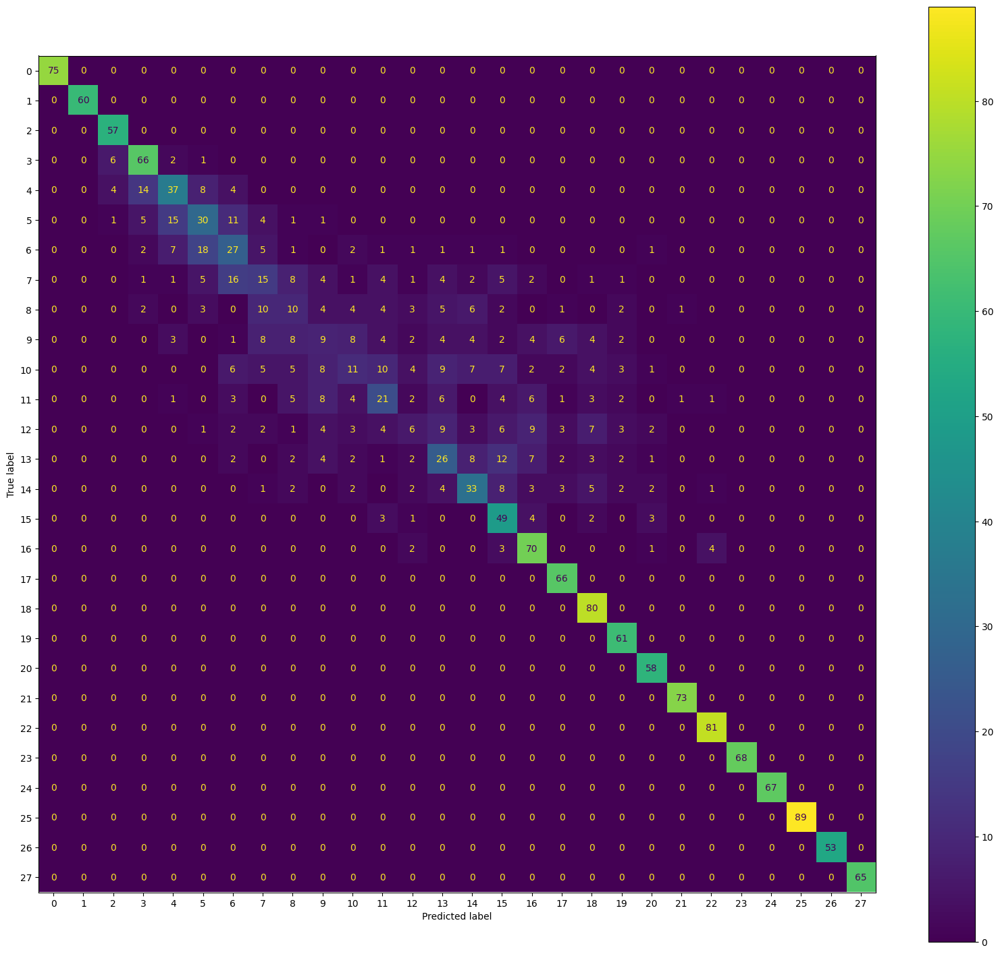

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 9

Train
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       619
           1       1.00      1.00      1.00       621
           2       0.91      1.00      0.95       632
           3       0.73      0.93      0.82       627
           4       0.63      0.60      0.62       621
           5       0.51      0.51      0.51       616
           6       0.46      0.46      0.46       621
           7       0.42      0.33      0.37       637
           8       0.37      0.23      0.28       608
           9       0.30      0.18      0.22       614
          10       0.38      0.21      0.27       618
          11       0.45      0.34      0.39       619
          12       0.48      0.23      0.31       623
          13       0.43      0.41      0.42       627
          14       0.50      0.52      0.51       612
          15       0.60      0.77      0.67       613
          16       0.66      0.92  

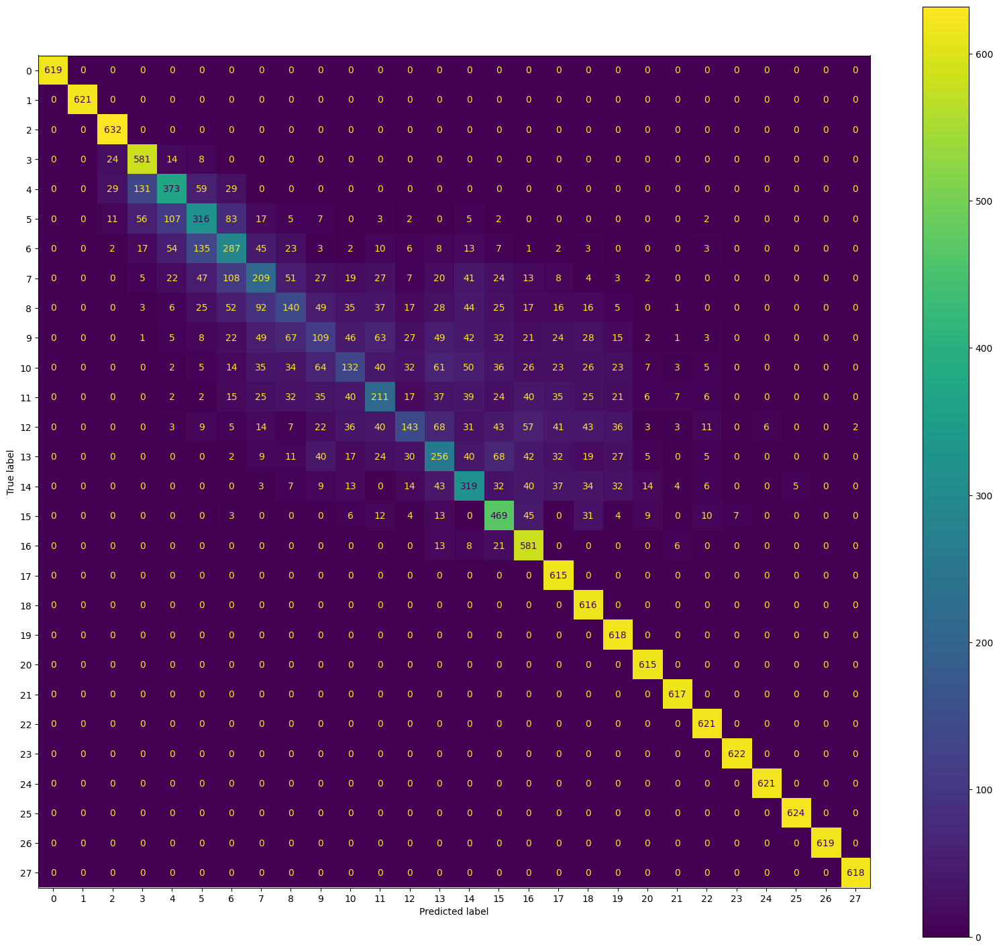

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        70
           1       1.00      1.00      1.00        68
           2       0.86      1.00      0.93        57
           3       0.69      0.89      0.77        62
           4       0.69      0.53      0.60        68
           5       0.55      0.49      0.52        73
           6       0.39      0.43      0.41        68
           7       0.23      0.33      0.27        52
           8       0.17      0.09      0.11        81
           9       0.22      0.15      0.18        75
          10       0.28      0.11      0.16        71
          11       0.25      0.21      0.23        70
          12       0.37      0.21      0.27        66
          13       0.26      0.24      0.25        62
          14       0.48      0.45      0.47        77
          15       0.65      0.63      0.64        76
          16       0.54      0.88      0.67        60
          17       0.7

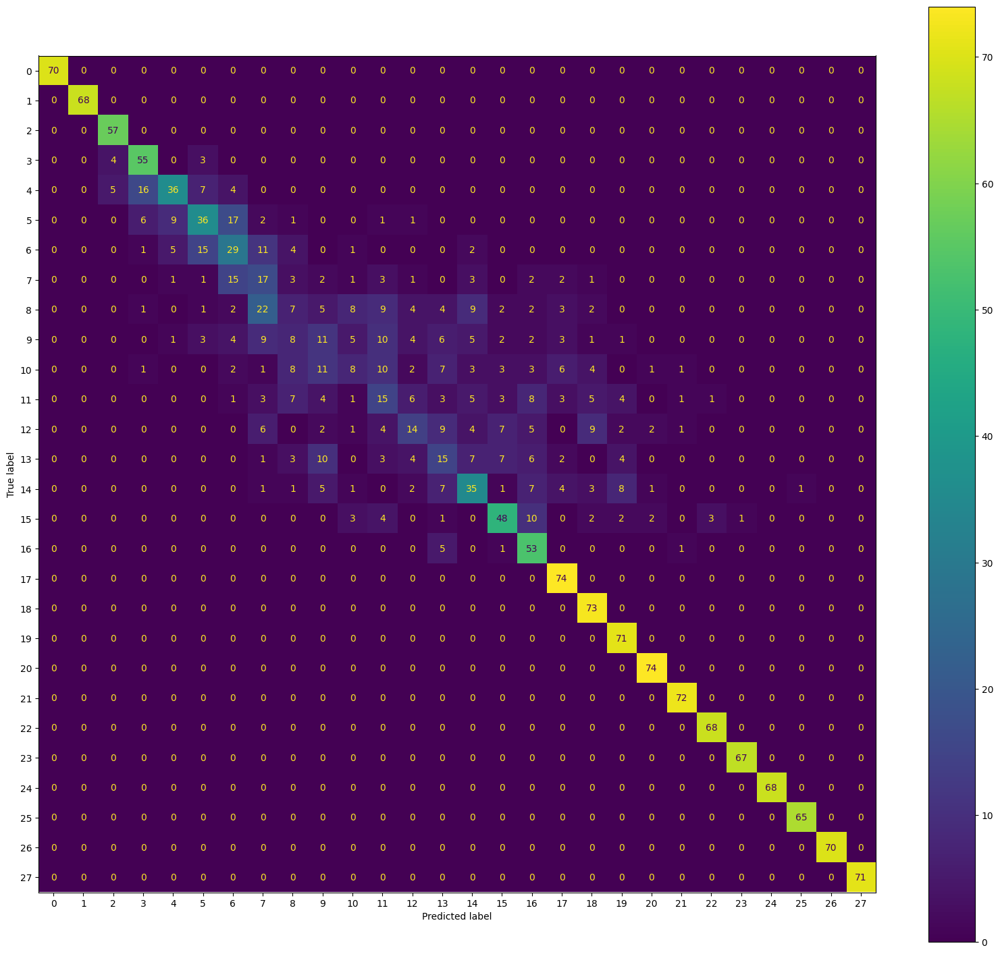

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Fold 10

Train
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       616
           1       1.00      1.00      1.00       611
           2       0.90      1.00      0.95       628
           3       0.74      0.92      0.82       626
           4       0.65      0.62      0.63       637
           5       0.51      0.54      0.52       630
           6       0.47      0.47      0.47       620
           7       0.40      0.32      0.36       620
           8       0.37      0.23      0.29       624
           9       0.32      0.18      0.23       614
          10       0.35      0.20      0.25       617
          11       0.44      0.34      0.38       622
          12       0.45      0.19      0.27       624
          13       0.44      0.44      0.44       625
          14       0.51      0.48      0.50       612
          15       0.62      0.83      0.71       623
          16       0.66      0.90 

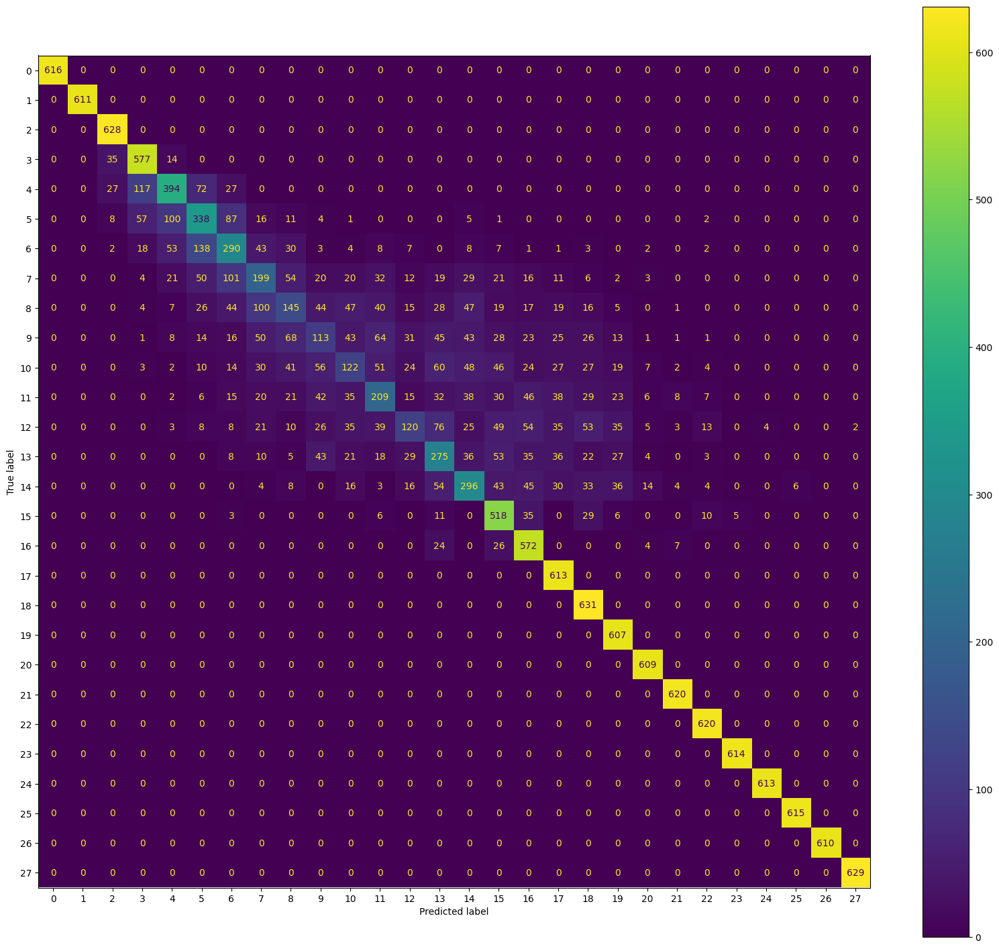

<Figure size 2000x1800 with 0 Axes>

Test
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        73
           1       1.00      1.00      1.00        78
           2       0.87      1.00      0.93        61
           3       0.74      0.92      0.82        63
           4       0.50      0.48      0.49        52
           5       0.40      0.49      0.44        59
           6       0.43      0.38      0.40        69
           7       0.44      0.29      0.35        69
           8       0.19      0.12      0.15        65
           9       0.12      0.05      0.07        75
          10       0.18      0.11      0.14        72
          11       0.37      0.25      0.30        67
          12       0.35      0.12      0.18        65
          13       0.34      0.39      0.36        64
          14       0.43      0.39      0.41        77
          15       0.54      0.74      0.62        66
          16       0.52      0.79      0.62        56
          17       0.8

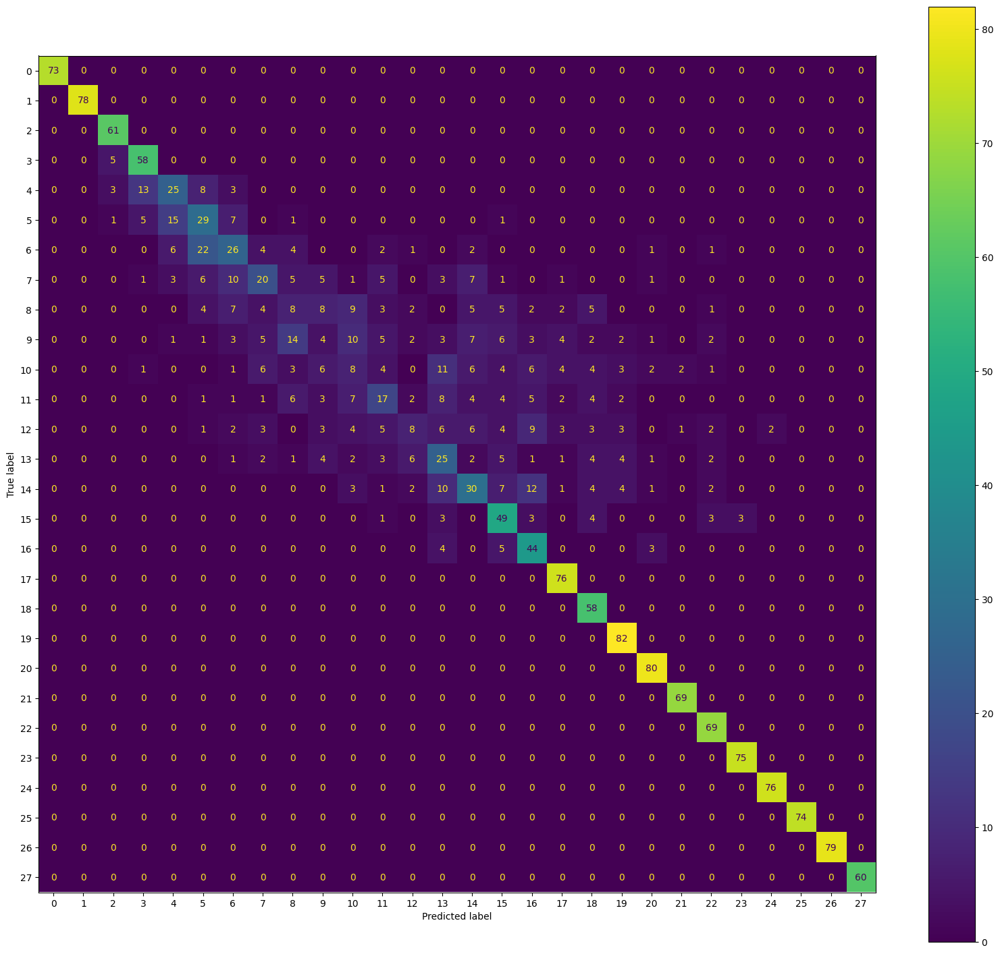

<Figure size 2000x1800 with 0 Axes>

-------------------------------
Average of Acuuracies 0.7


0.7

In [ ]:
Run2(KNN,X2,y2,n = 20)

In [ ]:
Run2(KNN,X2,y2,n = 15)

In [ ]:
resualts = []
for i in range(1,30):
  resualts.append((Run(KNN,X2,y2,n = i),i))

Fold 1

Train
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       1.00      1.00      1.00         1
           2       1.00      1.00      1.00        13
           3       1.00      1.00      1.00        45
           4       1.00      1.00      1.00       104
           5       1.00      1.00      1.00       229
           6       1.00      1.00      1.00       354
           7       1.00      1.00      1.00       505
           8       1.00      1.00      1.00       629
           9       1.00      1.00      1.00       572
          10       1.00      1.00      1.00       442
          11       1.00      1.00      1.00       243
          12       1.00      1.00      1.00       183
          13       1.00      1.00      1.00       116
          14       1.00      1.00      1.00        88
          15       1.00      1.00      1.00        62
          16       1.00      1.00      1.00        53
          17 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

accuracy: 1.0

Test
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         2
           3       0.33      0.50      0.40         4
           4       0.22      0.15      0.18        13
           5       0.32      0.24      0.28        33
           6       0.26      0.43      0.32        28
           7       0.22      0.24      0.23        51
           8       0.21      0.21      0.21        72
           9       0.22      0.23      0.23        64
          10       0.24      0.20      0.22        56
          11       0.08      0.08      0.08        26
          12       0.07      0.05      0.06        20
          13       0.06      0.06      0.06        18
          14       0.11      0.08      0.10        12
          15       0.00      0.00      0.00         5
          16       0.29      0.33      0.31         6
          17       0.00      0.00      0.00         2
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

accuracy: 1.0

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.11      0.33      0.17         3
           4       0.12      0.08      0.10        12
           5       0.20      0.11      0.14        27
           6       0.21      0.20      0.20        41
           7       0.22      0.20      0.21        59
           8       0.24      0.26      0.25        73
           9       0.37      0.32      0.34        68
          10       0.14      0.20      0.17        45
          11       0.14      0.15      0.15        20
          12       0.19      0.24      0.21        17
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00         8
          15       0.14      0.12      0.13         8
          16       0.00      0.00      0.00         4
          17       0.33      0.17      0.22         6
          18       0.00      0.00      0.00         5
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


accuracy: 1.0

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.33      0.40      0.36         5
           4       0.11      0.17      0.13         6
           5       0.34      0.32      0.33        31
           6       0.35      0.38      0.36        48
           7       0.17      0.19      0.18        52
           8       0.16      0.17      0.16        65
           9       0.25      0.25      0.25        63
          10       0.26      0.17      0.21        52
          11       0.14      0.14      0.14        29
          12       0.04      0.05      0.05        19
          13       0.00      0.00      0.00        11
          14       0.08      0.12      0.10         8
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         8
          17       0.00      0.00      0.00         6
          18       0.00      0.00      0.00         2
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


accuracy: 1.0

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         0
           3       0.25      0.50      0.33         4
           4       0.00      0.00      0.00        13
           5       0.29      0.45      0.35        22
           6       0.26      0.22      0.24        50
           7       0.21      0.20      0.21        49
           8       0.24      0.27      0.26        70
           9       0.17      0.20      0.18        54
          10       0.17      0.16      0.17        49
          11       0.12      0.10      0.11        30
          12       0.00      0.00      0.00        22
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00        14
          15       0.00      0.00      0.00         9
          16       0.00      0.00      0.00         8
          17       0.00      0.00      0.00         1
          18       0.00      0.00      0.00         3
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

accuracy: 1.0

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.25      0.33      0.29         6
           4       0.33      0.30      0.32        10
           5       0.35      0.26      0.30        31
           6       0.29      0.28      0.29        43
           7       0.20      0.26      0.23        53
           8       0.17      0.17      0.17        63
           9       0.22      0.20      0.21        66
          10       0.22      0.24      0.23        46
          11       0.16      0.16      0.16        25
          12       0.06      0.05      0.05        21
          13       0.10      0.08      0.09        13
          14       0.10      0.10      0.10        10
          15       0.00      0.00      0.00        10
          16       0.00      0.00      0.00         2
          17       0.00      0.00      0.00         2
          18       0.00      0.00      0.00         6
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

accuracy: 1.0

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         3
           4       0.33      0.15      0.21        13
           5       0.25      0.26      0.26        19
           6       0.21      0.23      0.22        39
           7       0.32      0.28      0.30        60
           8       0.19      0.18      0.18        74
           9       0.22      0.24      0.23        63
          10       0.20      0.27      0.23        48
          11       0.05      0.04      0.04        24
          12       0.10      0.14      0.12        21
          13       0.06      0.08      0.07        13
          14       0.00      0.00      0.00        14
          15       0.14      0.14      0.14         7
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         4
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

accuracy: 1.0

Test
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         0
           3       0.33      0.20      0.25         5
           4       0.29      0.36      0.32        11
           5       0.28      0.26      0.27        27
           6       0.13      0.16      0.14        31
           7       0.25      0.26      0.26        61
           8       0.29      0.28      0.28        71
           9       0.26      0.19      0.22        72
          10       0.28      0.21      0.24        48
          11       0.04      0.07      0.05        30
          12       0.09      0.11      0.10        19
          13       0.00      0.00      0.00        10
          14       0.00      0.00      0.00         6
          15       0.00      0.00      0.00         5
          16       0.18      0.40      0.25         5
          17       0.00      0.00      0.00         5
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

accuracy: 1.0

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.67      0.36      0.47        11
           4       0.43      0.67      0.52         9
           5       0.15      0.29      0.20        14
           6       0.23      0.20      0.21        40
           7       0.23      0.20      0.21        66
           8       0.19      0.21      0.20        66
           9       0.23      0.22      0.22        64
          10       0.18      0.22      0.20        55
          11       0.17      0.17      0.17        23
          12       0.06      0.04      0.05        23
          13       0.00      0.00      0.00        14
          14       0.00      0.00      0.00        10
          15       0.33      0.17      0.22         6
          16       0.20      0.14      0.17         7
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         3
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

accuracy: 1.0

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         0
           3       0.20      0.25      0.22         4
           4       0.50      0.29      0.37        17
           5       0.16      0.16      0.16        25
           6       0.21      0.26      0.23        34
           7       0.21      0.22      0.22        54
           8       0.28      0.24      0.26        75
           9       0.29      0.31      0.30        58
          10       0.18      0.26      0.21        43
          11       0.12      0.08      0.10        36
          12       0.22      0.19      0.21        21
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00         6
          15       0.17      0.20      0.18         5
          16       0.22      0.29      0.25         7
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         4
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

accuracy: 0.6

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         0
           3       0.50      0.80      0.62         5
           4       0.21      0.23      0.22        13
           5       0.37      0.56      0.44        27
           6       0.33      0.36      0.35        36
           7       0.18      0.22      0.20        55
           8       0.20      0.21      0.21        82
           9       0.26      0.31      0.28        65
          10       0.07      0.07      0.07        41
          11       0.00      0.00      0.00        19
          12       0.06      0.06      0.06        17
          13       0.33      0.10      0.15        10
          14       0.20      0.10      0.13        10
          15       0.00      0.00      0.00        11
          16       0.00      0.00      0.00         8
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         3
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

accuracy: 0.59

Test
              precision    recall  f1-score   support

           2       0.50      0.50      0.50         2
           3       0.14      0.25      0.18         4
           4       0.23      0.38      0.29         8
           5       0.17      0.23      0.20        22
           6       0.33      0.37      0.35        38
           7       0.19      0.25      0.22        60
           8       0.16      0.21      0.19        71
           9       0.26      0.28      0.27        64
          10       0.20      0.18      0.19        56
          11       0.25      0.17      0.21        23
          12       0.11      0.06      0.08        17
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00         7
          15       0.50      0.08      0.14        12
          16       0.00      0.00      0.00         8
          17       0.00      0.00      0.00         7
          18       0.00      0.00      0.00         2
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.59

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.14      0.25      0.18         4
           4       0.17      0.30      0.21        10
           5       0.17      0.29      0.22        28
           6       0.21      0.21      0.21        42
           7       0.22      0.28      0.25        61
           8       0.20      0.23      0.22        73
           9       0.22      0.24      0.23        62
          10       0.13      0.08      0.10        51
          11       0.12      0.07      0.09        30
          12       0.12      0.11      0.11        18
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00         5
          15       0.50      0.14      0.22         7
          16       0.00      0.00      0.00         6
          17       0.50      0.50      0.50         2
          18       0.00      0.00      0.00         1
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.59

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00        11
           4       0.24      0.83      0.37         6
           5       0.29      0.43      0.35        23
           6       0.23      0.31      0.27        42
           7       0.19      0.27      0.22        49
           8       0.22      0.27      0.24        75
           9       0.27      0.24      0.25        67
          10       0.16      0.12      0.14        48
          11       0.06      0.04      0.05        26
          12       0.00      0.00      0.00        24
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00         8
          15       0.00      0.00      0.00         5
          16       0.00      0.00      0.00         6
          17       1.00      0.33      0.50         3
          18       1.00      0.25      0.40         4
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.6

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.17      0.33      0.22         3
           4       0.27      0.27      0.27        15
           5       0.20      0.26      0.22        31
           6       0.25      0.27      0.26        44
           7       0.28      0.36      0.31        67
           8       0.21      0.37      0.27        51
           9       0.22      0.21      0.21        58
          10       0.33      0.25      0.29        52
          11       0.09      0.04      0.06        24
          12       0.22      0.08      0.11        26
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00        10
          15       0.00      0.00      0.00         2
          16       0.00      0.00      0.00         2
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         7
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.6

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.11      0.14      0.12         7
           4       0.18      0.27      0.21        11
           5       0.22      0.30      0.25        27
           6       0.20      0.22      0.21        46
           7       0.19      0.27      0.23        55
           8       0.25      0.28      0.26        65
           9       0.17      0.24      0.20        49
          10       0.23      0.15      0.18        48
          11       0.05      0.04      0.04        25
          12       0.09      0.04      0.05        27
          13       0.00      0.00      0.00        17
          14       0.00      0.00      0.00        18
          15       0.33      0.11      0.17         9
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         6
          18       0.00      0.00      0.00         2

    ac

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.6

Test
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.17      1.00      0.29         1
           3       0.25      0.29      0.27         7
           4       0.38      0.62      0.48         8
           5       0.41      0.42      0.42        26
           6       0.27      0.33      0.30        40
           7       0.23      0.30      0.26        56
           8       0.24      0.31      0.27        67
           9       0.29      0.26      0.28        72
          10       0.20      0.23      0.21        40
          11       0.19      0.10      0.13        30
          12       0.25      0.09      0.13        22
          13       0.00      0.00      0.00        16
          14       0.00      0.00      0.00         9
          15       0.17      0.20      0.18         5
          16       0.00      0.00      0.00         3
          17       0.00      0.00      0.00         6
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.6

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.30      0.75      0.43         4
           4       0.60      0.27      0.37        22
           5       0.29      0.37      0.33        27
           6       0.16      0.38      0.22        26
           7       0.19      0.24      0.21        54
           8       0.24      0.26      0.25        68
           9       0.24      0.23      0.23        75
          10       0.27      0.20      0.23        54
          11       0.33      0.13      0.19        31
          12       0.18      0.12      0.15        16
          13       0.00      0.00      0.00         7
          14       0.00      0.00      0.00        12
          15       0.33      0.17      0.22         6
          16       0.50      0.29      0.36         7
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         2
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           2       0.61      1.00      0.76        14
           3       0.63      0.90      0.74        52
           4       0.68      0.84      0.75       104
           5       0.61      0.88      0.72       234
           6       0.58      0.75      0.66       354
           7       0.60      0.74      0.66       510
           8       0.58      0.71      0.64       627
           9       0.63      0.63      0.63       571
          10       0.61      0.51      0.55       441
          11       0.55      0.33      0.41       238
          12       0.56      0.33      0.41       180
          13       0.56      0.29      0.38       107
          14       0.47      0.19      0.27        94
          15       0.53      0.26      0.35        61
          16       0.62      0.24      0.35        54
          17       0.64      0.17      0.27        40
          18       0.50    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         5
           4       0.29      0.45      0.36        11
           5       0.22      0.28      0.25        25
           6       0.22      0.32      0.26        37
           7       0.23      0.26      0.24        58
           8       0.26      0.39      0.31        62
           9       0.22      0.25      0.23        63
          10       0.21      0.17      0.19        46
          11       0.00      0.00      0.00        29
          12       0.00      0.00      0.00        23
          13       0.00      0.00      0.00        19
          14       0.00      0.00      0.00         8
          15       0.50      0.17      0.25         6
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         2
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       1.00      1.00      1.00         1
           2       0.55      1.00      0.71        12
           3       0.64      0.90      0.75        50
           4       0.66      0.81      0.73       104
           5       0.63      0.86      0.73       236
           6       0.61      0.76      0.68       351
           7       0.59      0.77      0.67       515
           8       0.59      0.71      0.64       614
           9       0.63      0.65      0.64       575
          10       0.59      0.49      0.54       436
          11       0.54      0.32      0.40       237
          12       0.54      0.29      0.38       190
          13       0.53      0.29      0.38       117
          14       0.41      0.14      0.21        87
          15       0.49      0.27      0.35        63
          16       0.60      0.19      0.29        48
          17       0.69    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           2       0.50      0.33      0.40         3
           3       0.27      0.43      0.33         7
           4       0.19      0.27      0.22        11
           5       0.16      0.26      0.20        23
           6       0.09      0.12      0.11        40
           7       0.21      0.25      0.23        53
           8       0.28      0.35      0.31        75
           9       0.16      0.17      0.17        59
          10       0.26      0.20      0.22        51
          11       0.12      0.07      0.09        30
          12       0.00      0.00      0.00        13
          13       0.00      0.00      0.00         9
          14       0.00      0.00      0.00        15
          15       0.00      0.00      0.00         4
          16       0.00      0.00      0.00        10
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         3
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       0.50      1.00      0.67         1
           2       0.44      0.54      0.48        13
           3       0.50      0.81      0.62        52
           4       0.54      0.66      0.60       103
           5       0.52      0.68      0.59       234
           6       0.50      0.68      0.58       361
           7       0.50      0.63      0.56       513
           8       0.50      0.64      0.56       616
           9       0.55      0.56      0.55       558
          10       0.53      0.46      0.49       439
          11       0.50      0.30      0.37       244
          12       0.46      0.20      0.28       179
          13       0.40      0.16      0.23       117
          14       0.42      0.14      0.21        92
          15       0.65      0.22      0.33        59
          16       0.73      0.21      0.32        53
          17       0.80    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       1.00      1.00      1.00         1
           2       0.50      0.75      0.60        12
           3       0.57      0.78      0.66        54
           4       0.53      0.73      0.61       103
           5       0.53      0.70      0.60       238
           6       0.51      0.67      0.58       345
           7       0.49      0.63      0.55       515
           8       0.50      0.64      0.56       612
           9       0.54      0.52      0.53       579
          10       0.54      0.48      0.51       439
          11       0.50      0.32      0.39       242
          12       0.44      0.20      0.28       184
          13       0.43      0.18      0.25       111
          14       0.47      0.15      0.23        91
          15       0.68      0.21      0.33        61
          16       0.79      0.23      0.35        48
          17       0.71    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.25      0.67      0.36         3
           4       0.25      0.33      0.29        12
           5       0.15      0.29      0.20        21
           6       0.22      0.22      0.22        46
           7       0.24      0.40      0.30        53
           8       0.24      0.26      0.25        77
           9       0.16      0.22      0.18        55
          10       0.23      0.15      0.18        48
          11       0.00      0.00      0.00        25
          12       0.17      0.05      0.08        19
          13       0.20      0.07      0.10        15
          14       0.00      0.00      0.00        11
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00        10
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         3
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       0.00      0.00      0.00         1
           2       0.39      0.64      0.48        11
           3       0.51      0.78      0.62        51
           4       0.55      0.73      0.63       106
           5       0.51      0.65      0.57       235
           6       0.50      0.66      0.57       354
           7       0.51      0.66      0.57       514
           8       0.49      0.63      0.55       632
           9       0.52      0.50      0.51       573
          10       0.54      0.47      0.50       431
          11       0.54      0.33      0.41       235
          12       0.46      0.24      0.32       182
          13       0.43      0.17      0.24       109
          14       0.52      0.12      0.19        93
          15       0.62      0.14      0.23        56
          16       0.74      0.26      0.39        53
          17       0.43    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       1.00      1.00      1.00         1
           2       0.38      0.62      0.47        13
           3       0.54      0.79      0.64        52
           4       0.53      0.67      0.59       106
           5       0.53      0.70      0.60       233
           6       0.51      0.67      0.58       351
           7       0.49      0.63      0.55       501
           8       0.51      0.66      0.57       625
           9       0.54      0.53      0.54       574
          10       0.55      0.48      0.51       442
          11       0.52      0.30      0.38       237
          12       0.42      0.21      0.28       182
          13       0.41      0.16      0.23       113
          14       0.43      0.11      0.18        90
          15       0.62      0.13      0.22        61
          16       0.92      0.24      0.38        50
          17       0.67    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.29      0.40      0.33         5
           4       0.19      0.33      0.24         9
           5       0.25      0.31      0.28        26
           6       0.24      0.33      0.27        40
           7       0.20      0.22      0.21        67
           8       0.24      0.34      0.28        64
           9       0.18      0.18      0.18        60
          10       0.13      0.11      0.12        45
          11       0.31      0.13      0.19        30
          12       0.17      0.10      0.12        21
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00        12
          15       0.50      0.33      0.40         6
          16       0.20      0.12      0.15         8
          17       0.00      0.00      0.00         1
          18       0.00      0.00      0.00         4
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       0.00      0.00      0.00         1
           2       0.42      0.73      0.54        15
           3       0.53      0.74      0.61        53
           4       0.55      0.71      0.62       102
           5       0.53      0.69      0.60       226
           6       0.50      0.66      0.57       355
           7       0.50      0.64      0.56       507
           8       0.49      0.64      0.56       608
           9       0.54      0.52      0.53       575
          10       0.55      0.48      0.51       439
          11       0.50      0.31      0.38       245
          12       0.42      0.23      0.30       182
          13       0.42      0.15      0.23       117
          14       0.58      0.15      0.24        95
          15       0.65      0.17      0.27        64
          16       0.73      0.22      0.34        49
          17       0.67    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         0
           3       0.14      0.25      0.18         4
           4       0.15      0.15      0.15        13
           5       0.22      0.30      0.25        33
           6       0.17      0.28      0.21        36
           7       0.24      0.30      0.26        61
           8       0.28      0.30      0.29        81
           9       0.25      0.27      0.26        59
          10       0.24      0.19      0.21        48
          11       0.10      0.05      0.06        22
          12       0.00      0.00      0.00        21
          13       0.00      0.00      0.00         9
          14       0.33      0.14      0.20         7
          15       0.00      0.00      0.00         3
          16       1.00      0.11      0.20         9
          17       0.00      0.00      0.00         1
          18       0.00      0.00      0.00         4
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       1.00      1.00      1.00         1
           2       0.46      0.73      0.56        15
           3       0.54      0.79      0.64        48
           4       0.51      0.68      0.59       104
           5       0.52      0.67      0.59       236
           6       0.48      0.65      0.55       348
           7       0.50      0.63      0.56       512
           8       0.49      0.64      0.55       620
           9       0.51      0.52      0.52       571
          10       0.52      0.44      0.48       436
          11       0.50      0.27      0.35       235
          12       0.47      0.25      0.33       186
          13       0.48      0.17      0.25       118
          14       0.44      0.13      0.20        93
          15       0.60      0.20      0.30        60
          16       0.73      0.21      0.32        53
          17       0.50    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

accuracy: 0.51

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         0
           3       0.18      0.29      0.22         7
           4       0.21      0.38      0.27         8
           5       0.27      0.27      0.27        30
           6       0.25      0.39      0.31        38
           7       0.25      0.35      0.29        48
           8       0.15      0.21      0.18        58
           9       0.21      0.20      0.21        69
          10       0.19      0.19      0.19        42
          11       0.21      0.16      0.18        25
          12       0.12      0.04      0.06        28
          13       0.00      0.00      0.00        17
          14       0.00      0.00      0.00        15
          15       0.25      0.12      0.17         8
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         5
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

accuracy: 0.52

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.40      0.67      0.50         6
           4       0.23      0.33      0.27         9
           5       0.29      0.46      0.36        26
           6       0.29      0.33      0.31        42
           7       0.21      0.24      0.22        59
           8       0.19      0.32      0.24        68
           9       0.15      0.15      0.15        72
          10       0.21      0.12      0.15        51
          11       0.10      0.03      0.05        30
          12       0.00      0.00      0.00        11
          13       0.00      0.00      0.00        15
          14       0.00      0.00      0.00         8
          15       0.00      0.00      0.00         5
          16       0.00      0.00      0.00         3
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         3
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.52

Test
              precision    recall  f1-score   support

           2       0.25      0.50      0.33         2
           3       0.14      0.14      0.14         7
           4       0.17      0.11      0.13        18
           5       0.25      0.45      0.32        20
           6       0.21      0.34      0.26        38
           7       0.27      0.29      0.28        65
           8       0.24      0.24      0.24        75
           9       0.30      0.32      0.31        59
          10       0.14      0.13      0.14        45
          11       0.12      0.07      0.09        28
          12       0.08      0.05      0.06        22
          13       0.40      0.17      0.24        12
          14       0.00      0.00      0.00         7
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         2
          17       0.00      0.00      0.00         2
          18       0.00      0.00      0.00         4
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.51

Test
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         5
           4       0.25      0.21      0.23        14
           5       0.26      0.29      0.27        31
           6       0.28      0.34      0.31        41
           7       0.16      0.22      0.19        50
           8       0.25      0.33      0.28        67
           9       0.26      0.32      0.29        60
          10       0.15      0.11      0.13        53
          11       0.00      0.00      0.00        20
          12       0.18      0.11      0.13        19
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00        14
          15       0.00      0.00      0.00         6
          16       0.50      0.20      0.29         5
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.47

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.33      0.60      0.43         5
           4       0.33      0.20      0.25        15
           5       0.27      0.42      0.33        24
           6       0.22      0.34      0.27        32
           7       0.37      0.37      0.37        67
           8       0.20      0.22      0.21        73
           9       0.26      0.34      0.30        67
          10       0.12      0.13      0.12        45
          11       0.08      0.03      0.05        31
          12       0.00      0.00      0.00        17
          13       0.00      0.00      0.00         8
          14       0.00      0.00      0.00         9
          15       1.00      0.29      0.44         7
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         6
          19       0.00      0.00      0.00         2
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.47

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.11      0.33      0.17         3
           4       0.46      0.46      0.46        13
           5       0.36      0.39      0.38        31
           6       0.22      0.26      0.24        43
           7       0.17      0.22      0.19        50
           8       0.21      0.30      0.25        64
           9       0.23      0.19      0.21        75
          10       0.15      0.18      0.16        38
          11       0.00      0.00      0.00        26
          12       0.07      0.04      0.05        23
          13       0.00      0.00      0.00        12
          14       0.00      0.00      0.00        12
          15       0.00      0.00      0.00         4
          16       0.00      0.00      0.00         8
          17       0.00      0.00      0.00         2
          18       0.00      0.00      0.00         7
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.47

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.00      0.00      0.00         3
           4       0.42      0.45      0.43        11
           5       0.30      0.41      0.35        22
           6       0.29      0.45      0.35        40
           7       0.19      0.30      0.23        53
           8       0.28      0.31      0.29        71
           9       0.29      0.30      0.29        66
          10       0.18      0.14      0.16        49
          11       0.15      0.08      0.10        26
          12       0.00      0.00      0.00        20
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00        11
          15       0.50      0.29      0.36         7
          16       0.50      0.17      0.25         6
          17       0.00      0.00      0.00         6
          18       0.00      0.00      0.00         5
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.48

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.25      0.33      0.29         6
           4       0.18      0.17      0.17        12
           5       0.29      0.29      0.29        24
           6       0.13      0.22      0.17        36
           7       0.25      0.31      0.28        62
           8       0.25      0.35      0.30        62
           9       0.22      0.21      0.22        70
          10       0.12      0.11      0.12        46
          11       0.09      0.07      0.08        30
          12       0.08      0.05      0.06        21
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00        12
          15       1.00      0.11      0.20         9
          16       0.50      0.17      0.25         6
          17       0.00      0.00      0.00         2
          18       0.00      0.00      0.00         5
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.47

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.30      0.33      0.32         9
           4       0.25      0.31      0.28        16
           5       0.34      0.44      0.39        25
           6       0.38      0.33      0.35        52
           7       0.26      0.35      0.30        54
           8       0.18      0.29      0.22        63
           9       0.17      0.20      0.18        51
          10       0.17      0.14      0.15        56
          11       0.08      0.04      0.05        25
          12       0.00      0.00      0.00        20
          13       0.00      0.00      0.00         7
          14       0.00      0.00      0.00        14
          15       0.00      0.00      0.00         4
          16       1.00      0.14      0.25         7
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         5
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.47

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         7
           4       0.13      0.50      0.21         4
           5       0.27      0.39      0.32        23
           6       0.18      0.29      0.22        31
           7       0.28      0.35      0.31        63
           8       0.24      0.28      0.26        69
           9       0.27      0.26      0.27        73
          10       0.25      0.24      0.24        46
          11       0.08      0.04      0.05        26
          12       0.08      0.05      0.06        21
          13       0.14      0.06      0.08        17
          14       0.00      0.00      0.00        10
          15       0.00      0.00      0.00         4
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         2
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.48

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         0
           3       0.20      0.17      0.18         6
           4       0.38      0.20      0.26        15
           5       0.18      0.32      0.23        22
           6       0.29      0.43      0.34        37
           7       0.19      0.25      0.22        55
           8       0.17      0.19      0.18        75
           9       0.12      0.13      0.12        53
          10       0.26      0.24      0.25        54
          11       0.27      0.15      0.19        27
          12       0.25      0.17      0.20        18
          13       0.25      0.07      0.11        15
          14       0.00      0.00      0.00         7
          15       0.00      0.00      0.00        12
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         6
          18       0.00      0.00      0.00         1
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

accuracy: 0.47

Test
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         1
           3       0.43      0.38      0.40         8
           4       0.22      0.50      0.31         8
           5       0.26      0.30      0.28        27
           6       0.31      0.29      0.30        45
           7       0.29      0.39      0.33        54
           8       0.19      0.19      0.19        77
           9       0.22      0.29      0.25        58
          10       0.25      0.27      0.26        48
          11       0.33      0.15      0.21        27
          12       0.00      0.00      0.00        23
          13       0.00      0.00      0.00        12
          14       0.17      0.14      0.15         7
          15       0.00      0.00      0.00         6
          16       0.50      0.11      0.18         9
          17       0.00      0.00      0.00         2
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

accuracy: 0.47

Test
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         1
           3       0.10      0.50      0.17         2
           4       0.18      0.18      0.18        11
           5       0.17      0.17      0.17        24
           6       0.19      0.28      0.22        40
           7       0.19      0.26      0.22        53
           8       0.34      0.41      0.37        73
           9       0.17      0.19      0.18        64
          10       0.29      0.18      0.22        55
          11       0.09      0.07      0.08        29
          12       0.08      0.05      0.06        21
          13       0.17      0.10      0.12        10
          14       0.67      0.18      0.29        11
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         1
          17       0.00      0.00      0.00         4
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.48

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.25      0.25      0.25         8
           4       0.18      0.20      0.19        10
           5       0.34      0.38      0.36        37
           6       0.21      0.29      0.24        35
           7       0.20      0.25      0.22        57
           8       0.17      0.26      0.21        62
           9       0.17      0.21      0.19        57
          10       0.18      0.14      0.16        50
          11       0.00      0.00      0.00        20
          12       0.07      0.05      0.06        19
          13       0.20      0.04      0.07        23
          14       0.00      0.00      0.00         9
          15       0.00      0.00      0.00         7
          16       0.33      0.17      0.22         6
          17       0.00      0.00      0.00         6
          18       0.00      0.00      0.00         3
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.45

Test
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         1
           3       0.20      0.33      0.25         3
           4       0.20      0.20      0.20        10
           5       0.26      0.29      0.27        24
           6       0.29      0.30      0.30        43
           7       0.31      0.38      0.34        60
           8       0.26      0.35      0.30        71
           9       0.17      0.17      0.17        60
          10       0.20      0.22      0.21        46
          11       0.12      0.07      0.09        28
          12       0.11      0.15      0.12        13
          13       0.25      0.06      0.10        17
          14       0.00      0.00      0.00        13
          15       0.50      0.20      0.29         5
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         7
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.45

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.57      0.67      0.62         6
           4       0.44      0.25      0.32        16
           5       0.25      0.44      0.32        25
           6       0.15      0.21      0.17        33
           7       0.24      0.25      0.25        60
           8       0.30      0.39      0.34        70
           9       0.30      0.34      0.32        71
          10       0.23      0.18      0.20        50
          11       0.13      0.07      0.09        29
          12       0.18      0.08      0.11        26
          13       0.00      0.00      0.00         6
          14       0.00      0.00      0.00         3
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         2
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         3
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.45

Test
              precision    recall  f1-score   support

           2       1.00      0.33      0.50         3
           3       0.50      0.43      0.46         7
           4       0.36      0.33      0.35        12
           5       0.30      0.39      0.34        31
           6       0.22      0.30      0.25        44
           7       0.25      0.30      0.27        63
           8       0.21      0.26      0.23        62
           9       0.21      0.23      0.22        60
          10       0.11      0.14      0.12        36
          11       0.08      0.04      0.05        27
          12       0.08      0.05      0.06        21
          13       0.00      0.00      0.00         7
          14       0.00      0.00      0.00        16
          15       0.00      0.00      0.00         8
          16       0.00      0.00      0.00         9
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         5
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.46

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         0
           3       0.50      0.29      0.36         7
           4       0.27      0.57      0.36         7
           5       0.37      0.36      0.36        28
           6       0.31      0.36      0.33        45
           7       0.27      0.29      0.28        58
           8       0.21      0.30      0.25        69
           9       0.18      0.20      0.19        70
          10       0.11      0.13      0.12        39
          11       0.15      0.08      0.11        25
          12       0.00      0.00      0.00        25
          13       0.50      0.08      0.13        13
          14       0.25      0.09      0.13        11
          15       1.00      0.33      0.50         3
          16       0.33      0.17      0.22         6
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         3
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

accuracy: 0.45

Test
              precision    recall  f1-score   support

           3       0.40      0.33      0.36         6
           4       0.12      0.11      0.12         9
           5       0.47      0.48      0.47        29
           6       0.17      0.24      0.20        34
           7       0.30      0.35      0.32        54
           8       0.20      0.28      0.23        68
           9       0.22      0.23      0.22        65
          10       0.17      0.16      0.17        57
          11       0.11      0.08      0.09        26
          12       0.15      0.15      0.15        13
          13       0.00      0.00      0.00        15
          14       0.25      0.08      0.12        12
          15       0.25      0.17      0.20         6
          16       0.50      0.12      0.20         8
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         7
          19       0.00      0.00      0.00         2
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.38      0.38      0.38        13
           3       0.45      0.57      0.50        54
           4       0.50      0.50      0.50       106
           5       0.51      0.63      0.56       245
           6       0.47      0.56      0.51       354
           7       0.45      0.57      0.50       513
           8       0.45      0.56      0.50       615
           9       0.43      0.46      0.45       559
          10       0.43      0.45      0.44       442
          11       0.41      0.23      0.29       242
          12       0.36      0.18      0.24       180
          13       0.38      0.13      0.19       109
          14       0.60      0.16      0.26        92
          15       0.61      0.23      0.33        61
          16       0.57      0.24      0.34        49
          17       0.60      0.15      0.24        40
          18       1.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.27      0.25      0.26        12
           3       0.45      0.63      0.53        52
           4       0.51      0.50      0.51       105
           5       0.50      0.62      0.56       237
           6       0.46      0.54      0.50       357
           7       0.47      0.56      0.51       518
           8       0.44      0.56      0.49       618
           9       0.45      0.51      0.48       578
          10       0.44      0.45      0.44       428
          11       0.42      0.25      0.31       236
          12       0.36      0.20      0.26       180
          13       0.38      0.14      0.21       113
          14       0.51      0.19      0.28        93
          15       0.63      0.21      0.31        58
          16       0.58      0.22      0.31        51
          17       0.60    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.25      0.17      0.20        12
           3       0.51      0.64      0.57        53
           4       0.52      0.50      0.51       106
           5       0.51      0.62      0.56       226
           6       0.45      0.57      0.50       351
           7       0.46      0.56      0.50       514
           8       0.44      0.56      0.49       624
           9       0.45      0.49      0.47       573
          10       0.47      0.45      0.46       443
          11       0.39      0.19      0.25       236
          12       0.35      0.22      0.27       181
          13       0.34      0.11      0.16       114
          14       0.50      0.19      0.27        91
          15       0.55      0.21      0.31        56
          16       0.65      0.27      0.38        55
          17       0.60    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.35      0.40      0.38        15
           3       0.50      0.57      0.53        46
           4       0.53      0.51      0.52        99
           5       0.46      0.61      0.53       230
           6       0.46      0.54      0.50       353
           7       0.46      0.58      0.51       517
           8       0.43      0.55      0.48       611
           9       0.44      0.49      0.46       577
          10       0.46      0.46      0.46       435
          11       0.39      0.23      0.29       244
          12       0.40      0.22      0.28       182
          13       0.34      0.13      0.19       113
          14       0.42      0.14      0.21        95
          15       0.57      0.19      0.28        64
          16       0.63      0.24      0.34        51
          17       0.64    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.27      0.31      0.29        13
           3       0.54      0.65      0.59        52
           4       0.50      0.44      0.47        98
           5       0.46      0.61      0.53       235
           6       0.45      0.55      0.50       348
           7       0.46      0.57      0.51       505
           8       0.45      0.58      0.50       628
           9       0.45      0.50      0.47       575
          10       0.43      0.41      0.42       428
          11       0.44      0.24      0.31       245
          12       0.34      0.17      0.23       187
          13       0.25      0.08      0.12       113
          14       0.49      0.18      0.27        92
          15       0.46      0.21      0.29        58
          16       0.61      0.25      0.36        55
          17       0.67    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.19      0.20      0.19        15
           3       0.50      0.59      0.54        49
           4       0.46      0.54      0.50       104
           5       0.48      0.56      0.52       236
           6       0.44      0.52      0.48       348
           7       0.44      0.53      0.48       504
           8       0.41      0.53      0.46       633
           9       0.42      0.50      0.45       578
          10       0.44      0.42      0.43       442
          11       0.36      0.18      0.24       227
          12       0.33      0.17      0.23       186
          13       0.25      0.06      0.10       109
          14       0.47      0.18      0.26        93
          15       0.55      0.19      0.29        57
          16       0.54      0.25      0.35        55
          17       0.40    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.20      0.15      0.17        13
           3       0.46      0.65      0.54        51
           4       0.52      0.42      0.47       104
           5       0.48      0.60      0.53       233
           6       0.45      0.56      0.50       351
           7       0.46      0.55      0.50       514
           8       0.41      0.53      0.47       616
           9       0.41      0.47      0.44       566
          10       0.43      0.42      0.42       442
          11       0.38      0.22      0.28       238
          12       0.32      0.18      0.23       185
          13       0.31      0.12      0.18       121
          14       0.45      0.17      0.25        87
          15       0.48      0.16      0.24        61
          16       0.45      0.20      0.28        49
          17       0.43    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.36      0.38      0.37        13
           3       0.51      0.66      0.58        53
           4       0.51      0.50      0.50       101
           5       0.46      0.56      0.51       234
           6       0.45      0.56      0.50       351
           7       0.47      0.55      0.51       519
           8       0.41      0.53      0.46       608
           9       0.42      0.48      0.44       562
          10       0.43      0.41      0.42       445
          11       0.33      0.18      0.23       238
          12       0.36      0.23      0.28       189
          13       0.38      0.13      0.20       114
          14       0.41      0.15      0.22        94
          15       0.44      0.19      0.27        58
          16       0.56      0.20      0.29        51
          17       0.42    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.43

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.25      0.50      0.33         4
           4       0.33      0.33      0.33        12
           5       0.39      0.29      0.33        31
           6       0.22      0.36      0.27        28
           7       0.28      0.41      0.34        56
           8       0.24      0.32      0.27        65
           9       0.26      0.33      0.29        64
          10       0.35      0.28      0.31        58
          11       0.11      0.05      0.06        22
          12       0.12      0.05      0.07        22
          13       0.14      0.08      0.10        13
          14       0.25      0.08      0.12        13
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         7
          17       0.00      0.00      0.00         8
          18       0.00      0.00      0.00         3
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.42

Test
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         1
           3       0.33      0.44      0.38         9
           4       0.14      0.18      0.16        11
           5       0.31      0.29      0.30        38
           6       0.24      0.30      0.27        40
           7       0.33      0.40      0.36        60
           8       0.21      0.30      0.25        63
           9       0.21      0.22      0.21        60
          10       0.23      0.22      0.23        45
          11       0.09      0.04      0.06        23
          12       0.00      0.00      0.00        16
          13       0.00      0.00      0.00        12
          14       0.25      0.09      0.13        11
          15       0.50      0.20      0.29         5
          16       0.00      0.00      0.00         4
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.43

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.50      0.75      0.60         4
           4       0.31      0.29      0.30        14
           5       0.15      0.23      0.18        26
           6       0.21      0.23      0.22        44
           7       0.43      0.33      0.38        69
           8       0.20      0.36      0.26        50
           9       0.19      0.25      0.22        57
          10       0.29      0.27      0.28        56
          11       0.35      0.20      0.26        30
          12       0.15      0.08      0.11        25
          13       0.00      0.00      0.00        13
          14       0.67      0.20      0.31        10
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         1
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.43

Test
              precision    recall  f1-score   support

           3       0.60      0.50      0.55         6
           4       0.56      0.64      0.60        14
           5       0.28      0.24      0.26        29
           6       0.22      0.32      0.26        34
           7       0.27      0.35      0.30        49
           8       0.31      0.33      0.32        82
           9       0.26      0.38      0.31        60
          10       0.18      0.20      0.19        44
          11       0.09      0.04      0.06        24
          12       0.00      0.00      0.00        27
          13       0.00      0.00      0.00        12
          14       0.00      0.00      0.00        12
          15       0.00      0.00      0.00         5
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         8
          18       0.00      0.00      0.00         2
          19       0.00      0.00      0.00         1
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.17      0.17      0.17        12
           3       0.51      0.62      0.56        52
           4       0.47      0.43      0.45       106
           5       0.48      0.61      0.54       241
           6       0.45      0.56      0.50       350
           7       0.48      0.56      0.51       512
           8       0.42      0.53      0.47       620
           9       0.42      0.50      0.46       559
          10       0.46      0.45      0.45       437
          11       0.35      0.19      0.25       243
          12       0.35      0.20      0.25       183
          13       0.25      0.08      0.12       115
          14       0.43      0.16      0.23        94
          15       0.41      0.23      0.30        60
          16       0.42      0.21      0.28        52
          17       0.36    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.23      0.25      0.24        12
           3       0.48      0.58      0.52        50
           4       0.54      0.50      0.52       104
           5       0.50      0.61      0.55       239
           6       0.45      0.55      0.50       352
           7       0.45      0.54      0.49       512
           8       0.42      0.55      0.48       619
           9       0.42      0.47      0.44       568
          10       0.44      0.44      0.44       441
          11       0.40      0.22      0.28       244
          12       0.31      0.17      0.22       180
          13       0.34      0.12      0.17       111
          14       0.31      0.12      0.18        90
          15       0.54      0.20      0.30        64
          16       0.47      0.18      0.26        49
          17       0.44    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.21      0.21      0.21        14
           3       0.50      0.57      0.53        53
           4       0.52      0.53      0.53       107
           5       0.49      0.59      0.54       236
           6       0.44      0.54      0.48       349
           7       0.45      0.55      0.50       513
           8       0.41      0.53      0.46       609
           9       0.42      0.47      0.44       578
          10       0.41      0.42      0.42       431
          11       0.42      0.22      0.29       244
          12       0.31      0.17      0.22       182
          13       0.37      0.12      0.18       110
          14       0.37      0.14      0.21        98
          15       0.50      0.15      0.23        59
          16       0.43      0.22      0.29        55
          17       0.45    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           2       0.20      1.00      0.33         1
           3       0.00      0.00      0.00         4
           4       0.10      0.12      0.11         8
           5       0.34      0.48      0.40        23
           6       0.29      0.36      0.32        42
           7       0.24      0.25      0.25        55
           8       0.25      0.26      0.26        80
           9       0.20      0.36      0.25        56
          10       0.27      0.14      0.19        56
          11       0.00      0.00      0.00        23
          12       0.08      0.05      0.06        21
          13       0.00      0.00      0.00        16
          14       0.00      0.00      0.00         4
          15       0.67      0.25      0.36         8
          16       0.00      0.00      0.00         3
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         5
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.27      0.27      0.27        15
           3       0.46      0.58      0.51        52
           4       0.46      0.36      0.40       101
           5       0.46      0.58      0.51       241
           6       0.46      0.53      0.49       342
           7       0.47      0.56      0.51       515
           8       0.39      0.52      0.45       608
           9       0.39      0.48      0.43       567
          10       0.41      0.38      0.39       444
          11       0.38      0.21      0.27       240
          12       0.29      0.17      0.22       192
          13       0.43      0.11      0.17       112
          14       0.29      0.11      0.16        92
          15       0.42      0.16      0.23        63
          16       0.28      0.10      0.14        52
          17       0.22    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.31      0.29      0.30        14
           3       0.53      0.58      0.55        52
           4       0.51      0.50      0.50       107
           5       0.46      0.55      0.50       230
           6       0.44      0.53      0.48       344
           7       0.45      0.55      0.50       514
           8       0.40      0.51      0.45       621
           9       0.39      0.48      0.43       585
          10       0.42      0.39      0.40       423
          11       0.39      0.22      0.28       245
          12       0.31      0.18      0.23       187
          13       0.44      0.10      0.17       117
          14       0.29      0.09      0.13        93
          15       0.37      0.13      0.19        53
          16       0.41      0.17      0.24        53
          17       0.29    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.33      0.36      0.34        14
           3       0.45      0.57      0.50        53
           4       0.49      0.39      0.44       104
           5       0.47      0.57      0.52       230
           6       0.44      0.53      0.48       355
           7       0.45      0.54      0.50       505
           8       0.41      0.52      0.46       622
           9       0.39      0.47      0.43       559
          10       0.43      0.41      0.42       445
          11       0.36      0.17      0.23       244
          12       0.32      0.18      0.23       187
          13       0.28      0.09      0.14       109
          14       0.34      0.15      0.21        88
          15       0.42      0.23      0.29        62
          16       0.40      0.15      0.22        53
          17       0.27    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.20      0.25      0.22         4
           4       0.43      0.27      0.33        11
           5       0.32      0.34      0.33        29
           6       0.21      0.33      0.26        36
           7       0.30      0.32      0.31        63
           8       0.24      0.36      0.29        67
           9       0.26      0.24      0.25        75
          10       0.05      0.05      0.05        42
          11       0.26      0.26      0.26        23
          12       0.00      0.00      0.00        16
          13       0.50      0.06      0.11        17
          14       0.00      0.00      0.00        14
          15       0.00      0.00      0.00         5
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         2
          22       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.50      0.50      0.50        12
           3       0.48      0.60      0.54        53
           4       0.48      0.41      0.44       106
           5       0.47      0.58      0.52       236
           6       0.42      0.51      0.46       343
           7       0.45      0.53      0.48       520
           8       0.39      0.52      0.45       613
           9       0.39      0.47      0.43       568
          10       0.42      0.38      0.40       439
          11       0.39      0.21      0.27       245
          12       0.26      0.16      0.20       177
          13       0.29      0.09      0.14       110
          14       0.26      0.09      0.14        96
          15       0.37      0.18      0.24        61
          16       0.33      0.14      0.20        49
          17       0.38    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.50      0.61      0.55        51
           4       0.46      0.42      0.44       104
           5       0.48      0.58      0.52       232
           6       0.44      0.54      0.49       351
           7       0.45      0.53      0.49       516
           8       0.40      0.54      0.46       624
           9       0.41      0.50      0.45       560
          10       0.42      0.39      0.40       437
          11       0.40      0.19      0.26       232
          12       0.33      0.19      0.24       185
          13       0.41      0.13      0.19       119
          14       0.41      0.17      0.24        95
          15       0.42      0.14      0.21        58
          16       0.38      0.19      0.25        54
          17       0.22      0.05      0.08        41
          18       0.38    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.42

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         0
           3       0.40      0.44      0.42         9
           4       0.20      0.18      0.19        11
           5       0.35      0.35      0.35        26
           6       0.34      0.43      0.38        35
           7       0.26      0.42      0.32        55
           8       0.24      0.24      0.24        70
           9       0.28      0.31      0.30        67
          10       0.26      0.32      0.29        44
          11       0.25      0.15      0.19        26
          12       0.40      0.14      0.21        28
          13       0.25      0.08      0.12        13
          14       0.25      0.08      0.12        12
          15       0.00      0.00      0.00         2
          16       0.50      0.12      0.20         8
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         2
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.41

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.25      0.20      0.22         5
           4       0.23      0.43      0.30         7
           5       0.32      0.44      0.37        25
           6       0.28      0.28      0.28        36
           7       0.33      0.35      0.34        62
           8       0.16      0.29      0.20        52
           9       0.28      0.31      0.29        65
          10       0.24      0.24      0.24        50
          11       0.16      0.10      0.12        29
          12       0.00      0.00      0.00        27
          13       0.00      0.00      0.00         9
          14       0.40      0.15      0.22        13
          15       0.33      0.14      0.20         7
          16       0.00      0.00      0.00         8
          17       0.00      0.00      0.00         8
          18       0.00      0.00      0.00         4
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.42

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.25      0.14      0.18         7
           4       0.24      0.46      0.32        13
           5       0.32      0.24      0.27        29
           6       0.20      0.33      0.25        27
           7       0.33      0.35      0.34        66
           8       0.24      0.27      0.26        71
           9       0.15      0.29      0.20        48
          10       0.25      0.19      0.21        54
          11       0.31      0.14      0.20        28
          12       0.08      0.06      0.07        17
          13       0.33      0.08      0.12        13
          14       0.00      0.00      0.00        14
          15       0.00      0.00      0.00         5
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         7
          18       0.00      0.00      0.00         5
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.42

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         0
           3       0.17      0.33      0.22         6
           4       0.33      0.22      0.27        18
           5       0.34      0.41      0.38        29
           6       0.30      0.34      0.32        32
           7       0.26      0.31      0.28        58
           8       0.28      0.33      0.30        73
           9       0.20      0.31      0.24        54
          10       0.17      0.15      0.16        48
          11       0.08      0.04      0.05        27
          12       0.18      0.07      0.11        27
          13       0.00      0.00      0.00        19
          14       0.00      0.00      0.00         9
          15       0.00      0.00      0.00         5
          16       0.33      0.25      0.29         4
          17       0.00      0.00      0.00         1
          18       0.00      0.00      0.00         2
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.41

Test
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         1
           3       0.50      0.67      0.57         6
           4       0.50      0.46      0.48        13
           5       0.31      0.42      0.36        24
           6       0.35      0.41      0.38        41
           7       0.22      0.21      0.22        57
           8       0.23      0.30      0.26        66
           9       0.24      0.32      0.28        69
          10       0.20      0.25      0.22        44
          11       0.21      0.11      0.14        28
          12       0.20      0.06      0.09        17
          13       0.00      0.00      0.00         9
          14       0.00      0.00      0.00         8
          15       0.00      0.00      0.00        10
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         5
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.41

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         4
           3       0.11      0.33      0.17         3
           4       0.17      0.11      0.13         9
           5       0.37      0.46      0.41        24
           6       0.24      0.31      0.27        35
           7       0.29      0.32      0.30        57
           8       0.22      0.27      0.24        78
           9       0.14      0.21      0.17        63
          10       0.20      0.21      0.20        47
          11       0.25      0.10      0.14        21
          12       0.00      0.00      0.00        23
          13       0.00      0.00      0.00        14
          14       0.33      0.10      0.15        10
          15       0.33      0.17      0.22         6
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         9
          18       0.00      0.00      0.00         3
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.4

Test
              precision    recall  f1-score   support

           3       0.57      0.50      0.53         8
           4       0.38      0.36      0.37        14
           5       0.24      0.33      0.28        21
           6       0.29      0.34      0.32        35
           7       0.32      0.40      0.35        55
           8       0.29      0.37      0.32        73
           9       0.27      0.29      0.28        76
          10       0.22      0.24      0.23        41
          11       0.23      0.14      0.18        21
          12       0.10      0.05      0.06        22
          13       0.33      0.10      0.15        10
          14       0.00      0.00      0.00        12
          15       0.00      0.00      0.00         8
          16       0.00      0.00      0.00         9
          17       0.00      0.00      0.00         2
          18       0.00      0.00      0.00         1
          19       0.00      0.00      0.00         4
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.4

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         0
           3       0.25      0.20      0.22         5
           4       0.18      0.33      0.24         6
           5       0.33      0.26      0.29        31
           6       0.30      0.34      0.32        47
           7       0.30      0.38      0.33        48
           8       0.26      0.26      0.26        80
           9       0.24      0.32      0.27        59
          10       0.27      0.39      0.32        44
          11       0.26      0.15      0.19        34
          12       0.00      0.00      0.00        17
          13       0.00      0.00      0.00        12
          14       0.00      0.00      0.00        13
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         6
          18       0.00      0.00      0.00         3
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.41

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.50      0.56      0.53         9
           4       0.11      0.07      0.09        14
           5       0.32      0.30      0.31        30
           6       0.27      0.38      0.32        34
           7       0.21      0.26      0.24        53
           8       0.21      0.33      0.26        64
           9       0.17      0.24      0.20        55
          10       0.28      0.19      0.23        57
          11       0.00      0.00      0.00        25
          12       0.16      0.19      0.17        16
          13       0.00      0.00      0.00        15
          14       0.33      0.07      0.12        14
          15       0.00      0.00      0.00         5
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         2
          18       0.00      0.00      0.00         6
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.4

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.50      1.00      0.67         5
           4       0.25      0.14      0.18        14
           5       0.28      0.42      0.34        26
           6       0.26      0.39      0.31        38
           7       0.33      0.29      0.31        69
           8       0.27      0.31      0.29        74
           9       0.20      0.25      0.22        55
          10       0.21      0.21      0.21        53
          11       0.27      0.11      0.15        28
          12       0.00      0.00      0.00        17
          13       0.00      0.00      0.00        10
          14       0.00      0.00      0.00         9
          15       0.50      0.33      0.40         6
          16       0.00      0.00      0.00         3
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         1
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.4

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.20      0.11      0.14         9
           4       0.33      0.43      0.38        14
           5       0.33      0.33      0.33        30
           6       0.32      0.45      0.38        40
           7       0.27      0.37      0.31        57
           8       0.23      0.29      0.26        69
           9       0.21      0.26      0.23        50
          10       0.26      0.19      0.22        53
          11       0.06      0.05      0.05        22
          12       0.10      0.05      0.06        21
          13       0.33      0.08      0.13        12
          14       0.17      0.09      0.12        11
          15       0.67      0.29      0.40         7
          16       0.00      0.00      0.00         7
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         5
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.4

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         1
           4       0.18      0.25      0.21         8
           5       0.31      0.42      0.36        24
           6       0.36      0.35      0.36        51
           7       0.18      0.30      0.22        47
           8       0.27      0.31      0.29        78
           9       0.28      0.41      0.33        56
          10       0.29      0.23      0.25        53
          11       0.09      0.03      0.04        35
          12       0.43      0.15      0.22        20
          13       0.50      0.15      0.24        13
          14       0.20      0.12      0.15         8
          15       0.00      0.00      0.00         6
          16       1.00      0.14      0.25         7
          17       0.00      0.00      0.00         2
          18       0.00      0.00      0.00         2
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.4

Test
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         2
           3       0.12      0.14      0.13         7
           4       0.11      0.08      0.10        12
           5       0.41      0.44      0.43        27
           6       0.31      0.39      0.35        41
           7       0.34      0.33      0.33        64
           8       0.15      0.32      0.20        44
           9       0.25      0.29      0.27        73
          10       0.24      0.20      0.22        54
          11       0.33      0.10      0.15        30
          12       0.00      0.00      0.00        24
          13       0.50      0.09      0.15        11
          14       0.00      0.00      0.00         5
          15       0.00      0.00      0.00         8
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         3
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.20      0.07      0.11        14
           3       0.47      0.55      0.51        49
           4       0.48      0.42      0.45       102
           5       0.49      0.59      0.54       238
           6       0.44      0.55      0.49       362
           7       0.43      0.50      0.46       508
           8       0.39      0.50      0.44       613
           9       0.35      0.45      0.39       564
          10       0.42      0.41      0.41       448
          11       0.39      0.18      0.25       243
          12       0.29      0.15      0.20       184
          13       0.33      0.09      0.14       112
          14       0.40      0.13      0.20        89
          15       0.41      0.12      0.19        58
          16       0.40      0.19      0.26        53
          17       0.25      0.08      0.12        37
          18       0.60    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.50      0.23      0.32        13
           3       0.56      0.64      0.59        55
           4       0.47      0.41      0.44       104
           5       0.48      0.59      0.53       234
           6       0.45      0.52      0.48       350
           7       0.44      0.53      0.48       510
           8       0.39      0.54      0.45       636
           9       0.36      0.43      0.39       557
          10       0.39      0.37      0.38       441
          11       0.36      0.17      0.23       240
          12       0.31      0.17      0.22       179
          13       0.29      0.09      0.14       111
          14       0.31      0.09      0.15        95
          15       0.38      0.13      0.20        61
          16       0.42      0.19      0.26        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.50      0.29      0.36        14
           3       0.52      0.57      0.54        53
           4       0.47      0.42      0.44       105
           5       0.45      0.56      0.50       237
           6       0.43      0.47      0.45       348
           7       0.43      0.51      0.47       508
           8       0.37      0.50      0.42       615
           9       0.36      0.47      0.41       583
          10       0.40      0.37      0.38       440
          11       0.38      0.20      0.26       239
          12       0.27      0.14      0.18       177
          13       0.28      0.06      0.10       113
          14       0.29      0.09      0.14        87
          15       0.30      0.12      0.17        59
          16       0.21      0.08      0.11        51
          17       0.25    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.38      0.23      0.29        13
           3       0.47      0.56      0.51        52
           4       0.42      0.30      0.35       100
           5       0.45      0.53      0.49       234
           6       0.41      0.50      0.45       359
           7       0.44      0.50      0.47       512
           8       0.37      0.51      0.43       617
           9       0.35      0.45      0.39       562
          10       0.38      0.38      0.38       440
          11       0.39      0.20      0.26       245
          12       0.26      0.14      0.18       183
          13       0.31      0.08      0.13       113
          14       0.33      0.11      0.16        94
          15       0.35      0.10      0.16        58
          16       0.35      0.12      0.18        51
          17       0.25    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.44      0.27      0.33        15
           3       0.45      0.58      0.51        52
           4       0.44      0.41      0.42       103
           5       0.44      0.50      0.47       233
           6       0.42      0.50      0.46       353
           7       0.45      0.54      0.49       523
           8       0.38      0.49      0.43       613
           9       0.35      0.45      0.39       557
          10       0.38      0.37      0.38       447
          11       0.36      0.19      0.25       238
          12       0.33      0.17      0.23       186
          13       0.28      0.08      0.12       115
          14       0.33      0.08      0.13        87
          15       0.39      0.11      0.18        61
          16       0.36      0.18      0.24        55
          17       0.20    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.62      0.33      0.43        15
           3       0.44      0.63      0.52        49
           4       0.43      0.35      0.39       102
           5       0.44      0.48      0.46       228
           6       0.44      0.53      0.48       358
           7       0.43      0.52      0.47       502
           8       0.38      0.50      0.43       625
           9       0.36      0.47      0.41       583
          10       0.38      0.37      0.38       437
          11       0.32      0.17      0.22       239
          12       0.31      0.15      0.20       186
          13       0.53      0.09      0.15       113
          14       0.31      0.10      0.15        90
          15       0.30      0.12      0.17        58
          16       0.30      0.11      0.16        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.50      0.08      0.13        13
           3       0.47      0.58      0.52        53
           4       0.45      0.41      0.43       103
           5       0.44      0.54      0.48       229
           6       0.41      0.47      0.44       350
           7       0.42      0.47      0.44       520
           8       0.38      0.51      0.44       625
           9       0.35      0.46      0.40       563
          10       0.38      0.35      0.36       431
          11       0.37      0.21      0.27       250
          12       0.31      0.17      0.22       185
          13       0.30      0.09      0.13       117
          14       0.41      0.12      0.19        89
          15       0.44      0.18      0.26        61
          16       0.32      0.12      0.18        49
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.25      0.21      0.23        14
           3       0.46      0.54      0.50        52
           4       0.44      0.42      0.43       103
           5       0.44      0.50      0.47       234
           6       0.42      0.49      0.45       356
           7       0.43      0.49      0.46       501
           8       0.36      0.49      0.42       625
           9       0.34      0.46      0.39       562
          10       0.37      0.38      0.37       445
          11       0.39      0.19      0.26       240
          12       0.26      0.12      0.16       181
          13       0.32      0.09      0.15       116
          14       0.15      0.03      0.05        93
          15       0.27      0.12      0.16        59
          16       0.24      0.08      0.12        50
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.60      0.21      0.32        14
           3       0.48      0.60      0.53        52
           4       0.45      0.38      0.41       107
           5       0.46      0.53      0.49       236
           6       0.42      0.53      0.47       363
           7       0.42      0.49      0.45       502
           8       0.39      0.49      0.44       611
           9       0.36      0.47      0.41       567
          10       0.39      0.38      0.38       439
          11       0.39      0.18      0.25       242
          12       0.27      0.15      0.19       182
          13       0.34      0.10      0.15       111
          14       0.28      0.07      0.12        94
          15       0.34      0.16      0.22        62
          16       0.35      0.18      0.23        51
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.71      0.36      0.48        14
           3       0.51      0.61      0.56        49
           4       0.46      0.44      0.45       101
           5       0.43      0.46      0.45       230
           6       0.40      0.49      0.44       347
           7       0.44      0.52      0.48       517
           8       0.38      0.51      0.43       621
           9       0.37      0.48      0.42       585
          10       0.40      0.36      0.38       437
          11       0.40      0.24      0.30       233
          12       0.29      0.13      0.18       180
          13       0.36      0.08      0.13       115
          14       0.37      0.11      0.16        95
          15       0.42      0.16      0.23        62
          16       0.37      0.19      0.25        53
          17       0.50      0.03      0.05        38
          18       0.33    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.25      0.09      0.13        11
           3       0.49      0.65      0.56        49
           4       0.42      0.36      0.39       105
           5       0.44      0.54      0.49       237
           6       0.42      0.47      0.45       348
           7       0.43      0.51      0.46       510
           8       0.38      0.53      0.44       615
           9       0.36      0.46      0.40       571
          10       0.39      0.37      0.38       438
          11       0.42      0.22      0.29       240
          12       0.29      0.17      0.21       183
          13       0.35      0.06      0.11       112
          14       0.29      0.07      0.12        94
          15       0.47      0.14      0.21        65
          16       0.26      0.11      0.15        55
          17       0.25      0.03      0.05        40
          18       0.29    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.38      0.25      0.30        12
           3       0.46      0.58      0.51        52
           4       0.47      0.42      0.45       106
           5       0.44      0.54      0.48       233
           6       0.40      0.46      0.43       337
           7       0.44      0.51      0.48       517
           8       0.37      0.51      0.43       634
           9       0.36      0.44      0.39       573
          10       0.40      0.35      0.37       429
          11       0.33      0.17      0.22       237
          12       0.29      0.16      0.21       184
          13       0.28      0.06      0.10       109
          14       0.31      0.11      0.16        95
          15       0.53      0.16      0.24        58
          16       0.30      0.15      0.20        54
          17       0.33    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.50      0.08      0.13        13
           3       0.43      0.58      0.50        53
           4       0.39      0.39      0.39       109
           5       0.41      0.45      0.43       224
           6       0.42      0.50      0.46       355
           7       0.44      0.51      0.47       517
           8       0.37      0.49      0.42       613
           9       0.37      0.49      0.42       575
          10       0.39      0.35      0.37       439
          11       0.40      0.22      0.28       241
          12       0.25      0.13      0.17       183
          13       0.31      0.08      0.13       113
          14       0.30      0.07      0.11        87
          15       0.47      0.13      0.21        60
          16       0.25      0.08      0.12        51
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.29      0.15      0.20        13
           3       0.45      0.55      0.50        53
           4       0.41      0.31      0.36        99
           5       0.44      0.52      0.47       240
           6       0.40      0.45      0.43       347
           7       0.42      0.49      0.45       513
           8       0.37      0.51      0.43       631
           9       0.35      0.48      0.41       569
          10       0.37      0.36      0.37       437
          11       0.35      0.18      0.23       238
          12       0.27      0.13      0.18       186
          13       0.38      0.08      0.14       109
          14       0.34      0.11      0.17        91
          15       0.39      0.12      0.18        59
          16       0.12      0.02      0.03        52
          17       0.00      0.00      0.00        39
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.30      0.21      0.25        14
           3       0.51      0.59      0.55        51
           4       0.40      0.39      0.40        95
           5       0.48      0.49      0.49       229
           6       0.40      0.48      0.44       347
           7       0.41      0.47      0.44       504
           8       0.37      0.51      0.43       633
           9       0.34      0.46      0.39       575
          10       0.39      0.38      0.38       437
          11       0.33      0.16      0.22       239
          12       0.24      0.11      0.15       180
          13       0.33      0.07      0.12       114
          14       0.39      0.11      0.17        99
          15       0.32      0.13      0.18        63
          16       0.26      0.11      0.15        55
          17       0.25    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.50      0.09      0.15        11
           3       0.51      0.60      0.55        48
           4       0.44      0.40      0.42       103
           5       0.45      0.50      0.47       234
           6       0.42      0.50      0.46       343
           7       0.43      0.48      0.46       514
           8       0.36      0.50      0.42       619
           9       0.35      0.47      0.40       585
          10       0.39      0.35      0.37       429
          11       0.34      0.20      0.25       241
          12       0.29      0.16      0.21       182
          13       0.35      0.06      0.11       113
          14       0.29      0.10      0.15        96
          15       0.50      0.15      0.23        61
          16       0.28      0.09      0.14        55
          17       0.00      0.00      0.00        39
          18       0.20    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.40      0.13      0.20        15
           3       0.49      0.64      0.55        55
           4       0.43      0.38      0.40       104
           5       0.44      0.50      0.46       236
           6       0.43      0.52      0.47       360
           7       0.45      0.49      0.47       505
           8       0.37      0.51      0.43       622
           9       0.35      0.45      0.39       556
          10       0.35      0.36      0.35       436
          11       0.39      0.17      0.24       241
          12       0.31      0.19      0.23       182
          13       0.38      0.10      0.15       115
          14       0.42      0.12      0.19        92
          15       0.42      0.09      0.14        58
          16       0.33      0.16      0.22        55
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.33      0.21      0.26        14
           3       0.52      0.56      0.54        50
           4       0.44      0.39      0.41       105
           5       0.45      0.51      0.48       232
           6       0.42      0.50      0.46       353
           7       0.42      0.47      0.44       515
           8       0.37      0.53      0.44       630
           9       0.36      0.46      0.40       567
          10       0.39      0.37      0.38       434
          11       0.33      0.16      0.22       238
          12       0.30      0.17      0.22       185
          13       0.29      0.06      0.10       114
          14       0.47      0.10      0.16        91
          15       0.50      0.09      0.15        57
          16       0.24      0.10      0.14        49
          17       0.17    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.38      0.21      0.27        14
           3       0.45      0.55      0.50        51
           4       0.43      0.39      0.41       110
           5       0.46      0.51      0.48       230
           6       0.43      0.50      0.47       346
           7       0.43      0.49      0.45       505
           8       0.37      0.50      0.42       609
           9       0.36      0.48      0.41       579
          10       0.38      0.38      0.38       443
          11       0.36      0.18      0.24       242
          12       0.30      0.15      0.20       187
          13       0.30      0.08      0.12       117
          14       0.42      0.10      0.16        84
          15       0.25      0.07      0.10        61
          16       0.27      0.12      0.16        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.40      0.14      0.21        14
           3       0.50      0.67      0.57        51
           4       0.46      0.40      0.42       103
           5       0.44      0.50      0.46       240
           6       0.42      0.49      0.45       342
           7       0.42      0.48      0.45       513
           8       0.36      0.48      0.41       621
           9       0.35      0.46      0.40       569
          10       0.36      0.35      0.36       444
          11       0.37      0.18      0.25       240
          12       0.26      0.13      0.17       181
          13       0.35      0.06      0.11       112
          14       0.38      0.10      0.16        90
          15       0.42      0.12      0.19        64
          16       0.30      0.11      0.16        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.50      0.25      0.33        12
           3       0.48      0.58      0.53        50
           4       0.47      0.33      0.39       102
           5       0.46      0.52      0.49       234
           6       0.40      0.50      0.45       364
           7       0.41      0.48      0.44       519
           8       0.39      0.51      0.44       618
           9       0.36      0.46      0.40       554
          10       0.39      0.40      0.40       447
          11       0.35      0.18      0.24       236
          12       0.33      0.16      0.22       183
          13       0.30      0.06      0.10       111
          14       0.36      0.10      0.15        93
          15       0.33      0.13      0.18        63
          16       0.33      0.08      0.13        50
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.33      0.29      0.31         7
           4       0.38      0.38      0.38        13
           5       0.27      0.24      0.26        25
           6       0.33      0.52      0.41        27
           7       0.35      0.51      0.42        49
           8       0.26      0.35      0.30        71
           9       0.24      0.26      0.25        80
          10       0.13      0.15      0.14        40
          11       0.20      0.06      0.10        31
          12       0.09      0.05      0.06        20
          13       0.14      0.07      0.09        15
          14       0.33      0.11      0.17         9
          15       0.00      0.00      0.00         4
          16       0.00      0.00      0.00         8
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         3
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.43      0.40      0.41        15
           3       0.43      0.49      0.46        51
           4       0.40      0.37      0.39       105
           5       0.42      0.46      0.44       232
           6       0.42      0.52      0.46       362
           7       0.42      0.48      0.45       507
           8       0.37      0.49      0.42       605
           9       0.35      0.46      0.40       577
          10       0.39      0.38      0.38       437
          11       0.36      0.18      0.24       247
          12       0.28      0.15      0.20       178
          13       0.34      0.09      0.14       116
          14       0.38      0.11      0.17        95
          15       0.30      0.12      0.17        57
          16       0.31      0.08      0.13        50
          17       0.50    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.49      0.65      0.56        54
           4       0.41      0.36      0.38       102
           5       0.44      0.52      0.48       240
           6       0.40      0.47      0.43       347
           7       0.43      0.48      0.45       515
           8       0.36      0.51      0.42       611
           9       0.34      0.45      0.39       563
          10       0.38      0.39      0.39       431
          11       0.34      0.16      0.22       250
          12       0.24      0.13      0.17       185
          13       0.35      0.06      0.10       116
          14       0.33      0.07      0.12        98
          15       0.31      0.07      0.11        60
          16       0.25      0.04      0.07        50
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.46      0.46      0.46        48
           4       0.43      0.47      0.45       105
           5       0.46      0.51      0.49       236
           6       0.41      0.48      0.44       350
           7       0.41      0.48      0.44       508
           8       0.36      0.49      0.42       616
           9       0.33      0.45      0.38       571
          10       0.37      0.38      0.38       446
          11       0.33      0.17      0.23       244
          12       0.26      0.13      0.18       181
          13       0.43      0.08      0.13       115
          14       0.21      0.04      0.07        94
          15       0.43      0.05      0.09        59
          16       0.25      0.06      0.10        48
          17       0.25    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.60      0.33      0.43         9
           4       0.17      0.20      0.18        10
           5       0.26      0.39      0.31        23
           6       0.31      0.27      0.29        41
           7       0.35      0.38      0.37        60
           8       0.31      0.40      0.35        73
           9       0.21      0.27      0.24        63
          10       0.29      0.34      0.31        41
          11       0.00      0.00      0.00        23
          12       0.00      0.00      0.00        22
          13       0.00      0.00      0.00        11
          14       0.20      0.12      0.15         8
          15       0.50      0.12      0.20         8
          16       0.00      0.00      0.00        10
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         3
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.47      0.56      0.51        52
           4       0.40      0.39      0.40       105
           5       0.44      0.50      0.47       229
           6       0.44      0.52      0.48       339
           7       0.42      0.46      0.44       503
           8       0.36      0.49      0.41       624
           9       0.36      0.49      0.41       584
          10       0.40      0.39      0.39       444
          11       0.32      0.16      0.21       245
          12       0.26      0.13      0.18       187
          13       0.47      0.08      0.14       109
          14       0.43      0.11      0.17        92
          15       0.45      0.09      0.15        57
          16       0.38      0.15      0.21        54
          17       0.00      0.00      0.00        36
          18       0.50    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.47      0.60      0.53        52
           4       0.44      0.38      0.41       104
           5       0.43      0.52      0.47       238
           6       0.41      0.44      0.43       354
           7       0.40      0.45      0.43       512
           8       0.36      0.51      0.42       627
           9       0.34      0.46      0.40       564
          10       0.36      0.36      0.36       430
          11       0.34      0.19      0.24       246
          12       0.30      0.16      0.21       180
          13       0.31      0.05      0.08       110
          14       0.43      0.10      0.17        96
          15       0.47      0.14      0.21        59
          16       0.29      0.04      0.07        50
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        11
           3       0.44      0.57      0.50        49
           4       0.44      0.41      0.42       107
           5       0.45      0.48      0.46       229
           6       0.42      0.49      0.45       355
           7       0.41      0.49      0.45       513
           8       0.36      0.47      0.41       616
           9       0.34      0.47      0.39       581
          10       0.39      0.39      0.39       436
          11       0.37      0.17      0.24       241
          12       0.25      0.11      0.16       175
          13       0.38      0.09      0.14       117
          14       0.42      0.11      0.17        91
          15       0.32      0.11      0.16        64
          16       0.21      0.06      0.09        54
          17       0.00      0.00      0.00        37
          18       0.33    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.37

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.60      0.33      0.43         9
           4       0.14      0.11      0.12         9
           5       0.27      0.35      0.30        23
           6       0.36      0.34      0.35        44
           7       0.25      0.31      0.28        58
           8       0.24      0.42      0.30        62
           9       0.28      0.31      0.29        75
          10       0.22      0.23      0.23        43
          11       0.45      0.16      0.24        31
          12       0.14      0.06      0.08        17
          13       0.33      0.12      0.18         8
          14       0.00      0.00      0.00        19
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         2
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         1
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.38

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.11      0.25      0.15         4
           4       0.30      0.16      0.21        19
           5       0.31      0.38      0.34        32
           6       0.27      0.32      0.29        38
           7       0.20      0.31      0.24        49
           8       0.20      0.25      0.22        67
           9       0.22      0.29      0.25        65
          10       0.21      0.23      0.22        40
          11       0.22      0.05      0.08        40
          12       0.00      0.00      0.00        17
          13       0.00      0.00      0.00        12
          14       0.00      0.00      0.00        10
          15       0.00      0.00      0.00         4
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         2
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.33      0.20      0.25        15
           3       0.46      0.52      0.49        52
           4       0.39      0.29      0.34       102
           5       0.44      0.50      0.47       231
           6       0.42      0.50      0.46       359
           7       0.42      0.48      0.45       518
           8       0.36      0.48      0.41       611
           9       0.35      0.48      0.41       576
          10       0.37      0.35      0.36       437
          11       0.31      0.16      0.21       234
          12       0.27      0.13      0.17       180
          13       0.22      0.05      0.09       114
          14       0.26      0.08      0.12        89
          15       0.23      0.05      0.09        57
          16       0.26      0.10      0.14        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.44      0.58      0.50        55
           4       0.43      0.38      0.40       104
           5       0.45      0.51      0.48       240
           6       0.41      0.48      0.45       359
           7       0.42      0.47      0.44       505
           8       0.37      0.52      0.43       616
           9       0.34      0.46      0.39       573
          10       0.37      0.34      0.35       424
          11       0.39      0.18      0.25       240
          12       0.31      0.15      0.20       179
          13       0.31      0.09      0.14       112
          14       0.36      0.10      0.15        94
          15       0.32      0.11      0.16        65
          16       0.36      0.10      0.15        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.45      0.56      0.50        50
           4       0.40      0.37      0.38       104
           5       0.42      0.46      0.44       225
           6       0.42      0.51      0.46       356
           7       0.42      0.49      0.45       509
           8       0.38      0.51      0.43       631
           9       0.35      0.47      0.40       566
          10       0.37      0.38      0.37       444
          11       0.32      0.15      0.20       240
          12       0.29      0.16      0.20       188
          13       0.47      0.06      0.11       109
          14       0.37      0.08      0.13        89
          15       0.50      0.10      0.17        59
          16       0.44      0.08      0.13        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.40      0.49      0.44        51
           4       0.41      0.42      0.41       103
           5       0.45      0.46      0.45       228
           6       0.41      0.49      0.45       341
           7       0.42      0.48      0.45       515
           8       0.36      0.49      0.41       619
           9       0.33      0.46      0.38       567
          10       0.39      0.39      0.39       448
          11       0.27      0.14      0.18       236
          12       0.20      0.10      0.13       182
          13       0.32      0.06      0.10       118
          14       0.30      0.09      0.13        92
          15       0.32      0.10      0.15        62
          16       0.33      0.11      0.17        54
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.33      0.20      0.25        15
           3       0.43      0.54      0.48        48
           4       0.41      0.34      0.37       105
           5       0.42      0.47      0.44       231
           6       0.41      0.46      0.43       361
           7       0.42      0.48      0.45       516
           8       0.36      0.51      0.43       620
           9       0.34      0.45      0.39       572
          10       0.38      0.39      0.39       441
          11       0.31      0.14      0.19       244
          12       0.25      0.12      0.16       176
          13       0.33      0.05      0.08       107
          14       0.33      0.09      0.14        89
          15       0.42      0.08      0.13        64
          16       0.33      0.10      0.15        51
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.44      0.64      0.52        50
           4       0.46      0.40      0.43       107
           5       0.44      0.50      0.47       233
           6       0.43      0.50      0.46       356
           7       0.41      0.48      0.45       493
           8       0.37      0.49      0.42       625
           9       0.34      0.47      0.39       569
          10       0.37      0.37      0.37       438
          11       0.31      0.14      0.20       244
          12       0.25      0.12      0.16       182
          13       0.33      0.07      0.12       121
          14       0.30      0.10      0.15        92
          15       0.42      0.08      0.14        62
          16       0.50      0.12      0.20        48
          17       0.00      0.00      0.00        36
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.43      0.58      0.49        50
           4       0.41      0.33      0.37        99
           5       0.45      0.53      0.48       235
           6       0.42      0.48      0.45       348
           7       0.42      0.46      0.44       519
           8       0.35      0.49      0.41       622
           9       0.33      0.44      0.38       557
          10       0.36      0.37      0.36       440
          11       0.27      0.14      0.19       240
          12       0.29      0.14      0.19       187
          13       0.16      0.03      0.05       111
          14       0.32      0.09      0.14        91
          15       0.35      0.10      0.15        62
          16       0.33      0.06      0.10        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        11
           3       0.44      0.54      0.48        54
           4       0.39      0.35      0.37       104
           5       0.43      0.50      0.46       235
           6       0.42      0.45      0.43       347
           7       0.43      0.49      0.45       513
           8       0.36      0.50      0.42       616
           9       0.35      0.49      0.41       576
          10       0.38      0.40      0.39       438
          11       0.31      0.16      0.21       243
          12       0.26      0.11      0.15       181
          13       0.24      0.03      0.06       115
          14       0.33      0.08      0.12        91
          15       0.30      0.05      0.09        60
          16       0.60      0.06      0.11        49
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.42      0.55      0.48        53
           4       0.42      0.39      0.40       105
           5       0.42      0.44      0.43       236
           6       0.42      0.50      0.46       347
           7       0.41      0.48      0.44       518
           8       0.37      0.51      0.43       608
           9       0.35      0.48      0.41       573
          10       0.36      0.35      0.36       439
          11       0.29      0.14      0.19       238
          12       0.25      0.11      0.15       186
          13       0.39      0.08      0.14       109
          14       0.37      0.11      0.17        94
          15       0.40      0.10      0.16        62
          16       0.33      0.09      0.15        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.39      0.55      0.46        51
           4       0.39      0.31      0.34       103
           5       0.42      0.48      0.45       228
           6       0.41      0.49      0.44       358
           7       0.39      0.43      0.41       512
           8       0.35      0.48      0.41       621
           9       0.33      0.46      0.38       567
          10       0.37      0.36      0.36       437
          11       0.35      0.16      0.22       237
          12       0.24      0.13      0.17       186
          13       0.38      0.07      0.12       115
          14       0.39      0.08      0.13        91
          15       0.44      0.13      0.20        61
          16       0.40      0.08      0.13        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.45      0.67      0.54        51
           4       0.44      0.35      0.39       102
           5       0.45      0.52      0.48       234
           6       0.43      0.49      0.46       354
           7       0.42      0.47      0.44       518
           8       0.35      0.49      0.40       617
           9       0.35      0.47      0.40       573
          10       0.35      0.37      0.36       433
          11       0.27      0.13      0.18       246
          12       0.23      0.09      0.13       182
          13       0.40      0.07      0.12       114
          14       0.50      0.09      0.15        89
          15       0.00      0.00      0.00        55
          16       0.35      0.12      0.18        56
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        11
           3       0.43      0.56      0.48        52
           4       0.45      0.39      0.42       105
           5       0.46      0.51      0.48       236
           6       0.44      0.50      0.47       348
           7       0.40      0.46      0.43       510
           8       0.36      0.50      0.41       630
           9       0.34      0.46      0.39       582
          10       0.38      0.35      0.36       429
          11       0.33      0.14      0.20       237
          12       0.30      0.16      0.21       183
          13       0.30      0.07      0.12       110
          14       0.32      0.07      0.11        92
          15       0.38      0.11      0.17        56
          16       0.19      0.06      0.09        54
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.47      0.64      0.54        53
           4       0.40      0.35      0.38       102
           5       0.44      0.49      0.47       235
           6       0.44      0.52      0.48       359
           7       0.42      0.48      0.45       498
           8       0.36      0.49      0.42       623
           9       0.33      0.46      0.39       570
          10       0.39      0.38      0.39       440
          11       0.31      0.16      0.21       238
          12       0.27      0.13      0.18       182
          13       0.29      0.04      0.08       114
          14       0.35      0.08      0.13        97
          15       0.25      0.03      0.06        59
          16       0.27      0.08      0.12        51
          17       0.00      0.00      0.00        39
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.39      0.55      0.46        55
           4       0.40      0.34      0.37       107
           5       0.42      0.46      0.44       232
           6       0.41      0.47      0.44       363
           7       0.40      0.46      0.43       506
           8       0.35      0.49      0.41       617
           9       0.35      0.47      0.40       574
          10       0.37      0.37      0.37       438
          11       0.35      0.16      0.22       231
          12       0.20      0.10      0.13       183
          13       0.38      0.08      0.13       115
          14       0.31      0.09      0.14        97
          15       0.43      0.06      0.10        51
          16       0.33      0.02      0.04        48
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.50      0.07      0.12        14
           3       0.42      0.56      0.48        50
           4       0.38      0.35      0.36       104
           5       0.44      0.46      0.45       239
           6       0.42      0.51      0.46       354
           7       0.41      0.44      0.42       509
           8       0.34      0.49      0.40       623
           9       0.34      0.48      0.40       557
          10       0.37      0.36      0.37       431
          11       0.28      0.14      0.19       239
          12       0.22      0.11      0.15       185
          13       0.38      0.05      0.09       116
          14       0.38      0.11      0.17        98
          15       0.33      0.08      0.13        61
          16       0.31      0.10      0.15        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.42      0.60      0.50        52
           4       0.41      0.32      0.36       106
           5       0.43      0.50      0.46       231
           6       0.41      0.46      0.44       349
           7       0.40      0.47      0.43       514
           8       0.35      0.49      0.41       604
           9       0.34      0.47      0.39       583
          10       0.37      0.36      0.36       439
          11       0.26      0.11      0.15       238
          12       0.21      0.10      0.14       189
          13       0.43      0.09      0.15       113
          14       0.23      0.06      0.09        87
          15       0.33      0.05      0.09        61
          16       0.50      0.10      0.16        52
          17       0.00      0.00      0.00        39
          18       0.50    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.39      0.51      0.44        51
           4       0.36      0.34      0.35       101
           5       0.43      0.48      0.45       226
           6       0.44      0.49      0.46       358
           7       0.41      0.44      0.42       502
           8       0.36      0.50      0.42       615
           9       0.32      0.46      0.38       567
          10       0.34      0.35      0.35       446
          11       0.29      0.13      0.18       249
          12       0.25      0.11      0.16       184
          13       0.33      0.09      0.14       117
          14       0.29      0.07      0.11        91
          15       0.33      0.08      0.13        62
          16       0.36      0.07      0.12        54
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.42      0.56      0.48        48
           4       0.43      0.32      0.37       101
           5       0.44      0.48      0.46       238
           6       0.40      0.49      0.44       354
           7       0.41      0.46      0.43       510
           8       0.36      0.52      0.42       629
           9       0.33      0.45      0.38       558
          10       0.36      0.34      0.35       430
          11       0.32      0.15      0.21       249
          12       0.24      0.12      0.16       185
          13       0.38      0.08      0.13       114
          14       0.25      0.03      0.06        88
          15       0.24      0.06      0.10        62
          16       0.33      0.11      0.16        55
          17       0.00      0.00      0.00        39
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.40      0.50      0.45        50
           4       0.42      0.40      0.41       104
           5       0.43      0.45      0.44       232
           6       0.41      0.46      0.44       338
           7       0.41      0.48      0.44       525
           8       0.36      0.50      0.42       619
           9       0.33      0.47      0.38       584
          10       0.36      0.35      0.36       434
          11       0.28      0.14      0.19       243
          12       0.21      0.08      0.11       169
          13       0.30      0.05      0.09       114
          14       0.39      0.08      0.13        89
          15       0.33      0.08      0.12        65
          16       0.27      0.06      0.10        51
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.48      0.59      0.53        49
           4       0.41      0.37      0.39       101
           5       0.43      0.47      0.45       236
           6       0.41      0.50      0.45       345
           7       0.42      0.43      0.43       507
           8       0.35      0.49      0.41       632
           9       0.34      0.48      0.40       574
          10       0.35      0.38      0.37       439
          11       0.29      0.13      0.18       230
          12       0.24      0.12      0.16       185
          13       0.25      0.04      0.06       112
          14       0.40      0.09      0.14        94
          15       0.25      0.05      0.08        63
          16       0.40      0.07      0.12        56
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.48      0.64      0.55        53
           4       0.43      0.36      0.39       103
           5       0.43      0.47      0.45       233
           6       0.42      0.49      0.45       350
           7       0.41      0.46      0.43       517
           8       0.36      0.50      0.42       630
           9       0.35      0.48      0.40       573
          10       0.38      0.37      0.37       433
          11       0.29      0.13      0.18       243
          12       0.22      0.10      0.14       180
          13       0.38      0.07      0.12       114
          14       0.26      0.07      0.11        89
          15       0.38      0.05      0.09        59
          16       0.21      0.06      0.09        50
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.48      0.64      0.55        53
           4       0.43      0.36      0.39       103
           5       0.43      0.47      0.45       233
           6       0.42      0.49      0.45       350
           7       0.41      0.46      0.43       517
           8       0.36      0.50      0.42       630
           9       0.35      0.48      0.40       573
          10       0.38      0.37      0.37       433
          11       0.29      0.13      0.18       243
          12       0.22      0.10      0.14       180
          13       0.38      0.07      0.12       114
          14       0.26      0.07      0.11        89
          15       0.38      0.05      0.09        59
          16       0.21      0.06      0.09        50
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.46      0.57      0.51        51
           4       0.42      0.43      0.43       103
           5       0.42      0.46      0.44       227
           6       0.41      0.47      0.44       349
           7       0.41      0.46      0.43       517
           8       0.34      0.46      0.39       624
           9       0.34      0.48      0.40       565
          10       0.37      0.36      0.36       448
          11       0.33      0.16      0.21       246
          12       0.23      0.09      0.13       183
          13       0.38      0.03      0.05       105
          14       0.38      0.12      0.18        93
          15       0.29      0.08      0.13        59
          16       0.37      0.13      0.19        54
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         6
           4       0.19      0.33      0.24        12
           5       0.29      0.22      0.25        32
           6       0.39      0.38      0.39        42
           7       0.33      0.31      0.32        51
           8       0.29      0.38      0.33        65
           9       0.19      0.26      0.22        69
          10       0.23      0.31      0.26        39
          11       0.13      0.14      0.14        21
          12       0.17      0.10      0.12        20
          13       0.50      0.05      0.09        21
          14       0.00      0.00      0.00         9
          15       0.33      0.12      0.18         8
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         6
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.45      0.59      0.51        54
           4       0.40      0.35      0.38       105
           5       0.43      0.46      0.44       237
           6       0.42      0.48      0.45       359
           7       0.41      0.46      0.44       505
           8       0.35      0.48      0.40       608
           9       0.35      0.50      0.41       571
          10       0.37      0.37      0.37       445
          11       0.28      0.12      0.17       235
          12       0.28      0.11      0.16       184
          13       0.30      0.06      0.10       114
          14       0.44      0.09      0.15        92
          15       0.30      0.05      0.09        60
          16       0.20      0.04      0.07        50
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.17      0.33      0.22         3
           4       0.20      0.10      0.13        10
           5       0.33      0.41      0.37        22
           6       0.38      0.53      0.44        32
           7       0.30      0.35      0.32        63
           8       0.28      0.27      0.28        81
           9       0.20      0.30      0.24        63
          10       0.25      0.36      0.29        42
          11       0.00      0.00      0.00        32
          12       0.00      0.00      0.00        19
          13       0.33      0.08      0.13        12
          14       0.00      0.00      0.00        10
          15       0.50      0.14      0.22         7
          16       0.00      0.00      0.00         8
          17       0.00      0.00      0.00         6
          18       0.00      0.00      0.00         1
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.41      0.54      0.47        48
           4       0.39      0.38      0.39       102
           5       0.42      0.47      0.45       234
           6       0.42      0.45      0.44       355
           7       0.41      0.45      0.43       509
           8       0.35      0.48      0.40       621
           9       0.32      0.48      0.39       576
          10       0.36      0.35      0.35       437
          11       0.29      0.14      0.18       243
          12       0.25      0.11      0.16       186
          13       0.38      0.08      0.13       116
          14       0.21      0.04      0.06        83
          15       0.33      0.07      0.11        58
          16       0.00      0.00      0.00        46
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.44      0.53      0.48        53
           4       0.38      0.35      0.36       103
           5       0.44      0.46      0.45       239
           6       0.40      0.46      0.43       356
           7       0.41      0.47      0.44       515
           8       0.35      0.48      0.40       607
           9       0.33      0.45      0.38       566
          10       0.37      0.38      0.37       444
          11       0.27      0.12      0.17       234
          12       0.23      0.11      0.15       186
          13       0.28      0.08      0.12       119
          14       0.33      0.06      0.11        93
          15       0.15      0.03      0.05        60
          16       0.33      0.02      0.04        49
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.38      0.49      0.43        51
           4       0.41      0.36      0.38       106
           5       0.41      0.46      0.43       225
           6       0.41      0.46      0.43       338
           7       0.41      0.46      0.43       506
           8       0.36      0.48      0.41       622
           9       0.34      0.49      0.40       581
          10       0.35      0.35      0.35       453
          11       0.27      0.12      0.17       235
          12       0.24      0.12      0.16       186
          13       0.41      0.06      0.11       111
          14       0.35      0.08      0.13        91
          15       0.30      0.05      0.08        61
          16       0.33      0.06      0.10        54
          17       0.00      0.00      0.00        37
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.45      0.63      0.53        52
           4       0.39      0.32      0.35       101
           5       0.41      0.45      0.43       234
           6       0.40      0.48      0.44       350
           7       0.41      0.44      0.42       508
           8       0.36      0.51      0.42       625
           9       0.32      0.45      0.37       572
          10       0.36      0.36      0.36       437
          11       0.31      0.16      0.21       243
          12       0.20      0.09      0.13       183
          13       0.20      0.02      0.04       103
          14       0.40      0.09      0.14        94
          15       0.24      0.06      0.10        62
          16       0.30      0.05      0.09        56
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.45      0.45      0.45        51
           4       0.37      0.37      0.37       104
           5       0.43      0.45      0.44       241
           6       0.40      0.49      0.44       357
           7       0.42      0.44      0.43       509
           8       0.36      0.51      0.42       613
           9       0.33      0.47      0.39       569
          10       0.35      0.35      0.35       435
          11       0.29      0.14      0.19       243
          12       0.18      0.08      0.11       178
          13       0.29      0.07      0.11       116
          14       0.29      0.06      0.11        93
          15       0.36      0.08      0.14        59
          16       0.29      0.04      0.07        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.43      0.64      0.52        53
           4       0.39      0.31      0.34       101
           5       0.42      0.48      0.45       233
           6       0.41      0.46      0.43       350
           7       0.41      0.45      0.43       518
           8       0.34      0.47      0.39       621
           9       0.32      0.46      0.38       565
          10       0.38      0.38      0.38       436
          11       0.29      0.15      0.19       247
          12       0.20      0.09      0.12       187
          13       0.36      0.04      0.07       109
          14       0.33      0.06      0.10        90
          15       0.25      0.05      0.08        60
          16       0.40      0.04      0.07        54
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.42      0.51      0.46        47
           4       0.45      0.43      0.44       105
           5       0.42      0.46      0.44       233
           6       0.42      0.48      0.45       349
           7       0.41      0.46      0.43       514
           8       0.35      0.50      0.41       624
           9       0.34      0.48      0.40       572
          10       0.38      0.38      0.38       435
          11       0.33      0.15      0.20       243
          12       0.22      0.08      0.12       182
          13       0.26      0.05      0.09       114
          14       0.31      0.05      0.09        91
          15       0.31      0.08      0.13        62
          16       0.36      0.09      0.15        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.39      0.56      0.46        52
           4       0.38      0.34      0.36       100
           5       0.41      0.42      0.42       226
           6       0.41      0.49      0.45       359
           7       0.42      0.46      0.44       509
           8       0.34      0.49      0.40       636
           9       0.33      0.46      0.38       563
          10       0.35      0.33      0.34       439
          11       0.26      0.12      0.17       238
          12       0.17      0.08      0.11       174
          13       0.33      0.09      0.14       112
          14       0.38      0.09      0.15        96
          15       0.22      0.03      0.06        63
          16       0.40      0.12      0.18        50
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.47      0.53      0.50        51
           4       0.41      0.41      0.41       106
           5       0.42      0.43      0.43       227
           6       0.41      0.50      0.45       360
           7       0.40      0.45      0.43       502
           8       0.35      0.48      0.40       612
           9       0.32      0.46      0.38       573
          10       0.35      0.35      0.35       437
          11       0.32      0.13      0.18       237
          12       0.24      0.12      0.16       193
          13       0.33      0.05      0.09       116
          14       0.33      0.08      0.12        93
          15       0.41      0.12      0.18        59
          16       0.27      0.06      0.10        51
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.43      0.64      0.52        53
           4       0.38      0.35      0.37       100
           5       0.43      0.42      0.42       228
           6       0.42      0.48      0.45       352
           7       0.40      0.47      0.43       505
           8       0.34      0.49      0.40       618
           9       0.31      0.45      0.37       574
          10       0.34      0.33      0.33       445
          11       0.30      0.11      0.17       236
          12       0.28      0.15      0.19       185
          13       0.35      0.07      0.12       116
          14       0.42      0.06      0.10        90
          15       0.50      0.03      0.06        58
          16       0.28      0.09      0.14        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.33      0.21      0.26        14
           3       0.36      0.42      0.39        48
           4       0.37      0.33      0.35       102
           5       0.42      0.43      0.42       229
           6       0.37      0.47      0.41       351
           7       0.40      0.43      0.42       516
           8       0.33      0.46      0.39       613
           9       0.32      0.47      0.38       582
          10       0.35      0.33      0.34       435
          11       0.30      0.14      0.20       242
          12       0.28      0.13      0.17       182
          13       0.25      0.05      0.09       113
          14       0.17      0.02      0.04        91
          15       0.35      0.09      0.15        64
          16       0.75      0.06      0.11        51
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.44      0.57      0.50        54
           4       0.38      0.37      0.38       102
           5       0.39      0.39      0.39       233
           6       0.41      0.47      0.44       354
           7       0.42      0.44      0.43       512
           8       0.35      0.50      0.41       625
           9       0.32      0.47      0.38       555
          10       0.35      0.35      0.35       444
          11       0.31      0.17      0.22       246
          12       0.17      0.06      0.08       180
          13       0.32      0.08      0.12       117
          14       0.27      0.04      0.08        90
          15       0.33      0.08      0.13        60
          16       0.33      0.08      0.12        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.40      0.67      0.50         3
           4       0.36      0.31      0.33        13
           5       0.36      0.38      0.37        26
           6       0.17      0.16      0.17        37
           7       0.30      0.36      0.33        56
           8       0.21      0.33      0.26        64
           9       0.22      0.27      0.24        79
          10       0.17      0.23      0.20        43
          11       0.13      0.10      0.11        21
          12       0.40      0.09      0.14        23
          13       0.00      0.00      0.00         9
          14       0.00      0.00      0.00        12
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         6
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.44      0.54      0.49        52
           4       0.39      0.33      0.36       100
           5       0.43      0.46      0.44       237
           6       0.38      0.45      0.41       346
           7       0.40      0.45      0.42       511
           8       0.34      0.48      0.40       620
           9       0.32      0.45      0.37       576
          10       0.36      0.36      0.36       433
          11       0.29      0.13      0.18       243
          12       0.23      0.11      0.15       183
          13       0.32      0.05      0.09       113
          14       0.29      0.07      0.11        98
          15       0.15      0.03      0.06        59
          16       0.33      0.10      0.16        49
          17       0.00      0.00      0.00        38
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         2
           3       0.33      0.40      0.36         5
           4       0.30      0.20      0.24        15
           5       0.26      0.41      0.32        22
           6       0.35      0.40      0.37        45
           7       0.36      0.33      0.35        57
           8       0.23      0.30      0.26        69
           9       0.22      0.36      0.28        58
          10       0.21      0.19      0.20        54
          11       0.15      0.08      0.11        24
          12       0.00      0.00      0.00        20
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00         4
          15       0.33      0.12      0.18         8
          16       0.00      0.00      0.00         9
          17       0.00      0.00      0.00         4
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.41      0.51      0.45        53
           4       0.42      0.37      0.39       109
           5       0.42      0.42      0.42       235
           6       0.41      0.53      0.46       359
           7       0.39      0.42      0.40       507
           8       0.33      0.47      0.39       615
           9       0.32      0.45      0.37       564
          10       0.35      0.37      0.36       448
          11       0.28      0.12      0.17       243
          12       0.21      0.08      0.11       178
          13       0.23      0.03      0.05       113
          14       0.25      0.03      0.06        89
          15       0.29      0.03      0.06        58
          16       0.22      0.04      0.07        49
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.46      0.60      0.52        50
           4       0.35      0.28      0.31       100
           5       0.40      0.45      0.42       238
           6       0.39      0.45      0.42       358
           7       0.40      0.45      0.42       512
           8       0.34      0.48      0.40       623
           9       0.31      0.43      0.36       571
          10       0.36      0.35      0.36       433
          11       0.30      0.15      0.20       247
          12       0.23      0.10      0.14       181
          13       0.35      0.06      0.10       109
          14       0.20      0.04      0.07        91
          15       0.50      0.08      0.14        61
          16       0.17      0.02      0.03        53
          17       0.00      0.00      0.00        39
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         1
           3       0.22      0.29      0.25         7
           4       0.44      0.27      0.33        15
           5       0.46      0.57      0.51        21
           6       0.37      0.42      0.39        33
           7       0.30      0.29      0.29        56
           8       0.25      0.38      0.30        66
           9       0.24      0.33      0.28        63
          10       0.25      0.26      0.25        54
          11       0.07      0.05      0.06        20
          12       0.08      0.05      0.06        22
          13       0.00      0.00      0.00        17
          14       0.00      0.00      0.00        11
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         3
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        11
           3       0.46      0.51      0.49        51
           4       0.42      0.41      0.41       111
           5       0.43      0.44      0.43       234
           6       0.41      0.50      0.45       350
           7       0.40      0.43      0.42       504
           8       0.35      0.49      0.41       619
           9       0.32      0.45      0.37       575
          10       0.34      0.36      0.35       432
          11       0.31      0.14      0.19       240
          12       0.26      0.13      0.18       180
          13       0.32      0.06      0.10       112
          14       0.50      0.09      0.15        91
          15       0.36      0.08      0.13        63
          16       0.33      0.07      0.12        56
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         4
           3       0.43      0.50      0.46         6
           4       0.11      0.25      0.15         4
           5       0.26      0.28      0.27        25
           6       0.23      0.27      0.25        41
           7       0.35      0.30      0.32        64
           8       0.18      0.24      0.21        70
           9       0.22      0.37      0.28        59
          10       0.33      0.35      0.34        55
          11       0.17      0.07      0.10        27
          12       0.00      0.00      0.00        23
          13       0.00      0.00      0.00        14
          14       0.00      0.00      0.00        11
          15       0.00      0.00      0.00         4
          16       0.00      0.00      0.00         2
          17       0.00      0.00      0.00         4
          19       0.00      0.00      0.00         2
          20       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.44      0.55      0.49        49
           4       0.39      0.40      0.39       106
           5       0.43      0.41      0.42       232
           6       0.41      0.48      0.44       350
           7       0.41      0.48      0.44       513
           8       0.33      0.44      0.38       623
           9       0.31      0.47      0.37       569
          10       0.37      0.35      0.36       434
          11       0.29      0.12      0.17       234
          12       0.22      0.10      0.14       189
          13       0.32      0.06      0.10       114
          14       0.30      0.06      0.11        93
          15       0.36      0.08      0.14        60
          16       0.47      0.13      0.20        55
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.50      0.38      0.43         8
           4       0.12      0.11      0.12         9
           5       0.33      0.33      0.33        27
           6       0.19      0.22      0.20        41
           7       0.25      0.27      0.26        55
           8       0.26      0.41      0.32        66
           9       0.21      0.28      0.24        65
          10       0.25      0.23      0.24        53
          11       0.29      0.15      0.20        33
          12       0.30      0.21      0.25        14
          13       0.20      0.08      0.12        12
          14       0.00      0.00      0.00         9
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         3
          17       0.00      0.00      0.00         7
          18       0.00      0.00      0.00         2
          20       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.43      0.55      0.48        53
           4       0.39      0.40      0.39       100
           5       0.40      0.45      0.42       235
           6       0.39      0.42      0.40       350
           7       0.40      0.44      0.42       519
           8       0.34      0.48      0.40       621
           9       0.32      0.48      0.38       570
          10       0.36      0.35      0.36       442
          11       0.30      0.12      0.17       237
          12       0.25      0.11      0.16       178
          13       0.53      0.07      0.13       112
          14       0.30      0.06      0.11        94
          15       0.27      0.05      0.08        62
          16       0.56      0.10      0.16        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.35

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.33      0.43      0.38         7
           4       0.50      0.70      0.58        10
           5       0.43      0.31      0.36        29
           6       0.38      0.40      0.39        42
           7       0.33      0.45      0.38        55
           8       0.21      0.31      0.25        65
           9       0.26      0.36      0.30        64
          10       0.30      0.28      0.29        50
          11       0.50      0.12      0.20        32
          12       0.00      0.00      0.00        12
          13       0.20      0.09      0.13        11
          14       0.00      0.00      0.00        11
          15       0.00      0.00      0.00         9
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         2
          18       0.00      0.00      0.00         4
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.45      0.58      0.50        52
           4       0.36      0.37      0.37       105
           5       0.45      0.41      0.43       229
           6       0.39      0.48      0.43       360
           7       0.40      0.46      0.43       522
           8       0.34      0.47      0.39       611
           9       0.32      0.47      0.38       577
          10       0.33      0.31      0.32       425
          11       0.31      0.12      0.18       241
          12       0.30      0.15      0.20       185
          13       0.39      0.06      0.10       116
          14       0.25      0.04      0.07        91
          15       0.18      0.03      0.06        61
          16       0.25      0.04      0.07        50
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.40      0.40      0.40         5
           4       0.25      0.30      0.27        10
           5       0.24      0.13      0.17        30
           6       0.18      0.26      0.21        31
           7       0.26      0.35      0.30        46
           8       0.26      0.29      0.27        78
           9       0.22      0.40      0.28        57
          10       0.31      0.21      0.25        62
          11       0.14      0.08      0.10        26
          12       0.07      0.06      0.06        18
          13       0.25      0.10      0.14        10
          14       0.00      0.00      0.00        11
          15       0.00      0.00      0.00         6
          16       0.33      0.12      0.18         8
          17       0.00      0.00      0.00         7
          18       0.00      0.00      0.00         4
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.46      0.57      0.51        54
           4       0.40      0.37      0.38       101
           5       0.40      0.45      0.42       235
           6       0.37      0.41      0.39       355
           7       0.40      0.45      0.43       520
           8       0.34      0.49      0.40       620
           9       0.31      0.44      0.36       566
          10       0.32      0.34      0.33       442
          11       0.40      0.15      0.22       234
          12       0.28      0.12      0.17       176
          13       0.32      0.06      0.10       115
          14       0.30      0.07      0.11        89
          15       0.46      0.10      0.16        60
          16       0.44      0.07      0.13        54
          17       0.00      0.00      0.00        38
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         3
           4       0.30      0.21      0.25        14
           5       0.39      0.46      0.42        24
           6       0.33      0.44      0.38        36
           7       0.30      0.40      0.34        48
           8       0.27      0.36      0.31        69
           9       0.26      0.34      0.29        68
          10       0.25      0.29      0.27        45
          11       0.17      0.06      0.09        33
          12       0.29      0.07      0.12        27
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00        13
          15       0.29      0.29      0.29         7
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         4
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.43      0.57      0.49        53
           4       0.36      0.33      0.35       105
           5       0.39      0.38      0.38       232
           6       0.39      0.49      0.43       350
           7       0.40      0.44      0.42       502
           8       0.35      0.50      0.41       631
           9       0.33      0.48      0.39       578
          10       0.37      0.36      0.36       444
          11       0.32      0.13      0.19       236
          12       0.25      0.12      0.16       178
          13       0.17      0.02      0.03       109
          14       0.36      0.05      0.10        91
          15       0.30      0.05      0.09        55
          16       0.27      0.06      0.09        54
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         4
           4       0.13      0.20      0.16        10
           5       0.34      0.41      0.37        27
           6       0.20      0.17      0.18        41
           7       0.44      0.39      0.42        66
           8       0.21      0.36      0.26        58
           9       0.21      0.36      0.26        56
          10       0.12      0.14      0.13        43
          11       0.15      0.06      0.09        31
          12       0.10      0.04      0.06        25
          13       0.00      0.00      0.00        17
          14       0.00      0.00      0.00        11
          15       0.00      0.00      0.00        12
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         2
          18       0.00      0.00      0.00         3
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.49      0.49      0.49        49
           4       0.39      0.42      0.40       102
           5       0.41      0.41      0.41       233
           6       0.38      0.48      0.42       349
           7       0.42      0.43      0.43       504
           8       0.34      0.48      0.40       620
           9       0.31      0.46      0.37       569
          10       0.35      0.34      0.35       444
          11       0.31      0.15      0.20       243
          12       0.25      0.10      0.14       185
          13       0.37      0.06      0.10       116
          14       0.21      0.04      0.07        90
          15       0.33      0.08      0.13        62
          16       0.33      0.06      0.10        52
          17       0.00      0.00      0.00        36
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         2
           3       0.33      0.50      0.40         8
           4       0.38      0.38      0.38        13
           5       0.32      0.38      0.35        26
           6       0.33      0.40      0.36        42
           7       0.33      0.30      0.31        64
           8       0.23      0.26      0.24        69
           9       0.23      0.35      0.28        65
          10       0.27      0.30      0.29        43
          11       0.09      0.04      0.06        24
          12       0.12      0.06      0.08        18
          13       0.00      0.00      0.00        10
          14       0.00      0.00      0.00        12
          15       0.00      0.00      0.00         5
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         6
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.37      0.48      0.42        48
           4       0.36      0.31      0.34       105
           5       0.40      0.42      0.41       226
           6       0.40      0.45      0.42       351
           7       0.41      0.43      0.42       514
           8       0.34      0.50      0.40       634
           9       0.32      0.47      0.38       572
          10       0.35      0.34      0.35       438
          11       0.33      0.15      0.21       235
          12       0.27      0.11      0.15       180
          13       0.25      0.03      0.05       116
          14       0.33      0.05      0.09        95
          15       0.27      0.06      0.10        62
          16       0.36      0.09      0.14        46
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.75      0.67      0.71         9
           4       0.55      0.60      0.57        10
           5       0.43      0.36      0.39        33
           6       0.27      0.33      0.29        40
           7       0.40      0.35      0.37        54
           8       0.24      0.44      0.31        55
           9       0.22      0.37      0.28        62
          10       0.32      0.24      0.28        49
          11       0.13      0.06      0.09        32
          12       0.30      0.13      0.18        23
          13       0.50      0.10      0.17        10
          14       0.00      0.00      0.00         7
          15       0.00      0.00      0.00         5
          16       0.00      0.00      0.00        12
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         4
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.50      0.07      0.12        15
           3       0.42      0.59      0.49        46
           4       0.38      0.31      0.34       107
           5       0.43      0.43      0.43       228
           6       0.40      0.48      0.44       346
           7       0.39      0.44      0.41       517
           8       0.33      0.46      0.38       605
           9       0.31      0.47      0.37       583
          10       0.35      0.32      0.34       430
          11       0.32      0.14      0.20       242
          12       0.23      0.12      0.16       191
          13       0.36      0.09      0.14       105
          14       0.39      0.08      0.13        92
          15       0.38      0.09      0.15        66
          16       0.44      0.08      0.13        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.45      0.56      0.50        54
           4       0.43      0.38      0.41       107
           5       0.42      0.44      0.43       236
           6       0.40      0.45      0.42       354
           7       0.41      0.45      0.43       500
           8       0.34      0.48      0.40       603
           9       0.31      0.46      0.37       575
          10       0.34      0.34      0.34       448
          11       0.25      0.11      0.16       247
          12       0.24      0.10      0.14       183
          13       0.24      0.04      0.07       116
          14       0.15      0.02      0.04        89
          15       0.33      0.06      0.11        62
          16       0.75      0.06      0.11        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.40      0.51      0.45        51
           4       0.36      0.35      0.36       101
           5       0.41      0.41      0.41       236
           6       0.38      0.46      0.42       348
           7       0.42      0.44      0.43       506
           8       0.35      0.51      0.41       623
           9       0.32      0.46      0.38       578
          10       0.35      0.34      0.34       435
          11       0.33      0.16      0.21       244
          12       0.25      0.12      0.16       184
          13       0.53      0.08      0.14       111
          14       0.42      0.05      0.09        95
          15       0.33      0.05      0.09        59
          16       0.33      0.04      0.07        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.35

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         5
           4       0.36      0.19      0.25        21
           5       0.23      0.31      0.26        16
           6       0.26      0.37      0.31        35
           7       0.30      0.36      0.33        55
           8       0.23      0.35      0.27        66
           9       0.21      0.25      0.23        71
          10       0.25      0.25      0.25        51
          11       0.27      0.09      0.14        32
          12       0.40      0.08      0.13        26
          13       0.50      0.10      0.17        10
          14       0.00      0.00      0.00         7
          15       0.00      0.00      0.00         8
          16       0.00      0.00      0.00         2
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         2
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.43      0.50      0.46        54
           4       0.35      0.33      0.34       108
           5       0.40      0.44      0.42       233
           6       0.38      0.43      0.40       350
           7       0.40      0.44      0.42       514
           8       0.34      0.49      0.40       631
           9       0.32      0.42      0.36       545
          10       0.35      0.37      0.36       441
          11       0.31      0.16      0.21       246
          12       0.22      0.09      0.13       188
          13       0.41      0.06      0.11       114
          14       0.22      0.04      0.07        91
          15       0.54      0.12      0.20        57
          16       0.42      0.09      0.15        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.35

Test
              precision    recall  f1-score   support

           3       0.45      0.71      0.56         7
           4       0.50      0.38      0.43         8
           5       0.19      0.25      0.21        20
           6       0.37      0.42      0.40        40
           7       0.33      0.26      0.29        61
           8       0.24      0.37      0.29        71
           9       0.20      0.24      0.22        79
          10       0.22      0.24      0.23        49
          11       0.12      0.04      0.06        25
          12       0.25      0.10      0.14        20
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00         3
          15       0.00      0.00      0.00         5
          16       1.00      0.17      0.29         6
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         2
          19       0.00      0.00      0.00         2
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.41      0.49      0.45        51
           4       0.36      0.35      0.35       103
           5       0.42      0.40      0.41       237
           6       0.38      0.45      0.41       356
           7       0.41      0.44      0.42       508
           8       0.34      0.50      0.41       634
           9       0.31      0.45      0.37       564
          10       0.36      0.34      0.35       439
          11       0.31      0.13      0.18       243
          12       0.20      0.11      0.14       180
          13       0.17      0.02      0.03       113
          14       0.23      0.04      0.06        85
          15       0.33      0.11      0.16        56
          16       0.50      0.08      0.13        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.44      0.67      0.53         6
           4       0.43      0.25      0.32        12
           5       0.41      0.59      0.48        22
           6       0.35      0.34      0.35        35
           7       0.35      0.37      0.36        60
           8       0.19      0.35      0.24        55
           9       0.21      0.31      0.25        70
          10       0.23      0.19      0.21        48
          11       0.08      0.04      0.05        24
          12       0.00      0.00      0.00        23
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00        17
          15       0.33      0.09      0.14        11
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         5
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.52      0.58      0.55        53
           4       0.40      0.43      0.41       103
           5       0.40      0.38      0.39       232
           6       0.38      0.46      0.42       355
           7       0.39      0.43      0.41       503
           8       0.34      0.47      0.39       628
           9       0.30      0.43      0.35       572
          10       0.34      0.35      0.34       431
          11       0.26      0.11      0.15       234
          12       0.24      0.09      0.13       184
          13       0.29      0.04      0.08       116
          14       0.17      0.03      0.05        96
          15       0.38      0.10      0.15        62
          16       0.40      0.04      0.07        51
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.40      0.52      0.45        50
           4       0.39      0.38      0.39       105
           5       0.40      0.45      0.42       229
           6       0.39      0.42      0.41       353
           7       0.41      0.46      0.43       528
           8       0.34      0.47      0.39       606
           9       0.32      0.47      0.38       576
          10       0.35      0.35      0.35       438
          11       0.32      0.11      0.17       237
          12       0.19      0.09      0.12       182
          13       0.46      0.05      0.10       111
          14       0.39      0.08      0.13        89
          15       0.25      0.06      0.10        62
          16       0.40      0.04      0.07        54
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.34

Test
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         2
           3       0.33      0.33      0.33         9
           4       0.38      0.33      0.36        15
           5       0.36      0.38      0.37        32
           6       0.31      0.44      0.37        39
           7       0.35      0.34      0.35        61
           8       0.33      0.41      0.36        76
           9       0.20      0.32      0.24        53
          10       0.30      0.30      0.30        43
          11       0.20      0.04      0.07        23
          12       0.08      0.08      0.08        13
          13       0.33      0.11      0.17         9
          14       0.00      0.00      0.00        13
          15       0.00      0.00      0.00        11
          16       0.00      0.00      0.00         7
          17       0.00      0.00      0.00         1
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.38      0.50      0.43        48
           4       0.39      0.37      0.38       111
           5       0.43      0.42      0.43       239
           6       0.38      0.43      0.40       343
           7       0.39      0.42      0.40       506
           8       0.35      0.49      0.41       628
           9       0.31      0.45      0.37       563
          10       0.35      0.36      0.35       445
          11       0.32      0.16      0.21       236
          12       0.25      0.11      0.15       181
          13       0.50      0.05      0.10       114
          14       0.00      0.00      0.00        89
          15       0.39      0.11      0.17        63
          16       0.33      0.06      0.10        54
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.46      0.53      0.49        49
           4       0.35      0.31      0.33        99
           5       0.40      0.39      0.40       234
           6       0.37      0.48      0.42       358
           7       0.40      0.43      0.41       510
           8       0.34      0.48      0.40       620
           9       0.32      0.48      0.38       573
          10       0.31      0.29      0.30       429
          11       0.30      0.13      0.18       244
          12       0.21      0.10      0.13       184
          13       0.36      0.05      0.08       111
          14       0.17      0.03      0.05        93
          15       0.36      0.08      0.13        62
          16       0.33      0.05      0.09        56
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.44      0.54      0.49        57
           4       0.39      0.38      0.39       103
           5       0.41      0.42      0.41       226
           6       0.38      0.44      0.41       356
           7       0.39      0.43      0.41       518
           8       0.34      0.46      0.39       615
           9       0.32      0.49      0.38       574
          10       0.34      0.34      0.34       444
          11       0.35      0.11      0.17       242
          12       0.24      0.09      0.14       179
          13       0.37      0.06      0.10       116
          14       0.38      0.06      0.11        94
          15       0.50      0.08      0.14        60
          16       0.44      0.09      0.15        44
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.45      0.55      0.49        55
           4       0.41      0.35      0.38        98
           5       0.44      0.45      0.44       234
           6       0.40      0.49      0.44       350
           7       0.39      0.42      0.41       514
           8       0.33      0.49      0.39       622
           9       0.29      0.42      0.34       575
          10       0.35      0.32      0.34       434
          11       0.32      0.15      0.20       238
          12       0.24      0.10      0.14       177
          13       0.33      0.07      0.11       116
          14       0.20      0.04      0.07        94
          15       0.42      0.08      0.14        60
          16       0.50      0.06      0.10        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.45      0.52      0.48        52
           4       0.40      0.39      0.39       106
           5       0.43      0.43      0.43       234
           6       0.39      0.47      0.42       345
           7       0.42      0.44      0.43       511
           8       0.35      0.50      0.41       617
           9       0.30      0.45      0.36       573
          10       0.36      0.35      0.35       441
          11       0.33      0.15      0.21       243
          12       0.20      0.09      0.13       187
          13       0.47      0.07      0.13       107
          14       0.24      0.06      0.09        90
          15       0.19      0.05      0.08        60
          16       0.55      0.11      0.18        55
          17       0.00      0.00      0.00        40
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.43      0.49      0.46        45
           4       0.38      0.37      0.38       107
           5       0.41      0.43      0.42       237
           6       0.40      0.43      0.41       351
           7       0.39      0.41      0.40       509
           8       0.32      0.48      0.39       626
           9       0.31      0.46      0.37       572
          10       0.34      0.33      0.33       437
          11       0.32      0.13      0.18       231
          12       0.23      0.11      0.15       183
          13       0.50      0.06      0.11       117
          14       0.29      0.06      0.11        93
          15       0.43      0.11      0.17        56
          16       0.38      0.05      0.10        55
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.42      0.55      0.48        51
           4       0.37      0.33      0.35        97
           5       0.39      0.37      0.38       235
           6       0.37      0.45      0.40       347
           7       0.40      0.42      0.41       514
           8       0.33      0.49      0.40       620
           9       0.29      0.44      0.35       571
          10       0.34      0.32      0.33       440
          11       0.34      0.16      0.21       242
          12       0.22      0.09      0.12       184
          13       0.50      0.07      0.12       106
          14       0.25      0.04      0.07        93
          15       0.33      0.06      0.11        64
          16       0.67      0.07      0.13        54
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.43      0.55      0.48        49
           4       0.42      0.40      0.41       108
           5       0.40      0.37      0.38       229
           6       0.38      0.45      0.41       361
           7       0.39      0.42      0.41       495
           8       0.34      0.48      0.40       621
           9       0.32      0.48      0.38       578
          10       0.36      0.33      0.34       436
          11       0.31      0.14      0.20       237
          12       0.22      0.09      0.13       183
          13       0.25      0.04      0.06       112
          14       0.21      0.04      0.07        95
          15       0.35      0.10      0.15        62
          16       0.40      0.07      0.12        54
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.43      0.53      0.47        51
           4       0.39      0.37      0.38       103
           5       0.41      0.39      0.40       240
           6       0.38      0.45      0.41       354
           7       0.41      0.43      0.42       506
           8       0.34      0.51      0.41       628
           9       0.29      0.42      0.35       565
          10       0.33      0.33      0.33       437
          11       0.28      0.10      0.15       249
          12       0.20      0.09      0.12       185
          13       0.33      0.02      0.03       115
          14       0.29      0.05      0.08        84
          15       0.37      0.12      0.18        60
          16       0.29      0.04      0.07        50
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.42      0.50      0.46        52
           4       0.37      0.38      0.38       105
           5       0.42      0.42      0.42       230
           6       0.38      0.46      0.42       355
           7       0.39      0.43      0.41       514
           8       0.33      0.49      0.40       620
           9       0.30      0.43      0.35       568
          10       0.35      0.33      0.34       438
          11       0.35      0.14      0.20       236
          12       0.22      0.11      0.14       186
          13       0.44      0.07      0.12       112
          14       0.22      0.02      0.04        90
          15       0.28      0.08      0.12        66
          16       0.67      0.04      0.07        51
          17       0.00      0.00      0.00        36
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         1
           3       0.50      0.80      0.62         5
           4       0.36      0.50      0.42        10
           5       0.50      0.41      0.45        29
           6       0.31      0.39      0.35        36
           7       0.39      0.43      0.41        54
           8       0.29      0.43      0.34        69
           9       0.27      0.38      0.31        66
          10       0.20      0.16      0.18        49
          11       0.08      0.03      0.05        31
          12       0.18      0.12      0.14        17
          13       0.00      0.00      0.00        14
          14       0.00      0.00      0.00        12
          15       0.00      0.00      0.00         1
          16       0.00      0.00      0.00         7
          17       0.00      0.00      0.00         6
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.45      0.56      0.50        55
           4       0.37      0.38      0.37       104
           5       0.43      0.36      0.39       219
           6       0.39      0.46      0.42       358
           7       0.40      0.46      0.43       519
           8       0.32      0.44      0.37       609
           9       0.30      0.46      0.36       578
          10       0.32      0.31      0.31       436
          11       0.29      0.13      0.18       241
          12       0.18      0.08      0.11       179
          13       0.30      0.03      0.05       114
          14       0.22      0.02      0.04        93
          15       0.41      0.12      0.18        60
          16       0.67      0.08      0.14        51
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.12      0.50      0.20         2
           4       0.33      0.27      0.30        11
           5       0.38      0.28      0.32        40
           6       0.15      0.24      0.18        33
           7       0.24      0.29      0.26        49
           8       0.33      0.44      0.37        80
           9       0.20      0.30      0.24        56
          10       0.33      0.27      0.30        51
          11       0.00      0.00      0.00        26
          12       0.10      0.04      0.06        24
          13       0.00      0.00      0.00        12
          14       0.00      0.00      0.00         9
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         7
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         2
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.44      0.47      0.45        53
           4       0.37      0.38      0.38       104
           5       0.39      0.38      0.39       230
           6       0.39      0.47      0.42       355
           7       0.40      0.43      0.42       516
           8       0.33      0.46      0.39       628
           9       0.31      0.47      0.37       576
          10       0.33      0.30      0.31       429
          11       0.27      0.11      0.15       240
          12       0.24      0.14      0.17       182
          13       0.42      0.07      0.12       111
          14       0.18      0.03      0.06        90
          15       0.29      0.04      0.07        51
          16       0.50      0.04      0.07        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.25

-------------------------------
Fold 8

Train
accuracy: 0.25

-------------------------------
Fold 8

Train


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.44      0.54      0.48        50
           4       0.41      0.39      0.40       106
           5       0.41      0.44      0.43       237
           6       0.38      0.44      0.40       346
           7       0.42      0.45      0.43       511
           8       0.33      0.48      0.39       622
           9       0.30      0.45      0.36       558
          10       0.32      0.31      0.32       443
          11       0.35      0.13      0.19       242
          12       0.24      0.12      0.16       186
          13       0.62      0.04      0.08       119
          14       0.24      0.04      0.07        93
          15       0.33      0.07      0.11        60
          16       0.50      0.08      0.14        50
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


accuracy: 0.26

-------------------------------
Fold 9

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.43      0.53      0.47        53
           4       0.38      0.34      0.35        98
           5       0.43      0.45      0.44       237
           6       0.37      0.44      0.41       340
           7       0.42      0.46      0.44       512
           8       0.34      0.48      0.40       617
           9       0.31      0.48      0.37       573
          10       0.35      0.34      0.35       447
          11       0.32      0.14      0.19       241
          12       0.21      0.07      0.10       176
          13       0.47      0.07      0.12       113
          14       0.22      0.04      0.07        94
          15       0.18      0.03      0.06        61
          16       0.43      0.05      0.10        55
          17       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.36

Test
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           3       0.43      0.75      0.55         4
           4       0.57      0.24      0.33        17
           5       0.23      0.32      0.27        22
           6       0.33      0.33      0.33        51
           7       0.30      0.32      0.31        56
           8       0.24      0.32      0.27        72
           9       0.19      0.31      0.24        61
          10       0.15      0.17      0.16        40
          11       0.12      0.04      0.06        26
          12       0.50      0.07      0.13        27
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00         8
          15       0.33      0.17      0.22         6
          16       0.00      0.00      0.00         3
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         1
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.46      0.61      0.53        54
           4       0.39      0.37      0.38       103
           5       0.43      0.42      0.43       237
           6       0.37      0.44      0.40       352
           7       0.41      0.46      0.43       516
           8       0.34      0.45      0.39       610
           9       0.31      0.46      0.37       567
          10       0.32      0.33      0.33       440
          11       0.36      0.18      0.24       244
          12       0.25      0.13      0.17       183
          13       0.44      0.07      0.12       115
          14       0.00      0.00      0.00        93
          15       0.14      0.02      0.03        63
          16       0.40      0.04      0.07        49
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


accuracy: 0.24

-------------------------------
Average of Acuuracies 0.26
Fold 1

Train
accuracy: 0.24

-------------------------------
Average of Acuuracies 0.26
Fold 1

Train


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.45      0.58      0.50        50
           4       0.35      0.31      0.33        99
           5       0.40      0.45      0.42       230
           6       0.38      0.41      0.40       354
           7       0.41      0.46      0.43       512
           8       0.34      0.46      0.39       607
           9       0.30      0.46      0.36       569
          10       0.33      0.32      0.32       443
          11       0.33      0.15      0.20       239
          12       0.21      0.13      0.16       191
          13       0.43      0.03      0.05       114
          14       0.37      0.07      0.12        97
          15       0.31      0.07      0.11        60
          16       0.40      0.04      0.07        51
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


accuracy: 0.28

-------------------------------
Fold 2

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.44      0.44      0.44        52
           4       0.37      0.38      0.38       104
           5       0.38      0.38      0.38       237
           6       0.38      0.43      0.40       355
           7       0.40      0.44      0.41       510
           8       0.33      0.50      0.40       631
           9       0.29      0.42      0.35       555
          10       0.30      0.29      0.30       438
          11       0.30      0.13      0.18       240
          12       0.22      0.10      0.14       187
          13       0.44      0.04      0.07       109
          14       0.19      0.03      0.06        87
          15       0.38      0.10      0.15        62
          16       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.34

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.50      0.40      0.44         5
           4       0.36      0.45      0.40        11
           5       0.41      0.41      0.41        22
           6       0.24      0.28      0.26        36
           7       0.30      0.34      0.32        58
           8       0.20      0.40      0.27        58
           9       0.33      0.30      0.32        79
          10       0.28      0.31      0.29        49
          11       0.10      0.04      0.05        27
          12       0.00      0.00      0.00        16
          13       0.00      0.00      0.00        17
          14       0.00      0.00      0.00        15
          15       0.00      0.00      0.00         5
          16       0.00      0.00      0.00         7
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         2
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.44      0.57      0.50        53
           4       0.39      0.38      0.38       106
           5       0.42      0.36      0.39       234
           6       0.37      0.45      0.41       354
           7       0.40      0.41      0.41       503
           8       0.34      0.49      0.40       626
           9       0.30      0.47      0.36       574
          10       0.32      0.30      0.31       432
          11       0.34      0.12      0.18       244
          12       0.23      0.10      0.14       184
          13       0.58      0.06      0.11       110
          14       0.21      0.04      0.06        84
          15       0.27      0.05      0.09        59
          16       0.50      0.06      0.10        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.35

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.10      0.50      0.17         2
           4       0.33      0.06      0.10        17
           5       0.24      0.32      0.28        25
           6       0.24      0.21      0.22        39
           7       0.36      0.36      0.36        59
           8       0.19      0.32      0.24        68
           9       0.18      0.25      0.21        67
          10       0.20      0.18      0.19        49
          11       0.25      0.12      0.16        26
          12       0.00      0.00      0.00        17
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00         6
          15       0.00      0.00      0.00         6
          16       1.00      0.12      0.22         8
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         2
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.40      0.43      0.41        49
           4       0.39      0.42      0.41       106
           5       0.41      0.43      0.42       235
           6       0.40      0.44      0.42       351
           7       0.41      0.43      0.42       509
           8       0.34      0.47      0.39       617
           9       0.31      0.48      0.37       576
          10       0.33      0.32      0.33       444
          11       0.32      0.15      0.20       243
          12       0.22      0.11      0.14       176
          13       0.50      0.05      0.10       113
          14       0.22      0.02      0.04        87
          15       0.38      0.08      0.14        61
          16       0.40      0.04      0.07        56
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.34

Test
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         1
           3       0.10      0.20      0.13         5
           4       0.27      0.18      0.21        17
           5       0.48      0.32      0.39        37
           6       0.25      0.45      0.32        33
           7       0.30      0.35      0.32        54
           8       0.28      0.33      0.30        69
           9       0.20      0.38      0.26        52
          10       0.33      0.24      0.27        55
          11       0.13      0.08      0.10        25
          12       0.18      0.11      0.13        19
          13       0.00      0.00      0.00        14
          14       0.00      0.00      0.00        10
          15       0.00      0.00      0.00         8
          16       0.00      0.00      0.00         3
          17       0.00      0.00      0.00         2
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.41      0.49      0.45        47
           4       0.41      0.43      0.42       106
           5       0.41      0.39      0.40       237
           6       0.39      0.46      0.42       351
           7       0.40      0.43      0.42       515
           8       0.33      0.49      0.39       632
           9       0.29      0.42      0.34       555
          10       0.32      0.32      0.32       438
          11       0.29      0.13      0.18       237
          12       0.25      0.11      0.15       179
          13       0.38      0.05      0.09       115
          14       0.14      0.03      0.05        94
          15       0.25      0.04      0.06        55
          16       0.50      0.02      0.04        54
          17       0.00      0.00      0.00        40
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.34

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.50      0.60      0.55         5
           4       0.36      0.62      0.45         8
           5       0.25      0.18      0.21        22
           6       0.37      0.41      0.39        39
           7       0.29      0.45      0.35        51
           8       0.28      0.27      0.28        81
           9       0.16      0.31      0.21        52
          10       0.31      0.29      0.30        58
          11       0.08      0.03      0.04        33
          12       0.20      0.08      0.11        25
          13       0.00      0.00      0.00        12
          14       0.00      0.00      0.00         8
          15       0.00      0.00      0.00         4
          16       0.00      0.00      0.00         8
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         1
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.42      0.47      0.45        53
           4       0.37      0.35      0.36       108
           5       0.41      0.40      0.41       236
           6       0.38      0.44      0.40       346
           7       0.40      0.44      0.42       514
           8       0.34      0.49      0.40       623
           9       0.30      0.45      0.36       567
          10       0.36      0.34      0.35       443
          11       0.25      0.12      0.16       243
          12       0.25      0.11      0.15       184
          13       0.38      0.04      0.08       115
          14       0.17      0.02      0.04        93
          15       0.33      0.10      0.16        59
          16       0.29      0.04      0.07        48
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.50      0.50      0.50         4
           4       0.36      0.71      0.48         7
           5       0.38      0.35      0.36        23
           6       0.33      0.36      0.34        45
           7       0.38      0.37      0.37        54
           8       0.24      0.38      0.29        66
           9       0.22      0.31      0.26        67
          10       0.21      0.23      0.22        44
          11       0.33      0.12      0.18        24
          12       0.08      0.05      0.06        19
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00         9
          15       0.33      0.12      0.18         8
          16       0.00      0.00      0.00        10
          17       0.00      0.00      0.00         8
          18       0.00      0.00      0.00         8
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.46      0.50      0.48        50
           4       0.41      0.43      0.42       103
           5       0.39      0.36      0.38       229
           6       0.38      0.46      0.41       346
           7       0.39      0.43      0.41       509
           8       0.33      0.48      0.39       616
           9       0.30      0.45      0.36       579
          10       0.34      0.32      0.33       446
          11       0.33      0.14      0.20       240
          12       0.23      0.11      0.15       178
          13       0.43      0.05      0.09       119
          14       0.10      0.01      0.02        94
          15       0.32      0.09      0.14        64
          16       0.50      0.04      0.07        54
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           3       1.00      0.14      0.25         7
           4       0.18      0.17      0.17        12
           5       0.44      0.50      0.47        30
           6       0.27      0.33      0.30        45
           7       0.27      0.25      0.26        59
           8       0.27      0.36      0.30        73
           9       0.17      0.29      0.22        55
          10       0.33      0.37      0.34        41
          11       0.10      0.04      0.05        27
          12       0.11      0.04      0.06        25
          13       0.00      0.00      0.00         7
          14       0.00      0.00      0.00         8
          15       0.00      0.00      0.00         3
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         9
          19       0.00      0.00      0.00         6
          20       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.48      0.47      0.47        47
           4       0.39      0.44      0.41       111
           5       0.39      0.39      0.39       233
           6       0.37      0.42      0.39       365
           7       0.40      0.40      0.40       510
           8       0.35      0.50      0.41       620
           9       0.31      0.46      0.37       561
          10       0.33      0.34      0.34       441
          11       0.35      0.16      0.21       232
          12       0.23      0.10      0.14       179
          13       0.46      0.05      0.09       119
          14       0.12      0.01      0.02        94
          15       0.44      0.11      0.18        63
          16       0.40      0.04      0.07        51
          17       0.00      0.00      0.00        35
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         1
           3       0.40      0.20      0.27        10
           4       0.22      0.50      0.31         4
           5       0.40      0.31      0.35        26
           6       0.17      0.27      0.21        26
           7       0.43      0.41      0.42        58
           8       0.18      0.28      0.22        69
           9       0.24      0.33      0.28        73
          10       0.15      0.17      0.16        46
          11       0.14      0.03      0.05        35
          12       0.18      0.12      0.15        24
          13       0.00      0.00      0.00         7
          14       0.00      0.00      0.00         8
          15       0.00      0.00      0.00         4
          16       0.00      0.00      0.00         7
          17       0.00      0.00      0.00         7
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.46      0.47      0.47        51
           4       0.37      0.41      0.39       103
           5       0.41      0.43      0.42       235
           6       0.37      0.41      0.39       340
           7       0.39      0.45      0.42       515
           8       0.32      0.47      0.38       620
           9       0.29      0.43      0.35       571
          10       0.31      0.29      0.30       439
          11       0.23      0.10      0.14       238
          12       0.22      0.11      0.15       184
          13       0.55      0.05      0.10       110
          14       0.23      0.05      0.09        93
          15       0.47      0.11      0.18        61
          16       0.50      0.05      0.10        55
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.41      0.55      0.47        55
           4       0.36      0.35      0.35       104
           5       0.39      0.41      0.40       235
           6       0.36      0.40      0.38       349
           7       0.41      0.42      0.41       514
           8       0.33      0.49      0.40       628
           9       0.29      0.45      0.35       571
          10       0.32      0.29      0.31       426
          11       0.30      0.13      0.18       239
          12       0.15      0.06      0.09       186
          13       0.40      0.04      0.06       114
          14       0.20      0.04      0.07        91
          15       0.36      0.07      0.12        58
          16       0.40      0.04      0.07        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.34

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.25      0.50      0.33         2
           4       0.50      0.19      0.27        16
           5       0.19      0.26      0.22        19
           6       0.33      0.37      0.35        35
           7       0.39      0.38      0.39        68
           8       0.24      0.37      0.29        65
           9       0.21      0.35      0.26        63
          10       0.34      0.25      0.29        57
          11       0.00      0.00      0.00        17
          12       0.18      0.13      0.15        15
          13       0.00      0.00      0.00        17
          14       0.00      0.00      0.00        13
          15       0.00      0.00      0.00        12
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         1
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.43      0.42      0.43        52
           4       0.39      0.39      0.39       105
           5       0.39      0.35      0.37       232
           6       0.39      0.46      0.42       351
           7       0.39      0.42      0.41       519
           8       0.33      0.49      0.40       617
           9       0.31      0.47      0.37       569
          10       0.32      0.32      0.32       440
          11       0.29      0.13      0.18       235
          12       0.21      0.09      0.12       181
          13       0.50      0.03      0.05       114
          14       0.19      0.04      0.07        91
          15       0.57      0.06      0.12        62
          16       0.20      0.02      0.03        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.45      0.49      0.47        49
           4       0.38      0.35      0.36       100
           5       0.42      0.40      0.41       226
           6       0.37      0.46      0.41       351
           7       0.41      0.44      0.42       517
           8       0.32      0.46      0.38       617
           9       0.28      0.43      0.34       576
          10       0.33      0.33      0.33       450
          11       0.28      0.09      0.14       244
          12       0.25      0.10      0.15       181
          13       0.70      0.06      0.11       116
          14       0.14      0.02      0.04        88
          15       0.25      0.05      0.09        58
          16       0.50      0.02      0.04        46
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


accuracy: 0.26

-------------------------------
Fold 7

Train
accuracy: 0.26

-------------------------------
Fold 7

Train


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        10
           3       0.47      0.49      0.48        53
           4       0.38      0.41      0.39       105
           5       0.42      0.37      0.39       231
           6       0.40      0.48      0.43       355
           7       0.41      0.43      0.42       513
           8       0.33      0.50      0.40       627
           9       0.31      0.45      0.37       568
          10       0.34      0.33      0.33       435
          11       0.29      0.12      0.17       236
          12       0.20      0.10      0.13       174
          13       0.42      0.04      0.08       116
          14       0.22      0.05      0.09        91
          15       0.30      0.05      0.08        63
          16       0.43      0.06      0.10        53
          17       0.00      0.00      0.00        41
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.41      0.46      0.43        48
           4       0.40      0.40      0.40       105
           5       0.41      0.42      0.41       233
           6       0.39      0.48      0.43       352
           7       0.42      0.40      0.41       506
           8       0.33      0.49      0.39       624
           9       0.30      0.45      0.36       564
          10       0.32      0.30      0.31       442
          11       0.29      0.12      0.17       244
          12       0.22      0.10      0.14       182
          13       0.29      0.02      0.03       113
          14       0.16      0.03      0.05        98
          15       0.32      0.10      0.15        60
          16       0.60      0.06      0.10        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.45      0.51      0.48        49
           4       0.40      0.42      0.41       104
           5       0.39      0.36      0.38       231
           6       0.39      0.46      0.42       358
           7       0.40      0.44      0.42       507
           8       0.33      0.46      0.38       610
           9       0.30      0.46      0.36       577
          10       0.31      0.29      0.30       435
          11       0.31      0.15      0.20       246
          12       0.21      0.09      0.13       187
          13       0.20      0.01      0.02       114
          14       0.11      0.01      0.02        92
          15       0.33      0.05      0.09        59
          16       1.00      0.06      0.11        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.43      0.48      0.45        54
           4       0.36      0.40      0.38        99
           5       0.40      0.40      0.40       235
           6       0.38      0.39      0.38       342
           7       0.39      0.45      0.42       511
           8       0.33      0.45      0.38       614
           9       0.29      0.44      0.35       578
          10       0.34      0.33      0.33       445
          11       0.31      0.13      0.18       239
          12       0.24      0.12      0.16       185
          13       0.54      0.06      0.11       109
          14       0.21      0.03      0.06        91
          15       0.40      0.09      0.15        64
          16       0.67      0.04      0.07        51
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.47      0.52      0.50        54
           4       0.34      0.35      0.34       100
           5       0.40      0.38      0.39       234
           6       0.40      0.44      0.42       353
           7       0.39      0.44      0.41       516
           8       0.32      0.48      0.39       625
           9       0.28      0.41      0.33       566
          10       0.33      0.32      0.32       435
          11       0.29      0.11      0.16       242
          12       0.21      0.10      0.14       175
          13       0.44      0.06      0.11       113
          14       0.23      0.05      0.09        93
          15       0.23      0.05      0.08        61
          16       0.67      0.04      0.07        56
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.47      0.44      0.46        52
           4       0.39      0.43      0.41       102
           5       0.42      0.40      0.41       235
           6       0.39      0.46      0.42       359
           7       0.40      0.40      0.40       502
           8       0.32      0.46      0.38       608
           9       0.30      0.47      0.36       576
          10       0.31      0.32      0.31       442
          11       0.32      0.14      0.20       244
          12       0.20      0.08      0.11       184
          13       0.67      0.07      0.12       117
          14       0.19      0.03      0.06        91
          15       0.25      0.02      0.03        59
          16       0.29      0.04      0.07        50
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.43      0.53      0.48        47
           4       0.40      0.40      0.40       103
           5       0.38      0.37      0.38       227
           6       0.39      0.44      0.41       358
           7       0.41      0.45      0.43       514
           8       0.34      0.50      0.40       625
           9       0.28      0.42      0.34       573
          10       0.32      0.29      0.31       433
          11       0.31      0.14      0.19       228
          12       0.22      0.09      0.13       187
          13       0.33      0.02      0.03       112
          14       0.14      0.03      0.05        95
          15       0.50      0.10      0.16        62
          16       0.57      0.08      0.14        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.46      0.54      0.50        50
           4       0.40      0.38      0.39       107
           5       0.44      0.43      0.43       229
           6       0.39      0.45      0.42       354
           7       0.42      0.44      0.43       499
           8       0.32      0.47      0.38       622
           9       0.30      0.45      0.36       586
          10       0.33      0.31      0.32       432
          11       0.30      0.13      0.18       242
          12       0.27      0.11      0.16       183
          13       0.50      0.04      0.08       118
          14       0.29      0.04      0.08        91
          15       0.44      0.14      0.21        59
          16       0.80      0.08      0.14        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.45      0.54      0.49        52
           4       0.38      0.39      0.39       104
           5       0.40      0.39      0.40       226
           6       0.38      0.41      0.39       343
           7       0.39      0.44      0.41       513
           8       0.33      0.50      0.40       625
           9       0.29      0.42      0.35       565
          10       0.30      0.30      0.30       440
          11       0.25      0.11      0.16       250
          12       0.23      0.10      0.14       185
          13       0.64      0.06      0.11       119
          14       0.12      0.02      0.04        94
          15       0.30      0.05      0.09        58
          16       0.33      0.02      0.04        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.44      0.46      0.45        52
           4       0.37      0.41      0.39       105
           5       0.41      0.38      0.39       238
           6       0.37      0.44      0.40       339
           7       0.39      0.40      0.40       524
           8       0.33      0.49      0.39       614
           9       0.29      0.45      0.35       568
          10       0.30      0.28      0.29       436
          11       0.26      0.11      0.16       235
          12       0.29      0.12      0.17       180
          13       0.45      0.04      0.08       112
          14       0.21      0.03      0.06        94
          15       0.35      0.10      0.15        62
          16       0.33      0.05      0.09        55
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        11
           3       0.44      0.49      0.46        51
           4       0.42      0.45      0.43       105
           5       0.43      0.38      0.40       239
           6       0.38      0.45      0.41       349
           7       0.42      0.41      0.41       496
           8       0.32      0.50      0.39       631
           9       0.29      0.45      0.35       557
          10       0.31      0.29      0.30       448
          11       0.29      0.14      0.19       242
          12       0.24      0.09      0.13       183
          13       0.33      0.02      0.03       113
          14       0.27      0.03      0.06        95
          15       0.27      0.05      0.09        58
          16       0.33      0.04      0.07        55
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.48      0.46      0.47        52
           4       0.41      0.46      0.43       109
           5       0.43      0.39      0.41       244
           6       0.38      0.44      0.41       353
           7       0.41      0.44      0.42       512
           8       0.32      0.47      0.38       618
           9       0.28      0.42      0.34       562
          10       0.33      0.35      0.34       442
          11       0.26      0.12      0.17       243
          12       0.25      0.11      0.15       177
          13       0.33      0.01      0.02       109
          14       0.08      0.01      0.02        90
          15       0.55      0.10      0.17        60
          16       0.67      0.04      0.07        51
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.45      0.50      0.47        52
           4       0.37      0.39      0.38       101
           5       0.40      0.34      0.37       225
           6       0.38      0.49      0.43       354
           7       0.40      0.44      0.42       512
           8       0.31      0.45      0.37       621
           9       0.28      0.43      0.34       582
          10       0.32      0.29      0.30       434
          11       0.27      0.09      0.13       238
          12       0.22      0.10      0.13       187
          13       0.55      0.05      0.10       110
          14       0.29      0.06      0.09        89
          15       0.42      0.08      0.14        62
          16       0.67      0.04      0.07        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00        13
           3       0.44      0.45      0.45        51
           4       0.39      0.38      0.39        99
           5       0.41      0.41      0.41       234
           6       0.37      0.43      0.40       357
           7       0.41      0.43      0.42       524
           8       0.33      0.50      0.40       612
           9       0.30      0.46      0.36       571
          10       0.31      0.30      0.31       441
          11       0.30      0.12      0.17       239
          12       0.22      0.09      0.12       186
          13       0.33      0.05      0.09       111
          14       0.29      0.02      0.04        86
          15       0.38      0.08      0.13        62
          16       0.00      0.00      0.00        45
          17       0.00      0.00      0.00        39
          18       0.00      0.00      0.00        31
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.50      0.42      0.46        52
           4       0.39      0.45      0.42       102
           5       0.40      0.38      0.39       227
           6       0.39      0.43      0.41       353
           7       0.42      0.42      0.42       521
           8       0.32      0.48      0.38       631
           9       0.29      0.47      0.36       582
          10       0.32      0.28      0.30       420
          11       0.27      0.10      0.15       241
          12       0.28      0.11      0.16       185
          13       0.17      0.01      0.02       108
          14       0.27      0.03      0.06        89
          15       0.37      0.11      0.17        61
          16       0.25      0.02      0.03        54
          17       0.00      0.00      0.00        35
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.45      0.42      0.43        50
           4       0.39      0.48      0.43       107
           5       0.40      0.37      0.39       230
           6       0.38      0.41      0.39       342
           7       0.40      0.44      0.42       513
           8       0.32      0.47      0.38       617
           9       0.29      0.45      0.36       574
          10       0.32      0.31      0.32       436
          11       0.26      0.11      0.15       246
          12       0.21      0.10      0.14       180
          13       0.43      0.03      0.05       114
          14       0.21      0.03      0.05        96
          15       0.33      0.06      0.11        62
          16       0.50      0.06      0.10        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.46      0.53      0.49        51
           4       0.43      0.29      0.35       102
           5       0.38      0.38      0.38       231
           6       0.36      0.41      0.38       351
           7       0.40      0.41      0.41       506
           8       0.33      0.49      0.40       623
           9       0.29      0.46      0.35       570
          10       0.32      0.29      0.31       433
          11       0.27      0.12      0.17       244
          12       0.20      0.08      0.11       190
          13       0.45      0.04      0.08       119
          14       0.35      0.06      0.11        94
          15       0.35      0.10      0.15        62
          16       0.00      0.00      0.00        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


accuracy: 0.27

-------------------------------
Fold 4

Train
accuracy: 0.27

-------------------------------
Fold 4

Train


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.45      0.56      0.50        54
           4       0.36      0.38      0.37       104
           5       0.42      0.37      0.39       234
           6       0.38      0.43      0.40       347
           7       0.42      0.46      0.44       517
           8       0.33      0.49      0.40       612
           9       0.29      0.43      0.35       568
          10       0.31      0.31      0.31       445
          11       0.29      0.12      0.17       241
          12       0.24      0.09      0.13       183
          13       0.40      0.04      0.07       112
          14       0.35      0.06      0.11        93
          15       0.36      0.08      0.13        61
          16       1.00      0.02      0.04        48
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.33      0.33      0.33         3
           4       0.42      0.45      0.43        11
           5       0.37      0.44      0.40        25
           6       0.32      0.36      0.34        44
           7       0.26      0.35      0.30        51
           8       0.28      0.36      0.31        77
           9       0.19      0.24      0.21        66
          10       0.21      0.26      0.23        42
          11       0.12      0.04      0.06        26
          12       0.17      0.05      0.08        20
          13       0.00      0.00      0.00        14
          14       0.00      0.00      0.00         9
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00        10
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         1
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.47      0.45      0.46        47
           4       0.42      0.49      0.45       107
           5       0.43      0.38      0.41       230
           6       0.40      0.47      0.44       355
           7       0.41      0.43      0.42       508
           8       0.32      0.47      0.38       618
           9       0.28      0.44      0.35       575
          10       0.33      0.33      0.33       442
          11       0.33      0.11      0.17       236
          12       0.26      0.10      0.14       182
          13       0.73      0.07      0.13       115
          14       0.15      0.02      0.04        95
          15       0.31      0.06      0.11        63
          16       0.40      0.04      0.07        50
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.75      0.30      0.43        10
           4       0.11      0.25      0.15         8
           5       0.41      0.31      0.35        29
           6       0.17      0.22      0.19        36
           7       0.32      0.32      0.32        60
           8       0.30      0.41      0.35        71
           9       0.19      0.36      0.25        59
          10       0.14      0.13      0.14        45
          11       0.17      0.06      0.09        31
          12       0.17      0.05      0.07        21
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00         7
          15       0.00      0.00      0.00         4
          16       0.00      0.00      0.00         8
          17       0.00      0.00      0.00         1
          18       0.00      0.00      0.00         6
          20       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.51      0.55      0.53        53
           4       0.39      0.38      0.38       104
           5       0.40      0.39      0.39       236
           6       0.37      0.46      0.41       355
           7       0.39      0.43      0.41       517
           8       0.32      0.46      0.38       605
           9       0.29      0.44      0.35       566
          10       0.31      0.31      0.31       449
          11       0.28      0.11      0.16       239
          12       0.21      0.09      0.13       182
          13       0.45      0.05      0.09       100
          14       0.26      0.05      0.08       100
          15       0.20      0.03      0.06        58
          16       0.40      0.04      0.07        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.24

-------------------------------
Fold 7

Train
accuracy: 0.24

-------------------------------
Fold 7

Train


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.42      0.52      0.47        54
           4       0.33      0.31      0.32       103
           5       0.40      0.42      0.41       245
           6       0.38      0.43      0.40       355
           7       0.38      0.39      0.39       506
           8       0.32      0.46      0.38       630
           9       0.28      0.43      0.34       567
          10       0.32      0.29      0.30       438
          11       0.25      0.12      0.16       230
          12       0.25      0.11      0.15       180
          13       0.25      0.03      0.05       115
          14       0.10      0.01      0.02        85
          15       0.50      0.05      0.09        58
          16       0.33      0.02      0.04        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           3       0.67      0.67      0.67         3
           4       0.71      0.42      0.53        12
           5       0.23      0.43      0.30        14
           6       0.39      0.33      0.36        36
           7       0.54      0.47      0.50        62
           8       0.27      0.47      0.35        59
           9       0.24      0.45      0.31        67
          10       0.19      0.16      0.17        49
          11       0.08      0.03      0.04        37
          12       0.11      0.04      0.06        23
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00        17
          15       0.00      0.00      0.00         9
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         7
          18       0.00      0.00      0.00         3
          19       0.00      0.00      0.00         1
          20       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.48      0.49      0.49        53
           4       0.39      0.40      0.39       105
           5       0.43      0.37      0.40       231
           6       0.39      0.43      0.41       352
           7       0.41      0.45      0.43       507
           8       0.33      0.50      0.40       620
           9       0.27      0.42      0.33       566
          10       0.30      0.28      0.29       442
          11       0.26      0.12      0.16       247
          12       0.22      0.08      0.12       181
          13       0.40      0.03      0.06       117
          14       0.25      0.02      0.04        84
          15       0.33      0.07      0.11        60
          16       0.50      0.02      0.04        53
          17       0.00      0.00      0.00        40
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.45      0.46      0.45        46
           4       0.38      0.43      0.40       103
           5       0.43      0.37      0.40       239
           6       0.38      0.46      0.42       356
           7       0.41      0.41      0.41       503
           8       0.33      0.49      0.40       618
           9       0.30      0.47      0.36       569
          10       0.31      0.31      0.31       442
          11       0.27      0.10      0.15       234
          12       0.24      0.09      0.13       184
          13       0.60      0.05      0.09       118
          14       0.20      0.03      0.06        93
          15       0.35      0.10      0.15        61
          16       0.33      0.04      0.07        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.80      0.36      0.50        11
           4       0.35      0.58      0.44        12
           5       0.25      0.25      0.25        20
           6       0.23      0.31      0.27        35
           7       0.33      0.28      0.30        65
           8       0.21      0.30      0.25        71
           9       0.20      0.29      0.24        65
          10       0.23      0.29      0.25        45
          11       0.25      0.06      0.10        33
          12       0.11      0.05      0.07        19
          13       0.00      0.00      0.00         8
          14       0.00      0.00      0.00         9
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         2
          18       0.00      0.00      0.00         2
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.45      0.47      0.46        53
           4       0.37      0.37      0.37        98
           5       0.40      0.38      0.39       228
           6       0.39      0.45      0.42       353
           7       0.41      0.41      0.41       514
           8       0.32      0.49      0.39       627
           9       0.29      0.43      0.35       569
          10       0.32      0.33      0.32       436
          11       0.28      0.13      0.18       245
          12       0.24      0.08      0.12       180
          13       0.57      0.03      0.07       116
          14       0.27      0.03      0.06        89
          15       0.33      0.04      0.06        57
          16       0.50      0.02      0.04        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.44      1.00      0.62         4
           4       0.60      0.35      0.44        17
           5       0.37      0.32      0.34        31
           6       0.27      0.37      0.31        38
           7       0.31      0.37      0.34        54
           8       0.25      0.32      0.28        62
           9       0.23      0.34      0.28        65
          10       0.27      0.27      0.27        51
          11       0.12      0.09      0.11        22
          12       0.40      0.09      0.14        23
          13       0.00      0.00      0.00        10
          14       0.25      0.08      0.12        13
          15       0.00      0.00      0.00        10
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         2
          18       0.00      0.00      0.00         5
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.45      0.55      0.50        55
           4       0.40      0.38      0.39       106
           5       0.42      0.38      0.40       234
           6       0.37      0.42      0.39       340
           7       0.38      0.41      0.40       508
           8       0.32      0.46      0.38       613
           9       0.27      0.44      0.34       582
          10       0.32      0.30      0.31       444
          11       0.29      0.11      0.16       242
          12       0.25      0.10      0.15       184
          13       0.25      0.01      0.02       114
          14       0.27      0.03      0.06        90
          15       0.36      0.07      0.12        58
          16       0.33      0.02      0.04        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.25      0.50      0.33         2
           4       0.57      0.44      0.50         9
           5       0.33      0.28      0.30        25
           6       0.39      0.39      0.39        51
           7       0.35      0.38      0.37        60
           8       0.28      0.37      0.32        76
           9       0.23      0.38      0.29        52
          10       0.24      0.33      0.28        43
          11       0.12      0.04      0.06        25
          12       0.10      0.05      0.07        19
          13       0.00      0.00      0.00        12
          14       0.00      0.00      0.00        12
          15       0.33      0.11      0.17         9
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         4
          18       0.00      0.00      0.00         5
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.47      0.49      0.48        53
           4       0.37      0.42      0.39       105
           5       0.41      0.37      0.39       232
           6       0.38      0.43      0.40       355
           7       0.40      0.42      0.41       515
           8       0.32      0.47      0.38       621
           9       0.29      0.45      0.35       566
          10       0.30      0.30      0.30       437
          11       0.28      0.10      0.14       239
          12       0.27      0.10      0.14       185
          13       0.33      0.03      0.05       113
          14       0.18      0.02      0.04        86
          15       0.40      0.13      0.19        63
          16       0.33      0.02      0.04        53
          17       0.00      0.00      0.00        36
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.3

-------------------------------
Fold 3

Train
accuracy: 0.3

-------------------------------
Fold 3

Train


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.46      0.45      0.45        47
           4       0.42      0.49      0.45       109
           5       0.41      0.39      0.40       232
           6       0.36      0.40      0.38       354
           7       0.39      0.42      0.41       508
           8       0.32      0.48      0.39       618
           9       0.29      0.43      0.35       556
          10       0.32      0.33      0.32       445
          11       0.26      0.12      0.16       242
          12       0.26      0.11      0.15       182
          13       0.57      0.04      0.07       113
          14       0.15      0.02      0.04        92
          15       0.33      0.09      0.14        65
          16       1.00      0.02      0.04        54
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



accuracy: 0.25

-------------------------------
Fold 4

Train

accuracy: 0.25

-------------------------------
Fold 4

Train


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.49      0.53      0.51        53
           4       0.39      0.43      0.41       101
           5       0.41      0.38      0.40       229
           6       0.38      0.45      0.41       349
           7       0.40      0.40      0.40       506
           8       0.33      0.50      0.40       627
           9       0.28      0.42      0.34       571
          10       0.32      0.32      0.32       441
          11       0.26      0.10      0.14       241
          12       0.23      0.09      0.13       183
          13       0.47      0.06      0.11       116
          14       0.29      0.04      0.08        90
          15       0.30      0.05      0.08        61
          16       0.40      0.04      0.06        57
          17       0.00      0.00      0.00        37
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           3       0.17      0.25      0.20         4
           4       0.40      0.43      0.41        14
           5       0.41      0.30      0.35        30
           6       0.22      0.26      0.24        42
           7       0.38      0.40      0.39        62
           8       0.21      0.34      0.26        62
           9       0.23      0.33      0.27        63
          10       0.27      0.28      0.28        46
          11       0.31      0.15      0.21        26
          12       0.67      0.10      0.17        20
          13       0.00      0.00      0.00        10
          14       0.00      0.00      0.00        12
          15       1.00      0.17      0.29         6
          16       0.00      0.00      0.00         1
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         3
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.45      0.46      0.46        50
           4       0.40      0.37      0.39       107
           5       0.43      0.39      0.41       233
           6       0.39      0.44      0.41       357
           7       0.40      0.45      0.42       524
           8       0.33      0.47      0.39       622
           9       0.30      0.45      0.36       574
          10       0.32      0.31      0.31       428
          11       0.26      0.11      0.15       237
          12       0.20      0.06      0.10       173
          13       0.35      0.05      0.09       111
          14       0.32      0.07      0.11        92
          15       0.42      0.08      0.13        63
          16       0.67      0.04      0.08        48
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.40      0.29      0.33         7
           4       0.23      0.38      0.29         8
           5       0.39      0.42      0.41        26
           6       0.31      0.35      0.33        34
           7       0.17      0.20      0.18        44
           8       0.23      0.36      0.28        67
           9       0.21      0.35      0.27        60
          10       0.29      0.25      0.27        59
          11       0.17      0.07      0.10        30
          12       0.10      0.03      0.05        30
          13       0.00      0.00      0.00        15
          14       0.00      0.00      0.00        10
          15       0.00      0.00      0.00         4
          16       0.00      0.00      0.00        10
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         4
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.44      0.49      0.46        53
           4       0.37      0.36      0.36       107
           5       0.40      0.34      0.37       236
           6       0.38      0.45      0.41       357
           7       0.40      0.42      0.41       507
           8       0.33      0.51      0.40       623
           9       0.29      0.43      0.35       564
          10       0.32      0.34      0.33       435
          11       0.26      0.09      0.14       238
          12       0.22      0.10      0.14       184
          13       0.42      0.04      0.08       114
          14       0.33      0.03      0.06        93
          15       0.44      0.07      0.12        58
          16       0.00      0.00      0.00        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.44      0.42      0.43        48
           4       0.38      0.46      0.41        98
           5       0.43      0.39      0.41       234
           6       0.40      0.43      0.41       347
           7       0.41      0.45      0.43       514
           8       0.31      0.45      0.37       623
           9       0.28      0.45      0.35       581
          10       0.33      0.31      0.32       442
          11       0.31      0.13      0.18       239
          12       0.22      0.08      0.12       180
          13       0.56      0.04      0.08       119
          14       0.25      0.03      0.06        89
          15       0.17      0.02      0.03        58
          16       0.50      0.02      0.04        48
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.47      0.48      0.47        48
           4       0.40      0.40      0.40        95
           5       0.43      0.44      0.44       237
           6       0.37      0.40      0.39       352
           7       0.40      0.41      0.41       519
           8       0.32      0.49      0.39       611
           9       0.28      0.43      0.34       571
          10       0.31      0.29      0.30       443
          11       0.28      0.14      0.18       236
          12       0.27      0.10      0.14       185
          13       0.71      0.04      0.08       115
          14       0.27      0.04      0.07        93
          15       0.35      0.10      0.15        61
          16       0.50      0.02      0.04        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.26

-------------------------------
Fold 9

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.43      0.43      0.43        53
           4       0.36      0.37      0.37       103
           5       0.38      0.34      0.36       230
           6       0.37      0.46      0.41       360
           7       0.40      0.41      0.40       511
           8       0.34      0.51      0.41       618
           9       0.27      0.41      0.33       574
          10       0.32      0.28      0.29       430
          11       0.29      0.14      0.19       244
          12       0.26      0.10      0.15       186
          13       0.40      0.02      0.04       106
          14       0.17      0.03      0.05        97
          15       0.40      0.07      0.11        60
          16       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.33

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.75      0.75      0.75         4
           4       0.55      0.50      0.52        12
           5       0.52      0.52      0.52        29
           6       0.22      0.35      0.27        31
           7       0.32      0.39      0.35        57
           8       0.27      0.39      0.32        71
           9       0.26      0.40      0.32        60
          10       0.22      0.14      0.17        57
          11       0.08      0.04      0.06        23
          12       0.00      0.00      0.00        17
          13       1.00      0.05      0.10        20
          14       0.00      0.00      0.00         5
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         6
          18       0.00      0.00      0.00         4
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.46      0.60      0.52        53
           4       0.40      0.39      0.40       104
           5       0.40      0.38      0.39       234
           6       0.37      0.42      0.39       348
           7       0.39      0.41      0.40       500
           8       0.32      0.48      0.39       625
           9       0.29      0.43      0.34       567
          10       0.31      0.31      0.31       438
          11       0.24      0.11      0.15       245
          12       0.23      0.09      0.13       185
          13       0.67      0.04      0.07       113
          14       0.28      0.05      0.09        96
          15       0.36      0.07      0.12        56
          16       0.00      0.00      0.00        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.00      0.00      0.00         4
           4       0.50      0.45      0.48        11
           5       0.27      0.24      0.26        25
           6       0.33      0.42      0.37        43
           7       0.43      0.41      0.42        68
           8       0.24      0.36      0.29        64
           9       0.23      0.34      0.27        67
          10       0.28      0.27      0.27        49
          11       0.00      0.00      0.00        22
          12       0.40      0.11      0.17        18
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00         6
          15       0.00      0.00      0.00        11
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         2
          18       0.00      0.00      0.00         2
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.47      0.52      0.50        52
           4       0.40      0.41      0.40       107
           5       0.41      0.34      0.37       230
           6       0.38      0.44      0.41       353
           7       0.40      0.42      0.41       510
           8       0.33      0.49      0.39       611
           9       0.29      0.46      0.35       578
          10       0.32      0.29      0.31       434
          11       0.25      0.11      0.15       238
          12       0.26      0.11      0.15       183
          13       0.56      0.05      0.08       110
          14       0.38      0.06      0.10        90
          15       0.37      0.10      0.16        67
          16       0.33      0.02      0.04        54
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

accuracy: 0.26

-------------------------------
Fold 2

Train
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.47      0.45      0.46        49
           4       0.39      0.39      0.39       101
           5       0.41      0.37      0.39       235
           6       0.36      0.43      0.39       359
           7       0.39      0.41      0.40       513
           8       0.31      0.48      0.38       616
           9       0.28      0.42      0.34       571
          10       0.31      0.29      0.30       439
          11       0.29      0.12      0.17       242
          12       0.25      0.10      0.14       184
          13       0.33      0.02      0.03       115
          14       0.12      0.01      0.02        95
          15       0.47      0.13      0.20        55
          16       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.33

Test
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.29      0.25      0.27         8
           4       0.33      0.36      0.34        14
           5       0.29      0.29      0.29        24
           6       0.32      0.38      0.34        32
           7       0.35      0.44      0.39        55
           8       0.32      0.40      0.36        73
           9       0.25      0.37      0.29        63
          10       0.24      0.29      0.26        48
          11       0.09      0.04      0.06        25
          12       0.00      0.00      0.00        19
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00         7
          15       0.00      0.00      0.00        12
          16       0.00      0.00      0.00         7
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         2
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.48      0.55      0.51        53
           4       0.38      0.32      0.35       102
           5       0.40      0.39      0.39       229
           6       0.36      0.42      0.39       348
           7       0.39      0.40      0.39       512
           8       0.32      0.46      0.38       614
           9       0.28      0.44      0.34       573
          10       0.30      0.29      0.29       438
          11       0.23      0.12      0.16       250
          12       0.28      0.11      0.16       187
          13       0.50      0.02      0.03       115
          14       0.13      0.02      0.04        93
          15       0.33      0.05      0.09        61
          16       0.33      0.02      0.04        48
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.46      0.48      0.47        48
           4       0.38      0.40      0.39       107
           5       0.39      0.33      0.36       227
           6       0.37      0.41      0.39       350
           7       0.41      0.45      0.43       513
           8       0.34      0.52      0.41       632
           9       0.29      0.44      0.35       575
          10       0.33      0.32      0.32       436
          11       0.24      0.09      0.13       235
          12       0.21      0.07      0.10       180
          13       0.50      0.04      0.07       110
          14       0.08      0.01      0.02        91
          15       0.46      0.10      0.16        61
          16       0.00      0.00      0.00        53
          17       1.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00        14
           3       0.47      0.42      0.44        55
           4       0.38      0.46      0.42       105
           5       0.39      0.40      0.39       238
           6       0.38      0.40      0.39       337
           7       0.41      0.43      0.42       521
           8       0.33      0.50      0.40       622
           9       0.29      0.43      0.34       566
          10       0.34      0.32      0.33       440
          11       0.28      0.12      0.17       236
          12       0.21      0.09      0.12       181
          13       0.43      0.05      0.09       116
          14       0.14      0.02      0.04        93
          15       0.35      0.10      0.15        61
          16       1.00      0.04      0.08        51
          17       0.00      0.00      0.00        36
          18       1.00      0.03      0.07        29
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.48      0.46      0.47        50
           4       0.39      0.41      0.40       107
           5       0.40      0.36      0.38       232
           6       0.38      0.42      0.40       352
           7       0.39      0.42      0.41       521
           8       0.31      0.48      0.38       630
           9       0.27      0.41      0.33       563
          10       0.29      0.29      0.29       435
          11       0.24      0.08      0.12       238
          12       0.19      0.07      0.11       180
          13       0.30      0.03      0.05       115
          14       0.33      0.01      0.02        80
          15       0.40      0.06      0.11        63
          16       0.00      0.00      0.00        56
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.49      0.52      0.51        48
           4       0.36      0.24      0.29        95
           5       0.42      0.44      0.43       241
           6       0.39      0.47      0.42       359
           7       0.40      0.41      0.40       516
           8       0.32      0.46      0.38       618
           9       0.28      0.44      0.34       565
          10       0.32      0.32      0.32       440
          11       0.27      0.14      0.18       243
          12       0.22      0.09      0.13       186
          13       0.33      0.02      0.04       108
          14       0.28      0.05      0.09        93
          15       1.00      0.02      0.04        53
          16       0.50      0.02      0.04        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.45      0.46      0.46        52
           4       0.37      0.42      0.40       106
           5       0.41      0.36      0.39       234
           6       0.38      0.44      0.40       349
           7       0.40      0.40      0.40       500
           8       0.32      0.47      0.38       628
           9       0.28      0.45      0.34       568
          10       0.32      0.32      0.32       436
          11       0.27      0.11      0.16       245
          12       0.21      0.07      0.11       180
          13       0.44      0.04      0.07       113
          14       0.33      0.04      0.07        95
          15       0.40      0.03      0.06        63
          16       0.00      0.00      0.00        54
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.46      0.50      0.48        52
           4       0.40      0.46      0.43       101
           5       0.42      0.33      0.37       238
           6       0.38      0.46      0.42       353
           7       0.39      0.40      0.39       498
           8       0.31      0.47      0.37       619
           9       0.29      0.44      0.35       580
          10       0.32      0.31      0.31       444
          11       0.22      0.08      0.12       239
          12       0.26      0.10      0.15       185
          13       0.45      0.04      0.08       113
          14       0.15      0.02      0.04        92
          15       0.56      0.09      0.15        58
          16       0.00      0.00      0.00        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.48      0.50      0.49        54
           4       0.42      0.45      0.43       104
           5       0.39      0.34      0.36       227
           6       0.38      0.45      0.41       359
           7       0.40      0.42      0.41       508
           8       0.32      0.49      0.39       611
           9       0.29      0.43      0.35       567
          10       0.31      0.30      0.31       441
          11       0.23      0.11      0.15       237
          12       0.29      0.11      0.16       181
          13       0.40      0.03      0.06       119
          14       0.18      0.03      0.05        96
          15       0.41      0.11      0.18        61
          16       0.00      0.00      0.00        51
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.46      0.50      0.48        54
           4       0.38      0.42      0.40       104
           5       0.42      0.35      0.38       230
           6       0.38      0.44      0.41       354
           7       0.39      0.41      0.40       504
           8       0.33      0.49      0.39       618
           9       0.28      0.45      0.34       579
          10       0.31      0.28      0.30       439
          11       0.29      0.11      0.16       238
          12       0.25      0.09      0.13       182
          13       0.38      0.03      0.05       110
          14       0.08      0.01      0.02        93
          15       0.36      0.08      0.13        62
          16       0.00      0.00      0.00        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.38      0.41      0.40        49
           4       0.39      0.41      0.40       105
           5       0.40      0.33      0.36       234
           6       0.36      0.41      0.38       356
           7       0.39      0.41      0.40       522
           8       0.31      0.46      0.37       613
           9       0.26      0.42      0.32       563
          10       0.31      0.31      0.31       443
          11       0.27      0.10      0.14       235
          12       0.24      0.11      0.15       181
          13       0.60      0.05      0.10       114
          14       0.18      0.02      0.04        95
          15       0.17      0.02      0.03        59
          16       0.00      0.00      0.00        51
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.46      0.64      0.53        50
           4       0.38      0.33      0.35       100
           5       0.40      0.39      0.39       239
           6       0.37      0.39      0.38       347
           7       0.41      0.45      0.43       519
           8       0.32      0.47      0.38       623
           9       0.29      0.44      0.35       557
          10       0.32      0.33      0.32       440
          11       0.22      0.09      0.13       232
          12       0.22      0.08      0.12       192
          13       0.57      0.04      0.07       113
          14       0.23      0.03      0.06        92
          15       0.43      0.09      0.15        64
          16       0.00      0.00      0.00        57
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.50      0.51      0.50        51
           4       0.39      0.43      0.41       104
           5       0.41      0.37      0.38       238
           6       0.37      0.43      0.40       349
           7       0.38      0.37      0.38       508
           8       0.31      0.48      0.38       618
           9       0.28      0.46      0.35       575
          10       0.29      0.28      0.29       429
          11       0.29      0.11      0.15       245
          12       0.24      0.09      0.13       182
          13       0.56      0.04      0.08       121
          14       0.10      0.01      0.02        88
          15       0.38      0.08      0.14        60
          16       1.00      0.02      0.04        50
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.49      0.54      0.51        52
           4       0.40      0.45      0.42       102
           5       0.43      0.38      0.40       235
           6       0.38      0.39      0.38       350
           7       0.39      0.42      0.40       502
           8       0.31      0.48      0.37       628
           9       0.29      0.42      0.34       566
          10       0.32      0.33      0.33       440
          11       0.23      0.08      0.11       239
          12       0.26      0.10      0.15       185
          13       0.44      0.04      0.07       113
          14       0.14      0.01      0.02        93
          15       0.47      0.11      0.18        61
          16       1.00      0.02      0.04        55
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.20      0.20      0.20         5
           4       0.33      0.31      0.32        13
           5       0.25      0.29      0.27        24
           6       0.44      0.44      0.44        41
           7       0.38      0.26      0.31        66
           8       0.23      0.52      0.32        61
           9       0.19      0.25      0.22        68
          10       0.18      0.17      0.17        47
          11       0.33      0.11      0.16        28
          12       0.50      0.06      0.10        18
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00         9
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         3
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         2
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.49      0.45      0.47        51
           4       0.42      0.46      0.44       107
           5       0.40      0.33      0.36       233
           6       0.38      0.44      0.41       358
           7       0.41      0.43      0.42       515
           8       0.30      0.47      0.37       614
           9       0.28      0.41      0.33       570
          10       0.29      0.32      0.30       445
          11       0.26      0.10      0.14       239
          12       0.22      0.08      0.11       179
          13       0.29      0.02      0.03       118
          14       0.31      0.06      0.10        89
          15       0.43      0.05      0.10        55
          16       0.00      0.00      0.00        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


accuracy: 0.28

-------------------------------
Fold 7

Train
accuracy: 0.28

-------------------------------
Fold 7

Train


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.49      0.49      0.49        53
           4       0.41      0.41      0.41       101
           5       0.40      0.38      0.39       229
           6       0.38      0.44      0.41       353
           7       0.41      0.43      0.42       520
           8       0.32      0.47      0.38       622
           9       0.28      0.42      0.33       574
          10       0.31      0.32      0.31       428
          11       0.27      0.13      0.18       245
          12       0.25      0.09      0.13       182
          13       0.27      0.03      0.05       111
          14       0.18      0.02      0.04        90
          15       0.44      0.07      0.12        60
          16       0.00      0.00      0.00        52
          17       0.00      0.00      0.00        40
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         3
           3       0.25      0.25      0.25         4
           4       0.25      0.29      0.27        14
           5       0.25      0.23      0.24        30
           6       0.21      0.26      0.23        38
           7       0.25      0.27      0.26        48
           8       0.22      0.33      0.27        67
           9       0.21      0.35      0.26        60
          10       0.31      0.20      0.24        59
          11       0.07      0.05      0.05        22
          12       0.25      0.14      0.18        21
          13       0.00      0.00      0.00        15
          14       0.00      0.00      0.00        12
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         2
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.44      0.44      0.44        52
           4       0.39      0.40      0.40       102
           5       0.42      0.34      0.38       231
           6       0.38      0.47      0.42       353
           7       0.38      0.41      0.39       517
           8       0.30      0.44      0.36       615
           9       0.28      0.45      0.35       568
          10       0.30      0.28      0.29       436
          11       0.29      0.13      0.18       245
          12       0.29      0.10      0.15       181
          13       0.33      0.01      0.02       113
          14       0.21      0.03      0.06        93
          15       0.33      0.05      0.09        61
          16       0.00      0.00      0.00        51
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.62      1.00      0.77         5
           4       0.22      0.15      0.18        13
           5       0.35      0.29      0.31        28
           6       0.27      0.34      0.30        38
           7       0.33      0.39      0.36        51
           8       0.33      0.38      0.35        74
           9       0.25      0.41      0.31        66
          10       0.33      0.31      0.32        51
          11       0.00      0.00      0.00        22
          12       0.00      0.00      0.00        22
          13       1.00      0.08      0.14        13
          14       0.00      0.00      0.00         9
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         7
          17       0.00      0.00      0.00         1
          18       0.00      0.00      0.00         4
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.54      0.54      0.54        48
           4       0.44      0.49      0.46       105
           5       0.40      0.38      0.39       229
           6       0.38      0.42      0.40       350
           7       0.39      0.38      0.38       505
           8       0.32      0.53      0.40       627
           9       0.28      0.40      0.33       569
          10       0.31      0.30      0.31       444
          11       0.25      0.11      0.15       247
          12       0.23      0.10      0.14       176
          13       0.20      0.01      0.02       113
          14       0.20      0.03      0.06        90
          15       0.42      0.08      0.14        62
          16       0.50      0.02      0.04        50
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.14      0.11      0.12         9
           4       0.26      0.50      0.34        10
           5       0.37      0.23      0.29        30
           6       0.24      0.29      0.27        41
           7       0.38      0.40      0.39        63
           8       0.20      0.34      0.25        62
           9       0.27      0.37      0.31        65
          10       0.31      0.33      0.32        43
          11       0.12      0.10      0.11        20
          12       0.33      0.04      0.07        27
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00        12
          15       0.00      0.00      0.00         5
          16       0.00      0.00      0.00         8
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         1
          20       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.50      0.47      0.49        53
           4       0.41      0.44      0.42       105
           5       0.41      0.35      0.37       233
           6       0.37      0.42      0.39       349
           7       0.41      0.41      0.41       500
           8       0.33      0.50      0.40       623
           9       0.29      0.46      0.36       585
          10       0.32      0.31      0.32       439
          11       0.23      0.09      0.13       238
          12       0.27      0.11      0.15       187
          13       0.75      0.06      0.10       108
          14       0.11      0.02      0.04        95
          15       0.31      0.07      0.11        59
          16       0.00      0.00      0.00        51
          17       0.00      0.00      0.00        35
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.44      0.43      0.44        51
           4       0.42      0.43      0.42       102
           5       0.41      0.41      0.41       236
           6       0.37      0.41      0.39       350
           7       0.40      0.41      0.40       514
           8       0.32      0.49      0.38       624
           9       0.27      0.41      0.33       566
          10       0.29      0.28      0.28       421
          11       0.26      0.14      0.18       244
          12       0.22      0.09      0.13       184
          13       0.00      0.00      0.00       116
          14       0.19      0.03      0.05        94
          15       0.56      0.08      0.14        63
          16       0.00      0.00      0.00        51
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.45      0.47      0.46        53
           4       0.42      0.46      0.44       103
           5       0.44      0.39      0.41       234
           6       0.38      0.42      0.40       340
           7       0.40      0.42      0.41       515
           8       0.32      0.49      0.39       623
           9       0.28      0.43      0.34       561
          10       0.31      0.31      0.31       446
          11       0.27      0.12      0.17       233
          12       0.25      0.10      0.14       185
          13       0.00      0.00      0.00       115
          14       0.12      0.02      0.04        98
          15       0.44      0.07      0.12        58
          16       0.00      0.00      0.00        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           3       0.60      0.75      0.67         4
           4       0.21      0.25      0.23        12
           5       0.27      0.28      0.27        25
           6       0.39      0.31      0.35        51
           7       0.38      0.45      0.41        53
           8       0.21      0.36      0.27        66
           9       0.27      0.36      0.31        73
          10       0.24      0.24      0.24        41
          11       0.10      0.03      0.05        34
          12       0.00      0.00      0.00        18
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00         4
          15       0.00      0.00      0.00         9
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         4
          19       0.00      0.00      0.00         1
          20       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.47      0.53      0.50        53
           4       0.36      0.31      0.33       101
           5       0.40      0.38      0.39       227
           6       0.37      0.41      0.39       347
           7       0.42      0.44      0.43       515
           8       0.31      0.49      0.38       626
           9       0.28      0.41      0.33       577
          10       0.31      0.32      0.31       436
          11       0.28      0.09      0.14       245
          12       0.16      0.05      0.08       184
          13       0.60      0.05      0.10       112
          14       0.33      0.01      0.02        84
          15       0.40      0.10      0.16        62
          16       0.00      0.00      0.00        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.28

-------------------------------
Fold 4

Train
accuracy: 0.28

-------------------------------
Fold 4

Train


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.49      0.52      0.50        54
           4       0.35      0.43      0.39       103
           5       0.43      0.37      0.39       240
           6       0.39      0.45      0.42       361
           7       0.40      0.44      0.42       514
           8       0.30      0.46      0.36       616
           9       0.29      0.43      0.35       567
          10       0.32      0.30      0.31       440
          11       0.24      0.09      0.13       237
          12       0.28      0.11      0.16       182
          13       0.38      0.03      0.05       113
          14       0.07      0.01      0.02        85
          15       0.25      0.03      0.06        59
          16       0.00      0.00      0.00        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.20      0.33      0.25         3
           4       0.55      0.50      0.52        12
           5       0.30      0.37      0.33        19
           6       0.18      0.30      0.23        30
           7       0.25      0.26      0.26        54
           8       0.29      0.40      0.34        73
           9       0.16      0.25      0.20        67
          10       0.22      0.21      0.22        47
          11       0.17      0.07      0.10        30
          12       0.00      0.00      0.00        21
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00        17
          15       0.00      0.00      0.00         8
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         6
          18       0.00      0.00      0.00         4
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.46      0.60      0.52        55
           4       0.41      0.42      0.41       103
           5       0.40      0.34      0.37       230
           6       0.37      0.41      0.39       353
           7       0.38      0.41      0.40       514
           8       0.30      0.46      0.37       597
           9       0.28      0.46      0.35       573
          10       0.32      0.30      0.31       450
          11       0.26      0.12      0.16       243
          12       0.24      0.09      0.13       189
          13       0.57      0.04      0.07       113
          14       0.36      0.05      0.09        93
          15       0.67      0.07      0.12        59
          16       0.00      0.00      0.00        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.29      1.00      0.44         2
           4       0.50      0.25      0.33        12
           5       0.52      0.41      0.46        29
           6       0.36      0.39      0.38        38
           7       0.29      0.41      0.34        54
           8       0.31      0.36      0.33        92
           9       0.18      0.26      0.21        61
          10       0.24      0.27      0.25        37
          11       0.17      0.08      0.11        24
          12       0.00      0.00      0.00        14
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00         9
          15       1.00      0.12      0.22         8
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         6
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.48      0.42      0.44        48
           4       0.42      0.48      0.45       104
           5       0.40      0.33      0.36       224
           6       0.37      0.43      0.40       350
           7       0.40      0.43      0.41       513
           8       0.32      0.47      0.38       628
           9       0.29      0.46      0.35       570
          10       0.30      0.30      0.30       433
          11       0.22      0.09      0.13       242
          12       0.23      0.08      0.12       189
          13       0.36      0.04      0.07       112
          14       0.08      0.01      0.02        94
          15       0.25      0.03      0.06        60
          16       0.00      0.00      0.00        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.40      0.44      0.42         9
           4       0.16      0.27      0.20        11
           5       0.65      0.31      0.42        35
           6       0.28      0.32      0.30        41
           7       0.33      0.40      0.36        55
           8       0.28      0.43      0.34        61
           9       0.21      0.33      0.25        64
          10       0.37      0.30      0.33        54
          11       0.15      0.08      0.11        25
          12       0.17      0.07      0.10        14
          13       0.00      0.00      0.00        14
          14       0.00      0.00      0.00         8
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         6
          18       0.00      0.00      0.00         2
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.47      0.45      0.46        53
           4       0.39      0.41      0.40       106
           5       0.42      0.35      0.38       230
           6       0.39      0.46      0.42       356
           7       0.40      0.39      0.40       512
           8       0.32      0.48      0.39       619
           9       0.28      0.46      0.35       581
          10       0.32      0.30      0.31       437
          11       0.25      0.10      0.14       239
          12       0.15      0.05      0.08       176
          13       0.50      0.04      0.07       112
          14       0.29      0.06      0.10        94
          15       0.29      0.03      0.06        61
          16       0.00      0.00      0.00        49
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.42      0.45      0.43        49
           4       0.39      0.40      0.39       106
           5       0.42      0.37      0.39       232
           6       0.37      0.42      0.40       346
           7       0.40      0.41      0.40       504
           8       0.31      0.44      0.37       620
           9       0.27      0.47      0.35       575
          10       0.31      0.28      0.29       435
          11       0.29      0.13      0.18       249
          12       0.23      0.10      0.14       179
          13       0.30      0.03      0.05       115
          14       0.12      0.02      0.04        95
          15       0.44      0.12      0.19        59
          16       0.00      0.00      0.00        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.67      0.50      0.57         8
           4       0.35      0.67      0.46         9
           5       0.48      0.37      0.42        27
           6       0.38      0.44      0.41        45
           7       0.30      0.22      0.25        64
           8       0.33      0.48      0.39        69
           9       0.22      0.41      0.28        59
          10       0.30      0.25      0.27        52
          11       0.00      0.00      0.00        18
          12       0.17      0.04      0.07        24
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00         7
          15       0.00      0.00      0.00         8
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         2
          18       0.00      0.00      0.00         3
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.49      0.49      0.49        49
           4       0.38      0.40      0.39       100
           5       0.42      0.36      0.39       237
           6       0.37      0.43      0.40       362
           7       0.39      0.37      0.38       504
           8       0.32      0.52      0.40       638
           9       0.28      0.44      0.34       571
          10       0.33      0.31      0.32       445
          11       0.26      0.10      0.15       229
          12       0.26      0.09      0.13       173
          13       0.50      0.01      0.02       113
          14       0.12      0.01      0.02        95
          15       0.29      0.07      0.11        60
          16       0.00      0.00      0.00        51
          17       0.00      0.00      0.00        37
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.45      0.50      0.48        48
           4       0.43      0.44      0.43       107
           5       0.39      0.36      0.37       241
           6       0.36      0.41      0.38       354
           7       0.38      0.41      0.39       507
           8       0.32      0.48      0.38       610
           9       0.28      0.42      0.33       565
          10       0.31      0.33      0.32       440
          11       0.23      0.09      0.13       242
          12       0.23      0.09      0.13       186
          13       0.00      0.00      0.00       113
          14       0.20      0.02      0.04        86
          15       0.38      0.05      0.09        62
          16       0.00      0.00      0.00        57
          17       0.00      0.00      0.00        40
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.45      0.44      0.44        50
           4       0.41      0.43      0.42       105
           5       0.38      0.31      0.34       235
           6       0.38      0.46      0.42       355
           7       0.39      0.40      0.40       512
           8       0.30      0.44      0.35       620
           9       0.27      0.43      0.33       567
          10       0.30      0.28      0.29       430
          11       0.26      0.13      0.17       239
          12       0.21      0.08      0.11       186
          13       0.44      0.03      0.06       119
          14       0.20      0.03      0.06        91
          15       0.36      0.08      0.13        62
          16       0.00      0.00      0.00        47
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.75      0.43      0.55         7
           4       0.33      0.40      0.36        10
           5       0.44      0.29      0.35        24
           6       0.26      0.31      0.28        36
           7       0.31      0.38      0.34        56
           8       0.30      0.45      0.36        69
           9       0.25      0.42      0.31        67
          10       0.40      0.25      0.30        57
          11       0.00      0.00      0.00        28
          12       0.11      0.06      0.08        17
          13       0.00      0.00      0.00         7
          14       0.00      0.00      0.00        11
          15       1.00      0.20      0.33         5
          16       0.00      0.00      0.00        11
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         2
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.48      0.48      0.48        52
           4       0.41      0.49      0.44       103
           5       0.41      0.38      0.40       240
           6       0.36      0.38      0.37       353
           7       0.39      0.42      0.40       510
           8       0.31      0.47      0.37       614
           9       0.29      0.45      0.35       578
          10       0.33      0.31      0.32       432
          11       0.25      0.11      0.15       239
          12       0.25      0.09      0.13       181
          13       0.33      0.02      0.03       112
          14       0.15      0.02      0.04        96
          15       0.50      0.02      0.04        55
          16       0.00      0.00      0.00        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


accuracy: 0.26

-------------------------------
Fold 3

Train
accuracy: 0.26

-------------------------------
Fold 3

Train


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.46      0.52      0.49        50
           4       0.39      0.38      0.38       104
           5       0.43      0.38      0.40       237
           6       0.36      0.38      0.37       338
           7       0.39      0.43      0.41       520
           8       0.31      0.48      0.38       629
           9       0.29      0.45      0.35       572
          10       0.31      0.31      0.31       431
          11       0.22      0.05      0.08       235
          12       0.23      0.09      0.13       184
          13       0.08      0.01      0.02       116
          14       0.28      0.05      0.09        95
          15       0.55      0.10      0.17        61
          16       0.00      0.00      0.00        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.60      0.43      0.50         7
           4       0.42      0.45      0.43        11
           5       0.14      0.14      0.14        22
           6       0.41      0.38      0.39        53
           7       0.23      0.31      0.27        48
           8       0.25      0.40      0.31        60
           9       0.26      0.39      0.31        62
          10       0.22      0.23      0.23        56
          11       0.20      0.06      0.10        32
          12       0.14      0.05      0.08        19
          13       0.00      0.00      0.00        10
          14       1.00      0.14      0.25         7
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         7
          18       0.00      0.00      0.00         2
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.47      0.53      0.50        55
           4       0.36      0.32      0.34       100
           5       0.42      0.34      0.38       233
           6       0.38      0.46      0.42       360
           7       0.38      0.40      0.39       505
           8       0.31      0.47      0.37       618
           9       0.29      0.43      0.35       566
          10       0.31      0.33      0.32       451
          11       0.28      0.10      0.15       240
          12       0.23      0.09      0.13       187
          13       0.50      0.02      0.04       107
          14       0.24      0.04      0.07        90
          15       0.43      0.05      0.09        63
          16       0.00      0.00      0.00        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.00      0.00      0.00         2
           4       0.40      0.27      0.32        15
           5       0.27      0.23      0.25        26
           6       0.21      0.39      0.28        31
           7       0.48      0.38      0.42        63
           8       0.24      0.38      0.30        71
           9       0.24      0.31      0.27        68
          10       0.16      0.25      0.19        36
          11       0.27      0.11      0.16        27
          12       0.00      0.00      0.00        16
          13       0.00      0.00      0.00        19
          14       0.00      0.00      0.00        12
          15       0.00      0.00      0.00         4
          16       0.00      0.00      0.00         6
          17       0.00      0.00      0.00         6
          18       0.00      0.00      0.00         4
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.49      0.46      0.47        50
           4       0.41      0.49      0.44       105
           5       0.41      0.36      0.39       232
           6       0.39      0.43      0.41       350
           7       0.38      0.40      0.39       509
           8       0.29      0.45      0.36       616
           9       0.28      0.43      0.34       569
          10       0.31      0.30      0.30       445
          11       0.24      0.11      0.15       240
          12       0.25      0.09      0.13       184
          13       0.00      0.00      0.00       111
          14       0.15      0.02      0.04        89
          15       0.55      0.09      0.16        64
          16       0.00      0.00      0.00        54
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.46      0.46      0.46        54
           4       0.39      0.40      0.39       103
           5       0.42      0.36      0.39       223
           6       0.36      0.42      0.38       354
           7       0.40      0.40      0.40       508
           8       0.31      0.49      0.38       619
           9       0.28      0.45      0.34       582
          10       0.30      0.28      0.29       442
          11       0.29      0.10      0.15       248
          12       0.22      0.07      0.11       172
          13       0.20      0.01      0.02       113
          14       0.14      0.01      0.02        88
          15       0.44      0.12      0.19        58
          16       0.00      0.00      0.00        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.50      0.47      0.48        49
           4       0.43      0.43      0.43       104
           5       0.40      0.38      0.39       239
           6       0.37      0.41      0.39       354
           7       0.38      0.39      0.38       505
           8       0.31      0.48      0.37       623
           9       0.28      0.45      0.34       566
          10       0.33      0.30      0.31       434
          11       0.23      0.10      0.14       237
          12       0.21      0.08      0.11       191
          13       0.40      0.02      0.03       116
          14       0.14      0.02      0.04        90
          15       0.38      0.08      0.13        63
          16       0.00      0.00      0.00        53
          17       0.00      0.00      0.00        36
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.48      0.50      0.49        50
           4       0.40      0.38      0.39       105
           5       0.41      0.37      0.39       237
           6       0.36      0.42      0.39       348
           7       0.41      0.42      0.41       509
           8       0.31      0.48      0.37       622
           9       0.28      0.43      0.34       575
          10       0.31      0.29      0.30       434
          11       0.25      0.11      0.15       243
          12       0.22      0.09      0.12       184
          13       0.00      0.00      0.00       114
          14       0.15      0.02      0.04        94
          15       0.00      0.00      0.00        52
          16       0.00      0.00      0.00        55
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.42      0.46      0.44        52
           4       0.39      0.40      0.39       103
           5       0.43      0.41      0.42       234
           6       0.38      0.42      0.40       343
           7       0.40      0.41      0.41       518
           8       0.30      0.46      0.37       623
           9       0.27      0.42      0.33       564
          10       0.29      0.30      0.29       441
          11       0.25      0.09      0.14       243
          12       0.19      0.06      0.09       178
          13       0.40      0.02      0.03       113
          14       0.20      0.02      0.04        92
          15       0.44      0.11      0.18        63
          16       0.00      0.00      0.00        52
          17       0.00      0.00      0.00        37
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.49      0.55      0.52        51
           4       0.39      0.36      0.37       103
           5       0.41      0.33      0.37       221
           6       0.39      0.47      0.42       364
           7       0.38      0.39      0.39       516
           8       0.31      0.47      0.37       617
           9       0.28      0.44      0.34       567
          10       0.31      0.29      0.30       443
          11       0.23      0.08      0.12       239
          12       0.27      0.12      0.16       180
          13       0.50      0.04      0.07       113
          14       0.23      0.03      0.06        93
          15       0.36      0.06      0.11        62
          16       0.00      0.00      0.00        51
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.45      0.46      0.46        52
           4       0.37      0.39      0.38       102
           5       0.40      0.35      0.38       229
           6       0.37      0.40      0.38       351
           7       0.39      0.41      0.40       529
           8       0.30      0.47      0.37       618
           9       0.26      0.44      0.33       572
          10       0.31      0.26      0.28       438
          11       0.28      0.11      0.16       242
          12       0.24      0.07      0.11       178
          13       0.29      0.02      0.03       110
          14       0.27      0.03      0.06        91
          15       0.55      0.10      0.17        59
          16       0.00      0.00      0.00        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.47      0.52      0.50        54
           4       0.38      0.38      0.38       101
           5       0.38      0.33      0.36       230
           6       0.38      0.47      0.42       362
           7       0.41      0.41      0.41       502
           8       0.32      0.47      0.38       624
           9       0.30      0.48      0.36       574
          10       0.31      0.29      0.30       438
          11       0.22      0.08      0.12       236
          12       0.23      0.09      0.13       187
          13       0.33      0.03      0.05       113
          14       0.20      0.03      0.06        90
          15       0.50      0.07      0.12        59
          16       0.00      0.00      0.00        52
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.41      0.48      0.44        50
           4       0.38      0.35      0.36       106
           5       0.39      0.32      0.36       234
           6       0.36      0.42      0.39       350
           7       0.40      0.39      0.39       505
           8       0.30      0.49      0.38       611
           9       0.28      0.44      0.35       568
          10       0.31      0.32      0.31       443
          11       0.29      0.10      0.15       237
          12       0.24      0.08      0.12       187
          13       0.00      0.00      0.00       113
          14       0.32      0.08      0.12        93
          15       0.54      0.11      0.18        63
          16       0.00      0.00      0.00        57
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.45      0.54      0.49        50
           4       0.40      0.38      0.39       105
           5       0.43      0.33      0.37       231
           6       0.38      0.47      0.42       357
           7       0.40      0.40      0.40       505
           8       0.30      0.46      0.36       628
           9       0.28      0.44      0.34       568
          10       0.29      0.27      0.28       432
          11       0.25      0.09      0.14       238
          12       0.26      0.11      0.16       187
          13       0.60      0.03      0.05       112
          14       0.32      0.08      0.13        95
          15       0.40      0.06      0.11        63
          16       0.00      0.00      0.00        51
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.52      0.53      0.52        53
           4       0.38      0.38      0.38       105
           5       0.41      0.34      0.38       227
           6       0.38      0.43      0.40       365
           7       0.39      0.41      0.40       514
           8       0.30      0.48      0.37       620
           9       0.28      0.42      0.34       568
          10       0.31      0.31      0.31       440
          11       0.30      0.10      0.15       241
          12       0.19      0.07      0.10       168
          13       0.30      0.03      0.05       114
          14       0.20      0.04      0.07        95
          15       0.43      0.09      0.15        65
          16       0.00      0.00      0.00        51
          17       0.00      0.00      0.00        37
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.46      0.47      0.47        51
           4       0.42      0.44      0.43       103
           5       0.44      0.36      0.40       232
           6       0.40      0.46      0.43       354
           7       0.38      0.39      0.39       511
           8       0.30      0.47      0.37       620
           9       0.28      0.42      0.34       572
          10       0.31      0.30      0.30       439
          11       0.27      0.13      0.17       237
          12       0.22      0.09      0.13       183
          13       0.00      0.00      0.00       115
          14       0.11      0.01      0.02        94
          15       0.14      0.02      0.03        58
          16       0.00      0.00      0.00        48
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.43      0.44      0.44        50
           4       0.42      0.44      0.43       105
           5       0.41      0.37      0.39       235
           6       0.37      0.44      0.40       347
           7       0.40      0.42      0.41       524
           8       0.29      0.43      0.35       606
           9       0.28      0.45      0.34       564
          10       0.32      0.30      0.31       434
          11       0.25      0.12      0.16       248
          12       0.22      0.08      0.11       184
          13       0.40      0.03      0.06       117
          14       0.29      0.02      0.04        94
          15       0.00      0.00      0.00        59
          16       0.00      0.00      0.00        53
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.57      0.57      0.57         7
           4       0.17      0.20      0.18        10
           5       0.40      0.25      0.31        24
           6       0.36      0.32      0.34        44
           7       0.29      0.45      0.35        44
           8       0.28      0.36      0.32        83
           9       0.24      0.36      0.28        70
          10       0.23      0.17      0.20        53
          11       0.22      0.11      0.14        19
          12       0.22      0.11      0.14        19
          13       0.00      0.00      0.00         9
          14       0.33      0.12      0.18         8
          15       1.00      0.12      0.22         8
          16       0.00      0.00      0.00         5
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         2
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        10
           3       0.52      0.50      0.51        52
           4       0.41      0.41      0.41       110
           5       0.43      0.39      0.41       241
           6       0.38      0.41      0.39       347
           7       0.39      0.41      0.40       511
           8       0.30      0.48      0.37       630
           9       0.27      0.41      0.33       580
          10       0.31      0.31      0.31       432
          11       0.29      0.09      0.14       239
          12       0.28      0.09      0.14       179
          13       0.20      0.01      0.02       116
          14       0.29      0.02      0.04        84
          15       0.45      0.09      0.15        54
          16       0.00      0.00      0.00        50
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         5
           3       0.33      0.40      0.36         5
           4       0.43      0.60      0.50         5
           5       0.25      0.33      0.29        18
           6       0.39      0.45      0.42        44
           7       0.36      0.35      0.35        57
           8       0.21      0.37      0.27        59
           9       0.24      0.44      0.32        54
          10       0.23      0.20      0.21        55
          11       0.25      0.11      0.15        28
          12       0.11      0.04      0.06        24
          13       0.00      0.00      0.00        10
          14       0.00      0.00      0.00        18
          15       0.00      0.00      0.00        13
          16       0.00      0.00      0.00         8
          17       0.00      0.00      0.00         6
          18       0.00      0.00      0.00         3
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.45      0.49      0.47        51
           4       0.37      0.39      0.38        95
           5       0.40      0.34      0.37       233
           6       0.35      0.40      0.38       347
           7       0.39      0.42      0.40       521
           8       0.31      0.43      0.36       619
           9       0.28      0.46      0.35       566
          10       0.31      0.32      0.32       442
          11       0.26      0.10      0.15       244
          12       0.25      0.10      0.15       183
          13       0.60      0.03      0.05       113
          14       0.12      0.01      0.02        87
          15       0.56      0.08      0.14        62
          16       0.00      0.00      0.00        55
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.26

-------------------------------
Fold 10

Train
accuracy: 0.26

-------------------------------
Fold 10

Train


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.49      0.46      0.47        50
           4       0.40      0.40      0.40       103
           5       0.39      0.38      0.39       239
           6       0.36      0.42      0.39       339
           7       0.37      0.36      0.37       490
           8       0.31      0.47      0.37       625
           9       0.28      0.43      0.34       574
          10       0.30      0.32      0.31       445
          11       0.25      0.10      0.14       241
          12       0.23      0.08      0.12       191
          13       0.30      0.03      0.05       111
          14       0.22      0.04      0.07        95
          15       0.00      0.00      0.00        61
          16       0.00      0.00      0.00        52
          17       0.00      0.00      0.00        39
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


accuracy: 0.32

-------------------------------
Average of Acuuracies 0.27
Fold 1

Train
accuracy: 0.32

-------------------------------
Average of Acuuracies 0.27
Fold 1

Train


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.48      0.49      0.48        45
           4       0.42      0.45      0.43       103
           5       0.42      0.31      0.36       228
           6       0.36      0.43      0.39       354
           7       0.39      0.42      0.40       514
           8       0.30      0.45      0.36       613
           9       0.28      0.46      0.35       583
          10       0.32      0.30      0.31       436
          11       0.25      0.08      0.12       241
          12       0.21      0.05      0.09       182
          13       0.60      0.03      0.05       112
          14       0.15      0.02      0.04        98
          15       0.50      0.02      0.03        61
          16       0.00      0.00      0.00        50
          17       0.00      0.00      0.00        36
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         2
           3       0.43      0.25      0.32        12
           4       0.29      0.33      0.31        12
           5       0.39      0.29      0.33        31
           6       0.32      0.46      0.38        37
           7       0.30      0.35      0.32        54
           8       0.30      0.38      0.34        76
           9       0.19      0.35      0.24        51
          10       0.28      0.22      0.24        51
          11       0.33      0.15      0.21        26
          12       0.20      0.10      0.13        21
          13       0.00      0.00      0.00        14
          14       0.00      0.00      0.00         4
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         8
          17       0.00      0.00      0.00         6
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        12
           3       0.46      0.46      0.46        54
           4       0.37      0.39      0.38       104
           5       0.41      0.38      0.39       230
           6       0.39      0.42      0.40       346
           7       0.38      0.40      0.39       510
           8       0.30      0.47      0.37       619
           9       0.28      0.44      0.34       578
          10       0.31      0.29      0.30       443
          11       0.28      0.11      0.15       238
          12       0.25      0.09      0.13       185
          13       0.50      0.02      0.04       107
          14       0.27      0.03      0.06        94
          15       0.50      0.10      0.16        61
          16       0.00      0.00      0.00        49
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         3
           3       0.33      0.67      0.44         3
           4       0.36      0.36      0.36        11
           5       0.42      0.28      0.33        29
           6       0.35      0.40      0.37        45
           7       0.36      0.40      0.38        58
           8       0.29      0.43      0.35        70
           9       0.16      0.30      0.21        56
          10       0.24      0.23      0.24        44
          11       0.17      0.03      0.06        29
          12       0.25      0.11      0.15        18
          13       0.00      0.00      0.00        19
          14       0.50      0.12      0.20         8
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         9
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         2
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.48      0.56      0.51        52
           4       0.36      0.31      0.34        99
           5       0.40      0.36      0.38       236
           6       0.38      0.43      0.40       346
           7       0.39      0.40      0.39       521
           8       0.31      0.48      0.37       622
           9       0.29      0.44      0.35       576
          10       0.30      0.29      0.29       423
          11       0.25      0.12      0.16       249
          12       0.24      0.08      0.12       181
          13       0.60      0.03      0.05       115
          14       0.20      0.02      0.04        92
          15       0.33      0.03      0.06        60
          16       0.00      0.00      0.00        54
          17       0.00      0.00      0.00        35
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           2       0.00      0.00      0.00         2
           3       0.33      0.60      0.43         5
           4       0.56      0.31      0.40        16
           5       0.28      0.30      0.29        23
           6       0.35      0.42      0.38        45
           7       0.35      0.38      0.37        47
           8       0.23      0.36      0.28        67
           9       0.13      0.22      0.17        58
          10       0.33      0.22      0.26        64
          11       0.08      0.06      0.07        18
          12       0.00      0.00      0.00        22
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00        10
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         4
          17       0.00      0.00      0.00         7
          18       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.46      0.46      0.46        50
           4       0.41      0.44      0.42       104
           5       0.42      0.34      0.38       233
           6       0.37      0.45      0.41       351
           7       0.41      0.42      0.41       516
           8       0.30      0.47      0.37       610
           9       0.28      0.44      0.34       573
          10       0.32      0.29      0.30       435
          11       0.28      0.15      0.19       240
          12       0.21      0.09      0.12       188
          13       0.50      0.02      0.03       115
          14       0.31      0.04      0.08        93
          15       0.55      0.10      0.17        61
          16       0.00      0.00      0.00        56
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.67      0.29      0.40         7
           4       0.21      0.27      0.24        11
           5       0.35      0.31      0.33        26
           6       0.25      0.33      0.29        40
           7       0.32      0.37      0.34        52
           8       0.27      0.33      0.30        79
           9       0.23      0.39      0.29        61
          10       0.29      0.23      0.26        52
          11       0.08      0.04      0.05        27
          12       0.27      0.20      0.23        15
          13       0.00      0.00      0.00        11
          14       1.00      0.11      0.20         9
          15       0.00      0.00      0.00         6
          16       0.00      0.00      0.00         2
          17       0.00      0.00      0.00         6
          18       0.00      0.00      0.00         4
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.32

Test
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.42      0.45      0.43        11
           5       0.43      0.28      0.34        32
           6       0.23      0.36      0.28        33
           7       0.28      0.25      0.26        56
           8       0.19      0.38      0.26        60
           9       0.24      0.32      0.27        65
          10       0.25      0.30      0.27        47
          11       0.14      0.03      0.05        32
          12       0.50      0.11      0.18        28
          13       0.00      0.00      0.00        14
          14       0.00      0.00      0.00        12
          15       0.00      0.00      0.00         5
          16       0.00      0.00      0.00         8
          17       0.00      0.00      0.00         5
          18       0.00      0.00      0.00         3
          19       0.00      0.00      0.00         1
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        14
           3       0.48      0.49      0.49        51
           4       0.41      0.49      0.45       106
           5       0.42      0.37      0.39       238
           6       0.40      0.42      0.41       352
           7       0.38      0.37      0.38       493
           8       0.30      0.49      0.37       625
           9       0.28      0.44      0.34       571
          10       0.32      0.32      0.32       438
          11       0.25      0.09      0.14       246
          12       0.24      0.08      0.12       174
          13       0.29      0.02      0.03       115
          14       0.40      0.04      0.08        90
          15       0.45      0.08      0.14        60
          16       0.00      0.00      0.00        55
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         1
           3       0.29      0.33      0.31         6
           4       0.20      0.11      0.14         9
           5       0.29      0.24      0.26        21
           6       0.27      0.28      0.28        39
           7       0.44      0.40      0.42        75
           8       0.19      0.33      0.24        64
           9       0.21      0.33      0.26        63
          10       0.20      0.22      0.21        49
          11       0.00      0.00      0.00        21
          12       0.17      0.03      0.06        29
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00        12
          15       0.00      0.00      0.00         7
          16       0.00      0.00      0.00         3
          17       0.00      0.00      0.00         2
          18       0.00      0.00      0.00         1
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        15
           3       0.38      0.33      0.35        46
           4       0.37      0.41      0.39       103
           5       0.37      0.30      0.34       233
           6       0.35      0.43      0.39       367
           7       0.38      0.40      0.39       518
           8       0.29      0.45      0.36       610
           9       0.27      0.42      0.33       559
          10       0.31      0.28      0.30       434
          11       0.25      0.11      0.15       242
          12       0.23      0.10      0.14       188
          13       0.25      0.02      0.03       118
          14       0.28      0.06      0.10        84
          15       0.54      0.11      0.18        65
          16       0.00      0.00      0.00        51
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

accuracy: 0.32

-------------------------------
Fold 8

Train
accuracy: 0.32

-------------------------------
Fold 8

Train


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.47      0.51      0.49        53
           4       0.42      0.42      0.42       106
           5       0.40      0.35      0.37       234
           6       0.37      0.41      0.39       353
           7       0.36      0.36      0.36       499
           8       0.32      0.48      0.38       623
           9       0.28      0.46      0.35       577
          10       0.31      0.30      0.31       445
          11       0.26      0.10      0.14       242
          12       0.29      0.10      0.15       176
          13       0.00      0.00      0.00       115
          14       0.23      0.03      0.06        87
          15       0.50      0.04      0.07        57
          16       0.00      0.00      0.00        55
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           3       0.50      0.25      0.33         4
           4       0.22      0.44      0.30         9
           5       0.32      0.36      0.34        25
           6       0.23      0.18      0.20        38
           7       0.41      0.38      0.39        69
           8       0.24      0.39      0.30        66
           9       0.19      0.32      0.24        57
          10       0.22      0.26      0.24        42
          11       0.12      0.08      0.10        25
          12       0.00      0.00      0.00        27
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00        15
          15       0.00      0.00      0.00        10
          16       0.00      0.00      0.00         3
          17       0.00      0.00      0.00         3
          18       0.00      0.00      0.00         6
          19       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.51      0.50      0.50        54
           4       0.40      0.42      0.41       101
           5       0.41      0.35      0.38       230
           6       0.36      0.44      0.40       347
           7       0.37      0.40      0.38       517
           8       0.30      0.44      0.36       627
           9       0.28      0.45      0.35       570
          10       0.32      0.32      0.32       447
          11       0.29      0.09      0.13       228
          12       0.28      0.11      0.16       192
          13       0.17      0.01      0.02       112
          14       0.11      0.01      0.02        91
          15       0.67      0.10      0.18        58
          16       0.00      0.00      0.00        47
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.00      0.00      0.00        13
           3       0.45      0.43      0.44        53
           4       0.40      0.42      0.41       105
           5       0.44      0.36      0.40       242
           6       0.38      0.43      0.40       345
           7       0.39      0.42      0.40       512
           8       0.31      0.49      0.38       623
           9       0.27      0.39      0.32       550
          10       0.30      0.31      0.31       442
          11       0.27      0.09      0.13       242
          12       0.22      0.08      0.12       186
          13       0.22      0.02      0.03       113
          14       0.29      0.04      0.07        99
          15       0.46      0.10      0.17        58
          16       0.00      0.00      0.00        55
          17       0.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

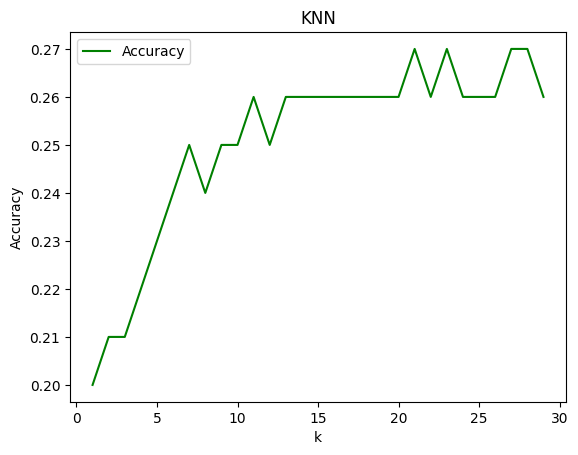

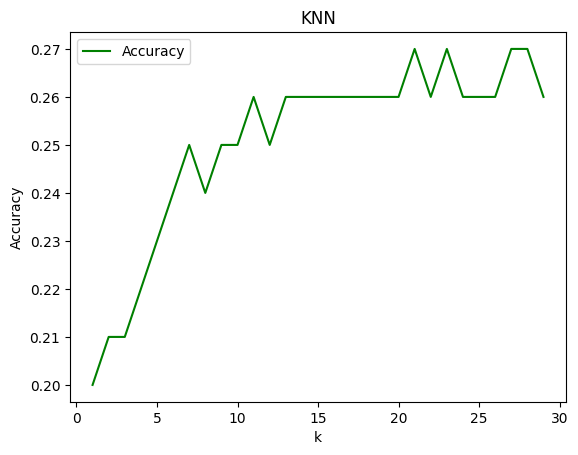

In [ ]:
Plotting(resualts)

k = 19

In [ ]:
resualts = []
for i in range(1,30):
  resualts.append((Run3(KNN,X2,y2,n = i),i))

Fold 1

-------------------------------
1.0
Fold 2

-------------------------------
1.0
Fold 3

-------------------------------
1.0
Fold 4

-------------------------------
1.0
Fold 5

-------------------------------
1.0
Fold 6

-------------------------------
1.0
Fold 7

-------------------------------
1.0
Fold 8

-------------------------------
1.0
Fold 9

-------------------------------
1.0
Fold 10

-------------------------------
1.0
Fold 1

-------------------------------
0.9555926736551088
Fold 2

-------------------------------
0.9554774795530468
Fold 3

-------------------------------
0.9551920751022289
Fold 4

-------------------------------
0.9564591372458676
Fold 5

-------------------------------
0.9562863560444623
Fold 6

-------------------------------
0.9555376375050395
Fold 7

-------------------------------
0.9564591372458676
Fold 8

-------------------------------
0.9560559811092553
Fold 9

-------------------------------
0.9563439497782641
Fold 10

-------------------

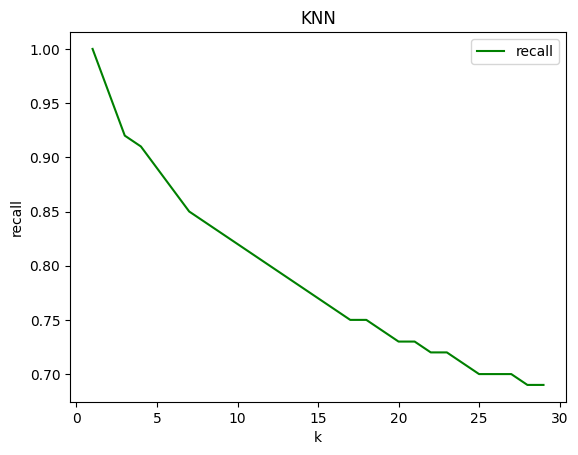

In [ ]:
Plotting2(resualts)

In [ ]:
resualts = []
for i in range(1,30):
  resualts.append((Run4(KNN,X2,y2,n = i),i))

Fold 1

-------------------------------
1.0
Fold 2

-------------------------------
1.0
Fold 3

-------------------------------
1.0
Fold 4

-------------------------------
1.0
Fold 5

-------------------------------
1.0
Fold 6

-------------------------------
1.0
Fold 7

-------------------------------
1.0
Fold 8

-------------------------------
1.0
Fold 9

-------------------------------
1.0
Fold 10

-------------------------------
1.0
Fold 1

-------------------------------
0.9551271518590103
Fold 2

-------------------------------
0.9561881271343785
Fold 3

-------------------------------
0.9562684454924701
Fold 4

-------------------------------
0.9546387376498363
Fold 5

-------------------------------
0.956058159202141
Fold 6

-------------------------------
0.954442939770321
Fold 7

-------------------------------
0.9566449734633804
Fold 8

-------------------------------
0.9561744623106594
Fold 9

-------------------------------
0.9550670130027592
Fold 10

---------------------

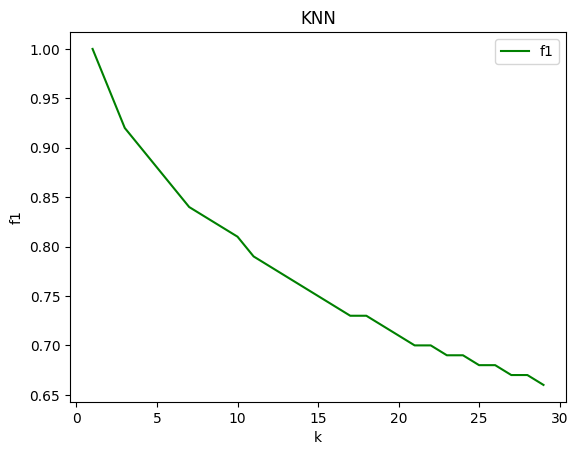

In [ ]:
Plotting3(resualts)